In [15]:
import numpy as np
import pandas as pd
from pandas import DataFrame
import sqlite3
import matplotlib.pyplot as plt
import ast
import math
import time
from datetime import datetime
import glob
import sys
import copy
import cv2
from imp import reload

In [135]:
readin_id2 =pd.DataFrame()
dbs =['_3choice_feb.db','_3choice_feb2.db']
for n in range(len(dbs)):
    print(dbs[n])

    conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustProjects"+dbs[n])
    query2 = "SELECT  post0,exp,replicate, nStimuli  FROM projects;" #
    readin_angle = pd.read_sql_query(query2,conn)


    readin_angle['index'] = list(range(len(readin_angle.index)))

    tab2=pd.DataFrame()
    #readin_angle.head(10)

    #['position','angle','distance']

    dist_read = False
    print('readin_anglekeys',readin_angle.keys())
    #60 degree angle
    angle60=(math.pi/180*60)
    angle30=(math.pi/180*30)
    angle45=(math.pi/180*45)
    angle180=(math.pi)
    angle120=(math.pi/180*120)

    a=True
    #p= pd.DataFrame(readin_angle,l)#.T.to_dict()
    for i in range(0,750):

        #(readin_angle[readin_angle['index'] == i])
        #250 diff conditions from which to pick available



        if (ast.literal_eval(readin_angle.loc[i].values[0])) != None:
            ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

            if dist_read == False:
                dist = (ast.literal_eval(readin_angle.loc[i].values[0])['distance'])
                dist_read = True
            if readin_angle['exp'][i] <10: 
                #only experiments <10 are the exp with two post condition, >10 are 3 post cond
                #print(readin_angle['exp'][i])
                #if 
                if ang == angle45 and readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                    angle_used = ang
                        #selects for 60° cond and without nstim==0 or ==4 (controls with one post cond)
                        #print(i,ang)
                        #readin_angle[i]
                        #del tab
                        #print(readin_angle[readin_angle['index'] == i])
                        #Liste2=Liste2.append(readin_angle[readin_angle['index'] == i])
                    #print(ast.literal_eval(readin_angle.loc[i].values[0])['position'])
                    tab=(readin_angle[readin_angle['index'] == i])
                    tab2=tab2.append(tab,ignore_index=True)
                    if readin_angle['nStimuli'][i]  <4 and readin_angle['nStimuli'][i] >0:
                        #print(readin_angle['nStimuli'][i])
                        pass
                

    #readin_angle
    #ang

    #print(tab2.count())
    #print('tab2keys',tab2.keys())
    #print(dist)
    #print(ang, angle_used)
    #tab2
    
    
    #######################EXPERIMENT ID READIN

    conn = sqlite3.connect("/home/bianca/Documents/github/locustVR/databases/locustExperiments"+dbs[n])

    query = "SELECT exp, replicate, date,tStart, expId FROM experiments;"
    readin_id = pd.read_sql_query(query,conn)
    print(readin_id.keys())
    readin_id=readin_id.assign(nStimuli = 5)
    #posi=(ast.literal_eval(readin_angle.loc[0].values[0])['position'])
    #posi=0
    readin_id=readin_id.assign(position_post0_x = 1.0)
    readin_id=readin_id.assign(position_post0_y = 1.0)

    #ang=(ast.literal_eval(readin_angle.loc[i].values[0])['angle'])

    for i in range(0,len(readin_id.index)):
        #iterate through 40 rows of readin_id

        #kombi exp+ replicate in tab2 abgleichen und nStimuli rausschreiben!)
        b=readin_id['exp'][i]
        c=readin_id['replicate'][i]
        e=readin_id['date'][i]
        #tstart=readin_id['tStart'][i]

        for d in range(len(tab2)):
            #iterate through 50 rows of tab2
            if tab2['exp'][d]==b and tab2['replicate'][d]==c:
                #print(tab2['exp'][d], tab2['replicate'][d], tab2['nStimuli'][d]  )

                #print(tab2['nStimuli'][d])
                f=tab2['nStimuli'][d]
                #g=tab2['post0']
                g=(ast.literal_eval(tab2.loc[d].values[0])['position'])
                h=round(g[0], 2)
                k=round(g[1], 2)
                #print(g.keys())
                #print(h,k)
                readin_id['nStimuli'][i]=f

                readin_id['position_post0_x'][i]=h
                readin_id['position_post0_y'][i]=k

    readin_id.reset_index(drop=True, inplace=True) 
    #exper_date='2019-12-12'
    

    
    readin_id2= readin_id2.append(readin_id, ignore_index=True)
    print(readin_id)

    #40 expIDs available


_3choice_feb.db
('readin_anglekeys', Index([u'post0', u'exp', u'replicate', u'nStimuli', u'index'], dtype='object'))
Index([u'exp', u'replicate', u'date', u'tStart', u'expId'], dtype='object')


/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:109: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:111: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/home/bianca/.local/lib/python2.7/site-packages/ipykernel_launcher.py:112: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


    exp  replicate        date tStart                                 expId  \
0     0         10  2020-02-03  10:58  8406c44e-7acd-428c-8d56-0493c6073c53   
1     0         10  2020-02-03  13:45  d48abf4a-7115-454d-9d54-cda8522dd0fd   
2     0          9  2020-02-03  15:32  a7775da4-f8d0-4bb3-a7d2-d7dade2970ff   
3     1          6  2020-02-03  15:37  19d22288-e3aa-4437-a9dd-01c7a53285ce   
4     1         12  2020-02-04  10:03  3494a922-f9e9-4ce2-b406-414f9d859c52   
5     1          0  2020-02-04  10:57  5222ebcf-a461-4eba-b28f-1da0b1c9d4b9   
6     2         13  2020-02-04  11:55  778e20f8-9dcb-43ed-9efd-65e71bb8e397   
7     2          1  2020-02-04  13:28  b0bdcc58-d51b-471b-9c8f-7b16ba0e8f30   
8     2         10  2020-02-04  14:24  1b3190f8-729d-40d7-92e5-f29a93c894ba   
9     3          3  2020-02-04  15:15  e675c246-4345-4c78-82db-c4a4de84709b   
10    3         13  2020-02-04  16:05  7d9d09f1-373c-4a98-9426-8b9745f02d4a   
11    3          2  2020-02-04  17:00  b10ac082-f23c

In [136]:
readin_id2

,exp,replicate,date,tStart,expId,nStimuli,position_post0_x,position_post0_y
0,0,10,2020-02-03,10:58,8406c44e-7acd-428c-8d56-0493c6073c53,3,0.00,2.00
1,0,10,2020-02-03,13:45,d48abf4a-7115-454d-9d54-cda8522dd0fd,3,0.00,2.00
2,0,9,2020-02-03,15:32,a7775da4-f8d0-4bb3-a7d2-d7dade2970ff,3,0.00,2.00
3,1,6,2020-02-03,15:37,19d22288-e3aa-4437-a9dd-01c7a53285ce,3,1.41,1.41
4,1,12,2020-02-04,10:03,3494a922-f9e9-4ce2-b406-414f9d859c52,1,1.41,1.41
5,1,0,2020-02-04,10:57,5222ebcf-a461-4eba-b28f-1da0b1c9d4b9,1,1.41,1.41
6,2,13,2020-02-04,11:55,778e20f8-9dcb-43ed-9efd-65e71bb8e397,2,1.41,1.41
7,2,1,2020-02-04,13:28,b0bdcc58-d51b-471b-9c8f-7b16ba0e8f30,2,1.41,1.41
8,2,10,2020-02-04,14:24,1b3190f8-729d-40d7-92e5-f29a93c894ba,2,1.41,1.41
9,3,3,2020-02-04,15:15,e675c246-4345-4c78-82db-c4a4de84709b,1,1.41,1.41


# csv

In [137]:
directory = '/home/bianca/Documents/github/locustVR/databases/data_collection/'
filename = '/results.csv'
counting=0
initialise = False
#for i in readin_id2.index:
for i in range (0,(len(readin_id2))):
#for i in range(0,1):
    #iterate through 20 leftover exp ids in readin_id2 that have 2 post cond, no control, only 60°
    path = (directory + readin_id2['expId'][i] + filename)
    tstart = readin_id2['tStart'][i]
    exper_date = readin_id2['date'][i]
    print('tstart',tstart)  


    print(path)
    
     
    try:
        df = pd.read_csv(path)
        print(path)
    except:
        print('***************************csv in row %d doesnt exist**********************' %(i))
    
    #extends list to experimentID column
    df=df.assign(pos0x = (readin_id2['position_post0_x'][i]))
    df=df.assign(pos0y = (readin_id2['position_post0_y'][i]))
    #print(readin_id2['expId'][i])
    df.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
    stim = readin_id2['nStimuli'][i]
    #print stim
    #for j in range(0,len(df)):
    #    if df['nStimuli'][j]== stim:
    
    #select those with stimuli according to readin_in info those with the specific angle
    df=(df.loc[df['nStimuli'] == stim])  
    print(i)
    if initialise == False:
        df3=df
        df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']
        initialise = True

    
    if i > 0:
        df3=df3.append(df, ignore_index=True)
        counting+=1
    print(counting, df.count)
    

    '''df3=df
    df3=df3.append(df, ignore_index=True)
    
    df3.columns = ['x', 'y', 'z',  'cntr', 't', 'nStimuli', 'pos0x', 'pos0y']'''

    
print('tstart', tstart)
df3 = df3.reset_index()
df3

('tstart', u'10:58')
/home/bianca/Documents/github/locustVR/databases/data_collection/8406c44e-7acd-428c-8d56-0493c6073c53/results.csv
/home/bianca/Documents/github/locustVR/databases/data_collection/8406c44e-7acd-428c-8d56-0493c6073c53/results.csv
0
(0, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
46970 -0.000191  0.000320  0.0     0  1950.040060         3    0.0    2.0
46971 -0.000511  0.000910  0.0     0  1950.077682         3    0.0    2.0
46972 -0.000743  0.001433  0.0     0  1950.120056         3    0.0    2.0
46973 -0.000915  0.001921  0.0     0  1950.161090         3    0.0    2.0
46974 -0.001065  0.002406  0.0     0  1950.196470         3    0.0    2.0
46975 -0.001155  0.002751  0.0     0  1950.232743         3    0.0    2.0
46976 -0.001227  0.003178  0.0     0  1950.269473         3    0.0    2.0
46977 -0.001247  0.003528  0.0     0  1950.310160         3    0.0    2.0
46978 -0.001200  0.003788  0.0     0  1950.349

/home/bianca/Documents/github/locustVR/databases/data_collection/3494a922-f9e9-4ce2-b406-414f9d859c52/results.csv
4
(4, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
9997  -0.000045  0.000354  0.0     0   390.039167         1   1.41   1.41
9998  -0.000084  0.000822  0.0     0   390.076228         1   1.41   1.41
9999  -0.000102  0.001140  0.0     0   390.112919         1   1.41   1.41
10000 -0.000116  0.001544  0.0     0   390.149084         1   1.41   1.41
10001 -0.000108  0.001890  0.0     0   390.188473         1   1.41   1.41
10002 -0.000066  0.002174  0.0     0   390.231250         1   1.41   1.41
10003 -0.000010  0.002419  0.0     0   390.272818         1   1.41   1.41
10004  0.000019  0.002655  0.0     0   390.317612         1   1.41   1.41
10005  0.000029  0.003043  0.0     0   390.368372         1   1.41   1.41
10006 -0.000068  0.003464  0.0     0   390.417262         1   1.41   1.41
10007 -0.000254  0.003684  0.0   

(7, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
27697 -0.000014 -0.000290  0.0     0  1110.036892         2   1.41   1.41
27698 -0.000024 -0.000559  0.0     0  1110.072605         2   1.41   1.41
27699 -0.000033 -0.000882  0.0     0  1110.108212         2   1.41   1.41
27700 -0.000029 -0.001147  0.0     0  1110.145829         2   1.41   1.41
27701 -0.000007 -0.001346  0.0     0  1110.193306         2   1.41   1.41
27702  0.000035 -0.001522  0.0     0  1110.237117         2   1.41   1.41
27703  0.000111 -0.001631  0.0     0  1110.294332         2   1.41   1.41
27704  0.000179 -0.001753  0.0     0  1110.343647         2   1.41   1.41
27705  0.000181 -0.001921  0.0     0  1110.382223         2   1.41   1.41
27706  0.000176 -0.002091  0.0     0  1110.425287         2   1.41   1.41
27707  0.000210 -0.002234  0.0     0  1110.462850         2   1.41   1.41
27708  0.000258 -0.002347  0.0     0  1110.498003         2   1.41   1.41
2

/home/bianca/Documents/github/locustVR/databases/data_collection/b10ac082-f23c-41d9-943d-6ab3af43dff6/results.csv
11
(11, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
45851  0.000000  0.000000  0.0     0  1830.016701         3   1.41   1.41
45852  0.000759 -0.000352  0.0     0  1830.053635         3   1.41   1.41
45853  0.001508 -0.000679  0.0     0  1830.092833         3   1.41   1.41
45854  0.002272 -0.001002  0.0     0  1830.131930         3   1.41   1.41
45855  0.002871 -0.001243  0.0     0  1830.168289         3   1.41   1.41
45856  0.003687 -0.001530  0.0     0  1830.204112         3   1.41   1.41
45857  0.004301 -0.001727  0.0     0  1830.239362         3   1.41   1.41
45858  0.005533 -0.002109  0.0     0  1830.294068         3   1.41   1.41
45859  0.006154 -0.002280  0.0     0  1830.330201         3   1.41   1.41
45860  0.006956 -0.002500  0.0     0  1830.368369         3   1.41   1.41
45861  0.007864 -0.002817  0.0 

(14, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
27238 -0.000052 -0.000160  0.0     0  1110.024253         2   1.41   1.41
27239 -0.000180 -0.000463  0.0     0  1110.063120         2   1.41   1.41
27240 -0.000290 -0.000678  0.0     0  1110.101181         2   1.41   1.41
27241 -0.000436 -0.000941  0.0     0  1110.139578         2   1.41   1.41
27242 -0.000559 -0.001195  0.0     0  1110.175951         2   1.41   1.41
27243 -0.000662 -0.001449  0.0     0  1110.215870         2   1.41   1.41
27244 -0.000725 -0.001604  0.0     0  1110.254965         2   1.41   1.41
27245 -0.000833 -0.001796  0.0     0  1110.310851         2   1.41   1.41
27246 -0.000878 -0.001846  0.0     0  1110.349170         2   1.41   1.41
27247 -0.000898 -0.001865  0.0     0  1110.386457         2   1.41   1.41
27248 -0.000925 -0.001885  0.0     0  1110.424390         2   1.41   1.41
27249 -0.000974 -0.001936  0.0     0  1110.463469         2   1.41   1.41


/home/bianca/Documents/github/locustVR/databases/data_collection/346fe953-4e0a-4b4d-8d2f-5280fd88eb3b/results.csv
18
(18, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
42834  0.000038 -0.000008  0.0     0  1830.025136         3  -1.41  -1.41
42835  0.000133 -0.000061  0.0     0  1830.090792         3  -1.41  -1.41
42836  0.000184 -0.000134  0.0     0  1830.131681         3  -1.41  -1.41
42837  0.000212 -0.000244  0.0     0  1830.172870         3  -1.41  -1.41
42838  0.000230 -0.000354  0.0     0  1830.211251         3  -1.41  -1.41
42839  0.000243 -0.000493  0.0     0  1830.253009         3  -1.41  -1.41
42840  0.000253 -0.000651  0.0     0  1830.291818         3  -1.41  -1.41
42841  0.000260 -0.000800  0.0     0  1830.339237         3  -1.41  -1.41
42842  0.000321 -0.000959  0.0     0  1830.394634         3  -1.41  -1.41
42843  0.000399 -0.001011  0.0     0  1830.431674         3  -1.41  -1.41
42844  0.000530 -0.001145  0.0 

(21, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
26162 -0.039458 -0.017489  0.0     1  1110.000197         2  -1.41  -1.41
26163 -0.040689 -0.018073  0.0     1  1113.050776         2  -1.41  -1.41
26164 -0.042307 -0.018814  0.0     1  1113.090017         2  -1.41  -1.41
26165 -0.043962 -0.019550  0.0     1  1113.130432         2  -1.41  -1.41
26166 -0.045653 -0.020350  0.0     1  1113.170669         2  -1.41  -1.41
26167 -0.046900 -0.020970  0.0     1  1113.207281         2  -1.41  -1.41
26168 -0.048460 -0.021753  0.0     1  1113.250734         2  -1.41  -1.41
26169 -0.049868 -0.022416  0.0     1  1113.289719         2  -1.41  -1.41
26170 -0.051162 -0.022983  0.0     1  1113.324393         2  -1.41  -1.41
26171 -0.052393 -0.023473  0.0     1  1113.367931         2  -1.41  -1.41
26172 -0.053256 -0.023783  0.0     1  1113.403252         2  -1.41  -1.41
26173 -0.054368 -0.024153  0.0     1  1113.441514         2  -1.41  -1.41


(24, <bound method DataFrame.count of               x         y    z  cntr            t  nStimuli  pos0x  pos0y
9851   0.000000  0.000000  0.0     0   390.010720         1   1.41   1.41
9852  -0.000054  0.000087  0.0     0   390.054670         1   1.41   1.41
9853  -0.000111  0.000195  0.0     0   390.098277         1   1.41   1.41
9854  -0.000171  0.000297  0.0     0   390.139116         1   1.41   1.41
9855  -0.000147  0.000279  0.0     0   390.184890         1   1.41   1.41
9856  -0.000041  0.000096  0.0     0   390.226630         1   1.41   1.41
9857   0.000108 -0.000199  0.0     0   390.266457         1   1.41   1.41
9858   0.000298 -0.000590  0.0     0   390.304699         1   1.41   1.41
9859   0.000500 -0.001032  0.0     0   390.346135         1   1.41   1.41
9860   0.000668 -0.001366  0.0     0   390.381315         1   1.41   1.41
9861   0.000867 -0.001785  0.0     0   390.416210         1   1.41   1.41
9862   0.001005 -0.002079  0.0     0   390.450442         1   1.41   1.41


(27, <bound method DataFrame.count of               x             y    z  cntr            t  nStimuli  pos0x  pos0y
27814 -0.042782  8.976607e-02  0.0     0  1110.006585         2  -1.41  -1.41
27815  0.000005  9.000000e-08  0.0     0  1110.048304         2  -1.41  -1.41
27816  0.000007  1.800000e-07  0.0     0  1110.090099         2  -1.41  -1.41
27817  0.000008  2.500000e-07  0.0     0  1110.126710         2  -1.41  -1.41
27818 -0.000006  3.300000e-07  0.0     0  1110.162475         2  -1.41  -1.41
27819 -0.000020  4.100000e-07  0.0     0  1110.202962         2  -1.41  -1.41
27820 -0.000027  4.700000e-07  0.0     0  1110.240041         2  -1.41  -1.41
27821 -0.000033  5.500000e-07  0.0     0  1110.278828         2  -1.41  -1.41
27822 -0.000034  6.200000e-07  0.0     0  1110.315786         2  -1.41  -1.41
27823 -0.000018  6.900000e-07  0.0     0  1110.362387         2  -1.41  -1.41
27824 -0.000007  7.800000e-07  0.0     0  1110.405886         2  -1.41  -1.41
27825  0.000002  8.400000e

30
(30, <bound method DataFrame.count of Empty DataFrame
Columns: [x, y, z, cntr, t, nStimuli, pos0x, pos0y]
Index: []>)
('tstart', u'14:16')


,index,x,y,z,cntr,t,nStimuli,pos0x,pos0y
0,0,-0.000191,0.000320,0.0,0,1950.040060,3,0.00,2.00
1,1,-0.000511,0.000910,0.0,0,1950.077682,3,0.00,2.00
2,2,-0.000743,0.001433,0.0,0,1950.120056,3,0.00,2.00
3,3,-0.000915,0.001921,0.0,0,1950.161090,3,0.00,2.00
4,4,-0.001065,0.002406,0.0,0,1950.196470,3,0.00,2.00
5,5,-0.001155,0.002751,0.0,0,1950.232743,3,0.00,2.00
6,6,-0.001227,0.003178,0.0,0,1950.269473,3,0.00,2.00
7,7,-0.001247,0.003528,0.0,0,1950.310160,3,0.00,2.00
8,8,-0.001200,0.003788,0.0,0,1950.349533,3,0.00,2.00
9,9,-0.001120,0.003955,0.0,0,1950.390161,3,0.00,2.00



# rotate all x and y values at certain ang from experiments

In [138]:
print(angle_used*180/math.pi)


45.0


In [139]:
rotaa= np.zeros([len(df3),2])
t0 = time.time()

#8 angles in matrices depending on starting position of post0

#change habp= half the angle between posts angle accord. to current investigation!!!:
#here for 60° angle half is 30° so pi/6
#habp = (math.pi)/6   #60
#habp = (math.pi)/12
habp = angle_used

#rotation angles; referring to post position:
# post1 immer ccc zu post0. also in kreisrichtung (pihalbe, pi..) drehrichtung ist hier richtig!!!
ang5_0 = 2  *math.pi - habp
ang33  = 1.75*math.pi - habp

ang0_5 = 1.5*math.pi - habp
angm33 = 1.25*math.pi - habp

angm5_0 = 1*math.pi   - habp
angm3m3 = 0.75*math.pi - habp

ang0_m5 = 0.5*math.pi - habp
ang3m3 = 0.25*math.pi - habp

def rotation(x,y, theta):
    #theta = 0
    c, s = np.cos(theta), np.sin(theta)
    R = np.array(((c,-s), (s, c)))
    a,b=np.dot(R,[x,y])
    return a,b

rot=[]
dist_45 = round(((dist**2)/2)**0.5 , 2)   #square_root_2a_sq, distance at on x or y axis at 45 degree 


for l in range(len(df3)): #(): len(df3) 0,40000
    print(df3['x'][l])
    x=df3['x'][l]
    y=df3['y'][l]
    #t=df3['t'][l]
    #print(x,y)
    
    if df3['pos0x'][l]== dist and df3['pos0y'][l]== 0.00:
        theta = ang5_0
        
    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== dist_45:
        theta = ang33
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== dist:
        theta = ang0_5
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== dist_45:
        theta = angm33
        
    if df3['pos0x'][l]== -dist and df3['pos0y'][l]== 0.00:
        theta = angm5_0
        
    if df3['pos0x'][l]== -dist_45 and df3['pos0y'][l]== -dist_45:
        theta = angm3m3
        
    if df3['pos0x'][l]== 0.00 and df3['pos0y'][l]== -dist:
        theta = ang0_m5
        

    if df3['pos0x'][l]== dist_45 and df3['pos0y'][l]== -dist_45:
        theta = ang3m3
    coord =     rotation(x,y,theta)
    #coord.extend= rotation(x,y,theta)
    rotaa[l][0]=coord[0]
    rotaa[l][1]=coord[1]   
    
    #print(rotation(x,y,theta))
    #rot.extend([(rotation(x,y,theta))])
    #list rot contains all rotated values at 60° from all experiments!
    #x_rot,y_rot=    rotation(x,y,theta)  
#print('length df3',len(df3))
#print('length of rot',len(rot))
#rot[zeile][spalte]
df3=df3.assign(x_rot = (rotaa[: ,0]))   
df3=df3.assign(y_rot = (rotaa[: ,1]))  
print(df3)

-0.00019149
-0.00051059
-0.00074334
-0.00091544
-0.00106498
-0.00115481
-0.00122747
-0.00124702
-0.00119987
-0.00111988
-0.00103954
-0.00110745
-0.00129375
-0.00157979
-0.00193468
-0.00223218
-0.00268863
-0.00326395
-0.00358395
-0.00397813
-0.00441847
-0.00508603
-0.00568216
-0.00627043
-0.0069949
-0.00752377
-0.00817675
-0.00868922
-0.00931132
-0.00998764
-0.01066442
-0.01116974
-0.01151727
-0.01194104
-0.0123784
-0.01288141
-0.01342429
-0.01406392
-0.01473788
-0.01510015
-0.01547194
-0.01601801
-0.01673235
-0.01745852
-0.01794245
-0.01850814
-0.01901752
-0.01935165
-0.01970632
-0.02005215
-0.02048396
-0.02084031
-0.02133746
-0.02195113
-0.02273519
-0.02343302
-0.02423694
-0.02509141
-0.02599383
-0.0266778
-0.02738924
-0.02791094
-0.0283154
-0.02845671
-0.02848153
-0.02841407
-0.02838128
-0.02843759
-0.02860652
-0.02886059
-0.0291717
-0.02962967
-0.03007924
-0.03074881
-0.03178306
-0.03285534
-0.03347847
-0.0339498
-0.03433637
-0.03464388
-0.0348915
-0.03501425
-0.03513109
-0.03515626

-0.17800987
-0.17825685
-0.17846717
-0.17860304
-0.17871307
-0.17884847
-0.17904391
-0.17920208
-0.17937143
-0.1795359
-0.17965184
-0.17968539
-0.17965322
-0.17960878
-0.17951495
-0.17941619
-0.17933226
-0.17927745
-0.17922753
-0.17920173
-0.17926708
-0.17945931
-0.17963762
-0.17980547
-0.1800577
-0.18024626
-0.18051934
-0.18084987
-0.18120876
-0.1815307
-0.18173721
-0.18196356
-0.18217959
-0.18231261
-0.18250909
-0.18269057
-0.1829189
-0.18315956
-0.18331288
-0.18348348
-0.18369861
-0.18389255
-0.18408747
-0.18426348
-0.18439586
-0.18447389
-0.18454453
-0.18465435
-0.18475636
-0.18484834
-0.18497978
-0.18502704
-0.18509621
-0.18522645
-0.18538841
-0.18556406
-0.18572307
-0.18582207
-0.18593444
-0.1860638
-0.18624397
-0.1864517
-0.18667739
-0.18685185
-0.1869984
-0.18713736
-0.18730014
-0.18748053
-0.18772146
-0.18791113
-0.18804581
-0.18812229
-0.18823832
-0.18841625
-0.18862588
-0.18879049
-0.18902326
-0.1891999
-0.18945771
-0.18971802
-0.18992899
-0.19017833
-0.19038668
-0.19056917


-0.06823638
-0.06849705
-0.06878815
-0.06896645
-0.0691848
-0.06937696
-0.06967237
-0.06991582
-0.07022977
-0.07053229
-0.07079703
-0.07097493
-0.07119399
-0.07136811
-0.07171433
-0.07212897
-0.07248012
-0.07271156
-0.0729824
-0.07326378
-0.07364006
-0.0740877
-0.07454284
-0.07491753
-0.07523444
-0.07557354
-0.07587616
-0.07621783
-0.07652746
-0.07681014
-0.07699237
-0.07711799
-0.07729893
-0.07757027
-0.07782394
-0.07815893
-0.07838982
-0.0786713
-0.07892301
-0.07918185
-0.07948759
-0.07966708
-0.07990855
-0.08011696
-0.08024186
-0.08038038
-0.08046813
-0.08050786
-0.08054201
-0.08062911
-0.08072982
-0.08089164
-0.08099652
-0.08111791
-0.08124037
-0.08136066
-0.08150242
-0.08175259
-0.08203542
-0.08233436
-0.08261603
-0.08280873
-0.0831338
-0.08353783
-0.08399742
-0.08441904
-0.08487845
-0.08519021
-0.08544764
-0.08581446
-0.08607664
-0.08636638
-0.08658202
-0.08677778
-0.08698952
-0.08724364
-0.08744728
-0.08770379
-0.08789272
-0.08806805
-0.08827297
-0.08846233
-0.0890261
-0.0893432

-0.22467593
-0.22458069
-0.2245377
-0.22454973
-0.22459405
-0.22463182
-0.22464833
-0.22465852
-0.22466444
-0.22468921
-0.22466502
-0.2246558
-0.22466522
-0.22469412
-0.22470905
-0.2246988
-0.22465776
-0.22456423
-0.22448154
-0.22434707
-0.22419053
-0.22402063
-0.22384213
-0.22365824
-0.2234707
-0.22332897
-0.22313876
-0.22294814
-0.22268354
-0.22256902
-0.22245586
-0.22231563
-0.22214023
-0.22197315
-0.2218864
-0.22181117
-0.22176221
-0.22171846
-0.22161942
-0.22148395
-0.22141669
-0.22141038
-0.22142581
-0.22143759
-0.22146713
-0.22152825
-0.22164169
-0.22181275
-0.22202932
-0.22226999
-0.222499
-0.22274981
-0.22295529
-0.22323236
-0.22354521
-0.2237689
-0.22390873
-0.22410268
-0.2242646
-0.22441138
-0.22458918
-0.22472359
-0.22480245
-0.224873
-0.224908
-0.22498033
-0.2250903
-0.22520253
-0.2253912
-0.22555685
-0.22571895
-0.22583729
-0.22600072
-0.22617463
-0.22632028
-0.22647462
-0.22671627
-0.22689748
-0.22711631
-0.22733028
-0.22739315
-0.22740424
-0.22738062
-0.22734448
-0.2272

-1.00359419
-1.00460875
-1.00542816
-1.0059234
-1.00642356
-1.00687601
-1.00705685
-1.00714521
-1.00715633
-1.00712576
-1.00706236
-1.00706728
-1.00710768
-1.00730644
-1.00744737
-1.0077598
-1.00818363
-1.00878697
-1.00956604
-1.01048299
-1.01186006
-1.01309499
-1.01434855
-1.01538701
-1.01678358
-1.01818978
-1.01938761
-1.02085518
-1.02194718
-1.02340427
-1.02484821
-1.02589588
-1.02725868
-1.02863882
-1.03034019
-1.03171092
-1.0335064
-1.03529283
-1.03641753
-1.03797309
-1.0395068
-1.04066364
-1.0425668
-1.04404266
-1.04552539
-1.04702945
-1.04923465
-1.05030909
-1.05139662
-1.05283561
-1.05423854
-1.05564765
-1.05783136
-1.05887845
-1.06030399
-1.06140595
-1.06286776
-1.06436847
-1.06590586
-1.06702136
-1.06841838
-1.06978346
-1.07112489
-1.07242012
-1.07333262
-1.07457438
-1.07586979
-1.07683944
-1.07810933
-1.07939772
-1.08067256
-1.08159893
-1.08283334
-1.08404079
-1.08527634
-1.08629376
-1.08794189
-1.0895833
-1.09121849
-1.09221809
-1.09374068
-1.09522058
-1.09667899
-1.0988830

-0.35189365
-0.3522903
-0.35277715
-0.3534827
-0.35393768
-0.3545286
-0.35523297
-0.35563445
-0.35631241
-0.35673698
-0.35753322
-0.35825377
-0.35900931
-0.35988867
-0.36038212
-0.36104243
-0.36153982
-0.362226
-0.36296161
-0.36372616
-0.3644618
-0.36517282
-0.36583788
-0.36676833
-0.36746141
-0.36821711
-0.36894438
-0.36961429
-0.3702456
-0.37083204
-0.37139367
-0.37217708
-0.37286825
-0.37357679
-0.37407434
-0.3748391
-0.37543009
-0.37601498
-0.37668305
-0.37738786
-0.37791886
-0.37859177
-0.37907779
-0.37974461
-0.38038439
-0.380921
-0.38156784
-0.38227249
-0.38281522
-0.38351449
-0.38416802
-0.38463694
-0.38544558
-0.38640804
-0.38742655
-0.38802783
-0.38881923
-0.38960127
-0.39035912
-0.39117275
-0.39204101
-0.39270138
-0.39360069
-0.3942659
-0.39515838
-0.39596497
-0.39678963
-0.39770856
-0.39841195
-0.39936082
-0.40003002
-0.40085044
-0.40142216
-0.4021559
-0.40290343
-0.40349441
-0.40431945
-0.40516013
-0.40578131
-0.40658968
-0.40733653
-0.40803691
-0.40854714
-0.40906641
-0.4

-0.90943628
-0.91101325
-0.91292679
-0.91447229
-0.91637827
-0.91786612
-0.91939005
-0.92055138
-0.9221564
-0.92378773
-0.92541063
-0.92703625
-0.92829985
-0.93050484
-0.93184607
-0.933648
-0.93546512
-0.93723414
-0.9385616
-0.94034931
-0.94208409
-0.94381818
-0.94551207
-0.94675201
-0.94836759
-0.94994046
-0.95106476
-0.95253074
-0.95402065
-0.95546857
-0.9569215
-0.95833568
-0.9593669
-0.96076768
-0.96216952
-0.96394894
-0.9650567
-0.96680665
-0.96818689
-0.96959123
-0.97097905
-0.97236844
-0.97385499
-0.97540625
-0.97658838
-0.97780094
-0.97980111
-0.98095732
-0.9823811
-0.98387237
-0.98490789
-0.98622893
-0.9872033
-0.98853907
-0.98990649
-0.99160664
-0.99386506
-0.99576034
-0.99812619
-0.99972918
-1.00137731
-1.00272407
-1.00439393
-1.00605631
-1.00770927
-1.00890702
-1.01049344
-1.01203281
-1.0135312
-1.01496292
-1.01597459
-1.01729811
-1.01824037
-1.01945959
-1.02070599
-1.02166715
-1.02296979
-1.02397936
-1.02539152
-1.02683044
-1.02822697
-1.03036933
-1.03178259
-1.03346274
-1

-1.66393666
-1.66469931
-1.66528075
-1.6659041
-1.66654042
-1.66719008
-1.66782783
-1.66892637
-1.67007299
-1.67099722
-1.67195738
-1.67287952
-1.67356251
-1.67427749
-1.67520057
-1.67591552
-1.676628
-1.67732284
-1.67796231
-1.67863254
-1.67937096
-1.68013258
-1.68102394
-1.68188596
-1.68251754
-1.68317064
-1.68388667
-1.68479774
-1.68554437
-1.68647558
-1.68715153
-1.6877683
-1.68841686
-1.68909822
-1.68979962
-1.69065961
-1.69169084
-1.69233536
-1.69310575
-1.69375823
-1.69477002
-1.69542252
-1.69606324
-1.69667849
-1.69724075
-1.6979734
-1.69859358
-1.69905178
-1.69968151
-1.70055935
-1.70125334
-1.70194736
-1.70268562
-1.70347883
-1.70429135
-1.7053514
-1.70622741
-1.70706354
-1.70784057
-1.70861675
-1.70983907
-1.71065938
-1.71145876
-1.71260069
-1.71355622
-1.71432415
-1.71510951
-1.71585804
-1.7166389
-1.71738963
-1.71814215
-1.71908833
-1.71985177
-1.72058885
-1.7215382
-1.72228072
-1.72301391
-1.72402572
-1.72509954
-1.72597093
-1.72683111
-1.72763034
-1.72884564
-1.7297333
-

-0.14737889
-0.14805505
-0.14859056
-0.14923563
-0.14987252
-0.15033333
-0.15085038
-0.15126553
-0.15176349
-0.15287457
-0.15361286
-0.15417016
-0.15477734
-0.15526033
-0.15590077
-0.15643229
-0.15693664
-0.15757847
-0.15813086
-0.15863553
-0.15904839
-0.15961013
-0.16016476
-0.1607872
-0.16121882
-0.161664
-0.16197436
-0.16246485
-0.16284169
-0.16323956
-0.16364382
-0.16405477
-0.1645552
-0.16495083
-0.16526437
-0.16581944
-0.16629093
-0.16678872
-0.16741395
-0.16788209
-0.16839428
-0.16906257
-0.16962604
-0.17030593
-0.17094999
-0.17140011
-0.17176735
-0.17215878
-0.17250753
-0.17272643
-0.17295078
-0.17322096
-0.17345322
-0.17368
-0.17398424
-0.17419911
-0.17434373
-0.174631
-0.1749915
-0.17548447
-0.17594926
-0.17662619
-0.17738614
-0.17797649
-0.17871092
-0.17939991
-0.18011546
-0.18084232
-0.18177487
-0.18262743
-0.18369058
-0.18455982
-0.18564638
-0.18647129
-0.18723202
-0.18793509
-0.1887572
-0.18959368
-0.19031158
-0.1914109
-0.19211611
-0.19282082
-0.1936593
-0.19438225
-0.19

-1.03986182
-1.0398275
-1.03979265
-1.03975471
-1.03971674
-1.03965898
-1.03963123
-1.03961045
-1.03960052
-1.0395943
-1.03959039
-1.03958796
-1.03959649
-1.03962973
-1.03967727
-1.03973093
-1.03978273
-1.03984702
-1.03988664
-1.03991151
-1.03992736
-1.0399373
-1.03994325
-1.03996035
-1.04000798
-1.04006349
-1.04015639
-1.04023995
-1.04032739
-1.04039391
-1.04041475
-1.0404183
-1.04042253
-1.04043891
-1.04043354
-1.04042004
-1.04038267
-1.04033118
-1.04029526
-1.04026517
-1.04022033
-1.04017462
-1.04014527
-1.04012655
-1.0401148
-1.04010723
-1.04010234
-1.04010424
-1.04012293
-1.04013275
-1.0401182
-1.0401109
-1.04010261
-1.04006757
-1.03999142
-1.03992829
-1.03986089
-1.03983162
-1.03983722
-1.03985325
-1.03987785
-1.03990267
-1.03992028
-1.03994541
-1.03997465
-1.04001182
-1.04009245
-1.04025033
-1.04045934
-1.04066971
-1.04080719
-1.04099199
-1.0412766
-1.04152795
-1.04178698
-1.04212623
-1.04244137
-1.04288832
-1.04344708
-1.04404149
-1.04463548
-1.04524251
-1.0459054
-1.04667454
-

-0.63123602
-0.63089223
-0.63052167
-0.63024048
-0.62990207
-0.62955523
-0.6291372
-0.62871486
-0.62830254
-0.62801929
-0.62767749
-0.62743147
-0.62706023
-0.62662755
-0.62628271
-0.62579539
-0.62531471
-0.62483253
-0.62416913
-0.62328645
-0.62270277
-0.62227031
-0.62174132
-0.62123398
-0.62071004
-0.62029444
-0.61975811
-0.61924585
-0.61873513
-0.61823128
-0.61789203
-0.61749191
-0.61700333
-0.61660071
-0.61607784
-0.61569147
-0.61521642
-0.61480489
-0.61437577
-0.61402274
-0.61363748
-0.61325604
-0.61286919
-0.61251353
-0.61218927
-0.61185539
-0.61157597
-0.61126825
-0.61083895
-0.61038145
-0.61004321
-0.60958398
-0.60910041
-0.6085587
-0.60799273
-0.60743822
-0.60689684
-0.60654178
-0.60607971
-0.60553894
-0.60521314
-0.60469603
-0.60444365
-0.60416091
-0.60390097
-0.60366581
-0.60339291
-0.6030801
-0.60282246
-0.60247106
-0.60182673
-0.60140325
-0.60105082
-0.60076309
-0.60036902
-0.59997129
-0.59955579
-0.59928866
-0.59897567
-0.59854586
-0.59824292
-0.59793599
-0.59769463
-0.5974

-0.00767818
-0.00773946
-0.00773949
-0.0077283
-0.00777163
-0.00791462
-0.00808666
-0.00824451
-0.00836157
-0.00841762
-0.00845506
-0.00853883
-0.00867972
-0.0088247
-0.00891084
-0.00897032
-0.00899052
-0.00900631
-0.00896779
-0.00890929
-0.00886696
-0.00882457
-0.00881958
-0.00889416
-0.00901433
-0.00911284
-0.00925715
-0.00944539
-0.00974786
-0.01009156
-0.01023771
-0.01038966
-0.01048907
-0.01068018
-0.01107349
-0.01128946
-0.01144874
-0.01158082
-0.01170568
-0.0119448
-0.01214296
-0.01245775
-0.01261561
-0.01280664
-0.0130324
-0.0133126
-0.01364215
-0.01409691
-0.01433589
-0.0145769
-0.01485369
-0.01519712
-0.01544228
-0.0157097
-0.01597041
-0.01615446
-0.01639972
-0.01656704
-0.01673858
-0.01684499
-0.01690531
-0.017041
-0.01722425
-0.01735303
-0.01745961
-0.01751205
-0.01757925
-0.01773609
-0.01789001
-0.01808893
-0.01822509
-0.01836356
-0.01848289
-0.01855268
-0.01869938
-0.01885767
-0.01895798
-0.01907399
-0.01916838
-0.01928503
-0.01950779
-0.01969306
-0.01988234
-0.02008669
-

-0.20575353
-0.20581764
-0.20592669
-0.20608166
-0.20621131
-0.20635954
-0.20646554
-0.20652635
-0.20670154
-0.20689796
-0.20703305
-0.20718235
-0.2072987
-0.20743426
-0.20756539
-0.2077933
-0.20803365
-0.20825503
-0.20848924
-0.20863703
-0.20880996
-0.20900907
-0.20913973
-0.20926525
-0.20932411
-0.20929194
-0.20924096
-0.2092108
-0.2092255
-0.20932294
-0.20944706
-0.20947399
-0.20948874
-0.20956234
-0.20964541
-0.20971882
-0.20975351
-0.20978215
-0.2098059
-0.2098866
-0.20999211
-0.21006006
-0.2100857
-0.21009309
-0.21007531
-0.2100689
-0.21013191
-0.21021403
-0.21026269
-0.21027184
-0.21027477
-0.21026426
-0.21029215
-0.21035165
-0.21037786
-0.21036691
-0.2103385
-0.21036305
-0.21047602
-0.2106242
-0.2107664
-0.21086066
-0.21089298
-0.21092534
-0.21100905
-0.21113588
-0.21122089
-0.21129593
-0.21132764
-0.21133797
-0.21137998
-0.21150493
-0.2117033
-0.21188738
-0.21199917
-0.21208125
-0.21211749
-0.21222914
-0.21239664
-0.21263489
-0.21280818
-0.21301593
-0.2132622
-0.21350515
-0.21

-0.18555527
-0.1864632
-0.18712206
-0.18810947
-0.18888427
-0.18992883
-0.19071324
-0.19180465
-0.19289821
-0.19395916
-0.19520229
-0.19675449
-0.19808546
-0.19910459
-0.20010702
-0.201083
-0.20221251
-0.20306063
-0.20397017
-0.20533843
-0.20597222
-0.20673259
-0.20738095
-0.2078007
-0.2083344
-0.20888909
-0.20931086
-0.20986654
-0.21045771
-0.21097704
-0.21175972
-0.2126319
-0.21353021
-0.21445295
-0.21544571
-0.21646592
-0.21746242
-0.21868788
-0.21999519
-0.22133921
-0.22261482
-0.22404307
-0.22521946
-0.22587199
-0.22648641
-0.2272344
-0.22787626
-0.22828705
-0.22883935
-0.22929582
-0.22996078
-0.23066993
-0.23126764
-0.23216575
-0.23318266
-0.23423629
-0.23527496
-0.23626986
-0.23730899
-0.23836984
-0.23942955
-0.24022791
-0.24131741
-0.24247638
-0.24335479
-0.24455028
-0.24549542
-0.24710813
-0.2483682
-0.24961799
-0.25081313
-0.25193937
-0.25274794
-0.25413672
-0.25501478
-0.25617054
-0.2570135
-0.25818077
-0.2593346
-0.26045715
-0.26151558
-0.26258038
-0.26367789
-0.26450894
-0

-1.35485399
-1.35614171
-1.35745388
-1.35842171
-1.35934165
-1.36056202
-1.3621472
-1.36373295
-1.36501105
-1.36632792
-1.36768835
-1.36871415
-1.3700116
-1.37098031
-1.37227348
-1.37322479
-1.37447233
-1.37574566
-1.37668726
-1.37851966
-1.37967926
-1.38144713
-1.38234625
-1.38355049
-1.38450011
-1.38613572
-1.38743857
-1.38944429
-1.39080678
-1.39214215
-1.39350702
-1.3948212
-1.39637979
-1.39761591
-1.39889644
-1.39987079
-1.40153661
-1.40287672
-1.4042068
-1.4051676
-1.40644146
-1.40769724
-1.40897221
-1.41022232
-1.41116199
-1.41241367
-1.41358396
-1.41448342
-1.41572971
-1.4169778
-1.41789321
-1.41882817
-1.42006862
-1.42126036
-1.42238849
-1.42350498
-1.42458452
-1.42543399
-1.4264614
-1.42751084
-1.42827338
-1.42931267
-1.43011717
-1.43118923
-1.43222567
-1.43326639
-1.43425662
-1.43518228
-1.43619858
-1.43749107
-1.43860519
-1.43949159
-1.44105193
-1.44201489
-1.44335875
-1.44473471
-1.44580817
-1.44726207
-1.44878064
-1.44990103
-1.45140413
-1.4525444
-1.45404033
-1.45588849


-0.63182799
-0.63408334
-0.6355248
-0.63699081
-0.63893089
-0.64085865
-0.6428624
-0.64438252
-0.646398
-0.64791902
-0.64984727
-0.65171666
-0.65362239
-0.65552316
-0.65740944
-0.66010157
-0.66178608
-0.66351237
-0.66481346
-0.66646844
-0.6681067
-0.66968723
-0.67118576
-0.67275642
-0.67399044
-0.67565987
-0.67735129
-0.6786401
-0.68083553
-0.68273606
-0.68473213
-0.68625099
-0.68825515
-0.6901913
-0.69209686
-0.69355521
-0.69542226
-0.69713281
-0.69829744
-0.69971933
-0.7007148
-0.70166728
-0.7028783
-0.70412867
-0.70510634
-0.70644814
-0.70815942
-0.70962564
-0.71120568
-0.7129247
-0.71427289
-0.71654762
-0.71840122
-0.71979795
-0.721694
-0.72364249
-0.72559165
-0.72754875
-0.72901607
-0.73090993
-0.73273937
-0.73454785
-0.73633046
-0.73769077
-0.73945464
-0.74123008
-0.74254191
-0.74423349
-0.7459166
-0.74717099
-0.74881096
-0.75044467
-0.75163274
-0.75321073
-0.75442355
-0.7556524
-0.75729276
-0.75857303
-0.76032588
-0.76214785
-0.76355361
-0.76544711
-0.76686014
-0.76879315
-0.770

-0.23913899
-0.24023618
-0.24133235
-0.24216256
-0.24359443
-0.24445565
-0.2455907
-0.24706333
-0.24893845
-0.25054868
-0.25187534
-0.25317663
-0.2541627
-0.25557293
-0.25706107
-0.25816116
-0.25921188
-0.26058704
-0.26193085
-0.26323793
-0.26470932
-0.26616505
-0.26760423
-0.26869868
-0.27015819
-0.27157445
-0.27301147
-0.27414997
-0.27568368
-0.2775941
-0.27910923
-0.28056968
-0.28197533
-0.28347606
-0.28497628
-0.28607578
-0.28749016
-0.28886855
-0.29018427
-0.29110296
-0.29215573
-0.29303334
-0.29369297
-0.29411679
-0.29457224
-0.29494436
-0.29529815
-0.29573673
-0.29614044
-0.29679067
-0.29760147
-0.29855518
-0.29931286
-0.30042763
-0.3016317
-0.30257456
-0.30385586
-0.30480895
-0.30632498
-0.30748479
-0.3092392
-0.31011243
-0.31122862
-0.31230766
-0.31307395
-0.31404466
-0.31506753
-0.31587524
-0.31694891
-0.31774963
-0.3191174
-0.32019123
-0.32096131
-0.32199959
-0.32314938
-0.32435586
-0.32556967
-0.32687904
-0.32780711
-0.32898141
-0.32986033
-0.33109723
-0.33244983
-0.3334897

-1.71912921
-1.72133034
-1.72306645
-1.72517591
-1.72688717
-1.72857875
-1.7302652
-1.73193766
-1.73393439
-1.73589746
-1.73741703
-1.73896464
-1.74092754
-1.74321975
-1.74476297
-1.74630749
-1.74784463
-1.7497713
-1.75129135
-1.75282315
-1.75436712
-1.75591021
-1.75748971
-1.75940012
-1.76085987
-1.7623397
-1.76377161
-1.7651249
-1.76646995
-1.76813395
-1.76943107
-1.77079088
-1.77216611
-1.77351418
-1.77490475
-1.77702711
-1.77843217
-1.77987998
-1.78135279
-1.78280518
-1.78437698
-1.78619247
-1.78834011
-1.79085524
-1.79261618
-1.79436837
-1.79568521
-1.79672139
-1.79854667
-1.80074788
-1.80307445
-1.80503648
-1.80664366
-1.80872279
-1.81037281
-1.812011
-1.81361684
-1.81519596
-1.81680329
-1.81845154
-1.82008532
-1.82172134
-1.82333163
-1.82561676
-1.82711245
-1.82861288
-1.83010796
-1.83169009
-1.8335498
-1.83503971
-1.83658416
-1.83851453
-1.84044398
-1.84195167
-1.84342895
-1.84496889
-1.84729104
-1.84957568
-1.85148336
-1.85297062
-1.85452921
-1.85610313
-1.85765287
-1.85920271

-0.27492477
-0.27602497
-0.27689511
-0.27802722
-0.27911582
-0.27979217
-0.28066047
-0.28127611
-0.28211199
-0.28275107
-0.28356741
-0.28439466
-0.28527632
-0.28593648
-0.28690574
-0.28770614
-0.28870705
-0.28946473
-0.29050284
-0.29152363
-0.2922564
-0.29322463
-0.29460479
-0.29550978
-0.29665551
-0.2974509
-0.29863755
-0.29934036
-0.30032573
-0.3012961
-0.30227
-0.30320379
-0.30414361
-0.30478205
-0.30557984
-0.30635134
-0.30688481
-0.30760865
-0.30843511
-0.30929536
-0.31024685
-0.31118376
-0.31209551
-0.31322414
-0.31418179
-0.31495013
-0.31601422
-0.31680412
-0.31778954
-0.31874
-0.31968124
-0.3206394
-0.32140216
-0.3225214
-0.32367338
-0.32476942
-0.32553634
-0.32654187
-0.32725755
-0.32822428
-0.32915732
-0.32991888
-0.33050551
-0.33082584
-0.3311031
-0.33121608
-0.33129819
-0.33133434
-0.33135243
-0.33130725
-0.33124632
-0.33114152
-0.33100348
-0.33089786
-0.33079167
-0.3306576
-0.33052212
-0.33046958
-0.33039624
-0.33030668
-0.33026479
-0.33023281
-0.33016038
-0.33008876
-0.33

-0.33668738
-0.33672308
-0.33673563
-0.33674372
-0.33673555
-0.33671313
-0.33668949
-0.33669685
-0.33671284
-0.3367284
-0.33673845
-0.33673379
-0.33672148
-0.33670528
-0.33669489
-0.3366887
-0.33669409
-0.33669863
-0.33668736
-0.33668099
-0.33668896
-0.33666113
-0.33662796
-0.33657614
-0.33651979
-0.3364389
-0.33635489
-0.33631166
-0.33630607
-0.33630789
-0.33631096
-0.33631358
-0.33629889
-0.33629159
-0.33626194
-0.33624913
-0.33622534
-0.33623544
-0.33625755
-0.33625543
-0.33625467
-0.33625557
-0.33625693
-0.33624332
-0.33622848
-0.33620412
-0.33619304
-0.3361995
-0.33622299
-0.336244
-0.33623934
-0.3362377
-0.33623706
-0.33626193
-0.33628666
-0.33631587
-0.33639526
-0.33643066
-0.33649617
-0.33654047
-0.33659694
-0.3366513
-0.33670167
-0.33673347
-0.33680475
-0.33687582
-0.33695716
-0.33703332
-0.33712883
-0.33722574
-0.33732288
-0.33741641
-0.33747965
-0.337519
-0.33755444
-0.33759773
-0.33766497
-0.3377133
-0.33773684
-0.33775449
-0.33773461
-0.33769894
-0.33763881
-0.33756992
-0.

-0.38180379
-0.38174833
-0.38176359
-0.38179412
-0.38186945
-0.3819584
-0.38209851
-0.38228411
-0.38248116
-0.38272498
-0.38303385
-0.38342062
-0.3837324
-0.38425497
-0.38467152
-0.38514061
-0.38549931
-0.38587949
-0.38625082
-0.38661134
-0.38694395
-0.38723906
-0.38749423
-0.38780015
-0.38797977
-0.38814511
-0.38823002
-0.38837642
-0.38856691
-0.38882296
-0.38910323
-0.3894222
-0.38974681
-0.39011822
-0.39065819
-0.39103979
-0.39132558
-0.39147051
-0.39161169
-0.39162383
-0.39157956
-0.391493
-0.39141053
-0.39136055
-0.39129677
-0.39125079
-0.39123836
-0.3912564
-0.39139063
-0.39167272
-0.39195692
-0.39238415
-0.39283374
-0.39317983
-0.39371077
-0.39427064
-0.39465258
-0.39517567
-0.39557454
-0.39612878
-0.39670967
-0.39715176
-0.39770604
-0.39828473
-0.39889678
-0.3993584
-0.39994068
-0.40045606
-0.40079993
-0.40119107
-0.40143287
-0.40170514
-0.40189325
-0.40201942
-0.40220293
-0.40247283
-0.40273475
-0.40285641
-0.40299197
-0.40310699
-0.40325669
-0.40355995
-0.40391563
-0.40469365

-0.83124764
-0.83127438
-0.83131826
-0.83132764
-0.8312468
-0.83111523
-0.83105359
-0.8309914
-0.83099216
-0.83099984
-0.83106241
-0.83109558
-0.83112313
-0.83110698
-0.83108846
-0.83107522
-0.83099587
-0.83097738
-0.8310001
-0.83098184
-0.83085979
-0.83076682
-0.83075758
-0.83083312
-0.83088913
-0.83087715
-0.83083267
-0.83073793
-0.83065997
-0.83056417
-0.83052546
-0.83053934
-0.83057375
-0.83068705
-0.83095211
-0.83137352
-0.83185643
-0.83222631
-0.83266072
-0.83300367
-0.83313844
-0.83312684
-0.83307073
-0.83292482
-0.83275483
-0.83245588
-0.83212475
-0.8318845
-0.83158416
-0.83128104
-0.83092471
-0.83064526
-0.83024947
-0.82983226
-0.82962379
-0.82937276
-0.82908805
-0.82888532
-0.82879452
-0.82865069
-0.8286239
-0.82866051
-0.82880376
-0.82895165
-0.82901288
-0.82894877
-0.82881125
-0.82852761
-0.82809761
-0.82771375
-0.82715431
-0.8265577
-0.82610241
-0.82556641
-0.82524406
-0.8250853
-0.82493074
-0.82477506
-0.82467736
-0.82452252
-0.82417075
-0.82373991
-0.82307376
-0.82230233

-0.71382628
-0.71283132
-0.71158018
-0.71040916
-0.70954113
-0.70815199
-0.70708305
-0.705999
-0.70514448
-0.70398854
-0.70264908
-0.70171965
-0.70086653
-0.70024423
-0.69943999
-0.69864809
-0.69782123
-0.69687755
-0.6958212
-0.69447088
-0.6931326
-0.69154287
-0.69052181
-0.68979821
-0.68818999
-0.68734407
-0.68621263
-0.68514855
-0.6841914
-0.68356
-0.68279814
-0.68207099
-0.68122203
-0.68020272
-0.67920746
-0.67817601
-0.67739788
-0.67656253
-0.67580512
-0.67527487
-0.67454921
-0.67382211
-0.67306098
-0.67217931
-0.67124774
-0.67057417
-0.66967952
-0.66877162
-0.66785554
-0.66695102
-0.66628579
-0.66538349
-0.66448475
-0.66380366
-0.66294252
-0.66216403
-0.66162184
-0.66095807
-0.66040405
-0.66006262
-0.65969824
-0.65947009
-0.65925023
-0.65912039
-0.65910467
-0.65907222
-0.65893364
-0.65870164
-0.65822817
-0.65755981
-0.65695713
-0.65588492
-0.65483083
-0.65398972
-0.65314977
-0.65254064
-0.65171931
-0.65075261
-0.64959449
-0.64825267
-0.64722585
-0.64593524
-0.64479656
-0.64350796


0.04500632
0.04554928
0.0461182
0.04701825
0.04783998
0.04874392
0.04965194
0.05057305
0.05153039
0.05220207
0.05305606
0.05373066
0.05432337
0.05452514
0.05470401
0.05489702
0.05548776
0.05613849
0.05722857
0.05851832
0.0599279
0.06145552
0.0628218
0.06411366
0.06541045
0.06630732
0.06736247
0.06775496
0.06823812
0.06858924
0.06875976
0.06882933
0.06885072
0.06886282
0.06885195
0.06888016
0.06887992
0.06891535
0.06894598
0.06898826
0.06901061
0.06906112
0.06916175
0.06945313
0.07014849
0.07093514
0.07163204
0.07259529
0.07356847
0.07427067
0.07519476
0.07608608
0.07720944
0.07806163
0.07888131
0.07961496
0.08025196
0.08086573
0.08149138
0.0820639
0.08244996
0.08297977
0.08340484
0.08422778
0.08498841
0.08563237
0.08656189
0.08730578
0.08833574
0.08939298
0.09043455
0.0911238
0.09189774
0.09271327
0.09312055
0.09350808
0.09398681
0.09445805
0.09494457
0.09540433
0.09573245
0.09615527
0.0965468
0.09686365
0.09707481
0.09731314
0.0974855
0.09755372
0.09758253
0.09758375
0.09759165
0.0976

0.47074168
0.47120521
0.4717346
0.47217169
0.47242848
0.47267618
0.47277787
0.47281552
0.47283568
0.47283219
0.47281428
0.47279467
0.4727497
0.47271206
0.4726353
0.47258277
0.47253127
0.47239104
0.47229432
0.47218947
0.47212317
0.47209023
0.47202431
0.4719615
0.47189187
0.47183732
0.47177259
0.47176276
0.47176713
0.47177417
0.47179233
0.4718264
0.47189286
0.47195705
0.47203896
0.472129
0.47222421
0.47231458
0.47242664
0.47254804
0.47268057
0.47278021
0.47292521
0.47309454
0.4732027
0.47329706
0.47338008
0.47350893
0.47361727
0.47373764
0.47382603
0.4739045
0.47392056
0.47391575
0.47390663
0.47391278
0.4739151
0.47391836
0.47393448
0.47396963
0.47400657
0.47402179
0.47399079
0.47395617
0.47390017
0.47380641
0.47371664
0.47368266
0.47367136
0.47368112
0.47373612
0.4738103
0.47395938
0.47415118
0.47439119
0.47468783
0.47487597
0.4751337
0.47534415
0.47557913
0.47584209
0.47612072
0.47641799
0.47663678
0.47691795
0.47712036
0.47735491
0.47758212
0.47774078
0.47792756
0.47801227
0.47808686


0.05129251
0.05074688
0.05015396
0.04958984
0.04907067
0.04840103
0.04773982
0.04694308
0.04649249
0.04581548
0.04513042
0.04439087
0.04370787
0.04322439
0.04259797
0.04199315
0.0415399
0.04108842
0.04048104
0.0398787
0.0392287
0.03858808
0.03804271
0.03768749
0.0372888
0.03692353
0.03663947
0.0362289
0.03584043
0.03553813
0.0353697
0.03522374
0.03517121
0.03513759
0.03511249
0.03510218
0.03506058
0.03496098
0.03480023
0.03453085
0.0342433
0.03377687
0.0334162
0.03309091
0.03285662
0.03253154
0.03221209
0.03199943
0.03172466
0.03153202
0.0314276
0.03136995
0.03130661
0.03122715
0.03111225
0.03093942
0.03072353
0.03056645
0.03032591
0.03005277
0.02986705
0.02964465
0.02942371
0.0291722
0.02891122
0.02872256
0.02850124
0.02836999
0.02818146
0.02805639
0.02782405
0.02747449
0.0270646
0.02676173
0.02638873
0.02598052
0.02565352
0.02547494
0.02535932
0.02535195
0.02537819
0.0254573
0.02554292
0.02566431
0.02573736
0.02580807
0.02585861
0.02588714
0.02591748
0.02592772
0.02588554
0.0257641
0

0.50214032
0.50307336
0.50394129
0.50452443
0.5053292
0.50625949
0.50724763
0.508228
0.50894908
0.50986492
0.51073519
0.51137047
0.51198392
0.51286095
0.5140784
0.51505267
0.51598255
0.51685942
0.51747268
0.51827734
0.51917042
0.52021375
0.52131486
0.52253625
0.52357616
0.52502468
0.52584049
0.52690056
0.5280155
0.52866882
0.52949694
0.53024864
0.53079422
0.53152917
0.53226423
0.53327345
0.53414506
0.53501988
0.53589079
0.53650836
0.53729232
0.53803589
0.53873919
0.53934003
0.53990666
0.54046924
0.5410725
0.54202644
0.54248311
0.54306077
0.54350851
0.5441181
0.54481884
0.54558217
0.54640998
0.54727866
0.54791311
0.54868254
0.5493886
0.55005665
0.55066542
0.55129391
0.55201781
0.55281113
0.5533918
0.55429648
0.55503093
0.55550683
0.55585071
0.55632828
0.55687983
0.55765024
0.55809697
0.55867111
0.55923551
0.5597551
0.56017912
0.56065192
0.5610502
0.56172542
0.56241125
0.56291456
0.56355181
0.56413749
0.56457696
0.56515228
0.56567999
0.566218
0.56685666
0.56734359
0.56803541
0.56873445
0

-0.30716779
-0.30769786
-0.30868156
-0.30984575
-0.3107773
-0.31167547
-0.31230986
-0.31311641
-0.31387231
-0.31460493
-0.315321
-0.3160955
-0.31689593
-0.31773888
-0.31859487
-0.31941759
-0.32017037
-0.32068715
-0.32137182
-0.32207163
-0.32282872
-0.32336909
-0.32390751
-0.32466612
-0.32558186
-0.32628517
-0.3268376
-0.32757489
-0.32840153
-0.32902168
-0.32990085
-0.33071496
-0.331281
-0.3318978
-0.33237845
-0.33280587
-0.3333692
-0.33386809
-0.33427509
-0.33505348
-0.33568082
-0.33612241
-0.33671131
-0.33727189
-0.33782642
-0.3383906
-0.33879904
-0.33930895
-0.33977818
-0.34006017
-0.34039518
-0.34092241
-0.34127339
-0.34150748
-0.34175833
-0.34186735
-0.34187009
-0.34184597
-0.34179902
-0.34168912
-0.34161159
-0.34150868
-0.34137927
-0.34121695
-0.34105639
-0.34098753
-0.3409267
-0.34087921
-0.34085906
-0.34086649
-0.34089925
-0.34097592
-0.34113345
-0.34125457
-0.34140592
-0.34151397
-0.34167955
-0.34179793
-0.34195444
-0.34211932
-0.34225422
-0.34239585
-0.34269095
-0.34302264
-0.

-0.36241455
-0.36242502
-0.36242974
-0.36244041
-0.36245902
-0.3624748
-0.3625139
-0.36253812
-0.36257531
-0.36261689
-0.36265009
-0.36268643
-0.362749
-0.36278085
-0.3628098
-0.36284653
-0.36286437
-0.36288034
-0.36289072
-0.36291498
-0.36295364
-0.36299503
-0.36305075
-0.36312205
-0.36318196
-0.36328931
-0.3634399
-0.36355682
-0.36364643
-0.36380858
-0.36392738
-0.36401706
-0.36404931
-0.36406882
-0.36408015
-0.36408515
-0.36408876
-0.36407625
-0.36404807
-0.36402397
-0.36400579
-0.36397663
-0.36396152
-0.36394441
-0.36393496
-0.36392914
-0.36391621
-0.3638793
-0.36385339
-0.3638333
-0.36383908
-0.36384643
-0.36384978
-0.36385253
-0.3638541
-0.36385448
-0.36385438
-0.363854
-0.36385344
-0.36385278
-0.36385208
-0.36384031
-0.36382455
-0.36381435
-0.36380761
-0.36380311
-0.36379719
-0.36377494
-0.36375008
-0.36372281
-0.36370729
-0.36369858
-0.36368642
-0.36367069
-0.36365629
-0.3636477
-0.36364223
-0.3636394
-0.36363693
-0.36363535
-0.36363453
-0.3636338
-0.36363332
-0.36363306
-0.363

-0.33017158
-0.33053076
-0.33076226
-0.3310033
-0.33135285
-0.33163951
-0.33199448
-0.33235691
-0.33264896
-0.333173
-0.33376371
-0.33434263
-0.33495181
-0.335662
-0.33618582
-0.3367571
-0.33741088
-0.33808488
-0.33877535
-0.33924707
-0.33979507
-0.34022871
-0.34058411
-0.34096938
-0.34139094
-0.34188213
-0.34249717
-0.34303936
-0.34343612
-0.34397469
-0.34454935
-0.34511454
-0.34566258
-0.34611312
-0.34661121
-0.3470318
-0.34740853
-0.34770573
-0.3480906
-0.34850086
-0.34894884
-0.34912681
-0.34924245
-0.34937091
-0.34946513
-0.34960342
-0.34978679
-0.35015211
-0.35059895
-0.35132207
-0.35179384
-0.35247815
-0.35298538
-0.35364299
-0.35429355
-0.35461002
-0.35490231
-0.35507673
-0.35493011
-0.35437916
-0.35401046
-0.35384989
-0.35394402
-0.35417723
-0.35452573
-0.35496268
-0.35545429
-0.35589104
-0.35651225
-0.35691766
-0.35734341
-0.35757233
-0.35774567
-0.35789572
-0.3580625
-0.35821537
-0.35829043
-0.3583497
-0.35842376
-0.35854393
-0.35871111
-0.3589908
-0.3593328
-0.35968026
-0.3

-0.85311469
-0.85306869
-0.852974
-0.85289281
-0.85283403
-0.85267596
-0.85257514
-0.85249354
-0.85251516
-0.85249047
-0.85239751
-0.85225478
-0.8520807
-0.85191477
-0.85176511
-0.85166761
-0.85158083
-0.85164955
-0.85174761
-0.85178261
-0.85179943
-0.85187186
-0.8519632
-0.85203522
-0.8521067
-0.85218279
-0.85229502
-0.85242345
-0.85256792
-0.85272364
-0.85289493
-0.8529412
-0.85294098
-0.85300824
-0.85317374
-0.85333119
-0.85352542
-0.85360243
-0.85364499
-0.85364505
-0.85366641
-0.85363503
-0.85352152
-0.85337247
-0.85324889
-0.85304348
-0.85275324
-0.85243885
-0.85219505
-0.85194425
-0.85172465
-0.85135655
-0.85100818
-0.85066965
-0.85016485
-0.8499694
-0.84970433
-0.84955672
-0.84953392
-0.84960487
-0.84971499
-0.84996268
-0.85025705
-0.8505286
-0.85083036
-0.8510719
-0.85142003
-0.85180375
-0.85220429
-0.85250946
-0.85293398
-0.8533594
-0.85370822
-0.85397379
-0.85424909
-0.85443859
-0.85472904
-0.85502428
-0.85534813
-0.85563605
-0.85602547
-0.85649198
-0.85702685
-0.85764142
-0

-0.54761661
-0.5475832
-0.54758987
-0.54760667
-0.54761388
-0.54756097
-0.54749922
-0.54741605
-0.54727113
-0.54713774
-0.5470007
-0.54689604
-0.54675785
-0.54665301
-0.54647946
-0.54636313
-0.54621525
-0.54608182
-0.5459925
-0.5458806
-0.54586232
-0.54586437
-0.54582847
-0.54572965
-0.54556425
-0.54532971
-0.5451362
-0.54486948
-0.54447321
-0.54414912
-0.54403449
-0.5439007
-0.5437671
-0.54367342
-0.54351478
-0.54334162
-0.54320851
-0.54303977
-0.54286969
-0.54274396
-0.54268979
-0.54265719
-0.5426436
-0.54261516
-0.54250887
-0.54238114
-0.54226807
-0.54202157
-0.54182468
-0.54170196
-0.54156205
-0.54142301
-0.54127271
-0.54113683
-0.54092213
-0.54068077
-0.54049221
-0.54025886
-0.54003225
-0.53988467
-0.53971973
-0.53955355
-0.53940453
-0.53919304
-0.53894621
-0.53864991
-0.53835858
-0.53814059
-0.53793836
-0.53780145
-0.53763291
-0.53746941
-0.53734179
-0.53717566
-0.53702096
-0.53681696
-0.53665521
-0.53653544
-0.53637701
-0.53622794
-0.53608492
-0.53592575
-0.53572427
-0.53552021


-1.02317747
-1.02368645
-1.02421405
-1.02459574
-1.0250882
-1.02572785
-1.02612806
-1.02668468
-1.02727766
-1.02786902
-1.02835087
-1.02898449
-1.02956544
-1.03016204
-1.03056937
-1.03091194
-1.03125674
-1.03164905
-1.03214555
-1.03264368
-1.03305295
-1.0337729
-1.03419528
-1.03488436
-1.03542
-1.03577345
-1.03633732
-1.03689733
-1.03734878
-1.03784579
-1.03813349
-1.03845497
-1.03862863
-1.03879528
-1.03890274
-1.03912598
-1.03934902
-1.03966345
-1.03993224
-1.04031193
-1.04068893
-1.04112431
-1.04164672
-1.04243842
-1.0428347
-1.04326823
-1.04386605
-1.044429
-1.0449161
-1.04536484
-1.04567073
-1.04608279
-1.0465229
-1.04698139
-1.04736224
-1.04796412
-1.04849022
-1.04888827
-1.04928512
-1.0496978
-1.05013017
-1.05059928
-1.05108311
-1.051497
-1.05179021
-1.05214933
-1.05244778
-1.05277003
-1.05299415
-1.05321222
-1.05355799
-1.05393117
-1.0543015
-1.05464356
-1.05503293
-1.05549839
-1.05587965
-1.05649511
-1.05700116
-1.05739155
-1.05784451
-1.0581399
-1.05846288
-1.05875622
-1.0590

-0.59218869
-0.59167443
-0.59130974
-0.59086144
-0.59039684
-0.58988749
-0.5893518
-0.58875773
-0.58813871
-0.58767023
-0.58700282
-0.58627772
-0.58548766
-0.58464463
-0.5839961
-0.58315066
-0.58235329
-0.58159051
-0.58084315
-0.58032062
-0.5796463
-0.57905605
-0.57846122
-0.57773699
-0.57730957
-0.57661196
-0.57606088
-0.57563826
-0.57501516
-0.57455955
-0.57421991
-0.57372156
-0.57315897
-0.57256298
-0.57194873
-0.57130685
-0.57027889
-0.569563
-0.56896484
-0.56792279
-0.56687268
-0.56605171
-0.56529439
-0.56465552
-0.56391311
-0.56332603
-0.56281068
-0.56223081
-0.56172376
-0.56141816
-0.56114383
-0.56088005
-0.56070356
-0.56051851
-0.56032577
-0.56023392
-0.56014936
-0.56013608
-0.56016937
-0.56025492
-0.56038717
-0.56055427
-0.56073345
-0.56087079
-0.56105425
-0.56119769
-0.561398
-0.5616329
-0.56179289
-0.56190194
-0.56202016
-0.56213593
-0.56223666
-0.5623372
-0.56240192
-0.56240991
-0.56239434
-0.56239932
-0.56244466
-0.56252497
-0.56264768
-0.56283786
-0.56297902
-0.56310522
-

-0.10013399
-0.10162216
-0.10282285
-0.10372323
-0.10457691
-0.10522952
-0.10605053
-0.10671173
-0.10769682
-0.10872777
-0.10973753
-0.11076078
-0.11186714
-0.11299952
-0.11405804
-0.11508197
-0.11612019
-0.11716021
-0.11809941
-0.11896605
-0.11979549
-0.1206725
-0.12132215
-0.12219393
-0.12319726
-0.1240851
-0.12503131
-0.12589353
-0.12649196
-0.1272086
-0.1278839
-0.12858084
-0.12943445
-0.13020721
-0.13106473
-0.13181038
-0.13329015
-0.13427587
-0.13500636
-0.13617018
-0.1368263
-0.13763074
-0.13858768
-0.13976569
-0.14033697
-0.14122231
-0.14192559
-0.1426259
-0.14316379
-0.14385726
-0.14457214
-0.14513096
-0.14584853
-0.14647316
-0.14706301
-0.14746561
-0.14804333
-0.1490466
-0.14956671
-0.15038289
-0.15131902
-0.15221245
-0.15300881
-0.15355522
-0.15425623
-0.15503364
-0.15565619
-0.15643626
-0.15723464
-0.15785153
-0.15862691
-0.15935653
-0.159892
-0.16065829
-0.16146809
-0.1623261
-0.16397188
-0.1652767
-0.16625776
-0.16714214
-0.16781145
-0.16874294
-0.16963283
-0.17025862
-0.

-0.07262878
-0.07203859
-0.07145047
-0.07058112
-0.06964557
-0.06894207
-0.06803073
-0.06680788
-0.06610911
-0.06554286
-0.06501319
-0.06462485
-0.06442712
-0.06474959
-0.06506314
-0.06523117
-0.06540731
-0.06546512
-0.06518462
-0.0643694
-0.06285185
-0.06139235
-0.05983421
-0.0578571
-0.05634741
-0.05503734
-0.05453482
-0.05397476
-0.05377951
-0.05364004
-0.05340467
-0.05312962
-0.0526647
-0.05230964
-0.05166569
-0.05108707
-0.050268
-0.04967251
-0.04893025
-0.04834404
-0.04799525
-0.04779659
-0.0476774
-0.0476531
-0.04774016
-0.04782101
-0.04757054
-0.04717601
-0.04644138
-0.04576311
-0.04474962
-0.04362235
-0.04278457
-0.04171885
-0.04083142
-0.04004614
-0.03964843
-0.0392698
-0.03871819
-0.03836035
-0.0378244
-0.03727742
-0.03694626
-0.03672363
-0.03642104
-0.03620325
-0.03569882
-0.03513058
-0.03454617
-0.03361721
-0.0326262
-0.03164112
-0.03110978
-0.0306431
-0.03041474
-0.03032188
-0.03001121
-0.02952299
-0.02905242
-0.02848524
-0.02793871
-0.02711972
-0.02618396
-0.0254737
-0.0

-0.85090524
-0.85234312
-0.85383779
-0.85532263
-0.85678001
-0.85824479
-0.86046502
-0.8631063
-0.86494441
-0.86677737
-0.86823745
-0.8697788
-0.87134009
-0.87325025
-0.87473647
-0.87620918
-0.87772537
-0.87966651
-0.88116099
-0.88297182
-0.88470479
-0.88606271
-0.88777453
-0.88913107
-0.89044815
-0.89206559
-0.89331192
-0.89498928
-0.89674358
-0.8981764
-0.89995046
-0.90135248
-0.9027774
-0.90424682
-0.90568959
-0.90746288
-0.90882767
-0.91016481
-0.91152102
-0.91291659
-0.91427959
-0.91593522
-0.917234
-0.91850148
-0.92008862
-0.92142236
-0.9231529
-0.92456206
-0.92631169
-0.92774591
-0.92960211
-0.93142922
-0.93291553
-0.93440257
-0.93631552
-0.9378685
-0.9397254
-0.94082038
-0.94227012
-0.94373168
-0.94523683
-0.94674011
-0.94818099
-0.94997425
-0.95140613
-0.9532153
-0.95512206
-0.95696147
-0.95805521
-0.95949888
-0.96129203
-0.96278172
-0.96465678
-0.96612737
-0.96760998
-0.97010819
-0.97191995
-0.97337675
-0.97506834
-0.97663048
-0.97787801
-0.97880492
-0.9799985
-0.98125797
-0.

-0.12663335
-0.12693025
-0.12727897
-0.12757823
-0.12787303
-0.12818841
-0.12841704
-0.12859155
-0.12863455
-0.1284677
-0.12827817
-0.12807465
-0.12802554
-0.12804106
-0.12808562
-0.12812045
-0.12816972
-0.12825306
-0.1284638
-0.12875322
-0.12897872
-0.12917094
-0.12942839
-0.12968537
-0.12995431
-0.13017068
-0.13043875
-0.13064711
-0.13081608
-0.13101064
-0.13116792
-0.13138714
-0.13155267
-0.1317799
-0.1320052
-0.13224115
-0.1325292
-0.13273197
-0.13299896
-0.13327437
-0.13354453
-0.13377471
-0.1340343
-0.13423645
-0.13436714
-0.13457434
-0.13479167
-0.13497015
-0.13512435
-0.13523877
-0.13533912
-0.13550396
-0.13563865
-0.13577063
-0.13584662
-0.13592683
-0.1360457
-0.13622338
-0.13632713
-0.13639976
-0.13649082
-0.13664396
-0.13682072
-0.13700924
-0.13706542
-0.13714107
-0.13725894
-0.1373714
-0.13746577
-0.13757478
-0.13766766
-0.13782662
-0.13796656
-0.13808322
-0.13815825
-0.13821183
-0.13821056
-0.13822274
-0.1382745
-0.13828779
-0.138271
-0.1382159
-0.13812096
-0.13804323
-0.1

-0.21535791
-0.21643008
-0.21755456
-0.21841294
-0.2195473
-0.22065383
-0.22174391
-0.22254728
-0.22361165
-0.22443186
-0.22577024
-0.22655147
-0.22756015
-0.22858215
-0.22990628
-0.23105089
-0.23223845
-0.23338548
-0.23476997
-0.2358357
-0.23688372
-0.23797785
-0.23912636
-0.24024759
-0.24132842
-0.24236422
-0.24312499
-0.24418165
-0.24529376
-0.24611029
-0.24716537
-0.24820839
-0.24922961
-0.25028226
-0.2516878
-0.25311
-0.25450365
-0.25588053
-0.25671586
-0.2579216
-0.25919194
-0.26017518
-0.26133469
-0.26247843
-0.26333137
-0.26448848
-0.26540987
-0.26667276
-0.26789119
-0.26910847
-0.27000595
-0.27119374
-0.27242867
-0.27369402
-0.2746342
-0.27587272
-0.27709897
-0.27801334
-0.2792494
-0.28049618
-0.28169707
-0.28280831
-0.28389846
-0.28467402
-0.28566601
-0.28664869
-0.28757617
-0.28823074
-0.28902847
-0.28969191
-0.29021152
-0.29068879
-0.29082484
-0.29083654
-0.29081383
-0.29084101
-0.29092637
-0.29111787
-0.29144726
-0.2919378
-0.29242809
-0.29322264
-0.29409689
-0.29476789
-0

-1.45255962
-1.45401043
-1.45533832
-1.45694056
-1.45874222
-1.45992159
-1.46114337
-1.46238466
-1.4636191
-1.46489275
-1.46620181
-1.46756112
-1.46971636
-1.47157125
-1.4734801
-1.4754174
-1.4770498
-1.4787631
-1.48040304
-1.48203416
-1.48365993
-1.48566448
-1.48797453
-1.48975026
-1.49141304
-1.49333603
-1.49595458
-1.49764059
-1.49912106
-1.50053044
-1.50194105
-1.50374936
-1.50517921
-1.50700036
-1.50842274
-1.50984829
-1.51167641
-1.51304789
-1.51473276
-1.51609099
-1.51743799
-1.5188315
-1.52094223
-1.52232619
-1.52372312
-1.52578172
-1.52748723
-1.52880403
-1.53009398
-1.5316923
-1.53324807
-1.53446152
-1.53578784
-1.53700462
-1.53850161
-1.53996195
-1.5414465
-1.54290086
-1.54438101
-1.54555468
-1.54703018
-1.5485207
-1.55000618
-1.55145083
-1.55263033
-1.55417937
-1.55618283
-1.55788129
-1.5595629
-1.5608905
-1.56289558
-1.56418366
-1.56571577
-1.56688237
-1.56802267
-1.56920394
-1.57073374
-1.5719847
-1.5735811
-1.57486456
-1.57654587
-1.57868537
-1.58044841
-1.58254157
-1.58

-0.02825688
-0.02831843
-0.02839576
-0.02849805
-0.02865716
-0.02878119
-0.02891157
-0.02906013
-0.02920623
-0.02942602
-0.02965438
-0.02982826
-0.03007195
-0.03031504
-0.03060233
-0.03083953
-0.0311555
-0.03144061
-0.031714
-0.03193891
-0.03213166
-0.0322682
-0.03243652
-0.03260089
-0.0326761
-0.03279394
-0.03296385
-0.03318911
-0.03338264
-0.0335297
-0.03369061
-0.03385993
-0.03412635
-0.034456
-0.03488305
-0.03525857
-0.03572463
-0.03611872
-0.03662324
-0.03709612
-0.03753518
-0.03800423
-0.03846627
-0.03891628
-0.03924522
-0.03965585
-0.04000802
-0.04043041
-0.04075879
-0.04116733
-0.04148509
-0.04188208
-0.04218948
-0.04249986
-0.04288039
-0.04319241
-0.0435824
-0.04406771
-0.04452818
-0.04478956
-0.04502093
-0.04529181
-0.04568802
-0.04601538
-0.04640067
-0.04682856
-0.04713152
-0.04764174
-0.04799344
-0.04842252
-0.04878948
-0.04920211
-0.0497602
-0.01403427
-0.01403427
-0.01462756
-0.01523163
-0.01571484
-0.01637726
-0.0169982
-0.01742611
-0.01791885
-0.0183715
-0.01875645
-0.0

0.20421206
0.20453464
0.20487426
0.20513458
0.20545772
0.2057623
0.20603531
0.20622263
0.2064615
0.20668341
0.20688715
0.2071256
0.20730115
0.20753373
0.20771596
0.20795239
0.20819118
0.20845908
0.20867459
0.20885934
0.2089901
0.20908377
0.20913913
0.20920348
0.20924661
0.20928493
0.20929604
0.20928192
0.20923923
0.20921462
0.20913153
0.20900238
0.2087128
0.20835046
0.20799785
0.20770127
0.20727266
0.20680121
0.20618252
0.20569593
0.205344
0.20482375
0.2042663
0.20384433
0.20325939
0.20270394
0.20216077
0.20172242
0.20109332
0.20047327
0.20001861
0.19942091
0.19885966
0.19818507
0.19738792
0.19694287
0.19633165
0.19570149
0.19509238
0.194479
0.19381222
0.19314195
0.19244381
0.19165837
0.19089131
0.19010398
0.18931338
0.18838865
0.18745038
0.18655321
0.18586354
0.18532076
0.18458434
0.18373234
0.18308589
0.18217047
0.18170561
0.18101539
0.18027135
0.17951357
0.17891598
0.17810014
0.1772748
0.17638857
0.17568103
0.17475249
0.17387606
0.17304593
0.1722436
0.17144709
0.17060305
0.16974779


-0.98069686
-0.9824341
-0.98418279
-0.98589895
-0.98758484
-0.98920659
-0.9907853
-0.99242381
-0.99442698
-0.99604571
-0.99769581
-0.99935037
-1.00150989
-1.00326383
-1.00502617
-1.00683124
-1.00863081
-1.01091291
-1.01273593
-1.01504462
-1.01674273
-1.01882406
-1.02095472
-1.023076
-1.02521803
-1.02691888
-1.02862565
-1.03162267
-1.03330193
-1.03537529
-1.03703984
-1.03916346
-1.04084959
-1.04248502
-1.0444984
-1.04646907
-1.04845448
-1.05000961
-1.05189527
-1.05340106
-1.05531178
-1.05690344
-1.05895839
-1.06062271
-1.06228679
-1.06394159
-1.06605416
-1.06907169
-1.07079144
-1.07253472
-1.07430761
-1.07654363
-1.07832074
-1.08007429
-1.08177484
-1.08341471
-1.08504456
-1.08705241
-1.08893475
-1.0903714
-1.09224933
-1.09411383
-1.0955875
-1.09711028
-1.09861085
-1.10051276
-1.10213738
-1.10468376
-1.1068131
-1.10850344
-1.11018546
-1.11228902
-1.11432059
-1.11628524
-1.11786461
-1.11983713
-1.12186109
-1.1234983
-1.12594995
-1.12885033
-1.13055609
-1.13229207
-1.13439942
-1.13605483
-

-2.15560623
-2.1556492
-2.15574148
-2.15585668
-2.15603313
-2.15631276
-2.15660008
-2.15687188
-2.15725386
-2.15764205
-2.15797048
-2.15834522
-2.15877346
-2.15906849
-2.15929902
-2.15948977
-2.15972247
-2.15995153
-2.16013951
-2.16045797
-2.16073844
-2.16106292
-2.16132233
-2.16149873
-2.16167024
-2.16191844
-2.16207786
-2.16220572
-2.16233503
-2.16240403
-2.16256535
-2.16267941
-2.16271768
-2.16275251
-2.16274636
-2.16275371
-2.1627805
-2.16276867
-2.16271877
-2.16267816
-2.16267772
-2.16265826
-2.1626135
-2.16256877
-2.16255396
-2.16256308
-2.16253731
-2.16249473
-2.16248125
-2.16253673
-2.16257715
-2.16264328
-2.16271157
-2.16280887
-2.16295465
-2.16311533
-2.1632145
-2.16331204
-2.16337449
-2.16346424
-2.16348508
-2.16336312
-2.16318989
-2.16293648
-2.1627498
-2.16247747
-2.16222551
-2.1618609
-2.16156686
-2.16132078
-2.161126
-2.16096799
-2.16077792
-2.16068978
0.005538
0.00561422
0.00591437
0.00625689
0.00663225
0.00700982
0.0074441
0.00788571
0.00814412
0.00849315
0.00881997
0.

1.2082636
1.209863
1.21105892
1.21268492
1.2143505
1.21558627
1.21767684
1.21896325
1.22074349
1.22207852
1.22384427
1.22553951
1.22712336
1.22827238
1.22968335
1.23171743
1.23401218
1.23526928
1.23659603
1.23801814
1.23951295
1.2410396
1.2421749
1.24368199
1.24524938
1.24686598
1.24853649
1.25019758
1.25174598
1.2532721
1.25485039
1.25643551
1.25839075
1.25993078
1.26142879
1.26294029
1.26438084
1.26580147
1.26720864
1.26892167
1.27028657
1.27170479
1.2731557
1.27504752
1.27691274
1.27912753
1.28057883
1.28165812
1.2834098
1.28444177
1.28579393
1.28718458
1.2885492
1.28991497
1.29129777
1.29300805
1.29475255
1.29693074
1.29843017
1.29989963
1.3013324
1.30281237
1.30394986
1.30548612
1.30706591
1.30899569
1.31051009
1.31208112
1.3140218
1.31591809
1.31731878
1.31865711
1.32005032
1.32140621
1.32274575
1.32400371
1.32528904
1.32656958
1.32782716
1.32909918
1.33017616
1.33118166
1.3329339
1.33440614
1.33617661
1.33827924
1.34029742
1.34231179
1.34429132
1.34616471
1.3479763
1.34971637
1.

0.69371756
0.69555051
0.69735395
0.69870949
0.70042168
0.70207432
0.70329286
0.70492477
0.70656714
0.70821515
0.70945312
0.7110917
0.71274404
0.7140192
0.71574952
0.71749745
0.71876042
0.72043394
0.72204603
0.72319884
0.7247082
0.7262632
0.72783037
0.729441
0.73113605
0.73282704
0.73460622
0.73643405
0.73829701
0.73969473
0.74153935
0.74337736
0.7451709
0.74735172
0.74910372
0.75081017
0.75248964
0.75415789
0.75591356
0.75763797
0.75895237
0.76072464
0.76272148
0.76452438
0.76630498
0.76804337
0.76961616
0.77121266
0.77284737
0.77445144
0.77617602
0.77793826
0.77970136
0.78102842
0.78271982
0.78445078
0.78576506
0.78801054
0.79102073
0.79319539
0.79450338
0.79621592
0.79790666
0.79955788
0.80116
0.80237089
0.80439637
0.80677209
0.80877235
0.81075161
0.81274564
0.81383081
0.81509693
0.8162705
0.81704944
0.8180811
0.81933979
0.82077908
0.8219336
0.82398391
0.82600896
0.82751703
0.82912111
0.83083043
0.83219567
0.83355519
0.8349088
0.83704884
0.83833822
0.84000407
0.84168998
0.84335774
0.

1.13468098
1.13423556
1.13386675
1.13322806
1.13272956
1.1322389
1.13186038
1.13132733
1.13077636
1.13010757
1.12962418
1.12927684
1.12879967
1.12812527
1.12758546
1.12694472
1.12649856
1.12607284
1.1255708
1.12503527
1.12447358
1.12390811
1.12334059
1.12257462
1.12180953
1.12116794
1.12035838
1.11988684
1.11920193
1.11850027
1.11780223
1.11691401
1.11638631
1.11568367
1.11495021
1.11428171
1.11365419
1.1130576
1.11251407
1.11195965
1.11139436
1.11074919
1.11025995
1.10995715
1.10953598
1.10903523
1.10847706
1.10783597
1.10676801
1.10585163
1.10506419
1.10424819
1.10347295
1.10273477
1.10203664
1.10138426
1.10071532
1.10005417
1.09950115
1.09910703
1.09882354
1.09871716
1.09868084
1.09867714
1.09868742
1.09869732
1.09870066
1.0986945
1.09867272
1.09852089
1.0981545
1.09774507
1.09721536
1.09658515
1.09585879
1.09503841
1.0944091
1.09355835
1.09246047
1.09155089
1.09005959
1.08895986
1.08748095
1.08629315
1.08513984
1.08371691
1.08173968
1.08055918
1.07931807
1.07807601
1.0768865
1.0759

-0.44825913
-0.44903832
-0.45010294
-0.4511573
-0.45220778
-0.45328264
-0.45438392
-0.45583006
-0.45697039
-0.45782927
-0.458988
-0.46015196
-0.46188037
-0.46298755
-0.46381197
-0.46464671
-0.46574961
-0.46685811
-0.46822627
-0.46902619
-0.47007399
-0.47110655
-0.47210565
-0.47309124
-0.47399896
-0.47464888
-0.47549799
-0.4761506
-0.47702048
-0.4778769
-0.47846826
-0.47922926
-0.47980438
-0.48050726
-0.48115991
-0.48184201
-0.48218817
-0.48260733
-0.48300365
-0.48338392
-0.48381004
-0.4843919
-0.48492217
-0.48561361
-0.48615395
-0.48657165
-0.48696722
-0.48750261
-0.48805816
-0.48860026
-0.48914697
-0.48956604
-0.49015156
-0.49077375
-0.49139395
-0.49183467
-0.49242037
-0.49294348
-0.49354211
-0.49397937
-0.49452925
-0.49490517
-0.49537291
-0.49586151
-0.49634307
-0.49678275
-0.49709343
-0.49747165
-0.49772593
-0.49800934
-0.49830536
-0.49866046
-0.49894042
-0.49931019
-0.4995772
-0.4998435
-0.50023245
-0.50062861
-0.50102222
-0.50138602
-0.50163162
-0.50195882
-0.50229276
-0.50260292


0.47654041
0.47802703
0.47955988
0.4807093
0.48189925
0.48343902
0.48487213
0.4861718
0.4869913
0.48797039
0.48881302
0.4896043
0.49015002
0.49077195
0.49114558
0.49151448
0.49175526
0.49187779
0.49196482
0.49196709
0.49193568
0.49189386
0.49185276
0.49179684
0.49173081
0.49165029
0.49156455
0.49148747
0.49139174
0.49131315
0.49121714
0.49120513
0.49133264
0.49164024
0.49207756
0.49267833
0.49348127
0.49470713
0.49580186
0.49699518
0.49817078
0.49944978
0.50050104
0.50195235
0.5030698
0.50458859
0.50615086
0.50729029
0.50874953
0.5098516
0.51098404
0.5121027
0.51350455
0.51484987
0.51614978
0.51747995
0.51922408
0.52076809
0.5224089
0.52414429
0.52591753
0.52768057
0.52942277
0.53111024
0.53238216
0.53413616
0.53586654
0.53763734
0.53990428
0.5412497
0.54300655
0.54472366
0.54634908
0.54800927
0.54974009
0.55107837
0.55287625
0.55421178
0.55591909
0.5571843
0.5588696
0.56011622
0.5617363
0.56330296
0.56440332
0.56571325
0.56657827
0.5677212
0.56893195
0.5698633
0.57151942
0.5729371
0.5

0.74442312
0.74299134
0.74124528
0.74023439
0.73889605
0.73789458
0.73658626
0.73563109
0.734349
0.73337368
0.73205486
0.73029602
0.7288919
0.72754065
0.72653221
0.72553439
0.72424288
0.72324036
0.72184435
0.72081137
0.71947685
0.71814677
0.71715933
0.71580128
0.71470874
0.71319605
0.71206748
0.71093616
0.70941935
0.70788352
0.7062738
0.70503841
0.70304547
0.70100044
0.69942441
0.69823456
0.69658478
0.69491292
0.69372341
0.69220674
0.69110953
0.68970727
0.68834273
0.68731932
0.68562079
0.68351647
0.68198343
0.68103239
0.68019776
0.67948658
0.67906014
0.67862157
0.67836475
0.67823736
0.67820222
0.67822752
0.67823046
0.67798826
0.6774947
0.67700734
0.67576928
0.67475138
0.67355238
0.67211145
0.6709035
0.66999792
0.66857893
0.66759837
0.66697955
0.66630685
0.66580086
0.66551932
0.66525702
0.66505277
0.6649794
0.66495407
0.66492295
0.66489414
0.66491564
0.66495243
0.66500935
0.66510992
0.66522696
0.66534366
0.66542322
0.66548164
0.66557985
0.66568783
0.66577433
0.6658268
0.66587953
0.66591

-0.0135099
-0.01341328
-0.01334034
-0.01329624
-0.01325884
-0.01324095
-0.01324147
-0.01326417
-0.0132787
-0.01328433
-0.01329151
-0.01329627
-0.01330522
-0.01332085
-0.01333474
-0.01334352
-0.01335381
-0.01339768
-0.01344052
-0.01350012
-0.01356874
-0.01366333
-0.01375923
-0.01389418
-0.01404453
-0.01424901
-0.01440031
-0.01460013
-0.01480101
-0.01501598
-0.0152739
-0.01547507
-0.01562395
-0.01582094
-0.01601679
-0.01619842
-0.0163399
-0.01646098
-0.01653412
-0.01657875
-0.01659181
-0.01659181
-0.01657058
-0.01651105
-0.01643684
-0.01633881
-0.01625053
-0.01615725
-0.01606858
-0.01603139
-0.01598844
-0.01594627
-0.01587695
-0.0157958
-0.0157073
-0.01563817
-0.01554108
-0.01541194
-0.01527336
-0.01509206
-0.01479932
-0.01455494
-0.01410071
-0.01373482
-0.01347997
-0.01315524
-0.01291988
-0.01257835
-0.0121923
-0.01182236
-0.01149984
-0.01116693
-0.01090661
-0.01070497
-0.01039686
-0.00992926
-0.00957372
-0.00917955
-0.00887589
-0.00848292
-0.00796586
-0.00751845
-0.00686226
-0.00630832

-0.55398686
-0.55520909
-0.5568421
-0.55849013
-0.56014653
-0.56140739
-0.56307686
-0.56470164
-0.56594778
-0.5681019
-0.56939508
-0.57123391
-0.5728891
-0.57447037
-0.57607646
-0.57769639
-0.57925825
-0.58078234
-0.58225428
-0.58372474
-0.58526852
-0.58646296
-0.58841367
-0.58959215
-0.59116996
-0.59268932
-0.59424411
-0.59587084
-0.59748874
-0.59871179
-0.60029337
-0.60182004
-0.60333268
-0.60486219
-0.60637022
-0.60787201
-0.60900147
-0.61054991
-0.61175479
-0.61342336
-0.61509813
-0.61676042
-0.61800719
-0.61966137
-0.62181674
-0.62311672
-0.62483539
-0.62646543
-0.62800843
-0.62917726
-0.63076967
-0.63196975
-0.6335715
-0.63514536
-0.63632185
-0.63795401
-0.63920257
-0.6408469
-0.64206642
-0.64368925
-0.64531319
-0.64703667
-0.64882371
-0.65061827
-0.65244101
-0.65382937
-0.65558994
-0.65738797
-0.65921781
-0.66056733
-0.6618776
-0.66356779
-0.66519005
-0.66633732
-0.66780685
-0.66893869
-0.67043508
-0.6718636
-0.67294201
-0.67439882
-0.67587202
-0.67742127
-0.67904687
-0.68070497

-0.2136147
-0.21364671
-0.21372303
-0.21379727
-0.21385763
-0.21392792
-0.21405338
-0.21429702
-0.21449824
-0.21472007
-0.21501374
-0.21530214
-0.21557405
-0.21577725
-0.21601982
-0.21616784
-0.21629464
-0.21642467
-0.21649658
-0.21648478
-0.21645209
-0.21640703
-0.21640601
-0.21645218
-0.21655579
-0.21664225
-0.21670853
-0.21681352
-0.21694288
-0.21701726
-0.21711392
-0.2172038
-0.21734383
-0.21745981
-0.21751459
-0.21756275
-0.21757746
-0.21756307
-0.2175513
-0.21752988
-0.21747951
-0.21741723
-0.21730331
-0.21721779
-0.21709084
-0.21697274
-0.21686941
-0.21679092
-0.21676064
-0.21679457
-0.21686144
-0.21693929
-0.21706041
-0.21724036
-0.21739288
-0.21758407
-0.21777555
-0.21803611
-0.21821265
-0.21832522
-0.21844673
-0.21854044
-0.21858795
-0.21860937
-0.21859499
-0.21856198
-0.21849864
-0.21844977
-0.21839019
-0.21831527
-0.21825264
-0.21819164
-0.21815162
-0.21812504
-0.21810294
-0.21804201
-0.2178951
-0.2177807
-0.21768063
-0.21753286
-0.21732153
-0.21686978
-0.21661291
-0.216342

-0.18505768
-0.18498355
-0.18486619
-0.18478379
-0.1847143
-0.18459459
-0.18451391
-0.18445424
-0.1844515
-0.18449545
-0.18462625
-0.18478066
-0.18496057
-0.18514732
-0.18545213
-0.18567888
-0.18584803
-0.18611161
-0.18632894
-0.1866462
-0.18690522
-0.18728893
-0.18767476
-0.188059
-0.18833613
-0.18859575
-0.18889471
-0.18913929
-0.1892887
-0.18946726
-0.18957862
-0.18971505
-0.18981739
-0.1899203
-0.18999964
-0.19004859
-0.19008856
-0.19015268
-0.19020224
-0.19027617
-0.19035918
-0.19047517
-0.19063639
-0.19078981
-0.19090684
-0.19104711
-0.19115217
-0.19124556
-0.19135936
-0.19146487
-0.19157457
-0.1916601
-0.19176754
-0.19191747
-0.19202248
-0.19214853
-0.1923427
-0.19248421
-0.19264246
-0.19276256
-0.19295746
-0.19317634
-0.19344269
-0.19375264
-0.19398523
-0.19424397
-0.19449255
-0.19468553
-0.19496242
-0.1951815
-0.19548229
-0.19572932
-0.196091
-0.1965095
-0.1969979
-0.19753761
-0.19793096
-0.1983872
-0.19873074
-0.19897161
-0.19910617
-0.19928327
-0.19947934
-0.19965485
-0.1999

-0.24729825
-0.24665901
-0.24606581
-0.24543473
-0.24505933
-0.24445788
-0.2441003
-0.24363759
-0.24317776
-0.24259937
-0.24225058
-0.24180024
-0.24135968
-0.24092894
-0.24049172
-0.2401953
-0.23991452
-0.2395798
-0.23934941
-0.2390238
-0.23874831
-0.23835154
-0.23791644
-0.23757594
-0.23709959
-0.23658955
-0.23605964
-0.2355149
-0.23486043
-0.23447666
-0.23386186
-0.23350671
-0.23293628
-0.23247667
-0.23198054
-0.2315965
-0.23104899
-0.2306509
-0.23018948
-0.22960347
-0.22908602
-0.22856916
-0.22821248
-0.22775026
-0.22739727
-0.22704702
-0.22656174
-0.22608369
-0.22557987
-0.22519567
-0.2246911
-0.22420049
-0.22371816
-0.2232546
-0.22293802
-0.22251297
-0.22206505
-0.2214165
-0.22071662
-0.22011568
-0.21952107
-0.21909516
-0.2183905
-0.21799825
-0.21752379
-0.21699336
-0.21669521
-0.21626722
-0.21584348
-0.2155142
-0.2150391
-0.21465443
-0.21410877
-0.21360035
-0.21310882
-0.21274844
-0.2122691
-0.21199389
-0.21176292
-0.21163914
-0.21146519
-0.21131781
-0.21113009
-0.21075352
-0.210

-0.15095168
-0.15094324
-0.15093879
-0.15093465
-0.15093236
-0.15093009
-0.15092878
-0.1509088
-0.15083023
-0.15065289
-0.15045198
-0.15023494
-0.15001845
-0.14977337
-0.14955714
-0.1492625
-0.14904693
-0.14881992
-0.14867731
-0.14861097
-0.14862502
-0.14867182
-0.14875072
-0.14884104
-0.14897006
-0.14908798
-0.14915221
-0.14922218
-0.1492408
-0.14922491
-0.14917525
-0.14910894
-0.14903097
-0.14897459
-0.14888687
-0.14883008
-0.14877951
-0.14870937
-0.14866044
-0.1486042
-0.1485228
-0.14843602
-0.14834538
-0.14827613
-0.14818583
-0.14812299
-0.14809291
-0.14806579
-0.14805027
-0.14804153
-0.14803803
-0.14803557
-0.14803505
-0.14804588
-0.14809131
-0.14813371
-0.14812225
-0.14811601
-0.14810905
-0.14806595
-0.14798357
-0.14789565
-0.14779188
-0.14769511
-0.14757363
-0.14743205
-0.14724949
-0.14713671
-0.14700508
-0.14685743
-0.14674923
-0.1466397
-0.14656426
-0.14651243
-0.14644894
-0.14637495
-0.1463236
-0.14627405
-0.1462534
-0.1462515
-0.14625156
-0.14625278
-0.1462543
-0.1462568
-0.

-0.34035829
-0.34069908
-0.34088047
-0.3411487
-0.3414718
-0.3417892
-0.3421049
-0.3423615
-0.34266862
-0.34295612
-0.3431819
-0.34334702
-0.34340112
-0.34343259
-0.34345001
-0.34345346
-0.34345036
-0.34344722
-0.3434508
-0.34344673
-0.34345272
-0.34345566
-0.34345172
-0.343423
-0.34335355
-0.34329418
-0.34326838
-0.34323005
-0.34322381
-0.34328252
-0.34333993
-0.34339768
-0.34344865
-0.34348685
-0.34351646
-0.34355599
-0.34359181
-0.34360761
-0.34362662
-0.34365641
-0.34371304
-0.34380174
-0.34389299
-0.34403913
-0.3441343
-0.34420413
-0.34426559
-0.34430882
-0.34435422
-0.34440669
-0.34446628
-0.34451492
-0.3445394
-0.34452256
-0.3445071
-0.34447816
-0.34443994
-0.34437147
-0.34431069
-0.34418019
-0.3440547
-0.34396456
-0.34384009
-0.34368737
-0.343541
-0.34341073
-0.34328821
-0.34314452
-0.34301402
-0.34278303
-0.34262582
-0.34245802
-0.34238946
-0.34233688
-0.34236598
-0.34247389
-0.34256367
-0.342621
-0.34267449
-0.34275036
-0.34279731
-0.34286991
-0.3429467
-0.34300598
-0.3430550

-0.44389747
-0.44397854
-0.44406136
-0.44421699
-0.44442661
-0.44460599
-0.44480506
-0.44494075
-0.44506909
-0.44513335
-0.44514945
-0.44509567
-0.44506329
-0.44496749
-0.44487679
-0.44474796
-0.44458239
-0.44446434
-0.44436803
-0.44421956
-0.44406178
-0.44399882
-0.44397037
-0.44397773
-0.44398336
-0.44403423
-0.44404673
-0.44398624
-0.44391221
-0.44386319
-0.44386135
-0.44389146
-0.4439063
-0.44385995
-0.44378336
-0.44376417
-0.44361038
-0.44344746
-0.44326921
-0.44306738
-0.44286118
-0.44274088
-0.44266593
-0.44261529
-0.44255896
-0.44252572
-0.44248863
-0.44247887
-0.44242929
-0.44231183
-0.44222452
-0.44212906
-0.44210707
-0.44213053
-0.44221809
-0.44232095
-0.44241717
-0.44242165
-0.44237093
-0.44227505
-0.4421994
-0.44215638
-0.44208472
-0.44196797
-0.44187168
-0.44176961
-0.44168941
-0.44165884
-0.44165497
-0.44172233
-0.44175536
-0.44177157
-0.44179976
-0.44186499
-0.44189763
-0.44192807
-0.4419478
-0.4419581
-0.44198006
-0.44201821
-0.4420161
-0.4419822
-0.441926
-0.44188307


-0.42035466
-0.42035371
-0.42035292
-0.42035246
-0.42033145
-0.42031716
-0.42031966
-0.42030325
-0.42028639
-0.42026042
-0.42023084
-0.42022984
-0.42022477
-0.4201746
-0.42014407
-0.42013177
-0.42011611
-0.42010431
-0.42008735
-0.42007776
-0.42010437
-0.42011868
-0.42012803
-0.42013393
-0.42013926
-0.42014134
-0.4201337
-0.42011861
-0.42011097
-0.42010445
-0.42010042
-0.42009798
-0.42009682
-0.42009588
-0.42009549
-0.42009525
-0.42009522
-0.42009527
-0.42009541
-0.42009556
-0.42009577
-0.420096
-0.42009618
-0.42009649
-0.42009284
-0.42007488
-0.42005134
-0.42001907
-0.41998609
-0.4199001
-0.41986969
-0.41981906
-0.41976906
-0.41971253
-0.41962976
-0.41956393
-0.41949605
-0.41942533
-0.41939019
-0.41935954
-0.41935659
-0.419358
-0.41936294
-0.41938568
-0.41942918
-0.41946441
-0.41948238
-0.41949886
-0.41952159
-0.41956309
-0.41958695
-0.41963227
-0.41964973
-0.41966525
-0.41967531
-0.41970774
-0.41972702
-0.41973429
-0.41973789
-0.4197441
-0.41976793
-0.4197994
-0.41982314
-0.41983435
-

0.13993141
0.14047017
0.14115436
0.14177965
0.14227583
0.14276895
0.14360992
0.14412307
0.14477534
0.14523074
0.1457227
0.1460432
0.14644723
0.14691214
0.14716176
0.14750717
0.14770501
0.14794963
0.14816173
0.14846415
0.1488795
0.149112
0.14931387
0.14953945
0.14973053
0.14994801
0.15037431
0.15071825
0.15098132
0.15142794
0.15191006
0.15240922
0.15282618
0.15336923
0.15390032
0.1544224
0.15478559
0.15526312
0.1557417
0.15625815
0.15667829
0.15718086
0.15764693
0.15809274
0.15841638
0.15872599
0.15920932
0.15973423
0.16010597
0.16062029
0.16114591
0.16177085
0.16224491
0.16270527
0.16321054
0.16370589
0.16425692
0.16483684
0.16532224
0.16573184
0.16633072
0.16695185
0.16742286
0.16814363
0.16862977
0.16893276
0.16925479
0.1695451
0.16986257
0.17027651
0.17080373
0.17143102
0.17205666
0.17262159
0.17303219
0.17344422
0.17399764
0.17451008
0.17487183
0.17520222
0.17558895
0.17597999
0.17639138
0.176746
0.17722022
0.1775925
0.17809269
0.1786525
0.17917891
0.17965028
0.18006146
0.18053966


0.34825887
0.34829959
0.34835244
0.34843086
0.34851615
0.34857221
0.34864879
0.34873247
0.34880047
0.34884267
0.34886908
0.34888147
0.34887189
0.34882906
0.34878236
0.34870819
0.34862471
0.34855799
0.34844224
0.34834699
0.3482577
0.34817386
0.34809267
0.34802415
0.34793072
0.34781974
0.34772877
0.34766949
0.34761454
0.34758817
0.34756384
0.34754875
0.34754181
0.34751827
0.34746757
0.34735988
0.34722865
0.34707442
0.34690521
0.3467266
0.34654093
0.34635251
0.34616594
0.34601023
0.34587708
0.34575829
0.3456781
0.34563819
0.34560411
0.34558847
0.34557526
0.3455614
0.34554138
0.34550826
0.34549404
0.34548258
0.34547792
0.34547472
0.34547165
0.34545068
0.34541589
0.34536963
0.34529746
0.34521707
0.34515282
0.34506425
0.34497327
0.34487082
0.34477453
0.34464096
0.34452569
0.34435884
0.34420065
0.34409802
0.34400388
0.34390038
0.3438095
0.34374076
0.3436364
0.34353994
0.3434055
0.34328311
0.34308397
0.34286887
0.34255694
0.34242593
0.34227709
0.34218852
0.34212603
0.34207322
0.34204215
0.3420

0.41030899
0.41044385
0.41061651
0.41075298
0.4109181
0.4110617
0.41117758
0.41136811
0.41159677
0.41177298
0.41203784
0.41223725
0.41240207
0.41250874
0.41260258
0.4127325
0.41282269
0.412937
0.41303858
0.413132
0.41325073
0.4133214
0.41333679
0.41334577
0.41335013
0.41335053
0.41333773
0.41331327
0.4132921
0.41326861
0.41325254
0.41322288
0.41319695
0.41316214
0.41311932
0.4130736
0.4130441
0.41302446
0.41301656
0.41301901
0.41299979
0.41296883
0.41293502
0.41290793
0.4128725
0.41280855
0.41272312
0.41265723
0.41262378
0.41261367
0.41263578
0.41269351
0.41279377
0.41293526
0.41313414
0.41339826
0.41363507
0.41399893
0.41434606
0.41473749
0.4150733
0.41522896
0.41541037
0.41553604
0.41559606
0.41560855
0.41557975
0.41548154
0.41534503
0.41520761
0.41505345
0.41498339
0.41493238
0.41487513
0.41486971
0.4149078
0.41495983
0.41500388
0.41504222
0.4150606
0.41506037
0.41505675
0.41503443
0.41499414
0.41495262
0.41492161
0.41487859
0.4148164
0.41475718
0.41469955
0.41462571
0.41460416
0.41

0.4508895
0.45008271
0.44953277
0.44886428
0.44826783
0.4478556
0.44733198
0.44696123
0.44650187
0.44616866
0.44575133
0.44515273
0.4443701
0.4437796
0.44290431
0.44201508
0.44115885
0.44037023
0.43982632
0.43922187
0.43857988
0.43811951
0.43752381
0.4370938
0.43652472
0.43586448
0.43528192
0.43443823
0.43352446
0.43281315
0.43180573
0.43118055
0.43044056
0.42993433
0.42930096
0.4287146
0.42830442
0.42776969
0.4272575
0.42672333
0.42606854
0.42549472
0.424686
0.42404504
0.42337545
0.42252677
0.42154754
0.42051243
0.41990074
0.4194471
0.41859663
0.41819473
0.41757459
0.41720425
0.41663214
0.41579483
0.4150637
0.41429715
0.41372489
0.41296223
0.41208867
0.41163441
0.41112942
0.41073463
0.41044268
0.41022344
0.4099981
0.4097806
0.40954047
0.40933447
0.40910857
0.40877262
0.40837701
0.40789407
0.40741472
0.40669292
0.40588935
0.40504991
0.40398984
0.40298125
0.40229029
0.40172036
0.401347
0.40088465
0.4004858
0.40000779
0.39970412
0.39938913
0.39895648
0.3984977
0.39805106
0.39750699
0.397

0.35973864
0.35965572
0.35958865
0.35937721
0.35926625
0.35909298
0.35897166
0.35888198
0.3587708
0.35863033
0.35853048
0.35843339
0.35840487
0.3584527
0.35853325
0.35866991
0.35885365
0.35897422
0.35913808
0.35926258
0.3593227
0.35937054
0.35940479
0.35942226
0.35942137
0.35941484
0.35940601
0.35938849
0.35937916
0.35940575
0.35944287
0.35946091
0.35949774
0.35956631
0.35967744
0.35979825
0.359928
0.35999222
0.36007371
0.3601238
0.36013582
0.36009501
0.35997645
0.3598193
0.35969752
0.35957632
0.35942218
0.35928052
0.35913355
0.35905404
0.35899203
0.35912213
0.35942821
0.35984314
0.36022519
0.36075463
0.36114412
0.36163577
0.36197072
0.36235876
0.36265424
0.36281186
0.36290711
0.36288968
0.36283275
0.36273151
0.36262826
0.36253835
0.36247454
0.36236909
0.36231035
0.36236068
0.36249382
0.3626761
0.36285384
0.36300983
0.3631556
0.36326789
0.36334327
0.36341939
0.36346709
0.36351452
0.36353732
0.36355593
0.363561
0.36354639
0.36349357
0.36339724
0.36334531
0.36331214
0.36340253
0.36347744

0.38259136
0.38255052
0.38248536
0.38244854
0.38240245
0.38232581
0.38220644
0.38209636
0.38190268
0.38166293
0.38139187
0.38111265
0.38078136
0.38057652
0.38032539
0.38009511
0.3798777
0.37970921
0.37947086
0.3791978
0.37878876
0.37833025
0.37802826
0.3777219
0.37731041
0.37689906
0.37649691
0.37612313
0.37567439
0.37545403
0.37519675
0.37499516
0.37484948
0.37464421
0.37444581
0.37431798
0.37424991
0.3741713
0.37400883
0.37380504
0.37356923
0.37325024
0.37296915
0.3725619
0.37212642
0.37156455
0.37113783
0.37075881
0.3705068
0.3702336
0.37006382
0.36988492
0.36974081
0.36961443
0.36949882
0.36931582
0.36902276
0.36871537
0.36840405
0.3681678
0.36783106
0.36747809
0.36719585
0.3668702
0.36639226
0.36586481
0.36529489
0.36488069
0.36430059
0.36356206
0.36311029
0.36265579
0.36203376
0.36156769
0.3609763
0.36059214
0.36018045
0.35986053
0.35962435
0.35939367
0.35924165
0.35908618
0.35896444
0.35879787
0.35863152
0.35851623
0.35837795
0.3582326
0.35814258
0.35799638
0.35793187
0.35783796

0.0491748
0.04857426
0.048046
0.04756274
0.04692163
0.04644837
0.04604122
0.04554868
0.04489089
0.04369619
0.04263809
0.04185807
0.04132721
0.04066765
0.04001588
0.03953894
0.03889931
0.03824201
0.03766425
0.03675514
0.03574723
0.03496265
0.03394921
0.03297529
0.03204065
0.03116304
0.03053802
0.02974114
0.02873335
0.02777058
0.02672739
0.02595892
0.02495877
0.02396862
0.02298911
0.02226872
0.02134709
0.02050354
0.01967717
0.01875881
0.0177606
0.01700119
0.01602457
0.01512039
0.01447031
0.01342915
0.0126259
0.01171096
0.01084128
0.00973992
0.00885378
0.0078729
0.00711581
0.00615974
0.00528461
0.00467368
0.0038686
0.00308181
0.00250217
0.00195121
0.00124786
0.00051785
-0.00033797
-0.00127352
-0.00199952
-0.00293968
-0.00378662
-0.00454215
-0.00523183
-0.00570276
-0.00614038
-0.00669571
-0.007123
-0.00773174
-0.00844988
-0.00930475
-0.01028197
-0.01104224
-0.01205146
-0.01279259
-0.01379577
-0.0145482
-0.01579055
-0.01705456
-0.01790044
-0.01912222
-0.020079
-0.02128099
-0.02212679
-0.023

0.0470195
0.04695875
0.04688422
0.04681445
0.04677071
0.04673744
0.04668034
0.04651275
0.04631094
0.0460468
0.0458368
0.04564437
0.04542718
0.0453057
0.04520862
0.04515972
0.04512551
0.04505621
0.04494808
0.04490662
0.0448868
0.04487145
0.04482042
0.04470911
0.04458654
0.04441126
0.04428696
0.0441445
0.04401973
0.04394149
0.04387339
0.04376271
0.04368407
0.04358882
0.04353364
0.04348576
0.04341465
0.04329861
0.0431704
0.04293933
0.04276436
0.04253023
0.04236589
0.04221777
0.04204791
0.04188174
0.0417429
0.04158559
0.0414419
0.04136179
0.04136124
0.04128233
0.04116138
0.04097679
0.04080829
0.04060382
0.04050327
0.04036928
0.04027529
0.04018904
0.04009606
0.03996528
0.03973889
0.0394783
0.03922964
0.03905798
0.03885554
0.03871222
0.03851913
0.03837083
0.03819692
0.03810528
0.03801972
0.03788076
0.03763317
0.03730307
0.03709742
0.03695961
0.03678912
0.03667855
0.03653473
0.03644707
0.0363266
0.03619036
0.03594191
0.03564248
0.03540791
0.03511219
0.03484845
0.03448851
0.03428955
0.03417173

-0.30291185
-0.30323056
-0.30362304
-0.30398201
-0.30426128
-0.30477281
-0.3052539
-0.30586547
-0.30652517
-0.30719643
-0.3080093
-0.30905177
-0.30976572
-0.3104463
-0.31110273
-0.31184969
-0.31292331
-0.31383752
-0.31470079
-0.31548997
-0.31622214
-0.31692606
-0.3174324
-0.31806162
-0.31863197
-0.31918755
-0.31956836
-0.31999074
-0.32042264
-0.32071263
-0.32093269
-0.32107036
-0.32117016
-0.32123522
-0.32130088
-0.32141343
-0.32159153
-0.32175676
-0.32205537
-0.32244055
-0.32280753
-0.32334602
-0.32390191
-0.32445771
-0.32497652
-0.32525733
-0.32553337
-0.32578779
-0.32595211
-0.32602858
-0.32617302
-0.32624946
-0.3262503
-0.32626329
-0.32626617
-0.3264392
-0.32675951
-0.32700962
-0.32714347
-0.32725085
-0.32740302
-0.32754074
-0.32774078
-0.32812264
-0.32859026
-0.32910001
-0.32952619
-0.33014934
-0.33079175
-0.33142961
-0.33206561
-0.33252116
-0.33308327
-0.33362415
-0.33419101
-0.33471287
-0.33552014
-0.33643208
-0.33733198
-0.337962
-0.3387466
-0.33951573
-0.34031514
-0.34127324
-

-0.67696527
-0.67677955
-0.67654896
-0.67635671
-0.67613971
-0.67591018
-0.67570015
-0.67551806
-0.67535287
-0.67516459
-0.67507956
-0.67503262
-0.67502028
-0.67504016
-0.67515735
-0.67531473
-0.67548427
-0.67568861
-0.67593123
-0.67620271
-0.67646224
-0.67668181
-0.67687203
-0.67703836
-0.67711282
-0.67713895
-0.67712306
-0.67708252
-0.67705978
-0.6770566
-0.67704996
-0.67704406
-0.67703792
-0.6770476
-0.67706921
-0.67708693
-0.67711353
-0.6771677
-0.67726638
-0.67746577
-0.6776119
-0.67775131
-0.67789451
-0.67801333
-0.67815741
-0.67831207
-0.67841363
-0.67847675
-0.6785147
-0.67855052
-0.67853061
-0.67849199
-0.67841129
-0.6783314
-0.67824191
-0.67816125
-0.67810376
-0.67806612
-0.67803648
-0.6780344
-0.67803808
-0.67805661
-0.67808204
-0.67811981
-0.67816144
-0.6782224
-0.67828302
-0.6783614
-0.67845837
-0.67856502
-0.67867698
-0.67876886
-0.6788554
-0.67893206
-0.67901532
-0.67910304
-0.67919721
-0.67925384
-0.67929395
-0.67932568
-0.67933585
-0.6793418
-0.67934324
-0.6793426
-0.6

-0.08080154
-0.08080552
-0.08080779
-0.08080882
-0.08080941
-0.0808098
-0.08080987
-0.08080975
-0.08080944
-0.08080921
-0.08080887
-0.08080841
-0.08080786
-0.08080759
-0.08080723
-0.08080697
-0.08080663
-0.08080638
-0.08080598
-0.08080567
-0.08080531
-0.08080509
-0.08080482
-0.08080455
-0.08080435
-0.0808041
-0.08080386
-0.08080369
-0.08080347
-0.0808033
-0.08080304
-0.08080284
-0.0808027
-0.08080256
-0.08080237
-0.0808022
-0.08080203
-0.08080191
-0.08080175
-0.08079965
-0.08078072
-0.08077143
-0.08076291
-0.08075748
-0.0807548
-0.08075237
-0.08075053
-0.08074947
-0.08074881
-0.08074855
-0.08074842
-0.08074831
-0.08074823
-0.08074819
-0.08074816
-0.08074814
-0.08074812
-0.08074812
-0.08074811
-0.08074811
-0.0807481
-0.0807481
-0.0807481
-0.0807481
-0.0807481
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074809
-0.08074808
-0.08074808
-0.08074808
-0.08074808
-0.08074808
-0.08074808
-0.

0.15777607
0.15775583
0.15773928
0.1577282
0.15771769
0.15771293
0.15769593
0.15767905
0.15766783
0.15766039
0.15765639
0.15765328
0.15765011
0.15764828
0.15764633
0.15764511
0.15764372
0.15764252
0.1576417
0.1576407
0.15763977
0.15763912
0.15763828
0.15763749
0.15763672
0.15763595
0.15763526
0.15763459
0.15763395
0.15763334
0.15763274
0.15763218
0.15763149
0.15763071
0.1576301
0.15762951
0.15762916
0.15760067
0.15753102
0.15745754
0.15739199
0.15734792
0.15730265
0.15726573
0.1572471
0.15722742
0.15721511
0.15718794
0.15714819
0.15710538
0.15706038
0.15698465
0.1569185
0.15688845
0.15686966
0.15686013
0.15685099
0.15684778
0.15684528
0.15684408
0.15684366
0.15684374
0.15684412
0.15684468
0.15684516
0.15684586
0.1568508
0.15686937
0.15688165
0.15691359
0.15692909
0.15695801
0.15697728
0.15698946
0.15699879
0.15700329
0.15702197
0.15703796
0.15704813
0.15706595
0.15708893
0.15710125
0.1571273
0.15715338
0.15718484
0.15719966
0.15721054
0.15722877
0.15724682
0.1572602
0.15726663
0.157270

0.12972562
0.12960926
0.12948623
0.12931626
0.12914454
0.12899721
0.12888767
0.12870452
0.12856787
0.12831307
0.12803077
0.12781888
0.12745778
0.12722061
0.12689213
0.1266216
0.12622693
0.12580039
0.1252594
0.12486652
0.12450952
0.12429662
0.12409163
0.12394745
0.1238482
0.12371922
0.12355824
0.12338148
0.12324782
0.12305337
0.12270406
0.12234523
0.12197305
0.12166453
0.12142225
0.12112837
0.12082988
0.12060902
0.12033256
0.12010061
0.11979643
0.11950815
0.1193298
0.11914441
0.11896563
0.11885721
0.11879649
0.1187636
0.11874819
0.11874374
0.11874492
0.11875017
0.11875813
0.11876769
0.11877803
0.11878606
0.11879684
0.11879294
0.11876006
0.11867324
0.11847463
0.11821773
0.11799495
0.11762932
0.11716064
0.11675637
0.11631575
0.11567149
0.11500398
0.11446192
0.11371399
0.11297623
0.11227613
0.1117702
0.11083301
0.11040576
0.10990756
0.10942628
0.10909973
0.10872809
0.10833232
0.10806628
0.10790163
0.10783357
0.10779511
0.10777335
0.10774593
0.10771198
0.1076685
0.10765562
0.10764115
0.1076

0.04583535
0.04572897
0.04559382
0.04539988
0.04519901
0.04502389
0.04476955
0.044568
0.04430463
0.04403592
0.04382835
0.04356359
0.04324428
0.04304255
0.04276622
0.04257109
0.04233263
0.04216621
0.04195384
0.0417923
0.04158079
0.04139368
0.04127239
0.04115418
0.04102639
0.04092983
0.04089397
0.04092975
0.04112051
0.04147414
0.04170736
0.04209221
0.04241262
0.04284341
0.0432734
0.04377437
0.0441609
0.04452076
0.04478582
0.04511151
0.0453896
0.04568576
0.04591185
0.04604578
0.04616275
0.04627167
0.04637246
0.04651348
0.04663642
0.04673853
0.04689084
0.04700328
0.04716818
0.04731943
0.04754253
0.04773981
0.04792828
0.04813813
0.04835415
0.04853029
0.04871809
0.04897412
0.04921345
0.04951296
0.04976796
0.05003885
0.05033013
0.05061836
0.050887
0.05107396
0.05130368
0.0515405
0.05182395
0.05216365
0.05242655
0.05281664
0.05322991
0.05374617
0.05442264
0.05501258
0.05548214
0.05583515
0.05627764
0.05660285
0.05704257
0.05745714
0.05773689
0.05808027
0.05839907
0.05870293
0.05893991
0.059262

-0.56316362
-0.56379414
-0.5642319
-0.56474804
-0.56533728
-0.56574718
-0.56613288
-0.56655502
-0.56694888
-0.56743989
-0.56784825
-0.56812725
-0.56848122
-0.56884058
-0.56921958
-0.56961244
-0.56997432
-0.57034868
-0.57079217
-0.57120208
-0.57160938
-0.57218439
-0.57261529
-0.57306619
-0.57355481
-0.57397314
-0.57443031
-0.57467453
-0.57502044
-0.57525402
-0.57547914
-0.57575004
-0.57601006
-0.57629287
-0.57659225
-0.57696949
-0.57725675
-0.57755609
-0.57792629
-0.57843749
-0.57887124
-0.57939304
-0.57980001
-0.58041765
-0.58086005
-0.58138701
-0.58174464
-0.58211739
-0.5825132
-0.5827852
-0.58299412
-0.5831575
-0.58335866
-0.58365481
-0.58405992
-0.58444217
-0.58496156
-0.58577571
-0.58634063
-0.58672922
-0.58714237
-0.58737945
-0.58757943
-0.58764263
-0.58765803
-0.58760622
-0.58753263
-0.58741822
-0.58731549
-0.58717971
-0.58707826
-0.58695554
-0.58686302
-0.58679926
-0.5867206
-0.58667701
-0.58663792
-0.58661413
-0.58659006
-0.58657396
-0.58656235
-0.58656893
-0.58660502
-0.586625

-0.54405058
-0.54378568
-0.54351714
-0.54321343
-0.54274693
-0.54234029
-0.54191536
-0.54154846
-0.54118779
-0.54036424
-0.539737
-0.5393376
-0.53883768
-0.53830145
-0.53783068
-0.53723158
-0.53675282
-0.53619296
-0.53554737
-0.53508434
-0.53449324
-0.53399802
-0.53350362
-0.53286376
-0.53229567
-0.53165634
-0.53080656
-0.52990317
-0.52896907
-0.52821181
-0.52723196
-0.52639885
-0.52496114
-0.52414618
-0.52310539
-0.52228785
-0.5214261
-0.52035592
-0.51929993
-0.51828101
-0.51746936
-0.51664177
-0.51559277
-0.51474851
-0.51390316
-0.51308427
-0.51231109
-0.51149866
-0.51064694
-0.50975717
-0.5088662
-0.50797641
-0.50706647
-0.50608302
-0.50507062
-0.50404362
-0.50300929
-0.50203611
-0.50108623
-0.49987861
-0.49868005
-0.49773624
-0.49637983
-0.49519056
-0.49390194
-0.49282862
-0.49173211
-0.49036702
-0.48892761
-0.48772229
-0.48602522
-0.48505761
-0.48427063
-0.48366749
-0.48324945
-0.48303714
-0.48284676
-0.48283
-0.48293854
-0.48307535
-0.48322453
-0.48339835
-0.48357839
-0.48386709


-0.19114897
-0.19236442
-0.1935377
-0.19447428
-0.1953832
-0.19634827
-0.19734906
-0.19838778
-0.1994513
-0.20083261
-0.20195247
-0.20303225
-0.20432173
-0.20557442
-0.20656196
-0.20750548
-0.20841583
-0.20949956
-0.21042022
-0.21137128
-0.21231743
-0.21350254
-0.21445844
-0.215646
-0.21656329
-0.21746641
-0.2185547
-0.21962626
-0.2204549
-0.22161942
-0.22234737
-0.22305699
-0.22392636
-0.00682168
-0.00714502
-0.00772889
-0.00839994
-0.00893863
-0.00960471
-0.01022852
-0.01083034
-0.01121969
-0.01155939
-0.01166263
-0.01161225
-0.01146428
-0.01133116
-0.01114026
-0.01094982
-0.01083002
-0.01067413
-0.01062856
-0.01057981
-0.01050665
-0.01040341
-0.01031987
-0.01022509
-0.01002877
-0.00984472
-0.0096221
-0.00945341
-0.00921637
-0.00895573
-0.00867107
-0.00844364
-0.00825597
-0.0080146
-0.00781739
-0.00764084
-0.0075269
-0.00736501
-0.00718222
-0.00702013
-0.00679422
-0.00659712
-0.00645785
-0.00626798
-0.00604701
-0.00579883
-0.00555657
-0.00537602
-0.00511667
-0.00490079
-0.00460625
-0

0.05921979
0.06197072
0.06356007
0.06556189
0.06697478
0.06886703
0.07079874
0.07225341
0.07417959
0.07556026
0.07735767
0.07925162
0.08123171
0.08324232
0.08524933
0.08824761
0.0903394
0.0919681
0.09360074
0.09576092
0.09787974
0.09952174
0.10182752
0.10361599
0.10539198
0.10799268
0.1102984
0.11267963
0.11449642
0.11689113
0.11973375
0.12192721
0.12413535
0.12695476
0.12921611
0.13137705
0.1329803
0.13518384
0.13688612
0.13913632
0.14093976
0.14309651
0.14527413
0.14751781
0.1491449
0.15070351
0.15263544
0.15495221
0.15732205
0.15922729
0.16107121
0.16277601
0.16438553
0.16559496
0.16775696
0.16960679
0.17151139
0.17291693
0.17487927
0.17649458
0.17875202
0.18159806
0.18379061
0.1854
0.18759925
0.18984096
0.19147815
0.193604
0.19508665
0.19698002
0.19939024
0.20214266
0.20385112
0.20549296
0.20663166
0.20811332
0.2097152
0.21097812
0.21269967
0.21445167
0.21623136
0.21813292
0.21968683
0.22188764
0.22359551
0.22589452
0.22824008
0.23076893
0.2340126
0.23658193
0.23901918
0.24144724
0

0.29421828
0.29523206
0.29626003
0.29729561
0.29853159
0.29951992
0.30056212
0.30136977
0.30247009
0.30360016
0.30531062
0.30619348
0.30742013
0.30836871
0.30961661
0.3105245
0.31168527
0.31279762
0.31387264
0.31526318
0.31613087
0.31701639
0.31821166
0.31943655
0.32068575
0.32195536
0.32332468
0.32469658
0.326144
0.32763854
0.32912849
0.33021032
0.33167556
0.33316709
0.33428846
0.3358135
0.33698165
0.33850262
0.34002242
0.34197196
0.34352485
0.34508944
0.34624045
0.34771403
0.3491506
0.35057694
0.35161289
0.35300284
0.35436483
0.35570811
0.35665098
0.35801073
0.3594651
0.36060565
0.36216945
0.36376391
0.36533334
0.36645576
0.36793889
0.36902855
0.37047085
0.37192489
0.37304744
0.37454455
0.3760239
0.37828517
0.38094819
0.38212753
0.38367007
0.38476799
0.3861421
0.38751445
0.38858513
0.39003368
0.39151534
0.39261702
0.39438986
0.39575071
0.39718695
0.39830244
0.39980343
0.40193847
0.40361337
0.4048381
0.40604498
0.40698862
0.40826831
0.40954855
0.4105764
0.41202829
0.41343703
0.4147454

0.4344748
0.43443821
0.43442459
0.43441603
0.43441065
0.43440735
0.43440561
0.43440431
0.43440358
0.43440327
0.43440307
0.43441455
0.43442983
0.43443961
0.43444588
0.43446493
0.43448162
0.43449158
0.43448662
0.43451207
0.43456322
0.43459368
0.43462163
0.43463537
0.43464749
0.43464438
0.43459589
0.43455486
0.43451768
0.43448815
0.43445005
0.43444569
0.43445955
0.43450532
0.43455038
0.43459318
0.43459035
0.43458153
0.43457364
0.43457951
0.43460384
0.43464012
0.43466974
0.4347071
0.43474337
0.43477918
0.43476467
0.43469402
0.43463892
0.43456563
0.43448874
0.43443578
0.43440254
0.4343816
0.43438634
0.43439451
0.43442991
0.43449993
0.43462016
0.43481468
0.43504648
0.43525172
0.43553286
0.4358178
0.43601865
0.43636384
0.43658766
0.43688746
0.43718403
0.43749617
0.43773944
0.43807501
0.43833097
0.43867306
0.4390606
0.43959476
0.43992224
0.44032417
0.44062758
0.44099857
0.4412492
0.44163165
0.44186233
0.4421871
0.4425489
0.44294177
0.4434388
0.44396097
0.44439289
0.44472794
0.4451853
0.4456987

1.16219874
1.1619318
1.16157413
1.16121319
1.16092896
1.16054905
1.16012712
1.15970686
1.15918452
1.15858365
1.15822431
1.15797768
1.157659
1.15733298
1.15707085
1.15671627
1.15639476
1.15619331
1.15596764
1.1558176
1.15560861
1.15544571
1.15530863
1.15514935
1.15498444
1.15485572
1.15470659
1.15446686
1.15421669
1.15403568
1.15380744
1.1536223
1.15348971
1.15329701
1.15316131
1.15296232
1.15285601
1.15273632
1.15266638
1.15263581
1.15260674
1.15258509
1.15257268
1.15255927
1.15255391
1.15258282
1.15265092
1.15270006
1.15275948
1.15284473
1.15292567
1.152994
1.15310869
1.15322452
1.15333804
1.15342995
1.15356385
1.15372102
1.15389378
1.15401109
1.15415116
1.15427891
1.15439408
1.15445851
1.1545209
1.15455229
1.15456188
1.15457101
1.15457667
1.15458323
1.15458893
1.15459406
1.15459759
1.15460201
1.15460516
1.15460913
1.154612
1.15461573
1.15461528
1.15458513
1.15451659
1.1544704
1.15439861
1.15432511
1.15418933
1.15405068
1.15395345
1.1538354
1.15371008
1.15361133
1.15349032
1.15339178


-0.27038014
-0.2688972
-0.26759325
-0.2662357
-0.26456834
-0.26317131
-0.26165809
-0.25963513
-0.25761632
-0.25607404
-0.25448164
-0.25235071
-0.25009758
-0.24835341
-0.24622591
-0.24395483
-0.24203831
-0.23961674
-0.23731656
-0.23556735
-0.2338162
-0.23205746
-0.22989031
-0.22784282
-0.22619157
-0.22403153
-0.22219573
-0.22035174
-0.21804815
-0.21615524
-0.21374574
-0.21179794
-0.20946086
-0.20763166
-0.20576672
-0.20341585
-0.20153692
-0.19970351
-0.19736761
-0.19504156
-0.19325648
-0.19157849
-0.1895325
-0.18751821
-0.18477069
-0.1832444
-0.18168786
-0.17961741
-0.17793925
-0.17631032
0.03187697
0.03246153
0.03363316
0.03450576
0.03564524
0.03648848
0.03760586
0.03843836
0.03954451
0.04062999
0.04187889
0.04260007
0.04354183
0.04424021
0.04538846
0.04604437
0.04691805
0.04781942
0.04851009
0.04944982
0.05035611
0.05102379
0.05169565
0.05261124
0.0535268
0.05441082
0.05530791
0.05625829
0.05719228
0.05785363
0.05866903
0.05944608
0.06023907
0.06118436
0.06190932
0.06263044
0.06318421

-1.19357356
-1.19468778
-1.19585823
-1.19703236
-1.19849609
-1.19967851
-1.20093821
-1.20216402
-1.20306084
-1.20417717
-1.20554837
-1.20664469
-1.20768511
-1.20869912
-1.20991159
-1.21096825
-1.21175069
-1.21275639
-1.21370336
-1.21453828
-1.21535532
-1.21616004
-1.21694385
-1.21770874
-1.21827249
-1.21904953
-1.21987802
-1.22074172
-1.22163151
-1.22257854
-1.22365281
-1.22508229
-1.22592103
-1.2270075
-1.22805509
-1.22940749
-1.23020978
-1.23165975
-1.23251933
-1.23336205
-1.2342387
-1.23487929
-1.23565356
-1.23634867
-1.23721853
-1.23797421
-1.23870643
-1.23943114
-1.2403352
-1.24110445
-1.24165307
-1.24234647
-1.24303034
-1.24378388
-1.24459575
-1.24540202
-1.24642317
-1.24728434
-1.24819985
-1.24907661
-1.25028213
-1.25146574
-1.25268482
-1.25356982
-1.25416267
-1.25459834
-1.25534325
-1.25573317
-1.25619813
-1.25664348
-1.25713027
-1.25764599
-1.25830125
-1.2589998
-1.25963053
-1.26032775
-1.26101463
-1.26168057
-1.26253044
-1.26338769
-1.2643548
-1.26496859
-1.2656078
-1.2666755

-1.54597782
-1.54650331
-1.54694139
-1.54746461
-1.54805362
-1.54857544
-1.54907435
-1.54965905
-1.55049776
-1.55143669
-1.55233743
-1.5538469
-1.55540305
-1.55636699
-1.55737427
-1.55839231
-1.55989829
-1.56089544
-1.56222556
-1.56340266
0.02417647
0.02484373
0.0258821
0.02738095
0.02970637
0.03129686
0.03252404
0.03422356
0.03558445
0.03742314
0.03925875
0.04112794
0.04302381
0.04452034
0.0470369
0.04899342
0.05095044
0.05245309
0.05450866
0.05649321
0.05843455
0.06033434
0.0617405
0.06441885
0.06643809
0.06766416
0.06918406
0.07080798
0.07241852
0.07399598
0.07520727
0.07729252
0.07914989
0.08057367
0.08244448
0.08436392
0.08633607
0.08841741
0.09050691
0.09249892
0.09398536
0.09696833
0.09895376
0.10093504
0.10234417
0.10368078
0.10543135
0.10674722
0.10853237
0.11038023
0.11220133
0.11349212
0.11516623
0.11687367
0.11856983
0.12039665
0.12177885
0.1235621
0.12533867
0.12670552
0.12940463
0.13124468
0.13256708
0.13417303
0.135536
0.13674902
0.13760808
0.13864924
0.13932219
0.140072

0.48460594
0.48198853
0.4802644
0.47825128
0.47671769
0.47550981
0.47379456
0.47204024
0.47031525
0.46906196
0.4673645
0.46603002
0.46422075
0.46288904
0.46116851
0.45989343
0.45719342
0.4553713
0.45403355
0.45232504
0.45066102
0.44940446
0.44817671
0.44663236
0.44557178
0.44458432
0.4434028
0.44221867
0.44132513
0.44015279
0.43902559
0.438213
0.43715249
0.43598555
0.4350449
0.43369274
0.43264636
0.43119811
0.42967187
0.42851115
0.42696925
0.42584799
0.42438676
0.42325929
0.42166253
0.420014
0.41841158
0.41723964
0.41572595
0.41458051
0.41298101
0.41133798
0.41010484
0.40848694
0.40689122
0.40524136
0.4035622
0.4019276
0.40074949
0.39926802
0.39773241
0.39657451
0.39506787
0.39359301
0.39250092
0.39054748
0.38889192
0.38764673
0.38644198
0.38490047
0.38334956
0.38211561
0.38083852
0.37916943
0.37757947
0.3760069
0.37484531
0.37326584
0.37130299
0.37005464
0.36867782
0.36733972
0.36534154
0.36412268
0.36299211
0.36192406
0.36045564
0.35982892
0.35923872
0.35850865
0.35779249
0.35729775


0.01331378
0.01173132
0.00908393
0.0075197
0.00557222
0.00386034
0.00276016
0.00155631
0.00038565
-0.00044376
-0.00089038
-0.00149634
-0.00218133
-0.00322041
-0.00419553
-0.00528892
-0.00661405
-0.0077464
-0.00942996
-0.01132507
-0.01333147
-0.01487273
-0.01704915
-0.02046754
-0.02276141
-0.02491339
-0.02650028
-0.02867602
-0.03145554
-0.0337104
-0.03645197
-0.03808844
-0.04030572
-0.04258867
-0.0449224
-0.04662868
-0.04880788
-0.05102337
-0.05273758
-0.05447919
-0.05684309
-0.05854882
-0.06138066
-0.06376401
-0.06557142
-0.06739491
-0.06978704
-0.07149527
-0.0736953
-0.07591364
-0.07814179
-0.08094617
-0.08365267
-0.08639932
-0.08855591
-0.09016487
-0.09223525
-0.09422632
-0.0962441
-0.0983529
-0.10047542
-0.10314532
-0.10622801
-0.10842527
-0.11012597
-0.11246731
-0.11480706
-0.11718793
-0.11959164
-0.12207473
-0.12396411
-0.12643705
-0.12887424
-0.13192763
-0.13435527
-0.1367742
-0.13853791
-0.14084083
-0.14256909
-0.14483243
-0.14709101
-0.14878018
-0.1509898
-0.15269221
-0.1550361

0.29121695
0.29217365
0.29311704
0.29407171
0.29479083
0.29576789
0.29656545
0.29771395
0.29919415
0.30095465
0.30211677
0.3032769
0.30444526
0.30568109
0.30660417
0.30780988
0.30927175
0.31042136
0.31151713
0.31255515
0.31361102
0.31471251
0.31555892
0.31691543
0.31794525
0.31890961
0.31957596
0.32040031
0.32102352
0.32191261
0.32285019
0.32355703
0.32444767
0.3253827
0.32637793
0.32735816
0.32834952
0.32995403
0.33079635
0.33190419
0.33300027
0.33407336
0.33512617
0.33590805
0.3366888
0.33775683
0.33858085
0.33962742
0.34060488
0.34156125
0.34273163
0.34366915
0.34438532
0.34536668
0.3462961
0.34698393
0.34767143
0.34836002
0.34945147
0.35044689
0.35097448
0.35160012
0.35212931
0.35253735
0.35312793
0.35376871
0.35463546
0.35519074
0.35598039
0.3568018
0.35747904
0.35837235
0.35924956
0.36017624
0.36143746
0.3629755
0.36422481
0.36493019
0.3656236
0.36651518
0.36739451
0.36808307
0.3690469
0.37020474
0.37090121
0.371813
0.37296612
0.37388668
0.37458682
0.37573047
0.37641288
0.3773037

0.5557576
0.55537417
0.55507192
0.55463439
0.5539826
0.55350085
0.55275625
0.55159824
0.55041586
0.54930129
0.54837424
0.54745077
0.54676225
0.54586828
0.54499243
0.54435341
0.54347921
0.54280774
0.54187996
0.54101885
0.54042857
0.53966012
0.53894258
0.5382421
0.53771377
0.53703928
0.53642509
0.5358738
0.53535992
0.53488096
0.53456165
0.53421297
0.53384141
0.53350198
0.53303899
0.53253447
0.53203121
0.53164447
0.53124538
0.53034713
0.52950888
0.52898458
0.52824338
0.52748678
0.52653744
0.52523939
0.52411362
0.52321891
0.52234605
0.52169836
0.52083001
0.51991963
0.51876516
0.51788987
0.51726344
0.5164295
0.51581788
0.51497411
0.51431855
0.51343678
0.512583
0.51194528
0.51114208
0.51035791
0.50974891
0.50911319
0.50822332
0.50754206
0.50665281
0.50597655
0.50490144
0.50381412
0.50286236
0.5019064
0.50103763
0.50027073
0.49962011
0.49895239
0.49865509
0.49833529
0.49813199
0.49801462
0.49798674
0.49801242
0.49804544
0.4979877
0.49785167
0.49752975
0.49706445
0.49646447
0.4957751
0.4952366

-0.22195645
-0.22316208
-0.22414482
-0.22506309
-0.22573332
-0.22641051
-0.22712138
-0.22787934
-0.228494
-0.22936717
-0.23030813
-0.23133776
-0.23242051
-0.23321813
-0.2342559
-0.23501487
-0.2360376
-0.23681711
-0.23759451
-0.23861607
-0.23935787
-0.2400886
-0.24106493
-0.24204464
-0.24274886
-0.24391462
-0.24551161
-0.24728341
-0.24820123
-0.24909484
-0.2502509
-0.25136218
-0.25216455
-0.25322992
-0.25406252
-0.25520975
-0.25607647
-0.25720516
-0.25829389
-0.25908864
-0.26011009
-0.26118045
-0.26227296
-0.26309875
-0.26420496
-0.26533464
-0.26638563
-0.26713058
-0.26813135
-0.26913647
-0.27044582
-0.27189212
-0.27315796
-0.27445709
-0.27599293
-0.27716298
-0.27802087
-0.27915999
-0.28033037
-0.28150951
-0.28235478
-0.28340927
-0.28415541
-0.28510465
-0.28581847
-0.28685095
-0.28794026
-0.28875031
-0.28982769
-0.29095733
-0.29203771
-0.29307806
-0.29415744
-0.29524571
-0.2960674
-0.29769852
-0.29884326
-0.29998693
-0.30086287
-0.30238905
-0.30332406
-0.30455721
-0.30546269
-0.30666984

-0.9877465
-0.9872193
-0.98657941
-0.98611399
-0.98564135
-0.98512009
-0.98456019
-0.98398649
-0.98342213
-0.98293339
-0.98247958
-0.98214977
-0.98169469
-0.98096454
-0.98048505
-0.97988502
-0.97930975
-0.9789043
-0.97847335
-0.97798658
-0.97717737
-0.97664967
-0.97598439
-0.97547577
-0.97511543
-0.9745131
-0.9741291
-0.97359504
-0.97308816
-0.97263237
-0.97219225
-0.97179065
-0.97138561
-0.97093603
-0.97044409
-0.96994376
-0.96945638
-0.96895762
-0.96830337
-0.96772952
-0.96730424
-0.96690959
-0.96657251
-0.96631239
-0.96612536
-0.96597123
-0.96575659
-0.96546717
-0.96520196
-0.96493219
-0.96441186
-0.96395088
-0.96361452
-0.96319637
-0.96284798
-0.96255038
-0.96191941
-0.96144028
-0.96097144
-0.96044088
-0.95995683
-0.95946051
-0.95906561
-0.95849755
-0.95788035
-0.95723286
-0.95661538
-0.9557417
-0.95519574
-0.95467689
-0.9541336
-0.95338982
-0.9528106
-0.95210142
-0.9515961
-0.95115496
-0.95069822
-0.95032765
-0.94982287
-0.94934013
-0.94883662
-0.94834193
-0.94789716
-0.94739724
-

-0.52834571
-0.52940041
-0.53043117
-0.53143696
-0.53239391
-0.53332598
-0.53454347
-0.53527558
-0.53599351
-0.53695191
-0.53790304
-0.53859387
-0.53923292
-0.54000446
-0.54067185
-0.54111414
-0.54165923
-0.54220695
-0.54265083
-0.54329794
-0.54400304
-0.54470739
-0.54544649
-0.54600006
-0.54674411
-0.54738212
-0.54838438
-0.54948466
-0.55060374
-0.55146373
-0.55262409
-0.55374193
-0.55487324
-0.55604208
-0.55720459
-0.55802682
-0.55938361
-0.56042311
-0.56121474
-0.56232962
-0.56351722
-0.56499999
-0.56616184
-0.56733062
-0.56848401
-0.56936424
-0.57057141
-0.5720712
-0.57323574
-0.57436169
-0.57569741
-0.57674838
-0.57784197
-0.5789362
-0.5800081
-0.5818806
-0.58318777
-0.58399349
-0.58512593
-0.58629915
-0.58748203
-0.58836874
-0.58982753
-0.59102619
-0.59228989
-0.5936123
-0.59525222
-0.59620767
-0.59742107
-0.59888303
-0.60007854
-0.60158075
-0.60273413
-0.60407739
-0.60594255
-0.60730464
-0.60852668
-0.6097945
-0.61103924
-0.6122629
-0.61343993
-0.61455156
-0.61568263
-0.6168646


-1.29889246
-1.29869196
-1.29847842
-1.29822673
-1.29805058
-1.29791157
-1.29783784
-1.29775335
-1.297634
-1.29750832
-1.29737009
-1.29724407
-1.29712777
-1.29706788
-1.29704405
-1.29706066
-1.29709294
-1.29711915
-1.29713891
-1.29715071
-1.29716702
-1.29717789
-1.29720612
-1.29723283
-1.29727753
-1.29732573
-1.29740029
-1.2974325
-1.29742419
-1.29735493
-1.29722061
-1.29712243
-1.29693201
-1.29679321
-1.29667152
-1.29657749
-1.29646559
-1.29632749
-1.29620134
-1.29609813
-1.29602801
-1.29594052
-1.29583949
-1.29573359
-1.29565743
-1.29555903
-1.29545183
-1.29524971
-1.29505941
-1.2948687
-1.29465724
-1.29445452
-1.29426166
-1.29410735
-1.29398924
-1.29383882
-1.29364753
-1.29345556
-1.29312466
-1.29287855
-1.29263259
-1.29237277
-1.29212093
-1.29186487
-1.29159125
-1.29144742
-1.29127063
-1.29107519
-1.29085867
-1.29062389
-1.29036975
-1.29014921
-1.2900432
-1.28990597
-1.2898104
-1.28966413
-1.28951622
-1.28936013
-1.28916279
-1.28888853
-1.28845388
-1.28805199
-1.28764019
-1.2872168

-0.32089104
-0.31983255
-0.31870078
-0.31781901
-0.31661704
-0.31546755
-0.3146739
-0.31369323
-0.31271299
-0.3117333
-0.31098385
-0.30996178
-0.30926918
-0.30832928
-0.30743142
-0.30675518
-0.30597384
-0.30524909
-0.30482629
-0.30405625
-0.30360722
-0.30305174
-0.30214557
-0.3010834
-0.29991176
-0.29867092
-0.29699629
-0.29594551
-0.29513203
-0.2940348
-0.29288587
-0.29174002
-0.29090499
-0.28983274
-0.2890939
-0.28841883
-0.28750537
-0.28681764
-0.28588018
-0.28468081
-0.28373666
-0.28299214
-0.28201552
-0.28102209
-0.27998768
-0.27922868
-0.27846887
-0.27743198
-0.27636579
-0.27529087
-0.27448746
-0.27340395
-0.27232933
-0.27126407
-0.27045389
-0.26937471
-0.26831771
-0.26699198
-0.26619247
-0.26510873
-0.26428709
-0.26255702
-0.26116458
-0.2603404
-0.25923652
-0.25813209
-0.25701654
-0.25558065
-0.25444011
-0.25356943
-0.25240362
-0.25154876
-0.25043721
-0.24930927
-0.24846715
-0.2474105
-0.24614312
-0.24539289
-0.24439015
-0.24338958
-0.24265722
-0.24161638
-0.24082435
-0.23981483

-0.07721413
-0.07822638
-0.07897305
-0.08002462
-0.08112469
-0.08226353
-0.08313352
-0.08431343
-0.08543697
-0.08626826
-0.0874349
-0.08860142
-0.08972504
-0.09109662
-0.09246693
-0.09397622
-0.09531296
-0.09614762
-0.0972653
-0.09837714
-0.09919352
-0.10028555
-0.10134453
-0.10264056
-0.10372559
-0.10453432
-0.10562224
-0.10640609
-0.10742528
-0.10816005
-0.10908592
-0.10993669
-0.1106986
-0.11125945
-0.11208661
-0.11300067
-0.11372079
-0.11444556
-0.11542264
-0.11663548
-0.11733048
-0.1180184
-0.11900343
-0.11981164
-0.12090397
-0.12197996
-0.12277844
-0.12383849
-0.12484602
-0.1256191
-0.12657888
-0.12756206
-0.12830822
-0.12932525
-0.13010401
-0.13116036
-0.13197679
-0.13312643
-0.1340578
-0.13533423
-0.1362781
-0.13748943
-0.13837485
-0.13924421
-0.14040184
-0.14160299
-0.14316002
-0.14404876
-0.14491473
-0.14602655
-0.14710437
-0.14820075
-0.14902851
-0.15010758
-0.15090569
-0.15193783
-0.15268182
-0.15366929
-0.15442262
-0.15546533
-0.15655142
-0.15737477
-0.15845434
-0.15924741

-0.99512911
-0.9960006
-0.99706378
-0.99817293
-0.99889518
-0.99957663
-1.00002944
-1.00050725
-1.00122617
-1.00216469
-1.00276042
-1.00331617
-1.00409235
-1.00473211
-1.00530974
-1.00587765
-1.00622529
-1.00650146
-1.00665411
-1.00682911
-1.00686657
-1.00683966
-1.0068036
-1.00673633
-1.00667125
-1.00665011
-1.00670804
-1.00684079
-1.00710846
-1.0074431
-1.00781278
-1.00822511
-1.00858609
-1.00893526
-1.00917057
-1.00951961
-1.00974066
-1.00996731
-1.01014534
-1.01026778
-1.01040763
-1.01049834
-1.01061404
-1.01077708
-1.01087661
-1.01098923
-1.01127717
-1.01149483
-1.01170273
-1.01200278
-1.0124505
-1.01306659
-1.01379362
-1.01459846
-1.01561781
-1.01641848
-1.01742068
-1.01817037
-1.01887967
-1.01967072
-1.02052229
-1.02138568
-1.02223096
-1.02286285
-1.0237192
-1.02467518
-1.02548398
-1.02634003
-1.02728664
-1.0282599
-1.02899859
-1.03019952
-1.03153402
-1.03216642
-1.03297823
-1.03382563
-1.03472034
-1.03564271
-1.03654782
-1.03759414
-1.03838614
-1.03916095
-1.04016507
-1.0415192

-0.34020477
-0.34083693
-0.34155257
-0.34230404
-0.34289384
-0.34349009
-0.34423372
-0.34505607
-0.34583893
-0.34658231
-0.34719464
-0.34802791
-0.34881565
-0.34981941
-0.35041796
-0.35115603
-0.35169231
-0.35247026
-0.35358561
-0.35492487
-0.35580087
-0.35668732
-0.35769564
-0.35840945
-0.35929933
-0.36012503
-0.36071921
-0.36130709
-0.36205769
-0.36282994
-0.36359101
-0.36410251
-0.36476288
-0.36547126
-0.36628423
-0.36689397
-0.36767526
-0.36845624
-0.36940276
-0.37011053
-0.37083007
-0.37143303
-0.37228059
-0.37314087
-0.3740052
-0.3748795
-0.37567176
-0.37621545
-0.37694767
-0.37777279
-0.37841854
-0.37906448
-0.37990541
-0.38070954
-0.38126503
-0.38193461
-0.38254586
-0.38336812
-0.38409932
-0.38521158
-0.38580341
-0.38661822
-0.38743842
-0.38805711
-0.38893911
-0.38984487
-0.39050895
-0.39142368
-0.3923394
-0.3931815
-0.39376477
-0.39481837
-0.39570535
-0.39658086
-0.39741507
-0.39873457
-0.39959124
-0.40016768
-0.40098363
-0.40182676
-0.40270689
-0.4033732
-0.40422441
-0.405000

-1.2890035
-1.28946397
-1.28996138
-1.29050705
-1.29101969
-1.29154239
-1.29190438
-1.29238995
-1.29306403
-1.2937847
-1.29476853
-1.29549209
-1.29622131
-1.29688891
-1.29737709
-1.2980427
-1.29895974
-1.29992082
-1.30046651
-1.30121015
-1.30194433
-1.30263344
-1.30328153
-1.30390881
-1.30472805
-1.30534744
-1.30592684
-1.30649229
-1.30699726
-1.3074276
-1.30806177
-1.30843159
-1.30915814
-1.30986759
-1.31034579
-1.31099669
-1.31160725
-1.31227102
-1.31289721
-1.31323927
-1.3134933
-1.31383771
-1.31421608
-1.3146165
-1.31508814
-1.31557278
-1.3160835
-1.31665838
-1.31729751
-1.31802641
-1.31864963
-1.31932774
-1.32021256
-1.32093748
-1.32186703
-1.32264182
-1.32321589
-1.32394889
-1.32467785
-1.32539773
-1.32610551
-1.32693084
-1.32749656
-1.32800358
-1.32844695
-1.32884289
-1.32923861
-1.32958896
-1.32988472
-1.33013997
-1.33040612
-1.33061726
-1.33089175
-1.33109204
-1.33139067
-1.33158637
-1.331738
-1.33187534
-1.3319171
-1.33195734
-1.33200286
-1.33202359
-1.33199618
-1.3319395
-1.

-0.73850333
-0.73775608
-0.73694384
-0.73607284
-0.73519865
-0.7345355
-0.73340824
-0.7327512
-0.73187602
-0.73088378
-0.72980109
-0.72838584
-0.7269098
-0.72569039
-0.72474679
-0.72335412
-0.72217839
-0.72098187
-0.71981649
-0.71866261
-0.71749354
-0.71635492
-0.7152726
-0.71394387
-0.71287497
-0.71206391
-0.71085501
-0.70981892
-0.70846238
-0.70762922
-0.70654823
-0.70551372
-0.70439767
-0.70323719
-0.70208953
-0.70091202
-0.69971778
-0.69854261
-0.69711668
-0.69596458
-0.69477561
-0.69362896
-0.69224243
-0.69139732
-0.69036137
-0.68940181
-0.68840226
-0.6873265
-0.68623581
-0.68482579
-0.68394406
-0.68243384
-0.6812797
-0.680106
-0.67894311
-0.67811593
-0.67709015
-0.67602799
-0.67487829
-0.67375639
-0.67266606
-0.67157014
-0.67047402
-0.66942138
-0.66821365
-0.6672653
-0.66633936
-0.66542576
-0.664542
-0.66363264
-0.66274096
-0.66134506
-0.66040992
-0.65941309
-0.6586543
-0.65741837
-0.65640716
-0.65533696
-0.65429314
-0.65326162
-0.65220085
-0.65089052
-0.65013157
-0.64913208
-0.6

-0.38475785
-0.38486927
-0.38497944
-0.38511044
-0.38520911
-0.38532899
-0.38539378
-0.38546074
-0.38551017
-0.38554563
-0.38554498
-0.38551146
-0.38542024
-0.3853377
-0.38524534
-0.38517175
-0.3850727
-0.38500017
-0.38492161
-0.38486345
-0.38481919
-0.38477066
-0.38473747
-0.38470546
-0.38465224
-0.38461892
-0.38456188
-0.38453348
-0.38451421
-0.38452196
-0.38454625
-0.38456117
-0.3845828
-0.3845949
-0.38459963
-0.38460247
-0.38460284
-0.38460127
-0.38463769
-0.38468632
-0.38475169
-0.38480832
-0.38492928
-0.38508687
-0.38525286
-0.38539397
-0.3855462
-0.38565692
-0.38573584
-0.38586255
-0.38596058
-0.38604517
-0.38608561
-0.3861075
-0.38611417
-0.38612632
-0.38615011
-0.38618101
-0.38621751
-0.38624583
-0.38626928
-0.38628275
-0.38628983
-0.38629233
-0.38628564
-0.38627117
-0.3862379
-0.38621167
-0.38617234
-0.3860645
-0.38596389
-0.38589585
-0.38583071
-0.38577509
-0.38571004
-0.385651
-0.3856032
-0.38556612
-0.38554524
-0.38552006
-0.38548219
-0.38543571
-0.38540833
-0.38540814
-0.

-1.10940952
-1.1101153
-1.11076878
-1.11140284
-1.11221349
-1.11296305
-1.11358775
-1.11445501
-1.11535088
-1.11652993
-1.11724081
-1.11821308
-1.11926265
-1.12010338
-1.12176944
-1.12280566
-1.12402166
-1.12491555
-1.12578276
-1.12672064
-1.12773708
-1.12876644
-1.13005371
-1.13106122
-1.13223252
-1.13315544
-1.13411716
-1.13510351
-1.13583191
-1.13679254
-1.1377429
-1.1386658
-1.13952658
-1.14048015
-1.14148038
-1.14247367
-1.14344621
-1.14488805
-1.14585598
-1.14690106
-1.14824199
-1.14931209
-1.15029802
-1.15122163
-1.15227076
-1.1530137
-1.15351953
-1.15420361
-1.15457021
-1.15480457
-1.15495156
-1.15504193
-1.15503336
-1.15494305
-1.15478521
-1.15486966
-1.15515099
-1.15608224
-1.15686613
-1.15759419
-1.15837444
-1.15916201
-1.15998945
-1.16090591
-1.1618735
-1.16310137
-1.16402341
-1.16490278
-1.16554831
-1.16639627
-1.16723468
-1.16816141
-1.16913553
-1.17009054
-1.17155879
-1.17301182
-1.17397125
-1.17498469
-1.17607694
-1.17716687
-1.17824121
-1.1792994
-1.18005671
-1.1812749

-1.73771688
-1.73702103
-1.73638136
-1.73558084
-1.73417194
-1.73320877
-1.73270633
-1.73220772
-1.73165614
-1.73078252
-1.72962942
-1.72836261
-1.72702888
-1.7256574
-1.72425018
-1.72286445
-1.7215066
-1.72035825
-1.71965502
-1.71896755
-1.71844064
-1.71768051
-1.71692477
-1.71596453
-1.71487904
-1.71373544
-1.71253585
-1.71129311
-1.7100787
-1.70885577
-1.70762763
-1.70650218
-1.70572279
-1.70467468
-1.70368451
-1.70273631
-1.7018195
-1.70070197
-1.69991241
-1.69914197
-1.69830971
-1.69741569
-1.69622579
-1.6952157
-1.69443999
-1.69346188
-1.69271494
-1.69212772
-1.69169935
-1.69114356
-1.69045422
-1.68985272
-1.68886764
-1.68756213
-1.68646764
-1.68523888
-1.68392614
-1.68263777
-1.68138247
-1.68014255
-1.6792454
-1.67811431
-1.67658513
-1.67561271
-1.67462324
-1.67355107
-1.6724356
-1.6710722
-1.67002921
-1.66923478
-1.66798806
-1.66709519
-1.66621314
-1.6653834
-1.66462323
-1.66383366
-1.66295129
-1.66226233
-1.66129903
-1.6602852
-1.65909401
-1.65816878
-1.6573138
-1.6565649
-1.6

-1.10276789
-1.10347612
-1.10400572
-1.10474243
-1.10552353
-1.10636372
-1.10723616
-1.10814997
-1.10927979
-1.1099405
-1.11101209
-1.11189598
-1.11255787
-1.11368497
-1.11463554
-1.11559135
-1.1165279
-1.11744994
-1.11836662
-1.11924794
-1.12011548
-1.12100378
-1.121894
-1.12282457
-1.12355091
-1.1245399
-1.12555674
-1.12657585
-1.12764106
-1.12875149
-1.12986289
-1.13127565
-1.1323693
-1.13343765
-1.13452897
-1.1359064
-1.1373497
-1.1385077
-1.13994389
-1.14113202
-1.14232777
-1.14353696
-1.14476897
-1.14595713
-1.14742928
-1.14869807
-1.15025873
-1.15150371
-1.1527462
-1.1539972
-1.15529068
-1.15628298
-1.15759942
-0.02999116
-0.02999116
-0.03114004
-0.03197776
-0.03307555
-0.03414962
-0.0351898
-0.03613016
-0.03677312
-0.03760196
-0.0382206
-0.03907721
-0.0402456
-0.04095876
-0.04199453
-0.04312347
-0.04431785
-0.04522454
-0.04644185
-0.04739881
-0.04867804
-0.04962452
-0.05064462
-0.05193752
-0.05291664
-0.05419991
-0.05543976
-0.0566622
-0.05755472
-0.05900589
-0.05985619
-0.0609

0.00160001
0.00172529
0.00181227
0.00200931
0.00230293
0.00243521
0.002643
0.00281362
0.00288387
0.00296563
0.00304592
0.00319101
0.00331787
0.00345338
0.00356843
0.00367281
0.00370454
0.00366299
0.00356861
0.0035519
0.00360439
0.00363855
0.00364335
0.00372785
0.00397823
0.00415001
0.00433426
0.00465854
0.00486194
0.00508766
0.00537072
0.00564316
0.00580247
0.00591658
0.00610306
0.00626949
0.0063496
0.00643339
0.00652549
0.00659807
0.00664599
0.00667569
0.00685783
0.00707819
0.00714038
0.00730246
0.00740486
0.00746472
0.0074283
0.00735695
0.00718671
0.00701432
0.00686436
0.00660795
0.00634513
0.00615146
0.0063878
0.00671286
0.00724325
0.00759824
0.0081934
0.00873186
0.00900288
0.00906328
0.00893325
0.0087099
0.00851013
0.00816325
0.00783706
0.00750444
0.00724609
0.0069567
0.00676771
0.00658718
0.00646021
0.00636827
0.0062919
0.00643573
0.00689913
0.00726128
0.00758524
0.00784152
0.00808773
0.00817583
0.00817298
0.00826382
0.00828734
0.00824473
0.00815318
0.00805324
0.00806123
0.0080096

0.08260181
0.0828465
0.08301854
0.08314786
0.08322246
0.0832877
0.08337011
0.08344864
0.08354958
0.08369152
0.08379483
0.08398618
0.08423338
0.08449197
0.08469135
0.08496758
0.08520798
0.08545933
0.08562299
0.08579443
0.0859984
0.08620472
0.08637135
0.08659792
0.08683647
0.08701158
0.08723277
0.08739661
0.08754165
0.08764024
0.08767846
0.08770866
0.0877363
0.08777721
0.08789105
0.08806385
0.08820147
0.08846079
0.08862634
0.08877666
0.08900228
0.08929298
0.08948847
0.08975526
0.0900417
0.09036023
0.0907379
0.09118599
0.09151413
0.0919335
0.09230056
0.09263497
0.09292354
0.09314242
0.09331365
0.0933818
0.0934105
0.09339132
0.09336412
0.09333926
0.09333047
0.09333356
0.09339254
0.09346633
0.09359404
0.09376291
0.09395405
0.09416657
0.09454007
0.09495383
0.09538378
0.09568428
0.09607306
0.09633153
0.0966097
0.09683367
0.09693839
0.09708447
0.09724211
0.09738829
0.09749163
0.09763253
0.09774271
0.09790417
0.09805138
0.09821653
0.098439
0.09866164
0.09890297
0.09914599
0.09951843
0.0999637
0

0.25218088
0.25241297
0.25270584
0.25301641
0.25324353
0.25354542
0.25385546
0.25430463
0.25493366
0.25559448
0.25617905
0.25689728
0.25742787
0.25787532
0.25820644
0.25859864
0.25897793
0.25926352
0.25965796
0.26006181
0.26038895
0.26083263
0.26145448
0.26183635
0.26216632
0.26250084
0.26274196
0.26299397
0.26326259
0.26348554
0.26376667
0.26404574
0.26435647
0.26468913
0.26494797
0.26529218
0.26562818
0.26593912
0.26622128
0.26649912
0.26690217
0.26720411
0.2674571
0.26771756
0.26798297
0.26822685
0.26849895
0.26869906
0.26887304
0.26897906
0.26908313
0.26916095
0.26920557
0.26922616
0.26923286
0.26920545
0.26915716
0.26913363
0.2691347
0.26913756
0.26916043
0.26920848
0.26923084
0.26927758
0.26936635
0.26947816
0.26957788
0.26972874
0.26987993
0.27000499
0.2702509
0.27056595
0.27084004
0.27120998
0.27158342
0.27185861
0.27219743
0.27243768
0.27274201
0.27293796
0.27314396
0.2733071
0.27339286
0.27346594
0.27347641
0.27344213
0.27337335
0.27327628
0.2731744
0.2730708
0.2730265
0.2729

0.44751515
0.44771682
0.44796353
0.44823521
0.44851706
0.44895366
0.44943682
0.44989364
0.4503179
0.45068859
0.45099034
0.45130555
0.45154379
0.45184285
0.45210494
0.45246295
0.45282725
0.45310293
0.45343199
0.45363982
0.45388535
0.45409451
0.45422109
0.45439219
0.454566
0.45474102
0.45497015
0.45523937
0.45550077
0.45571048
0.45597929
0.4561698
0.4563979
0.45658221
0.45669314
0.45686337
0.45698331
0.45706362
0.45718532
0.45734944
0.45755769
0.45782163
0.45809783
0.45840892
0.45866161
0.45892313
0.45910533
0.45927475
0.45947986
0.45962595
0.45971301
0.45973997
0.45972666
0.45968112
0.45966039
0.45966262
0.45966038
0.4596539
0.45963234
0.45956488
0.45947376
0.45938862
0.45927304
0.45911962
0.45901692
0.45882708
0.45860808
0.45850264
0.45842238
0.45835293
0.45832335
0.45829239
0.45825525
0.45819928
0.45809313
0.45802601
0.45795006
0.45788663
0.45778247
0.45768453
0.45760134
0.45754021
0.45746628
0.4573828
0.4573153
0.45725038
0.45721586
0.4572351
0.45725228
0.45728253
0.45732234
0.457400

0.31927404
0.31897145
0.31864524
0.31834401
0.31788685
0.31751662
0.3170138
0.31640333
0.31597222
0.31560184
0.31536706
0.31515022
0.31502312
0.31492728
0.31488559
0.31488324
0.31494204
0.31498794
0.31506667
0.3151363
0.31522245
0.31529157
0.3153854
0.31547499
0.31554153
0.31559709
0.31565296
0.31574637
0.31580294
0.31584278
0.3159277
0.31597771
0.31602897
0.31606795
0.31609365
0.31609024
0.31604518
0.31600972
0.31596502
0.31590389
0.31585805
0.31581662
0.31577931
0.31571519
0.31564662
0.31557848
0.31546858
0.31534782
0.31523713
0.31509919
0.31495816
0.31486638
0.31479252
0.31473342
0.31471504
0.31470626
0.31468848
0.31461917
0.31456983
0.31451639
0.31449534
0.31446571
0.31445244
0.31445355
0.31445282
0.31445094
0.31444971
0.31448006
0.31451881
0.31457279
0.31459643
0.31461205
0.31462146
0.31463931
0.31467917
0.31474506
0.31476908
0.31474809
0.31471353
0.31465128
0.31454117
0.31442526
0.31424012
0.31414974
0.31406488
0.31394168
0.31382437
0.31371195
0.31363188
0.31352926
0.31345448
0.3

-0.05541987
-0.05568756
-0.05605477
-0.05656465
-0.05690346
-0.05724982
-0.05752006
-0.05790269
-0.05835681
-0.05889354
-0.05945793
-0.06002439
-0.06070846
-0.06141343
-0.06205545
-0.06268162
-0.06312889
-0.06369839
-0.06425728
-0.0648746
-0.06536338
-0.06601657
-0.06651577
-0.06722347
-0.06800719
-0.0687916
-0.0695839
-0.07019751
-0.07109705
-0.07201094
-0.07288867
-0.07374691
-0.07434813
-0.07515648
-0.07592195
-0.07662683
-0.07747044
-0.07816201
-0.07883957
-0.07933755
-0.0801539
-0.08066563
-0.08138431
-0.08208869
-0.08275986
-0.08341384
-0.08423362
-0.08494119
-0.08586893
-0.08644192
-0.08720816
-0.08803064
-0.08865403
-0.08947434
-0.09024869
-0.09097529
-0.0916607
-0.09216557
-0.09284837
-0.09352772
-0.09427023
-0.09504959
-0.09584757
-0.09640746
-0.0970945
-0.09810973
-0.09861283
-0.09911096
-0.09976866
-0.10043143
-0.1011129
-0.10184508
-0.10242324
-0.10316552
-0.10409805
-0.10502342
-0.10614286
-0.10669097
-0.10726701
-0.10805532
-0.10885509
-0.10945523
-0.11024066
-0.11102657

-0.67764401
-0.67838903
-0.67909289
-0.67994152
-0.68061972
-0.68126671
-0.68211605
-0.68290121
-0.68374132
-0.68437373
-0.68518637
-0.68597245
-0.68673142
-0.68744957
-0.68832391
-0.68903868
-0.68980028
-0.69059917
-0.69142856
-0.6922396
-0.69282208
-0.6935867
-0.69450083
-0.6953288
-0.69592513
-0.69639999
-0.69710398
-0.69786135
-0.69866723
-0.69944383
-0.69999489
-0.70068287
-0.70113915
-0.70168584
-0.70206196
-0.70251163
-0.70295287
-0.70344641
-0.70414296
-0.70490395
-0.70571915
-0.70622172
-0.70685707
-0.70749792
-0.70834043
-0.70915934
-0.70990988
-0.71044995
-0.71086183
-0.71145325
-0.71208044
-0.71256678
-0.71317866
-0.71373873
-0.71415862
-0.71470828
-0.71510711
-0.71560288
-0.71612389
-0.71668253
-0.71710151
-0.71753282
-0.71811429
-0.71888431
-0.71939864
-0.72008054
-0.72072689
-0.7211892
-0.72179036
-0.72233409
-0.72271859
-0.72314954
-0.72345982
-0.72364372
-0.72376348
-0.72387762
-0.72397214
-0.72404377
-0.724072
-0.72414595
-0.7243067
-0.72457367
-0.72492047
-0.72526771

-0.77771062
-0.77726463
-0.77681248
-0.77646199
-0.77595568
-0.7754034
-0.77479516
-0.77416793
-0.77359255
-0.77304549
-0.77265414
-0.77218639
-0.77176493
-0.77140625
-0.77110215
-0.77086661
-0.77067477
-0.770531
-0.77039512
-0.77033135
-0.77026691
-0.77016734
-0.77002901
-0.76992757
-0.7697843
-0.76965656
-0.76951483
-0.76935976
-0.76917387
-0.76897166
-0.76882601
-0.76862502
-0.76839393
-0.76819673
-0.76801486
-0.76791244
-0.76786289
-0.76780787
-0.76775385
-0.76774475
-0.76772497
-0.76771014
-0.76766073
-0.76757971
-0.76747904
-0.76736473
-0.76728466
-0.76725325
-0.76727058
-0.76730877
-0.76736663
-0.76744367
-0.76750713
-0.76749645
-0.76750284
-0.76751427
-0.76753732
-0.76757295
-0.76759702
-0.76757543
-0.76747841
-0.76734282
0.01167671
0.01190888
0.01236513
0.0127173
0.01318685
0.01354176
0.01406104
0.01450111
0.01509145
0.01553731
0.01618342
0.01679079
0.01739815
0.01801041
0.01845627
0.01903617
0.01961417
0.02022087
0.02070869
0.02143509
0.02220968
0.02280432
0.02354779
0.024077

-0.04654898
-0.04685279
-0.04705838
-0.0473071
-0.04748069
-0.04763565
-0.04775621
-0.04775183
-0.04775834
-0.04775375
-0.04775002
-0.04776687
-0.04776728
-0.0477747
-0.04775698
-0.04772624
-0.04766668
-0.047599
-0.04756535
-0.0474951
-0.04744996
-0.0474051
-0.0473845
-0.04738357
-0.04736421
-0.04738844
-0.04743538
-0.04749639
-0.04753467
-0.04755773
-0.0475495
-0.04752292
-0.04751359
-0.04751465
-0.0475307
-0.04756587
-0.04759908
-0.04764174
-0.04770434
-0.04776635
-0.04782742
-0.0478555
-0.04790826
-0.04795271
-0.04796446
-0.04796475
-0.04796329
-0.04793713
-0.04789863
-0.04783073
-0.04775248
-0.04763805
-0.04756501
-0.04750762
-0.04749971
-0.04748877
-0.04746658
-0.04740281
-0.04734429
-0.04734536
-0.04734346
-0.04734257
-0.047358
-0.0473911
-0.0474537
-0.04752947
-0.04762641
-0.04773029
-0.0478027
-0.04783674
-0.04785025
-0.0478422
-0.04783469
-0.04782983
-0.04782715
-0.04785059
-0.04790185
-0.04796586
-0.04803594
-0.04817344
-0.04827127
-0.0483735
-0.04838744
-0.04834792
-0.048290

-0.00616354
-0.00622305
-0.00626089
-0.00628033
-0.0063082
-0.00634332
-0.00639939
-0.00644655
-0.00649952
-0.00658781
-0.00666947
-0.00671195
-0.00674085
-0.00678125
-0.00681106
-0.00682746
-0.00683467
-0.00683886
-0.00684111
-0.00683976
-0.00682531
-0.0068092
-0.00676188
-0.00670353
-0.00666974
-0.0066538
-0.00664356
-0.00663825
-0.00663348
-0.00662967
-0.00662775
-0.00662672
-0.00661014
-0.00656365
-0.00650804
-0.00645434
-0.0064262
-0.00639622
-0.00638182
-0.00638125
-0.00639424
-0.0063815
-0.00637293
-0.00637378
-0.00639581
-0.00644901
-0.00649398
-0.00652265
-0.00653799
-0.00652981
-0.00650537
-0.00643484
-0.00635848
-0.00624108
-0.00614434
-0.00599291
-0.00582538
-0.00562175
-0.00544275
-0.00531769
-0.00520373
-0.00512298
-0.00494968
-0.00485163
-0.00478691
-0.00477223
-0.00476025
-0.00475373
-0.00475105
-0.00474983
-0.00474949
-0.00475004
-0.00476353
-0.00481324
-0.00491674
-0.00502695
-0.00514577
-0.00523029
-0.00531336
-0.00536624
-0.00539992
-0.00542398
-0.00546805
-0.005484

-0.06010336
-0.06009046
-0.06002084
-0.05994744
-0.05987936
-0.05980721
-0.05976983
-0.05976473
-0.05982611
-0.05985974
-0.0598788
-0.05988658
-0.05989188
-0.05989519
-0.05991317
-0.05992238
-0.0599524
-0.05998407
-0.06002229
-0.06008758
-0.06013996
-0.06017169
-0.06020167
-0.06021011
-0.06022005
-0.06023445
-0.06022753
-0.06021928
-0.06019544
-0.0601605
-0.06013226
-0.06013196
-0.06014899
-0.06018491
-0.06019731
-0.06021625
-0.06023388
-0.06029622
-0.06040872
-0.06052504
-0.06069299
-0.06086482
-0.06097789
-0.06113554
-0.06124885
-0.0613811
-0.06147067
-0.06157953
-0.06164355
-0.06174704
-0.06185918
-0.06211669
-0.06243498
-0.06273042
-0.06294268
-0.06340728
-0.06371623
-0.06411188
-0.06440089
-0.06455246
-0.0646961
-0.06488245
-0.06501514
-0.06518926
-0.06532232
-0.06540362
-0.06556769
-0.06574079
-0.06593301
-0.06611237
-0.06631929
-0.06658677
-0.06680499
-0.06715063
-0.06751662
-0.06780096
-0.06810606
-0.06848742
-0.0689063
-0.06926966
-0.06976879
-0.07024306
-0.07057944
-0.0709022

0.03900511
0.03973188
0.04047685
0.04116773
0.0421202
0.04352666
0.04486899
0.04578042
0.04652869
0.04695607
0.04730008
0.04742384
0.04756987
0.04765842
0.0476561
0.04774988
0.04801678
0.04860929
0.04938438
0.05009321
0.05077103
0.05136175
0.05202278
0.05269532
0.05368471
0.05470349
0.0561457
0.05734497
0.05850065
0.05926091
0.06019098
0.06070646
0.06112176
0.06132372
0.06144651
0.06147678
0.0615285
0.06155757
0.06156103
0.06166726
0.06179695
0.06208688
0.06234847
0.06312769
0.06401364
0.06494564
0.06602028
0.06714894
0.06826252
0.06904699
0.07000744
0.07078427
0.07123844
0.0715509
0.07177515
0.07203023
0.07229594
0.07270658
0.07290504
0.07321569
0.07350001
0.07387339
0.07421275
0.07487117
0.0757504
0.07674497
0.07778123
0.07853784
0.07926779
0.08017993
0.081051
0.08201127
0.0826008
0.08304772
0.0833536
0.08348042
0.08354812
0.08359951
0.08363698
0.08371934
0.08381202
0.08394421
0.08415283
0.08440759
0.08473372
0.08496989
0.08557558
0.08609103
0.08651465
0.08712979
0.0877306
0.08834049

0.04481735
0.0446097
0.04446807
0.04441276
0.04435978
0.04433448
0.04434367
0.04442439
0.0445639
0.04467011
0.04476114
0.0448102
0.04485479
0.04490029
0.04492118
0.04499408
0.04506633
0.04498561
0.04465605
0.04424132
0.04387446
0.04360974
0.04327243
0.04299988
0.04258614
0.0423841
0.04215131
0.04199171
0.04183323
0.04162123
0.04142202
0.04128328
0.04112864
0.04089894
0.04063195
0.04043098
0.04028207
0.04007668
0.03993621
0.03974526
0.03957618
0.03943425
0.03933108
0.03920586
0.03913232
0.0390922
0.03907259
0.03906671
0.03906423
0.0390613
0.03909152
0.0391159
0.03914238
0.03919525
0.03926984
0.0393443
0.03937744
0.03938411
0.03937217
0.03932033
0.03923977
0.03904841
0.03880338
0.03852364
0.03838094
0.0381937
0.03807421
0.03797905
0.03778214
0.03760105
0.03746285
0.03735923
0.0372915
0.03722415
0.03717636
0.03715048
0.03715575
0.03716038
0.03714904
0.03712676
0.03711511
0.03714647
0.03717063
0.03719279
0.03719949
0.03717436
0.03710543
0.03695813
0.03683881
0.03667259
0.03650795
0.0363184

-0.36549001
-0.36593036
-0.36651805
-0.36716206
-0.36787604
-0.36861293
-0.36933796
-0.37002185
-0.37052173
-0.37105301
-0.37183544
-0.37248992
-0.37338891
-0.37450346
-0.37558383
-0.37641433
-0.37701397
-0.37774991
-0.37843435
-0.3788991
-0.37948786
-0.38012199
-0.38064552
-0.38180579
-0.38260405
-0.38365612
-0.38431918
-0.38518788
-0.38599955
-0.38679668
-0.38742939
-0.38830811
-0.38939016
-0.39000643
-0.39078868
-0.39134747
-0.39206481
-0.39256474
-0.39317121
-0.3937495
-0.39430684
-0.39476271
-0.39544792
-0.39618008
-0.3969221
-0.39750614
-0.39838802
-0.39908957
-0.40003342
-0.40114315
-0.40201902
-0.40267319
-0.4035867
-0.40424851
-0.40513453
-0.40603244
-0.40667258
-0.40748946
-0.40807053
-0.40886467
-0.40971161
-0.41034498
-0.41095061
-0.41177938
-0.41264365
-0.41348715
-0.41449848
-0.4153267
-0.41623468
-0.41696273
-0.41789015
-0.41876616
-0.41945228
-0.42038324
-0.42106033
-0.4219251
-0.42257568
-0.4235029
-0.42442523
-0.42553808
-0.4264044
-0.42729072
-0.42820803
-0.42929448


-0.74358621
-0.74351838
-0.74340821
-0.74322457
-0.74296193
-0.74262766
-0.74223596
-0.74181438
-0.741383
-0.74093061
-0.74034655
-0.73988963
-0.73944517
-0.73875304
-0.73803795
-0.73752903
-0.737016
-0.73653955
-0.73606894
-0.7356236
-0.7352021
-0.73477188
-0.73422115
-0.73385322
-0.73318218
-0.73259591
-0.73202517
-0.73147399
-0.73097801
-0.73061944
-0.73014488
-0.72967509
-0.72917996
-0.72867412
-0.72818117
-0.72779189
-0.72722075
-0.72646058
-0.72585305
-0.72529753
-0.72478322
-0.7242818
-0.72375786
-0.72335915
-0.72304814
-0.72283549
-0.72264281
-0.72251677
-0.7223955
-0.72227262
-0.72210109
-0.72189128
-0.72174005
-0.72161605
-0.72148978
-0.72135346
-0.72117204
-0.72102217
-0.72085041
-0.72073744
-0.72064819
-0.72049897
-0.72030119
-0.719965
-0.71959408
-0.71920531
-0.71868842
-0.71829444
-0.71793675
-0.71756283
-0.71731419
-0.71704588
-0.71688466
-0.71669124
-0.71653839
-0.71629135
-0.71603061
-0.71567568
-0.71530046
-0.71492588
-0.71461644
-0.71407354
-0.71354927
-0.71291758
-0

0.41533187
0.41585704
0.41648399
0.41718524
0.41771737
0.4184417
0.4189807
0.41967486
0.4201291
0.42067214
0.42117477
0.42163647
0.42205016
0.42247436
0.42279132
0.42323544
0.42354955
0.42400199
0.42432873
0.42482697
0.42523616
0.42580043
0.42635248
0.42675607
0.42726938
0.42776927
0.42815917
0.42866646
0.4291742
0.42986045
0.43044315
0.43088819
0.43148777
0.4322048
0.432588
0.43308096
0.43343467
0.4340211
0.43453353
0.43502665
0.43553728
0.43609869
0.43669098
0.43726186
0.43806397
0.438599
0.43916359
0.43991385
0.44054797
0.44104011
0.4417457
0.44264617
0.443173
0.44384642
0.44441412
0.44477588
0.44509012
0.44546658
0.44589334
0.44628187
0.44662616
0.44717237
0.44794187
0.44858998
0.44926415
0.44980136
0.45053653
0.45127639
0.45204009
0.45277703
0.45392146
0.45462113
0.45533858
0.45604935
0.45659006
0.45723819
0.45785293
0.45844677
0.45888456
0.45943098
0.45979255
0.46020854
0.46050835
0.46088098
0.46111926
0.46134737
0.4616413
0.46194194
0.46219079
0.46242657
0.46279252
0.46312284
0.

0.53667871
0.53665483
0.5366197
0.5365768
0.53648595
0.53639066
0.53634187
0.53630619
0.53625788
0.53622667
0.53623426
0.53625696
0.53633302
0.53646605
0.53662308
0.5368114
0.53699228
0.53712377
0.53730321
0.53744633
0.53755219
0.53760263
0.53765123
0.53767032
0.53767145
0.53767047
0.53765836
0.53769645
0.53772135
0.5377358
0.53772224
0.53767832
0.53763803
0.53758964
0.53755806
0.53754415
0.53757579
0.53763796
0.53774236
0.53781612
0.53790895
0.5379983
0.53804234
0.53807337
0.5380997
0.53811544
0.53814914
0.5382108
0.53828863
0.53836805
0.53848064
0.53853826
0.53855292
0.53856868
0.53853412
0.53847876
0.53839577
0.53832961
0.53827256
0.53816336
0.53805725
0.53800518
0.53799265
0.53801107
0.53800081
0.53794268
0.53784986
0.53777481
0.53768831
0.53765431
0.53761954
0.53758052
0.53756051
0.53752349
0.53749092
0.53744491
0.53735097
0.53723815
0.53709524
0.53698747
0.53690932
0.5368393
0.53680491
0.53675734
0.53669704
0.53661324
0.53656363
0.53656101
0.53656261
0.53654674
0.53648917
0.53643

0.25014878
0.25126735
0.25211829
0.25330823
0.25452168
0.2554072
0.25658369
0.25773703
0.25885078
0.25994887
0.26154892
0.2628251
0.26407805
0.26504475
0.26572341
0.26657198
0.2674238
0.26830369
0.26943431
0.27029329
0.2711155
0.27188674
0.27266234
0.27328663
0.27414783
0.27500559
0.27561351
0.27636786
0.27726803
0.27783961
0.27826468
0.27870143
0.27916392
0.27974287
0.28025753
0.28098662
0.28178981
0.28239114
0.28320079
0.28399898
0.28479986
0.28537394
0.28616316
0.2867825
0.28756838
0.28831506
0.28894238
0.28933482
0.28981371
0.29031723
0.2908688
0.29146117
0.29213265
0.29293364
0.29383787
0.29477943
0.29577021
0.29660368
0.29774992
0.29889692
0.30037152
0.30160148
0.30286299
0.30377464
0.30524695
0.30683959
0.30817261
0.30874061
0.30947135
0.31018845
0.31071993
0.31140256
0.31209361
0.312794
0.31329272
0.31391405
0.3145246
0.31518051
0.31569928
0.31640637
0.3171455
0.31790618
0.31865462
0.31936105
0.31994347
0.32076865
0.32139373
0.32221297
0.32284967
0.32349074
0.32435497
0.3252089

0.56522343
0.56559967
0.56577978
0.56587687
0.56582303
0.56565326
0.56544323
0.56530963
0.56519578
0.56503203
0.56492066
0.56478486
0.56464274
0.56448616
0.56435417
0.56423493
0.56419317
0.56412428
0.56407696
0.56396598
0.56382615
0.56381895
0.56395463
0.56423794
0.56440625
0.56455321
0.56461965
0.56464781
0.56468976
0.56470801
0.56472468
0.56467945
0.5646063
0.56459058
0.56458432
0.56456399
0.56455779
0.5645458
0.56454911
0.56449982
0.56436104
0.56420733
0.56401725
0.56387835
0.56385293
0.56376665
0.56379672
0.56393701
0.56399746
0.56414441
0.56423017
0.56424791
0.56422771
0.56415101
0.56411767
0.56409895
0.56408086
0.56420502
0.56427073
0.56439625
0.56445315
0.56453445
0.56458193
0.56479825
0.56499666
0.56531534
0.56563687
0.56582286
0.5660108
0.5662011
0.56627835
0.56619699
0.56609064
0.56587827
0.56548734
0.56511504
0.56470873
0.56439685
0.56402754
0.56364118
0.56336848
0.56294933
0.56252361
0.56227469
0.56208012
0.56193926
0.56177845
0.56175127
0.5619097
0.56216158
0.56247892
0.56

0.1387434
0.13774178
0.13671161
0.13588406
0.13478741
0.13395919
0.13283699
0.13146426
0.13019895
0.1288104
0.12810135
0.12714045
0.12624933
0.12540614
0.12453966
0.12389596
0.12308249
0.12231847
0.12155815
0.1207517
0.11996849
0.11916722
0.11854973
0.11768152
0.11673454
0.1156626
0.11457415
0.11378248
0.11269383
0.11152784
0.11062552
0.10941663
0.10846346
0.10720021
0.10600589
0.10514041
0.10391363
0.10267877
0.10148121
0.10024268
0.09894233
0.09764897
0.09641846
0.09542788
0.09375064
0.09217441
0.09093746
0.08938666
0.08815936
0.08693767
0.08572647
0.08456279
0.08341108
0.08257877
0.08150395
0.0804367
0.07964355
0.07833791
0.07733747
0.07659897
0.07557151
0.07476162
0.0736918
0.07264066
0.07153187
0.07013623
0.06909615
0.06836207
0.06740682
0.06649635
0.06582714
0.06486767
0.06354185
0.06236937
0.06142793
0.06014511
0.05895913
0.05809056
0.05696485
0.05612605
0.05499823
0.05384206
0.05299024
0.05188161
0.05075359
0.04964725
0.0488509
0.04806192
0.04688299
0.04561757
0.04433568
0.0434

-0.23634732
-0.23640612
-0.23647268
-0.23653556
-0.23666046
-0.23682894
-0.23701321
-0.23712198
-0.2372473
-0.23729307
-0.23732832
-0.2373825
-0.23750809
-0.23773444
-0.23798082
-0.23815915
-0.23829844
-0.2383962
-0.23846347
-0.23850777
-0.23857304
-0.238693
-0.23890138
-0.2391182
-0.23934821
-0.23957597
-0.23974838
-0.23996634
-0.24010412
-0.24032737
-0.2404937
-0.24076676
-0.24108173
-0.24147155
-0.24181016
-0.24201333
-0.24227264
-0.24238351
-0.24250277
-0.24264661
-0.24285084
-0.24309383
-0.24338273
-0.24358152
-0.24383937
-0.24401919
-0.24425784
-0.24437406
-0.24446801
-0.2445256
-0.244591
-0.24469043
-0.24487619
-0.24509974
-0.24531059
-0.24547824
-0.24558539
-0.24572831
-0.24582272
-0.24593687
-0.2460411
-0.24620144
-0.24644278
-0.24665768
-0.24704361
-0.24732472
-0.24763682
-0.2478779
-0.24807869
-0.24833106
-0.24852602
-0.24877518
-0.24904363
-0.2493346
-0.2495426
-0.24978778
-0.25005356
-0.25025721
-0.25048766
-0.25071006
-0.25082901
-0.2509106
-0.25100117
-0.25109195
-0.2512

0.23309609
0.23456306
0.23586311
0.23691671
0.23796814
0.23937809
0.24061613
0.24182576
0.24268582
0.24380162
0.24493261
0.24609241
0.24723886
0.24807859
0.24914654
0.25020209
0.25122831
0.25198183
0.25299708
0.2537943
0.25479087
0.25573628
0.25664878
0.25747334
0.25828503
0.25897033
0.25964976
0.26016736
0.26080703
0.26114385
0.26135251
0.26143082
0.26148547
0.26149666
0.26138325
0.26127074
0.26106691
0.26090205
0.2607594
0.26065966
0.2605997
0.2606091
0.26067087
0.26076818
0.26085216
0.26097321
0.26109879
0.26121401
0.26141108
0.26167033
0.2620497
0.26228732
0.26254463
0.2627659
0.26293724
0.26309517
0.26323243
0.26338797
0.26362903
0.26384097
0.26407921
0.26451982
0.26499546
0.26582189
0.26681386
0.26762727
0.26879464
0.27024447
0.27100358
0.27164204
0.27231537
0.27298051
0.27362498
0.27449543
0.27519453
0.27643367
0.27707625
0.27791592
0.2786138
0.27908357
0.27986199
0.28057402
0.2816697
0.28254066
0.28370579
0.28483103
0.28558886
0.28649725
0.28745864
0.28850086
0.28932924
0.29044

1.03620064
1.03699264
1.0377449
1.03849114
1.03923243
1.03997326
1.04051693
1.04119275
1.04188299
1.04272103
1.04343019
1.04421587
1.0448054
1.04559316
1.04671397
1.04765614
1.04859974
1.04958359
1.05057713
1.05160134
1.05238685
1.05342872
1.05444553
1.05518343
1.05617248
1.05718806
1.0579485
1.05915635
1.06043137
1.06121537
1.06250716
1.06329614
1.06441493
1.06558567
1.0664528
1.06758352
1.06842965
1.06952595
1.07059238
1.07138358
1.07248884
1.07362187
1.07477488
1.07582205
1.07734188
1.07858971
1.07977785
1.08063018
1.08140038
1.08193405
1.08255584
1.08309167
1.08345495
1.08387892
1.08413851
1.0844444
1.08470628
1.08495883
1.08523497
1.08566742
1.08600124
1.08624352
1.08646301
1.08662393
1.08671604
1.08678282
1.08683453
1.08687945
1.08691029
1.08693694
1.0869739
1.08698951
1.08698517
1.08695167
1.0868934
1.08685336
1.08684196
1.08689319
1.08696021
1.08707659
1.08721181
1.08736467
1.08746016
1.0875105
1.08757941
1.0877082
1.08788636
1.08828511
1.08896078
1.08968048
1.09016578
1.090809

-0.12430078
-0.12452939
-0.12470863
-0.12496256
-0.12526495
-0.12565266
-0.12610531
-0.12652001
-0.12714841
-0.12782898
-0.12853887
-0.12947038
-0.13043639
-0.13123959
-0.1320094
-0.13270079
-0.13316321
-0.13382065
-0.13423653
-0.13452593
-0.13491712
-0.13534056
-0.1358049
-0.13659169
-0.13725001
-0.13767295
-0.13828186
-0.13893831
-0.13945539
-0.14016212
-0.14085708
-0.14150874
-0.1419916
-0.14265683
-0.14330799
-0.143921
-0.14438563
-0.14503367
-0.14571986
-0.14642778
-0.14697754
-0.14770648
-0.14845281
-0.14920888
-0.14978367
-0.1505808
-0.15118027
-0.15197555
-0.15269911
-0.15343331
-0.15409716
-0.15469683
-0.15526522
-0.15584595
-0.15646405
-0.15694064
-0.15774127
-0.15853291
-0.15914402
-0.1595942
-0.16019053
-0.16078918
-0.16140646
-0.16200719
-0.16244762
-0.1629903
-0.16348869
-0.16396909
-0.1647396
-0.16543012
-0.16603663
-0.16663766
-0.16723165
-0.1678482
-0.16846268
-0.16893355
-0.16932028
-0.16974396
-0.17008001
-0.17058064
-0.17112704
-0.17156022
-0.17211832
-0.17267654
-0

-0.78571467
-0.7858139
-0.78591136
-0.78595076
-0.78597355
-0.78598383
-0.78600776
-0.78604113
-0.78614289
-0.78627035
-0.78644935
-0.78682893
-0.78726843
-0.78762737
-0.78836512
-0.78912865
-0.78979821
-0.79052866
-0.79128711
-0.79207139
-0.79266867
-0.79345909
-0.79426162
-0.79524121
-0.79597208
-0.79666327
-0.79752327
-0.79842638
-0.79918176
-0.79995439
-0.80071258
-0.80142704
-0.80226669
-0.80289241
-0.80350797
-0.80397625
-0.80474125
-0.80528019
-0.80581987
-0.80654831
-0.80722942
-0.80796096
-0.80872672
-0.80989771
-0.81107957
-0.81195396
-0.81309309
-0.8137675
-0.8147413
-0.81603427
-0.81681837
-0.81807276
-0.81925167
-0.82023893
-0.8212188
-0.82217291
-0.82314677
-0.82412851
-0.82509649
-0.8262657
-0.82715886
-0.82780883
-0.82891803
-0.82979756
-0.83064161
-0.83151076
-0.83244113
-0.83342284
-0.83441022
-0.83538992
-0.83644407
-0.83755927
-0.83875939
-0.84005783
-0.84137471
-0.84265593
-0.84393662
-0.84489594
-0.84611036
-0.84721281
-0.8485155
-0.8493024
-0.85033123
-0.85151674

-0.61262815
-0.61403292
-0.61516948
-0.61632688
-0.61752475
-0.61923822
-0.62037115
-0.62150801
-0.62266283
-0.62444339
-0.62555191
-0.62681108
-0.62775594
-0.62873634
-0.63003503
-0.63115943
-0.63232452
-0.63344292
-0.6347834
-0.63614465
-0.63727121
-0.63811115
-0.63953318
-0.64097415
-0.64207228
-0.6434491
-0.64459485
-0.64572866
-0.64749455
-0.64935882
-0.6505592
-0.65209852
-0.65334071
-0.65458743
-0.65582933
-0.65705152
-0.658534
-0.65942765
-0.66151634
-0.66269923
-0.66421149
-0.66593742
-0.6670806
-0.66849216
-0.66958849
-0.67073365
-0.67195201
-0.67350057
-0.67501969
-0.67624247
-0.67742915
-0.67860263
-0.68008921
-0.68114449
-0.68211508
-0.68326486
-0.68454117
-0.68528936
-0.68598102
-0.68660066
-0.68729051
-0.68779777
-0.68831255
-0.68873562
-0.68924369
-0.68964487
-0.69010301
-0.69071217
-0.69138942
-0.69202036
-0.69272248
-0.69347181
-0.69424704
-0.69502636
-0.69587306
-0.69675407
-0.69742595
-0.6983138
-0.69928559
-0.7003313
-0.70143259
-0.70255722
-0.70375346
-0.70492167


0.00285123
0.00304373
0.00319098
0.00339987
0.00360114
0.0037484
0.00393877
0.00406056
0.00416194
0.00418978
0.00419354
0.00417279
0.00414795
0.00409289
0.00404058
0.00394703
0.00387209
0.0038168
0.00377944
0.00377156
0.00376583
0.00378177
0.00383063
0.00395043
0.00405366
0.00411909
0.00418639
0.00423391
0.00432253
0.00436779
0.004391
0.00442917
0.0044359
0.00444263
0.00441474
0.00435481
0.00428742
0.00418632
0.00409962
0.00407989
0.00408945
0.00409546
0.00410283
0.00408319
0.00405694
0.00406619
0.00411067
0.00422056
0.00438112
0.00461896
0.00477848
0.00488486
0.00494842
0.00501884
0.0050833
0.00513552
0.00521186
0.0053002
0.0054419
0.00558842
0.005805
0.00595861
0.00617148
0.00625092
0.00630918
0.00642095
0.00649236
0.00657251
0.00660436
0.00664927
0.00667408
0.00670727
0.00676307
0.0067758
0.00680667
0.00682166
0.0068603
0.00692904
0.00703495
0.00716634
0.00737738
0.00750175
0.00760248
0.00773458
0.00774933
0.00768398
0.00763355
0.00753612
0.00735481
0.00727073
0.00729126
0.00742317


-0.07226303
-0.07228193
-0.07234515
-0.07240343
-0.07251508
-0.07262751
-0.07279909
-0.0729766
-0.07315865
-0.07334318
-0.0734775
-0.07363008
-0.0737279
-0.07384481
-0.07395183
-0.07403684
-0.07407646
-0.07410351
-0.07416188
-0.07420396
-0.07421706
-0.07422868
-0.07423789
-0.07424634
-0.07423613
-0.07422725
-0.07421922
-0.07421188
-0.07420671
-0.07419308
-0.07421116
-0.07424466
-0.07427755
-0.07433652
-0.07444403
-0.07465801
-0.07488649
-0.07526043
-0.07568436
-0.07613044
-0.07647542
-0.07694381
-0.07728826
-0.07786788
-0.07846773
-0.07897001
-0.07969115
-0.08041608
-0.08095458
-0.08167345
-0.08224547
-0.08302171
-0.08378697
-0.08452028
-0.08521452
-0.08586285
-0.08647042
-0.0871105
-0.08797089
-0.08850076
-0.08921576
-0.08994752
-0.09070262
-0.09146719
-0.09206212
-0.09293743
-0.0936577
-0.09466554
-0.09570901
-0.09674052
-0.09774147
-0.09869473
-0.09991681
-0.101136
-0.10206496
-0.10292462
-0.10373708
-0.1045238
-0.10535554
-0.10629
-0.1069878
-0.10793447
-0.10905265
-0.10991135
-0.1

0.02636945
0.0265099
0.02666075
0.02679217
0.0269072
0.02704009
0.02716106
0.02733072
0.02757351
0.02770855
0.02786858
0.02803247
0.02819464
0.02836478
0.02852201
0.02868859
0.02887277
0.02903438
0.02915097
0.02934906
0.02942256
0.02947488
0.02959345
0.02974681
0.02988138
0.03008747
0.03031627
0.03041889
0.03055824
0.03072023
0.03086324
0.03101564
0.03132734
0.03155955
0.03182178
0.0320687
0.03238239
0.03275149
0.03318581
0.0335394
0.03414909
0.03458865
0.0349847
0.03526543
0.0357015
0.03599113
0.03627021
0.03650738
0.03669103
0.03678533
0.03689254
0.0369966
0.03698958
0.0370007
0.03696194
0.036877
0.03678827
0.0367687
0.03671872
0.03672626
0.03680732
0.03697592
0.03720393
0.03744406
0.03765818
0.03786582
0.03802921
0.03824591
0.0385435
0.03884421
0.03928194
0.03960809
0.0399258
0.04019682
0.04056376
0.0408449
0.04112048
0.04128338
0.04141146
0.04147956
0.04153394
0.0415898
0.04169239
0.04182585
0.04201234
0.04208615
0.04213522
0.04214162
0.04211217
0.04210173
0.04204074
0.04199969
0.0

0.53272558
0.53300825
0.53322412
0.53339157
0.53352658
0.53361532
0.53372799
0.5337822
0.53396528
0.53425674
0.53459135
0.53501982
0.53567431
0.53624347
0.53682938
0.53741021
0.53798832
0.53857686
0.53919342
0.5395242
0.53991386
0.54027697
0.54077264
0.54117946
0.54148889
0.54189726
0.54227227
0.54263277
0.54319783
0.54388023
0.54489469
0.54595156
0.54661369
0.54747586
0.54823788
0.54889637
0.54946142
0.55012593
0.55066814
0.551255
0.55196002
0.5527907
0.55368092
0.55456705
0.55573577
0.55685596
0.55769619
0.55872666
0.55935243
0.5603524
0.56091325
0.56162203
0.56230105
0.56290237
0.5634775
0.56409955
0.56476707
0.56528156
0.56594388
0.56657779
0.56718252
0.56792719
0.56870548
0.56937489
0.57006414
0.57073658
0.57138554
0.57222784
0.57321075
0.57382917
0.57466038
0.57526635
0.5760547
0.57682692
0.57757122
0.57833689
0.57919565
0.5800955
0.58097422
0.5818527
0.58273563
0.58356102
0.58438692
0.58524169
0.58604901
0.58682378
0.58758549
0.58811818
0.58860375
0.58937231
0.59018342
0.5908300

0.45810794
0.45701073
0.4556169
0.45382065
0.45257323
0.45165072
0.45053036
0.44952061
0.44883171
0.44794537
0.4470374
0.44591633
0.44474735
0.44386104
0.4430154
0.44216749
0.44128551
0.4403509
0.43936272
0.43832851
0.43725887
0.43642218
0.43530055
0.4341427
0.43297888
0.43181133
0.43072755
0.42998963
0.42909858
0.42847955
0.42775348
0.42698738
0.42600102
0.42522565
0.42439347
0.42354265
0.42274463
0.42201354
0.4212593
0.42045105
0.41987157
0.41914241
0.41841605
0.41748565
0.4165598
0.41587473
0.41515916
0.41461476
0.41389995
0.41318011
0.41236958
0.41170512
0.41055602
0.40962521
0.40870495
0.40780456
0.40691536
0.40603501
0.40516852
0.40450063
0.40360491
0.4026823
0.40178586
0.40076364
0.39962709
0.39826935
0.39741623
0.3964071
0.39563307
0.39504837
0.39443771
0.39361515
0.39295769
0.39205518
0.39139923
0.39056923
0.38953798
0.38892705
0.3881091
0.38684394
0.38617017
0.38527635
0.3844075
0.38361189
0.38280526
0.38201269
0.3812441
0.38065035
0.379832
0.37918793
0.37830369
0.37731881
0.

-0.3855301
-0.38592977
-0.38653337
-0.38722006
-0.38775053
-0.38846944
-0.3892781
-0.39011286
-0.39070349
-0.39145803
-0.39237228
-0.39315339
-0.39398878
-0.39462145
-0.39544298
-0.39620385
-0.39672444
-0.39741026
-0.39807617
-0.39873138
-0.39922052
-0.39977978
-0.4004331
-0.40152251
-0.40227105
-0.40300133
-0.40373682
-0.40427844
-0.40502829
-0.40579642
-0.40676862
-0.40759829
-0.40824646
-0.40913853
-0.41006139
-0.41105551
-0.41206395
-0.41280396
-0.4138324
-0.41489841
-0.41571236
-0.41680278
-0.41760789
-0.41864764
-0.41958216
-0.42027068
-0.42114906
-0.42197386
-0.42281366
-0.42350957
-0.42448134
-0.42545812
-0.42632955
-0.42695261
-0.42789349
-0.42854164
-0.42936137
-0.43009472
-0.43076595
-0.43147163
-0.43219944
-0.43291996
-0.43346831
-0.43427408
-0.43516453
-0.43585447
-0.43676739
-0.43775915
-0.4388313
-0.43965629
-0.44071563
-0.44178869
-0.44256194
-0.44360521
-0.44464222
-0.44568129
-0.44668831
-0.44764377
-0.44857322
-0.44953969
-0.45052969
-0.45160934
-0.45270567
-0.453755

-0.83482338
-0.83500962
-0.83520665
-0.83547861
-0.83572321
-0.83599553
-0.83622262
-0.83635796
-0.83646697
-0.83656397
-0.83664398
-0.83669727
-0.83676033
-0.83685094
-0.83694752
-0.83698107
-0.83710539
-0.83730742
-0.83752623
-0.83780139
-0.83801066
-0.83815525
-0.83837864
-0.83856161
-0.83877825
-0.83895204
-0.83921615
-0.83937171
-0.83972188
-0.8399019
-0.84005309
-0.84017943
-0.84036542
-0.84052218
-0.84063954
-0.84071207
-0.84078806
-0.8408622
-0.8409167
-0.84091156
-0.84085448
-0.8407729
-0.84068
-0.840498
-0.84037965
-0.84026964
-0.84016369
-0.84006135
-0.83995626
-0.83989163
-0.83982016
-0.83977744
-0.83973052
-0.83968754
-0.83961341
-0.83956031
-0.83948783
-0.83945054
-0.83943729
-0.83946247
-0.83951655
-0.83956392
-0.83955973
-0.83953047
-0.83951165
-0.83947049
-0.8394212
-0.83933413
-0.83925194
-0.8391636
-0.83904202
-0.83890872
-0.83880484
-0.83872605
-0.8387011
-0.83871263
-0.83878187
-0.83890223
-0.83907059
-0.83922428
-0.83937115
-0.83952383
-0.83960062
-0.839649
-0.839

0.04417165
0.04428506
0.0443798
0.04443695
0.04451922
0.04458385
0.04467267
0.04474067
0.04483164
0.04489408
0.0449236
0.04495188
0.04498544
0.04503007
0.04510033
0.04515274
0.045166
0.04517271
0.04518418
0.04524141
0.04529542
0.04539618
0.04546813
0.04559493
0.0457059
0.04577383
0.04586403
0.04599233
0.04611906
0.04628377
0.04644133
0.0465841
0.04668715
0.04686043
0.04702492
0.04723096
0.04739975
0.04772643
0.04800407
0.04829132
0.04858947
0.04882714
0.0490318
0.04915802
0.049321
0.04948593
0.04961761
0.04981404
0.04997876
0.05010887
0.05021762
0.05031922
0.05037826
0.05041726
0.05045299
0.0505264
0.05061997
0.05076049
0.05088478
0.05105758
0.05123747
0.05137414
0.05151196
0.05167914
0.05178325
0.05190095
0.05200852
0.05213526
0.05225112
0.0523488
0.05250003
0.05268293
0.05286802
0.05300736
0.05319341
0.05335486
0.05349588
0.05365361
0.05379989
0.05394032
0.05406661
0.0541593
0.05431066
0.05440702
0.05452626
0.05465201
0.05476423
0.05484306
0.05494156
0.05500747
0.05503603
0.05504165


0.11234661
0.11262269
0.11289692
0.11313218
0.11331503
0.11346579
0.11354845
0.11357364
0.11354998
0.11350165
0.11342759
0.11337914
0.11323911
0.11306387
0.11284404
0.11262324
0.11241352
0.11225388
0.11224453
0.11232831
0.11244564
0.11268338
0.11297162
0.11327926
0.11356354
0.11375622
0.11405682
0.1141956
0.11423343
0.11419988
0.11398889
0.1137738
0.11348883
0.11315439
0.11288999
0.11246555
0.11203626
0.11181282
0.11156145
0.11144484
0.11134668
0.11137433
0.11145107
0.11161456
0.11187997
0.11209649
0.11226608
0.11248313
0.11264106
0.11284696
0.11299616
0.11317413
0.11322835
0.11320674
0.1131114
0.11297865
0.11285232
0.11263975
0.11239724
0.11213601
0.11186264
0.11166117
0.11139986
0.11116033
0.11093737
0.11077738
0.11054355
0.1103816
0.11013419
0.10986923
0.10965813
0.10956057
0.10946971
0.10945944
0.10949193
0.10955898
0.10965023
0.10975147
0.10988218
0.11001463
0.11010255
0.11021426
0.11032215
0.11043279
0.11049967
0.11052353
0.11050164
0.1104702
0.1104253
0.11038258
0.11036149
0.110

0.0955474
0.09567339
0.09582583
0.0959973
0.09619888
0.09630368
0.09641926
0.09650247
0.09656087
0.09654972
0.09652153
0.09647999
0.09644907
0.09642121
0.09638823
0.09633211
0.09622178
0.09615866
0.09603716
0.09588222
0.09552772
0.09528631
0.09495312
0.09464645
0.09444734
0.09427718
0.09401618
0.09390805
0.09379145
0.09365464
0.09361275
0.09366644
0.09372974
0.09384683
0.09396359
0.09411529
0.09429861
0.0944648
0.09468071
0.09485715
0.09499531
0.09520215
0.09530218
0.09540935
0.09547463
0.09553278
0.09556988
0.09551117
0.09541046
0.09532454
0.09519941
0.09504719
0.09488119
0.09470384
0.09446196
0.09429239
0.09413741
0.09392436
0.09375419
0.09363445
0.09357132
0.09352052
0.09350214
0.09348734
0.09349158
0.09349597
0.09347584
0.09344016
0.09338802
0.0932056
0.09296566
0.09275448
0.09260241
0.0925323
0.0924712
0.09242899
0.09241595
0.09241665
0.09241863
0.09242066
0.09242373
0.0924057
0.09235089
0.09229971
0.09222301
0.09216084
0.09205213
0.09194638
0.09186698
0.09179143
0.09174456
0.0917

0.05777062
0.05750014
0.05738141
0.05724344
0.05716991
0.05714711
0.05716975
0.05724381
0.05732797
0.05740118
0.05746655
0.05752157
0.0576765
0.05783836
0.05811145
0.05844707
0.0586913
0.05900808
0.05921914
0.05946146
0.05972882
0.05989345
0.05997507
0.06006539
0.06020055
0.06044535
0.06063145
0.06078377
0.06085785
0.06090707
0.06088985
0.06083009
0.06074715
0.06060955
0.06046053
0.06033177
0.06021559
0.06019235
0.06023218
0.06035185
0.06055295
0.0607046
0.06090457
0.06108783
0.06126989
0.06149722
0.06165684
0.06181602
0.06191776
0.06203331
0.06218643
0.06239123
0.06262845
0.06291304
0.06325282
0.0636064
0.06385865
0.06415236
0.06434382
0.064442
0.0644659
0.06439945
0.06432766
0.06425005
0.06419225
0.06413506
0.06410467
0.06416557
0.06431522
0.06443184
0.06461505
0.06486793
0.06531111
0.06577402
0.0663151
0.06688834
0.06741038
0.06774545
0.06801748
0.06823694
0.06845197
0.06860228
0.06867839
0.06873402
0.06872326
0.06864721
0.06857923
0.06849149
0.06842909
0.06833531
0.06826009
0.06825

0.14377534
0.14378871
0.14383244
0.1439505
0.14403078
0.1440949
0.14418342
0.14425137
0.14434571
0.14441422
0.14447639
0.14450589
0.14453206
0.14454709
0.14455521
0.14455981
0.14456046
0.14461277
0.14464883
0.14469259
0.14474021
0.1447999
0.14485425
0.14493388
0.14501457
0.14505828
0.14508995
0.1451216
0.14514413
0.14516756
0.14519556
0.14522105
0.14527494
0.14533533
0.14536175
0.14536386
0.14533861
0.14529948
0.14523073
0.14515072
0.14506604
0.14499133
0.1448851
0.14479402
0.1446988
0.14462705
0.14450587
0.14443693
0.14439332
0.14437101
0.14434022
0.14431251
0.14429482
0.14427852
0.14425896
0.14424078
0.14423041
0.14423686
0.1442473
0.14425401
0.14425839
0.14426064
0.1442729
0.1442893
0.14433232
0.14437109
0.14443899
0.14451801
0.14458205
0.1446222
0.14467772
0.1447135
0.14477378
0.1448395
0.14488779
0.14496329
0.14504705
0.14511015
0.14514973
0.1451693
0.14518596
0.14520345
0.14523381
0.14527444
0.14533574
0.14539
0.14547043
0.14555699
0.14562276
0.14566422
0.14568982
0.14570482
0.14

0.17338317
0.17340345
0.17342685
0.17345202
0.17346448
0.1734629
0.17344349
0.17342717
0.17341199
0.17340262
0.17341761
0.17344774
0.17349659
0.17353391
0.17356171
0.17357473
0.17358268
0.17355804
0.17350647
0.17345642
0.17337859
0.17329309
0.17320298
0.1731062
0.17305109
0.17300788
0.17293672
0.17286148
0.17276198
0.17266311
0.17258399
0.17246478
0.17233627
0.17218919
0.17207158
0.17193306
0.17181028
0.17172527
0.17161763
0.17152991
0.17146354
0.17139489
0.17124401
0.17107684
0.17094484
0.17076001
0.17059878
0.1703583
0.1701003
0.16981218
0.1696379
0.16949034
0.16935138
0.16925435
0.16913147
0.1689872
0.16882585
0.16869765
0.16856515
0.16831992
0.16808915
0.16786529
0.16760924
0.16733972
0.16705855
0.16674314
0.16640553
0.16618981
0.16601393
0.16581986
0.16562908
0.16546282
0.16532574
0.16518619
0.16498421
0.16471484
0.16449795
0.1640784
0.16354128
0.16326636
0.16296522
0.16252778
0.16209317
0.16181527
0.16147386
0.16124026
0.16096509
0.1605985
0.16026998
0.15992323
0.15946433
0.15910

0.18128636
0.18167109
0.18195552
0.1823756
0.18284922
0.18323056
0.18378045
0.18418985
0.18472184
0.18521124
0.18582799
0.18662753
0.1876007
0.18817938
0.18855192
0.18900633
0.18964998
0.1903353
0.19115853
0.19175976
0.1922655
0.19258441
0.19307037
0.19342337
0.19387079
0.19416469
0.19450685
0.19489064
0.19538675
0.19581841
0.19648063
0.19719033
0.19787131
0.19849418
0.19892592
0.19947874
0.19994658
0.20027105
0.20067009
0.20093093
0.20125286
0.20163206
0.20197245
0.20233682
0.20301044
0.20373605
0.20424193
0.20459029
0.20496057
0.2054375
0.2057435
0.20619676
0.20657905
0.20721634
0.20769182
0.20840719
0.20916755
0.20990119
0.21060926
0.2113246
0.21208826
0.2128662
0.21353684
0.21403289
0.21470905
0.21540637
0.21594359
0.21668564
0.21724222
0.21793033
0.21853944
0.21908299
0.21961584
0.22015636
0.2206894
0.2211824
0.2216518
0.22229384
0.22286461
0.22331317
0.22395688
0.22461136
0.22509509
0.22579618
0.22654738
0.22723701
0.22794612
0.22848429
0.22920843
0.22976752
0.23048673
0.2311343


0.03624405
0.03625282
0.03624031
0.03622283
0.03619087
0.03609632
0.03599228
0.03589213
0.0358107
0.03574844
0.03569105
0.03562238
0.03560436
0.03557547
0.03554066
0.03548786
0.0354341
0.0353999
0.03535336
0.03529117
0.03521549
0.03515054
0.03507846
0.03500443
0.03495801
0.03489615
0.03485386
0.03482284
0.03480001
0.03478888
0.03478079
0.0347741
0.03477024
0.03474308
0.03469239
0.03464721
0.03462049
0.03459676
0.0345674
0.03454933
0.03454007
0.03453458
0.03449653
0.03445315
0.03439477
0.03433999
0.03429671
0.03422858
0.03418902
0.03414059
0.03413495
0.03415069
0.0341543
0.03416068
0.03416491
0.03414169
0.03412545
0.03414399
0.03416105
0.0342135
0.03427265
0.03434231
0.03439026
0.03444477
0.03447798
0.03452584
0.03460266
0.03468739
0.03475893
0.0348877
0.035021
0.0352218
0.03543509
0.0356762
0.03585891
0.03607672
0.03621118
0.03636548
0.03647839
0.03654182
0.03662582
0.03667767
0.03669286
0.03663889
0.03657714
0.03650497
0.03645661
0.03641742
0.03639425
0.03634268
0.03628418
0.03625092


0.07051208
0.07051196
0.07051186
0.07049464
0.07048108
0.07047263
0.07046842
0.07046462
0.07046175
0.0704607
0.07045975
0.07045898
0.07045876
0.07045858
0.0704585
0.07045844
0.07045841
0.0704584
0.07045841
0.07045842
0.07045844
0.07045847
0.07045849
0.07045851
0.07045853
0.07045855
0.0704837
0.07051947
0.07056596
0.07063166
0.07068852
0.07077176
0.07086045
0.07095258
0.07104651
0.07112744
0.07115599
0.07119022
0.07120673
0.0712179
0.07121045
0.07119719
0.0711634
0.0711551
0.07113505
0.07110419
0.07108163
0.07104767
0.07101902
0.0709918
0.07096422
0.07094033
0.07091136
0.07087735
0.07082015
0.07077667
0.07073945
0.07072286
0.07071528
0.07071149
0.07070809
0.07070603
0.07070504
0.07070421
0.07070374
0.07069303
0.07067728
0.07066359
0.07065691
0.07065454
0.07065313
0.07065233
0.0706519
0.07065173
0.07065165
0.07065171
0.07065182
0.07065192
0.07065211
0.07065223
0.07065239
0.07065255
0.07065271
0.07065286
0.07065301
0.07064506
0.07062868
0.0706182
0.07061301
0.07060766
0.0706052
0.07060403

0.26638483
0.26701284
0.26765566
0.26830153
0.26913671
0.27004462
0.27083571
0.27163157
0.27240888
0.27297801
0.27393669
0.2746858
0.27557933
0.27630238
0.27684572
0.27756619
0.27831201
0.2790543
0.27959643
0.28042671
0.28102266
0.2817095
0.28237534
0.28295647
0.28335776
0.2837074
0.28400953
0.28425986
0.28442098
0.28458986
0.28468953
0.28482743
0.28491883
0.28499655
0.28503345
0.28500943
0.28498242
0.28496215
0.28494203
0.28490211
0.28486164
0.28483565
0.28478676
0.2847116
0.2846315
0.2845869
0.28455598
0.2845611
0.28458656
0.28461773
0.28464578
0.28468177
0.28470172
0.28470791
0.28473302
0.28476583
0.28481302
0.28483779
0.28484881
0.28487914
0.28492157
0.28497982
0.28506686
0.28512986
0.28519379
0.28526486
0.2853204
0.28538167
0.28542767
0.28548167
0.28551905
0.28556826
0.28561316
0.28567903
0.28572866
0.28580287
0.28588346
0.28591488
0.28593915
0.28598095
0.28602228
0.28608039
0.28615043
0.28626881
0.28637465
0.28648157
0.28661636
0.28676942
0.28686333
0.28695577
0.28706535
0.287175

0.32998287
0.32998295
0.32998305
0.32998312
0.32998322
0.32998329
0.32998339
0.32998345
0.32997061
0.3299558
0.32994861
0.32994203
0.32993882
0.32993594
0.32993419
0.32993313
0.32993253
0.32993227
0.32993209
0.32993202
0.32993205
0.32993212
0.32993218
0.32993229
0.3299324
0.32993248
0.3299326
0.32993268
0.3299328
0.32993291
0.32993299
0.32993309
0.32994176
0.32995818
0.32996661
0.32997416
0.32997884
0.32999766
0.33001319
0.33002091
0.33002917
0.33003215
0.33003485
0.33003653
0.33002875
0.3299933
0.32997567
0.32996002
0.32994973
0.32994487
0.32994046
0.32993824
0.32993633
0.32993519
0.32993464
0.32993418
0.32993391
0.32993573
0.32995822
0.32996899
0.32997582
0.32998646
0.3300211
0.33004237
0.33006121
0.33007317
0.33008085
0.33007898
0.33006151
0.33005174
0.33004616
0.33004344
0.33004135
0.33004011
0.33005885
0.33007291
0.3300789
0.33006685
0.33005588
0.33004893
0.33004449
0.33004225
0.33004021
0.3300389
0.33003791
0.33003741
0.33003565
0.33002818
0.33003049
0.33003255
0.33003904
0.33005

0.27902981
0.27892205
0.27889033
0.27890421
0.27895519
0.27902416
0.27908333
0.27916507
0.27918873
0.27924177
0.27929429
0.27935653
0.27944501
0.27950916
0.27951197
0.27950301
0.27943465
0.27936805
0.27928899
0.27923577
0.27920243
0.27918962
0.27918365
0.27917076
0.27917908
0.27920717
0.27926502
0.27932865
0.27937662
0.27943998
0.27948861
0.27949485
0.27948782
0.27944409
0.27938566
0.27936422
0.27938246
0.27940764
0.2794924
0.27960557
0.2797769
0.27993957
0.28009654
0.28020353
0.28025344
0.28027829
0.28030094
0.28034376
0.28038711
0.28039554
0.28037931
0.28036829
0.28043909
0.28058505
0.28077581
0.28103426
0.28127453
0.28137732
0.28141428
0.28140413
0.28144677
0.28149078
0.28158211
0.28166423
0.28180239
0.28194078
0.282251
0.28244042
0.28281591
0.28313748
0.28332572
0.2834291
0.28350468
0.28361045
0.28373567
0.28385865
0.28391844
0.28398967
0.28412212
0.28424537
0.28444066
0.28456715
0.28479124
0.28499613
0.28511669
0.28519941
0.2852798
0.28540847
0.28546315
0.28550115
0.28563003
0.285

0.34510647
0.34511013
0.34511158
0.34511234
0.34511207
0.34511108
0.34509769
0.34505248
0.34499716
0.34486212
0.34469972
0.3444966
0.34419844
0.34393097
0.34353033
0.34308439
0.34273058
0.34224556
0.34189637
0.34144723
0.34105015
0.34076821
0.34033786
0.33979099
0.33919338
0.33871363
0.33820557
0.33749475
0.33675035
0.33570726
0.33502979
0.33405586
0.33330639
0.33213002
0.33102376
0.33017281
0.32914447
0.32840001
0.32770822
0.32705182
0.32658436
0.32601779
0.325638
0.32519366
0.32485301
0.3246598
0.32436719
0.32417625
0.32393649
0.32358426
0.32327728
0.32281748
0.32243034
0.32191157
0.32133894
0.32084054
0.32012937
0.31938681
0.31871727
0.31829516
0.31780819
0.31740253
0.31704167
0.31679762
0.31641463
0.31624074
0.31610416
0.3159985
0.31593846
0.31589447
0.31582466
0.31574633
0.31563642
0.31548461
0.31534045
0.31513268
0.31493151
0.31461221
0.31424627
0.3138662
0.31360221
0.31327675
0.31282641
0.31250507
0.31226872
0.31206916
0.3118379
0.31163135
0.31144861
0.3110364
0.31036515
0.30999

-0.07585904
-0.07586699
-0.07584266
-0.07580407
-0.07573777
-0.0756755
-0.07560742
-0.07556182
-0.07551438
-0.07545357
-0.07542026
-0.07539779
-0.07538216
-0.07537088
-0.07536258
-0.07537739
-0.07541758
-0.07544918
-0.07549798
-0.075564
-0.07564082
-0.07572467
-0.07579018
-0.07588023
-0.07594683
-0.07598075
-0.07600921
-0.07602264
-0.07604735
-0.0760876
-0.07613925
-0.07618871
-0.07625147
-0.0762966
-0.07631698
-0.07632881
-0.07633377
-0.07633731
-0.07633848
-0.0763383
-0.07633725
-0.0763356
-0.07633412
-0.07633141
-0.07632855
-0.07631877
-0.07629601
-0.07628227
-0.07627484
-0.07627072
-0.07627467
-0.07628484
-0.07629296
-0.07628174
-0.07625624
-0.0762215
-0.0761926
-0.07616378
-0.07614164
-0.07612121
-0.07611092
-0.07610119
-0.07609473
-0.07607851
-0.07606013
-0.07604822
-0.07603351
-0.07599117
-0.07593114
-0.07587339
-0.07580042
-0.07574337
-0.07567286
-0.07560434
-0.075525
-0.07545998
-0.07537027
-0.07528352
-0.07521049
-0.07517776
-0.07515852
-0.07514669
-0.07514248
-0.07515761
-0.

0.19203789
0.19190553
0.19179001
0.19164348
0.19147766
0.19130009
0.19115154
0.19099853
0.19079668
0.19060922
0.19049248
0.19034073
0.1902178
0.19015774
0.1901033
0.19007658
0.19005321
0.19005348
0.1900881
0.19014655
0.19020043
0.19028164
0.1903697
0.19046198
0.1906006
0.19073624
0.19082794
0.19089609
0.19092863
0.1909491
0.19095902
0.19096538
0.19096182
0.19096925
0.19097295
0.19097607
0.19099032
0.19102567
0.19107512
0.19114813
0.19119627
0.19127096
0.19134043
0.1914259
0.19158841
0.19186511
0.19202553
0.19219857
0.19236576
0.19250644
0.19263397
0.19275362
0.19284739
0.19294164
0.19300928
0.19307141
0.19310908
0.19313528
0.19313656
0.19311059
0.19306657
0.19301619
0.19296851
0.19293386
0.19287738
0.19281588
0.19274044
0.19266946
0.19261333
0.19254629
0.19247108
0.19241707
0.19236859
0.1923216
0.19227033
0.19222753
0.19218889
0.19216919
0.19211332
0.19207841
0.19201517
0.19193909
0.19187648
0.19180456
0.19173078
0.19166361
0.1915843
0.19150551
0.19142808
0.19131921
0.19118639
0.191059

0.26613863
0.26616746
0.26620908
0.26625683
0.26632408
0.26637136
0.26640552
0.2664091
0.26641825
0.26642279
0.26637087
0.26631425
0.26623172
0.26610402
0.26602993
0.26589661
0.26580828
0.26568697
0.26556908
0.26546338
0.26538905
0.26529498
0.26520409
0.26512543
0.26504184
0.26495003
0.26491029
0.26489426
0.26488305
0.26489252
0.26490977
0.26492443
0.26495795
0.26501223
0.26506664
0.2651133
0.26514032
0.26516081
0.26518211
0.26520862
0.26520851
0.26517556
0.26508687
0.26500761
0.26490253
0.26477831
0.26466554
0.26446417
0.26431294
0.263965
0.26367094
0.26310851
0.26269196
0.26239733
0.26184117
0.26126537
0.26079416
0.26022921
0.25972838
0.25902095
0.25852448
0.25781288
0.25709588
0.256191
0.25542732
0.25461639
0.25383605
0.2532899
0.25280191
0.2521774
0.25156131
0.25109673
0.25050231
0.25001488
0.24930268
0.2485719
0.24787473
0.24716493
0.24659982
0.24584322
0.24483857
0.24370939
0.24278316
0.24201076
0.24146921
0.24077013
0.24005936
0.23954276
0.23880444
0.23821425
0.2376202
0.2368588

0.00015618
0.00014649
7.696e-05
-3.454e-05
-7.6e-05
-0.00014289
-0.00018426
-0.00023564
-0.00028056
-0.00028689
-0.00029887
-0.00028507
-0.00025706
-0.00025271
-0.00023314
-0.00021423
-0.0001666
-0.00021514
-0.00030379
-0.0003587
-0.00037745
-0.00043063
-0.00058698
-0.00070743
-0.00084813
-0.00090472
-0.00090692
-0.00087159
-0.0008286
-0.00075731
-0.00067541
-0.00058728
-0.00049529
-0.00035299
-0.00030953
-0.00026775
-0.00019774
-0.0001174
-5.197e-05
3.65e-05
3.713e-05
-6.007e-05
-0.00012492
-0.00013752
-0.00015966
-0.0001628
-0.00022048
-0.00029073
-0.00033447
-0.00039471
-0.00044116
-0.00049505
-0.00055864
-0.00062341
-0.00069353
-0.00069456
-0.00067926
-0.00063374
-0.00058538
-0.0005098
-0.0004473
-0.00035898
-0.00026703
-0.00019637
-0.0001011
-4.87e-06
9.185e-05
0.00018449
0.00022775
0.00025445
0.00024327
0.00020809
0.00017619
0.00015417
0.00014846
0.00015889
0.00014389
0.00016962
0.00020602
0.00027728
0.00024993
0.00019463
0.00018591
0.00021969
0.00031277
0.00039054
0.00044
0.0004

0.029194
0.02923569
0.02927508
0.02930967
0.02935808
0.02940692
0.02946282
0.02951442
0.02955698
0.02961951
0.02969012
0.02973786
0.02978502
0.02981602
0.02979477
0.02970778
0.02959277
0.02940557
0.02926283
0.02916811
0.02903054
0.02894891
0.02887103
0.02881972
0.02877919
0.02877828
0.02878514
0.02878651
0.02882054
0.02890873
0.02911647
0.02933242
0.0295046
0.02973846
0.02999461
0.03010811
0.03023692
0.03030146
0.03035001
0.03037125
0.03040134
0.03044917
0.0305104
0.03059536
0.03065243
0.03077231
0.03088873
0.03100133
0.03105032
0.03108375
0.03108268
0.0310453
0.03093431
0.03080105
0.03071661
0.03061799
0.03050057
0.0304021
0.03032979
0.03027887
0.03028211
0.03033916
0.03043365
0.0305295
0.03059702
0.03070217
0.03073774
0.03074355
0.03103115
0.03138222
0.03158181
0.03174027
0.03209164
0.03247913
0.03270837
0.03286137
0.03317875
0.03352686
0.03389764
0.03412186
0.0343429
0.0344661
0.0346683
0.0348516
0.03511058
0.03531537
0.03561798
0.03589699
0.03628031
0.03654637
0.03682476
0.03704084

0.07272498
0.07269471
0.07272708
0.07280621
0.07292487
0.07306313
0.07326555
0.07343189
0.07351234
0.07359105
0.07365897
0.07369998
0.0737108
0.07371469
0.07371891
0.07372154
0.07372455
0.07372718
0.07372897
0.07373116
0.07373508
0.07377053
0.07379932
0.07384207
0.07390618
0.07394206
0.07395923
0.07395914
0.07395932
0.07394091
0.07389352
0.07385206
0.07380968
0.07377692
0.07374068
0.07370593
0.07368861
0.07369133
0.07367926
0.07364802
0.07361042
0.07359193
0.07359836
0.07362357
0.07365993
0.07374463
0.0738498
0.07390354
0.07392653
0.07392702
0.07393846
0.07397337
0.0740134
0.0740603
0.07409911
0.07412924
0.07417321
0.07420038
0.07421745
0.07422456
0.07413875
0.07404222
0.07390807
0.07364183
0.07342052
0.07310857
0.07284584
0.07265238
0.07245365
0.0722094
0.07203943
0.07181746
0.07167053
0.07150419
0.07140228
0.07131544
0.07123
0.07116194
0.07110657
0.07105661
0.07103816
0.07100981
0.07095553
0.07090346
0.07078277
0.07067213
0.07047987
0.07026442
0.07001773
0.06981501
0.06954093
0.06929

0.10990872
0.10990001
0.10991875
0.10993326
0.10994963
0.10997833
0.10997005
0.10995513
0.10998887
0.11009846
0.11018872
0.11029316
0.11036141
0.11042771
0.11045983
0.11044721
0.11042451
0.11038934
0.1103669
0.11035277
0.11034559
0.11033719
0.1103192
0.11030276
0.1102923
0.11028577
0.11025937
0.11022929
0.11020374
0.11016486
0.11005684
0.10999127
0.10989065
0.10981763
0.10979089
0.10983021
0.10990825
0.11002831
0.11015095
0.11029351
0.11042369
0.11054192
0.11061962
0.11067966
0.11074137
0.11078309
0.11077
0.11076155
0.11077464
0.11078411
0.11082029
0.11085989
0.11089851
0.11093738
0.11098524
0.11101747
0.11106474
0.11110445
0.11114841
0.11117608
0.11111305
0.11105317
0.11102327
0.11099283
0.11095613
0.11093289
0.11086729
0.1107743
0.11072099
0.11069665
0.11063909
0.11059274
0.11057734
0.11060334
0.11064913
0.11070661
0.11074744
0.11081582
0.11089513
0.11092972
0.11100089
0.11105544
0.11110775
0.11113744
0.11108528
0.11105257
0.11096833
0.11082083
0.11071698
0.1106444
0.1105774
0.110551

0.10890196
0.10899526
0.1090879
0.10924967
0.10935045
0.10930852
0.10916604
0.10911023
0.10910543
0.10900176
0.10896504
0.10896984
0.10896982
0.1089523
0.10901182
0.10906963
0.10915739
0.10924975
0.10937758
0.10947673
0.10948792
0.10943411
0.10932925
0.1092805
0.10918551
0.10914363
0.10916621
0.10914822
0.10911959
0.10906591
0.10904202
0.10903113
0.10899321
0.10899652
0.10903003
0.10909958
0.10917249
0.10924738
0.10928399
0.10926711
0.10922524
0.10916414
0.10908037
0.10892389
0.10881567
0.10880126
0.10877797
0.10882999
0.10899538
0.10919685
0.1093342
0.10934669
0.1093682
0.10943607
0.1094996
0.10945385
0.10931895
0.10921899
0.10908967
0.10897197
0.1088434
0.10877955
0.10878168
0.10884455
0.10896057
0.10910612
0.10922827
0.10933783
0.1093984
0.10945851
0.10946622
0.10960084
0.10966914
0.10972908
0.10987869
0.1099795
0.11002224
0.11005815
0.11012109
0.11017926
0.11023057
0.1102143
0.11014629
0.10996963
0.10977809
0.10947278
0.10919665
0.10905964
0.10894688
0.10888733
0.10882802
0.1087501

0.13977538
0.13977506
0.13975139
0.1397268
0.13970537
0.13969177
0.13968524
0.13969883
0.13970754
0.13971304
0.13971589
0.1397184
0.13972006
0.13973369
0.13974945
0.13975741
0.13976456
0.13976911
0.13977199
0.13977342
0.13977473
0.13977555
0.13977594
0.13978889
0.13980386
0.139816
0.1398497
0.13986203
0.13986961
0.13987335
0.13987675
0.13987876
0.13987612
0.13985875
0.13984586
0.1398396
0.13983563
0.13984584
0.13985636
0.1398658
0.13987182
0.13987554
0.13987731
0.13987889
0.13988002
0.13988536
0.13990584
0.13993558
0.13995433
0.13996342
0.13997166
0.13997569
0.13997856
0.13998095
0.13998852
0.14000242
0.14001455
0.14002059
0.14002594
0.14002847
0.14001536
0.14000253
0.13999427
0.13998906
0.13998568
0.13998391
0.13998225
0.13998113
0.13998053
0.13997992
0.13997948
0.13997922
0.13997893
0.13997869
0.13996823
0.13995324
0.13992316
0.13989776
0.13988825
0.13988222
0.1398792
0.1398957
0.1399087
0.13991486
0.13991788
0.13992066
0.13992203
0.13992327
0.13992405
0.13992471
0.13992499
0.1399250

0.14804248
0.14817112
0.14828608
0.14841027
0.1486
0.1488348
0.14910616
0.14931634
0.14960033
0.14988383
0.1501255
0.15034559
0.15057343
0.15083524
0.1510425
0.15132197
0.15161781
0.1518408
0.15213427
0.15243444
0.15271923
0.15299261
0.15308607
0.15323041
0.1534278
0.15365772
0.15394558
0.15428188
0.15454574
0.15485374
0.15506642
0.15537821
0.15571563
0.15607765
0.15646339
0.15677251
0.15709968
0.15737368
0.1575989
0.15793619
0.15813311
0.15843212
0.15880762
0.15930753
0.15954418
0.15990951
0.16024339
0.16057051
0.16103655
0.16150432
0.16180594
0.16212513
0.1625758
0.16292017
0.16333021
0.16371946
0.16403913
0.16426629
0.16457086
0.16488277
0.16523649
0.16554469
0.1657158
0.16583694
0.16595309
0.16598546
0.16599931
0.16594749
0.16592458
0.1659871
0.1660724
0.16618141
0.16630921
0.16652729
0.16665272
0.16698636
0.16726096
0.16765697
0.16802596
0.16850732
0.16889315
0.16943675
0.16985396
0.17029422
0.17067695
0.1708984
0.17111523
0.17129718
0.17152385
0.17164063
0.17174859
0.17184974
0.1

-0.01925866
-0.01926306
-0.01925733
-0.01925361
-0.01925116
-0.01924954
-0.01925075
-0.01926483
-0.01926164
-0.01925583
-0.01923751
-0.01920132
-0.01917857
-0.01915177
-0.01909485
-0.0190414
-0.01896013
-0.01885118
-0.01875972
-0.01868476
-0.0186219
-0.01854629
-0.01848395
-0.01841444
-0.01838007
-0.01834364
-0.01830787
-0.01829019
-0.01827508
-0.01827183
-0.01828006
-0.01829257
-0.01832442
-0.01838698
-0.0184829
-0.01856886
-0.01863303
-0.0186907
-0.01872009
-0.0187458
-0.01877011
-0.01881648
-0.01885355
-0.01888272
-0.01892747
-0.01895583
-0.01897402
-0.01896991
-0.01896933
-0.01896573
-0.01896013
-0.01896772
-0.01897396
-0.01898236
-0.01899003
-0.01899658
-0.01901362
-0.0190319
-0.01906732
-0.0190955
-0.01911975
-0.01913187
-0.01914292
-0.01914962
-0.01915354
-0.01915534
-0.01915682
-0.01915741
-0.0191578
-0.01915788
-0.01915779
-0.01915763
-0.01914754
-0.01912829
-0.01911893
-0.01911428
-0.01910993
-0.0191077
-0.01909978
-0.01908474
-0.01907125
-0.01906247
-0.01904727
-0.01902757
-

-0.01133747
-0.01140778
-0.01146913
-0.01148034
-0.01148472
-0.01147322
-0.01146445
-0.01144541
-0.01144443
-0.01147192
-0.01145658
-0.01143552
-0.01142645
-0.01142176
-0.01143357
-0.0114512
-0.01146613
-0.01150885
-0.01154549
-0.01154823
-0.01154128
-0.01154296
-0.01155942
-0.0115744
-0.01158308
-0.01155905
-0.01152222
-0.01147367
-0.01146979
-0.01149303
-0.01152897
-0.01156461
-0.01161251
-0.01165732
-0.01166154
-0.01164616
-0.01159878
-0.01154908
-0.01153159
-0.01152747
-0.01155201
-0.01157559
-0.01160944
-0.01165276
-0.01166236
-0.01165727
-0.01164399
-0.0115969
-0.01154286
-0.01149042
-0.01144929
-0.01145995
-0.01149007
-0.01149881
-0.01153259
-0.01157453
-0.01162735
-0.01165459
-0.01169694
-0.0117303
-0.01173691
-0.01173296
-0.0117147
-0.0116943
-0.01167607
-0.01163089
-0.01159028
-0.0115405
-0.01150469
-0.0114613
-0.01142674
-0.01141258
-0.01139961
-0.01140527
-0.01139566
-0.01137048
-0.01136472
-0.01134061
-0.01129686
-0.01129378
-0.01132006
-0.01134329
-0.01136985
-0.01141159


0.05257583
0.05262238
0.05275158
0.0528118
0.05284636
0.05282267
0.05280124
0.05284644
0.05291515
0.0530952
0.05331661
0.05348913
0.05377117
0.05398837
0.05420953
0.05431682
0.05443519
0.05447577
0.05447266
0.05451004
0.05451911
0.05456967
0.05466537
0.05465966
0.05465035
0.05471735
0.05481123
0.05497058
0.0551322
0.0551821
0.0551345
0.05510482
0.0550641
0.05489097
0.05475385
0.05456856
0.0544492
0.0543171
0.0540416
0.05380341
0.05353978
0.05338924
0.05325041
0.05321474
0.05321787
0.05324527
0.05331246
0.05340891
0.05355856
0.05367613
0.05377796
0.05381411
0.05379744
0.05375925
0.05372479
0.05368111
0.05360025
0.05348368
0.05341248
0.05327382
0.05320943
0.05320942
0.05324651
0.05328902
0.05341727
0.05355208
0.05367439
0.05371653
0.0536636
0.05356961
0.05342898
0.05326589
0.05295789
0.05267332
0.05246778
0.05239977
0.05246786
0.05257538
0.05262406
0.05265306
0.05262689
0.05262496
0.05258612
0.05256482
0.05254477
0.05256062
0.05258453
0.05270373
0.05294817
0.05318625
0.05340756
0.0536718

0.02306164
0.02243712
0.02181407
0.02139562
0.0207373
0.02037758
0.02026872
0.02022333
0.02023103
0.02025525
0.02030675
0.02033518
0.02030459
0.02025784
0.02019824
0.02018006
0.02020608
0.02019735
0.02013583
0.02002389
0.01994168
0.01984911
0.01973946
0.01964059
0.0195738
0.01951347
0.01946852
0.01946345
0.01947688
0.01949582
0.01950767
0.01952453
0.01956814
0.01959729
0.01963283
0.01969277
0.01974555
0.01982696
0.01991734
0.02000129
0.02005575
0.02012381
0.02020931
0.02033613
0.02040553
0.02049545
0.02055702
0.02059795
0.02062488
0.02064287
0.02065265
0.02066248
0.0206681
0.02067411
0.02071743
0.02080386
0.02091162
0.02097515
0.02101086
0.02102844
0.02102636
0.02102597
0.021026
0.02102631
0.02102713
0.02101102
0.02097239
0.02092921
0.02091309
0.02089902
0.02089048
0.02088551
0.02088275
0.02088167
0.02086187
0.02084929
0.02084173
0.02083816
0.02083485
0.0208339
0.02084444
0.02085969
0.02085595
0.02083648
0.02081679
0.02080479
0.02081184
0.02082875
0.02087006
0.02091806
0.02094856
0.020

-0.02350989
-0.02375798
-0.02416347
-0.02448257
-0.02476083
-0.02499458
-0.02519732
-0.02536882
-0.02563805
-0.02589411
-0.02608345
-0.02621261
-0.02627735
-0.02634166
-0.02643582
-0.02651271
-0.02671909
-0.02699414
-0.02717855
-0.02759716
-0.02784594
-0.02822793
-0.02864105
-0.0289466
-0.02937159
-0.02973058
-0.0299602
-0.03032781
-0.0306183
-0.03090573
-0.03112635
-0.03144862
-0.03170526
-0.03208246
-0.03237859
-0.03289647
-0.03334336
-0.03380142
-0.03424934
-0.03457361
-0.03495798
-0.03527332
-0.03547611
-0.03565964
-0.03586193
-0.03602423
-0.03613853
-0.03626746
-0.03640002
-0.03657817
-0.03671627
-0.03689248
-0.03707078
-0.03722912
-0.03735973
-0.03745394
-0.03751695
-0.03755181
-0.03756904
-0.03757506
-0.03758889
-0.03762915
-0.03767568
-0.0377912
-0.03797991
-0.03837184
-0.03865537
-0.03902007
-0.03929016
-0.03952858
-0.03976083
-0.03994396
-0.04022415
-0.04045755
-0.04080365
-0.04119935
-0.04153107
-0.04198614
-0.04262983
-0.04293614
-0.04334756
-0.04376806
-0.04415738
-0.04458

-0.0698062
-0.06926105
-0.06862792
-0.06797906
-0.06749841
-0.06687543
-0.06642562
-0.0658722
-0.06548013
-0.06482739
-0.06412356
-0.06355421
-0.06321443
-0.06295876
-0.06260974
-0.06234366
-0.06200734
-0.06162998
-0.061182
-0.06089311
-0.06068299
-0.06051519
-0.06033778
-0.06009901
-0.05989097
-0.05970833
-0.0595626
-0.05936099
-0.05905554
-0.05875761
-0.05840619
-0.05794353
-0.05746885
-0.05707865
-0.05685642
-0.05660059
-0.05638873
-0.05618178
-0.0560133
-0.05585553
-0.05575083
-0.05565794
-0.05557761
-0.05552911
-0.05551629
-0.05554159
-0.05560242
-0.05570111
-0.05577946
-0.05590156
-0.05602587
-0.0561103
-0.05617231
-0.05619662
-0.05621571
-0.0561924
-0.05610864
-0.0560054
-0.05592198
-0.05578968
-0.05567698
-0.05551558
-0.05534546
-0.05518713
-0.05502786
-0.05488702
-0.05478349
-0.05464443
-0.05452965
-0.05445338
-0.05440586
-0.05434892
-0.05429901
-0.05426322
-0.05422809
-0.05420918
-0.05420065
-0.05418157
-0.05415707
-0.05413775
-0.05412735
-0.05411763
-0.05410267
-0.054097
-0.

-0.01275448
-0.01275693
-0.01276967
-0.01278537
-0.01279546
-0.01281397
-0.01283255
-0.01285279
-0.01287662
-0.01289156
-0.01289899
-0.01290545
-0.01290939
-0.01293461
-0.01294691
-0.01295282
-0.01295804
-0.01297535
-0.01302241
-0.01305947
-0.01310785
-0.01316864
-0.01321247
-0.01327556
-0.01331544
-0.01334754
-0.01337991
-0.01340581
-0.01343618
-0.01347392
-0.01349245
-0.01352133
-0.01354601
-0.01356403
-0.01355118
-0.0135287
-0.01352911
-0.01352907
-0.01352867
-0.01352806
-0.01352731
-0.0135267
-0.01352586
-0.01352172
-0.01350261
-0.01350213
-0.01350929
-0.0135136
-0.01351657
-0.01351779
-0.01351813
-0.01351804
-0.01351775
-0.01351746
-0.01351688
-0.01351639
-0.013516
-0.01351549
-0.01351498
-0.01351448
-0.01351399
-0.01351352
-0.01350887
-0.01349421
-0.01347838
-0.01347248
-0.01346697
-0.01346339
-0.01346157
-0.01345981
-0.01345862
-0.01345083
-0.01343323
-0.01342431
-0.01341618
-0.01341103
-0.01340779
-0.01340613
-0.01340465
-0.01340368
-0.01340317
-0.0134028
-0.01340246
-0.0134022

0.09851323
0.09843127
0.09834365
0.09827869
0.09823998
0.09823139
0.0982713
0.09838731
0.09856434
0.09878617
0.09900924
0.09918885
0.09934813
0.09941185
0.0994778
0.09956905
0.09963664
0.09969294
0.09971881
0.09973094
0.09975823
0.09978898
0.09983705
0.09990351
0.09998099
0.10006555
0.10016472
0.10033548
0.10050771
0.1006954
0.10088572
0.1010306
0.10125324
0.10141893
0.10162901
0.10184134
0.10197468
0.10204432
0.10210461
0.10214591
0.10225312
0.10242718
0.10258569
0.1028245
0.10305406
0.10320315
0.10334807
0.10351988
0.10366575
0.10378191
0.10394808
0.10412288
0.10431417
0.10448246
0.10458836
0.10471037
0.10482086
0.10496626
0.10509143
0.10523987
0.10536124
0.10553259
0.10570342
0.10584872
0.10595247
0.10608449
0.10617317
0.10627183
0.10627163
0.10622889
0.106122
0.10598004
0.10585853
0.10563729
0.10537189
0.10514273
0.1049797
0.10479253
0.10461138
0.10448515
0.10441675
0.10439675
0.10440451
0.10442973
0.10448431
0.10455456
0.1046347
0.10470796
0.10484014
0.10496035
0.10507123
0.105177

0.13922544
0.13922454
0.13922387
0.13922299
0.13922213
0.1392213
0.1392207
0.13921972
0.13921915
0.13923388
0.13926678
0.1392829
0.13929736
0.1393043
0.13928815
0.13926619
0.13924669
0.13920307
0.13915752
0.13911845
0.13910146
0.13910143
0.1390931
0.13909675
0.13909904
0.13910019
0.13910113
0.13910166
0.1391019
0.13910643
0.13912446
0.13913332
0.13914285
0.13915044
0.13917146
0.1391846
0.13919476
0.13921879
0.13923065
0.13921975
0.13920087
0.13917938
0.13916714
0.13916131
0.13915751
0.13915507
0.13915346
0.1391524
0.13915594
0.13918986
0.13924644
0.13929961
0.13937916
0.13946589
0.13957442
0.13965145
0.13972043
0.13976315
0.13979403
0.13979672
0.13979018
0.13978075
0.13975918
0.13974173
0.13968967
0.139668
0.13965209
0.13963749
0.13962994
0.13962308
0.13961953
0.13961616
0.13961385
0.1396122
0.13961125
0.13961023
0.13960942
0.13960891
0.1396083
0.1396079
0.13960741
0.13959252
0.1395659
0.13952669
0.13949124
0.13947776
0.13945518
0.13943204
0.13940664
0.13938163
0.13936606
0.13935632
0.

0.20343549
0.20353393
0.20370765
0.20384312
0.20401015
0.20412107
0.20417935
0.20419689
0.20419624
0.2041952
0.20418442
0.20416598
0.20416829
0.20417387
0.20420551
0.20427632
0.20438979
0.2045225
0.20463801
0.20480457
0.20498104
0.20516414
0.20530458
0.20547095
0.20557811
0.20570574
0.20581269
0.20590283
0.20597708
0.2060123
0.20604435
0.20604496
0.20602109
0.205967
0.20589593
0.2058341
0.20572986
0.20565607
0.20565747
0.20568817
0.20574242
0.20578111
0.20585614
0.20599129
0.20614811
0.20627496
0.20645093
0.20656774
0.20670438
0.20678856
0.20684825
0.20689932
0.2069119
0.20689269
0.20684816
0.20682205
0.20680265
0.20678349
0.20675139
0.20673449
0.20672921
0.20675597
0.20680788
0.20689282
0.2070185
0.20715791
0.20726574
0.2074556
0.2075463
0.20764729
0.20769727
0.20773483
0.20774902
0.20773072
0.20768722
0.20765051
0.20758254
0.20752312
0.20745225
0.20741669
0.20738361
0.20734477
0.20730045
0.20721127
0.20714929
0.20706749
0.20698864
0.20694433
0.20692292
0.20690846
0.20688023
0.2068593

-0.12458028
-0.12506151
-0.12574011
-0.12624737
-0.12691979
-0.12743764
-0.12795584
-0.12861866
-0.12910394
-0.1297612
-0.13090543
-0.13148304
-0.13225398
-0.13284818
-0.13344787
-0.13427649
-0.13517794
-0.13586602
-0.13674826
-0.13765483
-0.13838198
-0.13938683
-0.14016181
-0.1411968
-0.14221028
-0.14298993
-0.14399772
-0.14471387
-0.14561761
-0.14677754
-0.14773456
-0.14890606
-0.14959442
-0.15055009
-0.15153735
-0.15228804
-0.15325739
-0.15413994
-0.15479862
-0.15566815
-0.156536
-0.15717201
-0.15798704
-0.15859837
-0.15942325
-0.16004344
-0.16107269
-0.16209156
-0.16290503
-0.16366273
-0.16436491
-0.16483475
-0.16539008
-0.16588705
-0.16632993
-0.1667153
-0.16698133
-0.16733438
-0.16770349
-0.1680901
-0.16856729
-0.16883967
-0.16921538
-0.16972052
-0.17016366
-0.17095319
-0.17160519
-0.17229967
-0.1728535
-0.17344553
-0.17422083
-0.17500221
-0.17559469
-0.1764434
-0.1773519
-0.17826497
-0.1789152
-0.17973007
-0.18072618
-0.18148491
-0.18202453
-0.18269927
-0.18336725
-0.18412575
-0

-0.78439589
-0.7852995
-0.78580405
-0.78656842
-0.78710528
-0.78758101
-0.78809449
-0.78861902
-0.78913852
-0.78967339
-0.79020178
-0.79070442
-0.79119512
-0.79158111
-0.79208701
-0.79259862
-0.79312487
-0.79364698
-0.79416007
-0.7949035
-0.79562384
-0.79605982
-0.79645268
-0.796801
-0.79709794
-0.79736596
-0.7976639
-0.79780217
-0.79801986
-0.79819268
-0.79838667
-0.79855667
-0.79872556
-0.79899772
-0.79919436
-0.79934607
-0.79946901
-0.79959303
-0.79967388
-0.79974893
-0.79978862
-0.7998033
-0.79982675
-0.79985233
-0.79988009
-0.79989772
-0.79991995
-0.79992724
-0.79992568
-0.79991417
-0.79991623
-0.79995635
-0.79996887
-0.80000209
-0.80002892
-0.80013069
-0.80024898
-0.8004034
-0.80057053
-0.80076105
-0.80086539
-0.80087475
-0.80084738
-0.80079425
-0.80076008
-0.80073254
-0.80072356
-0.80077629
-0.80085565
-0.80091894
-0.80097566
-0.80107542
-0.8012295
-0.80147927
-0.80172042
-0.80194073
-0.80213928
-0.80233303
-0.80253534
-0.80273939
-0.80285941
-0.80303961
-0.8032481
-0.80337906
-

-0.72543748
-0.72594754
-0.72627302
-0.72668849
-0.72715149
-0.72748295
-0.72785374
-0.72813034
-0.72839261
-0.72867327
-0.72910293
-0.72948964
-0.72994223
-0.73031256
-0.73064285
-0.73099699
-0.73141654
-0.73189472
-0.73250508
-0.73304966
-0.73342929
-0.73386816
-0.73443601
-0.73502462
-0.73547683
-0.73585419
-0.73618647
-0.7365451
-0.73695422
-0.7372969
-0.73774461
-0.73822728
-0.7387818
-0.73933903
-0.73985331
-0.74034046
-0.74083142
-0.74149768
-0.74207089
-0.74265207
-0.7433153
-0.74398665
-0.74462963
-0.7451006
-0.74573085
-0.74632184
-0.74691508
-0.74764583
-0.74829743
-0.7492552
-0.74986207
-0.75071809
-0.75163713
-0.75238991
-0.75299366
-0.75347634
-0.75384153
-0.75411121
-0.75446513
-0.75495422
-0.75534877
-0.75568329
-0.75594325
-0.75612409
-0.7562525
-0.75635173
-0.75644446
-0.75663538
-0.75687074
-0.75713205
-0.75756881
-0.75796539
-0.75845474
-0.75903542
-0.75961549
-0.76060408
-0.7612587
-0.76166027
-0.76177968
-0.76169361
-0.76152153
-0.76135645
-0.76111279
-0.76084062


-1.63143601
-1.6320387
-1.63286413
-1.63371208
-1.63459255
-1.63551538
-1.63641966
-1.63730116
-1.63866896
-1.63954783
-1.64031135
-1.64116155
-1.64154364
-1.64184141
-1.64196273
-1.64199489
-1.64192093
-1.64181562
-1.64167688
-1.6414835
-1.64131226
-1.64118711
-1.64104063
-1.64098181
-1.6410787
-1.64130649
-1.64167983
-1.64218151
-1.6428654
-1.64375385
-1.64452839
-1.64562846
-1.64674406
-1.6479062
-1.64906945
-1.65017422
-1.65145672
-1.65251231
-1.65353778
-1.65482708
-1.65587085
-1.6566874
-1.65805525
-1.65912538
-1.66042632
-1.6619957
-1.66302198
-1.66401428
-1.66528397
-1.66663839
-1.66803829
-1.66948036
-1.67093826
-1.67180117
-1.67317021
-1.67398732
-1.67536542
-1.67643817
-1.67744957
-1.67842871
-1.67939927
-1.68031886
-1.68118633
-1.68183175
-1.68271317
-1.68362169
-1.6845185
-1.68533583
-1.68616565
-1.6870259
-1.68813794
-1.68906491
-1.69006839
-1.69086184
-1.69198394
-1.69342554
-1.69434771
-1.69550742
-1.69670102
-1.69787303
-1.69906543
-1.70026721
-1.70145771
-1.70261355
-

-1.66215032
-1.66206889
-1.66177971
-1.66125639
-1.6605452
-1.6598728
-1.65891982
-1.65780723
-1.65684284
-1.65587714
-1.65443743
-1.6534664
-1.65252221
-1.65159043
-1.65066396
-1.64957951
-1.64813239
-1.64696993
-1.64608713
-1.64486736
-1.64360795
-1.64234726
-1.64103312
-1.6392498
-1.63788845
-1.63657432
-1.63494511
-1.63401396
-1.63208888
-1.63070739
-1.62927443
-1.62742573
-1.62599867
-1.62463184
-1.62328229
-1.62192002
-1.62056008
-1.61884265
-1.61781007
-1.61649741
-1.61521478
-1.61397628
-1.61248651
-1.61156132
-1.61025904
-1.60899872
-1.60768333
-1.60595605
-1.60422724
-1.60279139
-1.60136935
-1.59998478
-1.59825753
-1.59721933
-1.59587516
-1.59452789
-1.59323825
-1.59136373
-1.58985454
-1.58857706
-1.58669607
-1.58523375
-1.58409012
-1.58294993
-1.58186103
-1.58024611
-1.57910316
-1.57792461
-1.57677252
-1.57558389
-1.57377614
-1.57264359
-1.57122396
-1.57034195
-1.56910548
-1.56775145
-1.56664541
-1.56531683
-1.56413908
-1.56323495
-1.56231415
-1.56141714
-1.56057867
-1.55972

0.01020852
0.01064611
0.01119614
0.01168672
0.01216896
0.01245131
0.01276945
0.0131147
0.01345942
0.01384686
0.01418225
0.01455541
0.01504615
0.01547695
0.0159184
0.01627945
0.01675433
0.01708946
0.01742858
0.01789218
0.01824829
0.01869536
0.01901395
0.01945199
0.01977905
0.02020872
0.02050755
0.02094994
0.02117096
0.02138633
0.02159547
0.02176685
0.02189693
0.02212437
0.02223187
0.02232672
0.02237314
0.02235432
0.02236503
0.02243379
0.02248227
0.02253852
0.02263125
0.02269187
0.02274181
0.02275406
0.02274144
0.02273245
0.02273008
0.02275102
0.02278232
0.02282737
0.02287011
0.02291121
0.02293227
0.02298355
0.02307097
0.02316131
0.02325014
0.02333879
0.02337739
0.02338101
0.02337115
0.0233922
0.02344769
0.0235564
0.0236589
0.02374545
0.02386439
0.02393359
0.02399268
0.02408024
0.02414979
0.02427964
0.02441599
0.02460301
0.02473513
0.02481797
0.02489754
0.02496233
0.02507548
0.02523894
0.025402
0.02557881
0.02570632
0.02578655
0.02590304
0.02599421
0.02613452
0.02625161
0.02643071
0.0265

-0.13866848
-0.13861283
-0.13855124
-0.13847671
-0.13837831
-0.13827854
-0.13821991
-0.13818138
-0.13828058
-0.13858941
-0.13934142
-0.14040884
-0.14123269
-0.142124
-0.14328564
-0.14398909
-0.14486205
-0.14564584
-0.14620659
-0.14701779
-0.14778367
-0.14850007
-0.14899912
-0.14946563
-0.15001736
-0.15037225
-0.15080949
-0.15127817
-0.15172973
-0.15203593
-0.15241319
-0.15265863
-0.15292834
-0.1531043
-0.15330291
-0.15345111
-0.15354163
-0.15363136
-0.15369531
-0.15377805
-0.15386617
-0.1539507
-0.15405116
-0.15418444
-0.15435001
-0.15447946
-0.15459816
-0.15465684
-0.1546913
-0.15472709
-0.15472682
-0.15470325
-0.15467461
-0.15461151
-0.15458137
-0.15454021
-0.15451932
-0.15449273
-0.15447594
-0.15443931
-0.15442359
-0.15443692
-0.15448879
-0.15463652
-0.15481433
-0.15515576
-0.15547932
-0.1560628
-0.15699356
-0.15765202
-0.15828469
-0.15870268
-0.15929891
-0.15968313
-0.16024473
-0.16082671
-0.16142829
-0.16231835
-0.16293414
-0.16374339
-0.16456926
-0.16541865
-0.166113
-0.16708434


-0.91191013
-0.91306295
-0.91449176
-0.91610338
-0.91760985
-0.91868684
-0.91976689
-0.92081033
-0.92181677
-0.92286679
-0.92393721
-0.9249993
-0.92609523
-0.92732372
-0.92895343
-0.92993885
-0.93127113
-0.9326274
-0.93397726
-0.93524706
-0.93647538
-0.93832309
-0.93954915
-0.94081416
-0.9428469
-0.9442187
-0.9456246
-0.94671859
-0.9481587
-0.94962776
-0.95112934
-0.95259221
-0.9540063
-0.95545112
-0.95724768
-0.95863055
-0.95999816
-0.96131435
-0.96264712
-0.96370018
-0.96558328
-0.96742092
-0.96889499
-0.97069179
-0.97207731
-0.97344438
-0.97484906
-0.97660878
-0.9780084
-0.97971095
-0.9810368
-0.98227886
-0.9835202
-0.9847565
-0.98598746
-0.98722989
-0.98846133
-0.98996286
-0.99115533
-0.99235287
-0.99356504
-0.9947837
-0.9956926
-0.99685413
-0.99797777
-0.99905246
-1.00009768
-1.00138282
-1.00292918
-1.00391895
-1.00485131
-1.00572403
-1.00652307
-1.00716868
-1.00765021
-1.00802585
-1.00818497
-1.00829058
-1.00839673
-1.00852052
-1.00888857
-1.00927544
-1.00965369
-1.01027295
-1.01

-1.36815908
-1.36756834
-1.36669551
-1.36616728
-1.36541182
-1.36479478
-1.36388757
-1.36287026
-1.36175811
-1.36063511
-1.3595259
-1.35871206
-1.35766276
-1.35668756
-1.35574199
-1.35474711
-1.35338111
-1.35228843
-1.35117487
-1.34996463
-1.34875544
-1.34789039
-1.34654221
-1.34571096
-1.3445422
-1.34329253
-1.34207523
-1.34092058
-1.33956785
-1.33790518
-1.33717693
-1.33654679
-1.33597668
-1.33559808
-1.33518916
-1.3347822
-1.3342752
-1.33398817
-1.33387104
-1.33372141
-1.33361127
-1.33350629
-1.33349918
-1.33350196
-1.33352313
-1.33364259
-1.33372126
-1.33375509
-1.33378472
-1.33377969
-1.33375532
-1.33374677
-1.33380676
-1.33383759
-1.33385953
-1.33384838
-1.33380156
-1.33372646
-1.33348756
-1.33317347
-1.33272853
-1.33217135
-1.331785
-1.33150809
-1.33090642
-1.33031025
-1.32951354
-1.32861196
-1.32777543
-1.32686617
-1.3256053
-1.32467818
-1.32377711
-1.3228998
-1.32226354
-1.32116024
-1.32024141
-1.31927455
-1.31826322
-1.31702458
-1.31599722
-1.31501377
-1.3141849
-1.31315356
-

-0.93153154
-0.93081999
-0.93000616
-0.92931091
-0.92847533
-0.92785242
-0.92698385
-0.92637093
-0.92597838
-0.92564559
-0.92524712
-0.92496668
-0.92478252
-0.92451014
-0.92404997
-0.92360216
-0.92293942
-0.9223666
-0.92174418
-0.92092122
-0.92006538
-0.91933281
-0.91877423
-0.91823458
-0.91760238
-0.91708617
-0.91654605
-0.91599699
-0.91543807
-0.91477487
-0.91414205
-0.91346556
-0.91300512
-0.91247137
-0.9116716
-0.91099929
-0.91030527
-0.90944537
-0.90884015
-0.9082511
-0.90786757
-0.90759741
-0.90718165
-0.90670819
-0.90625214
-0.90567061
-0.90523009
-0.90463841
-0.9042863
-0.90396015
-0.90365405
-0.90329419
-0.90286922
-0.90245992
-0.90201588
-0.90146029
-0.90107723
-0.900538
-0.9000254
-0.89929328
-0.89877843
-0.89828558
-0.89789013
-0.89760534
-0.89724779
-0.89685894
-0.89648021
-0.89609149
-0.89567887
-0.8952174
-0.89474529
-0.89438277
-0.89412189
-0.89389639
-0.89370842
-0.89349652
-0.89327503
-0.89302799
-0.89260341
-0.892442
-0.89209275
-0.89185994
-0.89154426
-0.89103714
-0

-0.3658845
-0.36586472
-0.36598366
-0.36615708
-0.36637275
-0.36678794
-0.3670709
-0.36742749
-0.36771144
-0.36799649
-0.36844229
-0.36861573
-0.36885379
-0.36931288
-0.36975937
-0.37030821
-0.37103377
-0.37147563
-0.37202407
-0.37256159
-0.37294898
-0.37322317
-0.37340014
-0.37366502
-0.37374064
-0.37376072
-0.37387175
-0.37405434
-0.37414326
-0.37429649
-0.37447652
-0.37465167
-0.37489075
-0.37501245
-0.3752026
-0.37553179
-0.37580612
-0.37604418
-0.37630161
-0.37679579
-0.37728947
-0.37820174
-0.37888488
-0.37948178
-0.37999868
-0.38048094
-0.38093467
-0.38133067
-0.38172447
-0.3819899
-0.38223454
-0.38249452
-0.38270518
-0.38286706
-0.38307606
-0.38329783
-0.38350312
-0.38382247
-0.38420004
-0.3846024
-0.38510901
-0.38560339
-0.38630825
-0.38695561
-0.38761051
-0.38835982
-0.38907882
-0.38975476
-0.39059755
-0.39131075
-0.3919981
-0.39270217
-0.39321297
-0.39384083
-0.39432587
-0.39460518
-0.39494072
-0.39530874
-0.39574514
-0.39621661
-0.39681596
-0.39720512
-0.39779651
-0.3982006

0.82239264
0.82306079
0.82396458
0.82488584
0.82603642
0.82673923
0.82765841
0.82860233
0.82930722
0.8302452
0.83093886
0.83185408
0.83276071
0.83366539
0.83451259
0.83528057
0.83604251
0.83728264
0.83811313
0.83871841
0.83949713
0.84003106
0.84069918
0.84120321
0.84185745
0.84271561
0.84349072
0.84436867
0.84517717
0.84592271
0.84665618
0.84720379
0.84789044
0.84844793
0.84926055
0.84997895
0.85099195
0.8520204
0.8530684
0.85409139
0.85486243
0.85589348
0.85669129
0.85771643
0.85845887
0.85944217
0.8603954
0.86138486
0.86217501
0.86331294
0.86444595
0.86528436
0.86640453
0.86722589
0.86883515
0.86963655
0.8707506
0.87188181
0.87269868
0.87377353
0.87454678
0.87549684
0.87629849
0.87677369
0.87726472
0.87752978
0.87790159
0.87810194
0.87832573
0.87846377
0.87856067
0.87863928
0.878748
0.87888336
0.8791363
0.87945738
0.87993838
0.88033301
0.88070325
0.88103295
0.8812393
0.88144551
0.88159707
0.88179515
0.88193648
0.8820552
0.88211246
0.88225128
0.88239289
0.88248435
0.88258815
0.8826468

0.94061099
0.94066075
0.94072042
0.94075003
0.94076982
0.94077523
0.94076636
0.94069133
0.94063372
0.94051954
0.94036722
0.94027641
0.94019524
0.94014384
0.94011736
0.94008608
0.94005578
0.94003658
0.94002802
0.94003676
0.94004485
0.94004578
0.94003144
0.94003797
0.94004686
0.9400514
0.94005473
0.94005792
0.94006009
0.94006162
0.94006302
0.94004459
0.94006036
0.9401061
0.94015328
0.94020929
0.9402806
0.94036162
0.94044891
0.94052658
0.94058524
0.94066128
0.94068621
0.94069282
0.94069668
0.94067915
0.94066767
0.94066013
0.94064053
0.94062322
0.94061447
0.94060057
0.94057192
0.94052192
0.94049895
0.94047412
0.94046899
0.94045489
0.94044789
0.94044026
0.94043665
0.94043433
0.94042335
0.94040669
0.94039609
0.94037834
0.94033876
0.94031388
0.9403083
0.9403145
0.94031853
0.94032113
0.94032244
0.94029465
0.94027282
0.94025329
0.94024094
0.94023023
0.94021199
0.94018991
0.94019634
0.94020595
0.94021698
0.94023281
0.94022916
0.94022691
0.94022559
0.94023894
0.94026649
0.94030028
0.94033485
0.94

0.80482696
0.80482336
0.80482177
0.80482128
0.80480111
0.80478914
0.80478331
0.80477826
0.80477543
0.80477414
0.80477382
0.80478856
0.80479139
0.80478483
0.80478164
0.80476483
0.80474579
0.80473703
0.80472247
0.8047031
0.80469101
0.80468346
0.80467987
0.8046769
0.8046811
0.80469775
0.80471477
0.80476462
0.80478455
0.80481708
0.80485591
0.80488727
0.80490701
0.80491947
0.80492744
0.8049334
0.80492027
0.8048823
0.80484492
0.80482619
0.80480952
0.80479905
0.80479379
0.8047891
0.80477602
0.8047741
0.80475754
0.80474944
0.80474221
0.80473689
0.80473498
0.80473332
0.80471388
0.80470088
0.80469446
0.80468885
0.80468551
0.80466584
0.80466802
0.80465508
0.80464528
0.80464486
0.80468038
0.80470823
0.80473795
0.80475707
0.8047692
0.80478361
0.80479948
0.80479677
0.80479433
0.80479277
0.80480486
0.80480681
0.80480052
0.80477764
0.80476242
0.80473076
0.80467717
0.80461853
0.80450755
0.80442468
0.80431002
0.80418832
0.8041041
0.80399722
0.80389354
0.80381686
0.8036949
0.80358426
0.80349559
0.8034413

0.49608929
0.49561527
0.49479283
0.49430352
0.49368078
0.49312782
0.49277655
0.49238295
0.49216594
0.49192197
0.49178724
0.49175709
0.49181584
0.49201074
0.49220426
0.49246754
0.49258111
0.49251919
0.49239682
0.49214724
0.4917908
0.49137576
0.49090209
0.49038343
0.48991254
0.48926291
0.48868589
0.48799331
0.4874457
0.48693977
0.48640366
0.48597157
0.48551535
0.48506581
0.48454264
0.48414639
0.48391017
0.48365895
0.48348498
0.48337987
0.48328199
0.48320334
0.4831307
0.4830392
0.48294118
0.48285633
0.48275304
0.48265435
0.48250392
0.48232992
0.48219883
0.48203922
0.4818565
0.48163909
0.48139759
0.48096832
0.48067956
0.48042018
0.48020596
0.48010495
0.48009956
0.48013304
0.48021229
0.48030765
0.48043702
0.48050806
0.48052185
0.48049602
0.48040947
0.4803159
0.48019964
0.48001862
0.47974823
0.47961111
0.47944066
0.47929812
0.4792106
0.4791216
0.47903442
0.47897522
0.47891603
0.4789106
0.47891354
0.47894581
0.4789585
0.47897299
0.47899699
0.47899903
0.47900371
0.47901355
0.47905938
0.4791147

0.45376724
0.45439476
0.45495358
0.45555686
0.45617211
0.4567855
0.45730248
0.45777774
0.458219
0.45868164
0.45904104
0.45967843
0.46019507
0.46071937
0.46122594
0.46169975
0.46205079
0.46255195
0.46310967
0.46371699
0.46416182
0.46473766
0.46530215
0.46570302
0.46618752
0.4666966
0.46731039
0.46802229
0.46877681
0.46951357
0.47005052
0.47070153
0.47132704
0.47200276
0.47272863
0.47346674
0.47417963
0.47484628
0.47544388
0.4760462
0.47655462
0.47739457
0.47820444
0.47903871
0.47986457
0.48068382
0.48162848
0.48238642
0.48372244
0.48526061
0.48597033
0.48686707
0.48802508
0.48897803
0.48990328
0.4905657
0.49139487
0.49213508
0.49296408
0.49361328
0.49430192
0.49522505
0.49576655
0.49649257
0.49719571
0.49770675
0.49841285
0.49921142
0.49987175
0.5007811
0.50166717
0.50255066
0.5031408
0.50395706
0.50481788
0.50638399
0.50743443
0.50801522
0.50871603
0.50938925
0.51012259
0.51091576
0.51192028
0.5126982
0.51358383
0.51427898
0.51483217
0.5156008
0.51640022
0.51717402
0.51770037
0.5183200

0.48211064
0.48294201
0.48399713
0.48502353
0.48616588
0.02745514
0.02837164
0.02969212
0.03112078
0.03260388
0.03369857
0.03536353
0.03651711
0.03759921
0.03866971
0.04001921
0.0412503
0.04237424
0.04328916
0.04405553
0.04546166
0.04660359
0.04798767
0.04906168
0.0504875
0.05169793
0.05292372
0.05408282
0.05572974
0.05688092
0.05810619
0.0593632
0.06051961
0.06184032
0.06264986
0.06374482
0.06486193
0.06597964
0.06705439
0.06783658
0.06889329
0.07002806
0.07118148
0.07233524
0.07315613
0.07418974
0.07579714
0.07664988
0.07782121
0.07893251
0.07995865
0.0807108
0.08174488
0.08290095
0.08411349
0.08500258
0.08612546
0.08724503
0.08878578
0.08986097
0.09128401
0.09233686
0.093679
0.09503564
0.09645801
0.09790082
0.09971044
0.10145582
0.10275418
0.10402772
0.10536012
0.10641913
0.10786997
0.10931295
0.11071143
0.11173375
0.11309938
0.11449866
0.11585422
0.1171246
0.11827442
0.11931389
0.12088974
0.12202728
0.12294203
0.12450987
0.12542363
0.12663951
0.12788077
0.12918589
0.1302232
0.13199

0.55645142
0.55647555
0.55647908
0.55647756
0.55647633
0.55650683
0.55653839
0.55654368
0.55653751
0.55653128
0.55652449
0.55651744
0.55651032
0.55650133
0.55647808
0.5564584
0.55646218
0.55646175
0.55645864
0.55645497
0.55646469
0.55647481
0.5564911
0.5565074
0.55651734
0.55652026
0.55652048
0.5565186
0.55651613
0.55651238
0.55652216
0.55653527
0.55656421
0.55658196
0.556633
0.55669236
0.55677216
0.55683241
0.55688976
0.55691385
0.55690608
0.55689738
0.55687918
0.55685987
0.55684555
0.55678518
0.55673202
0.55668504
0.55666783
0.55666255
0.55664919
0.55661281
0.55657032
0.5565335
0.55651619
0.55650494
0.55649745
0.55649231
0.55648801
0.5564851
0.55648339
0.55648202
0.55648088
0.55648012
0.55649793
0.55650967
0.55651684
0.55652187
0.55652356
0.55652485
0.55651413
0.55649791
0.55648821
0.55648049
0.55646661
0.55644835
0.55643899
0.55643014
0.5564249
0.55641103
0.55639692
0.55636624
0.55634032
0.55630992
0.5563041
0.55630712
0.55632337
0.55635313
0.55638957
0.55643022
0.556465
0.55649071


0.53951511
0.53951509
0.53951507
0.53951507
0.53951506
0.53951506
0.53951506
0.53950283
0.53949121
0.53948057
0.53947384
0.53947052
0.53946754
0.5394657
0.5394648
0.53946397
0.53946352
0.53946332
0.53946317
0.53946856
0.53948262
0.53949504
0.53950297
0.539507
0.53951053
0.53951279
0.53951394
0.53951492
0.53951554
0.53951585
0.53951611
0.53952573
0.53953859
0.5395522
0.53957751
0.53961628
0.53965568
0.53972317
0.53979835
0.53986429
0.53991202
0.53994751
0.5399606
0.53997213
0.53997913
0.53998323
0.53997887
0.5399473
0.5399234
0.53990793
0.53990019
0.53989298
0.53988731
0.53988335
0.53988167
0.53988045
0.53987952
0.53987897
0.53987834
0.53987794
0.53988399
0.53990068
0.53991121
0.53991773
0.53993248
0.53994719
0.53995695
0.53996553
0.53997081
0.53997403
0.53997587
0.53997688
0.53997736
0.5399775
0.53997738
0.53997717
0.53996698
0.53992475
0.53986203
0.53978628
0.53967306
0.53946683
0.53923605
0.53897373
0.5385835
0.53830797
0.53789867
0.53742942
0.5367734
0.53623688
0.53571058
0.5351573


0.3202416
0.3207986
0.32129959
0.32186083
0.32245907
0.32309509
0.32372077
0.32432064
0.32476562
0.32537949
0.32625213
0.3268864
0.3276195
0.32816275
0.32869137
0.329191
0.32984138
0.33047426
0.33105963
0.33144911
0.3320098
0.33268262
0.33320219
0.33368201
0.33401439
0.33458424
0.33509343
0.33566178
0.33623585
0.33716181
0.33797862
0.33860011
0.33929263
0.33994586
0.34047588
0.34094104
0.34126251
0.3417751
0.34223672
0.34263146
0.34294043
0.34336717
0.34385824
0.34423508
0.34465454
0.34510572
0.34556179
0.34616723
0.34687987
0.34764658
0.34848896
0.34938832
0.35033603
0.35146589
0.35236419
0.35301858
0.35384023
0.35455755
0.35542719
0.35614025
0.3568336
0.35749109
0.3582863
0.35891791
0.3596683
0.36013498
0.36094951
0.36159106
0.36220068
0.36282157
0.36342938
0.36400171
0.36445629
0.36507292
0.36568858
0.36629505
0.36687469
0.3672946
0.36770307
0.36822371
0.36878249
0.36939703
0.36987727
0.37068801
0.37120804
0.37192386
0.37264909
0.37320643
0.37424037
0.37508592
0.37617582
0.37704786


0.28875603
0.2898441
0.29100329
0.29186563
0.29297368
0.29413284
0.29599655
0.2972583
0.29821837
0.2995551
0.30149408
0.30334654
0.30488467
0.30605519
0.30688414
0.30797835
0.30911961
0.31053561
0.31162405
0.31244718
0.31356794
0.31467667
0.31548282
0.31657758
0.31768912
0.31875076
0.31977093
0.32054442
0.32161599
0.32290903
0.32391511
0.32504742
0.32616227
0.32728187
0.32856436
0.32977205
0.3308515
0.33177103
0.33245768
0.33372025
0.33458021
0.33578792
0.33700896
0.33820894
0.33938478
0.34020502
0.34125339
0.34219995
0.34297946
0.34349287
0.34383965
0.34408861
0.3441721
0.34421931
0.34420342
0.34413969
0.34399181
0.34387838
0.34373115
0.34360195
0.34345318
0.34327979
0.3431308
0.34300097
0.34288967
0.34291686
0.34303974
0.3432645
0.34362173
0.34399813
0.34442492
0.34466218
0.34487638
0.34511489
0.3453186
0.34546864
0.34570898
0.3458486
0.34600584
0.34625297
0.34654421
0.3466948
0.34684037
0.34701822
0.34733296
0.34745093
0.34761139
0.34772677
0.34781191
0.34795229
0.3479586
0.34782889

-0.02148976
-0.02129497
-0.02100523
-0.02067461
-0.02039281
-0.01996583
-0.01951261
-0.01916513
-0.01870199
-0.01825947
-0.01781263
-0.0173859
-0.01693658
-0.01646693
-0.01601302
-0.0154931
-0.01478662
-0.01408832
-0.01367826
-0.01324795
-0.0129134
-0.01243306
-0.0120398
-0.01142612
-0.01079529
-0.01019072
-0.00962635
-0.00920438
-0.00862224
-0.00802664
-0.00729093
-0.00663497
-0.00562147
-0.00445336
-0.00341324
-0.00258485
-0.00210268
-0.00151771
-0.00093432
-0.0004917
0.00026348
0.00094301
0.00169068
0.00249126
0.00312474
0.00399812
0.00463878
0.00547468
0.00630102
0.00706778
0.00780029
0.0085207
0.00904967
0.0097368
0.01039733
0.01103242
0.01160942
0.0121249
0.0128548
0.01330528
0.01377364
0.01421857
0.01466231
0.01524431
0.01571546
0.01619008
0.01663801
0.01725133
0.01786016
0.01846629
0.01892725
0.01949647
0.02006693
0.02054892
0.0212073
0.0218189
0.02259684
0.02332667
0.02389317
0.02448657
0.02505279
0.02555946
0.02587602
0.02624998
0.026498
0.02681982
0.02723422
0.02760619
0.027

-0.63996531
-0.64162005
-0.64304117
-0.64444316
-0.64582069
-0.64750197
-0.64913614
-0.65012604
-0.65149358
-0.65284169
-0.65382888
-0.65541837
-0.6563496
-0.65757139
-0.65873083
-0.65970748
-0.66074418
-0.66163416
-0.66223445
-0.66299167
-0.66371129
-0.6643898
-0.6649956
-0.6655101
-0.66594939
-0.66629967
-0.66656583
-0.66678021
-0.66695453
-0.66708556
-0.66726537
-0.66740732
-0.66748331
-0.66749494
-0.66748191
-0.66745444
-0.66742289
-0.66739992
-0.66737648
-0.66734642
-0.66732519
-0.66730965
-0.6673028
-0.66729099
-0.66726977
-0.66725981
-0.66724742
-0.66725643
-0.66725139
-0.66723694
-0.66720452
-0.66718579
-0.66715975
-0.66713734
-0.66713301
-0.66713428
-0.66714865
-0.66723372
-0.66740009
-0.6676127
-0.66787894
-0.66821537
-0.66864012
-0.66904694
-0.66971523
-0.67052227
-0.67170843
-0.67273981
-0.67382251
-0.67495349
-0.67584874
-0.67707603
-0.67832685
-0.67931466
-0.68074735
-0.68225158
-0.68416516
-0.6853137
-0.68722834
-0.68871801
-0.6905213
-0.69239782
-0.6939207
-0.69622368
-

-1.34275527
-1.343554
-1.3443414
-1.34509035
-1.34570689
-1.34645251
-1.34716255
-1.34774792
-1.34844586
-1.34893336
-1.34953812
-1.35015772
-1.35080151
-1.35150934
-1.35213372
-1.35284895
-1.35342289
-1.35411101
-1.35462825
-1.35525664
-1.3561391
-1.35675002
-1.35748103
-1.35804017
-1.35872726
-1.35924201
-1.35998112
-1.36070294
-1.36133531
-1.36210667
-1.36287778
-1.36379781
-1.36453302
-1.36518997
-1.36605388
-1.36685198
-1.3674789
-1.36809461
-1.36883121
-1.36954028
-1.37027413
-1.37083163
-1.37149805
-1.37205109
-1.37274917
-1.37344345
-1.37420434
-1.37484991
-1.37546077
-1.37623943
-1.37706792
-1.37794831
-1.3789365
-1.37993244
-1.38093346
-1.38194383
-1.38272757
-1.38370485
-1.38442245
-1.38524084
-1.38601274
-1.38673211
-1.38741043
-1.38812682
-1.388815
-1.3893955
-1.3901545
-1.39091173
-1.39183838
-1.39237964
-1.39300991
-1.39350671
-1.39412249
-1.39461608
-1.39529511
-1.39585473
-1.39656266
-1.39714773
-1.39785794
-1.39843509
-1.39925308
-1.39989537
-1.40050504
-1.40128085
-1

0.1063207
0.10773016
0.10919336
0.1107159
0.11226216
0.11374
0.11513813
0.1169607
0.11846975
0.11999382
0.1215592
0.12315962
0.12436286
0.12642017
0.12797078
0.12948596
0.13098399
0.13251203
0.13405914
0.1355887
0.13771486
0.13902683
0.14035981
0.14173287
0.14308896
0.14408208
0.1456913
0.1467688
0.14825385
0.15017036
0.15166818
0.15272489
0.15411892
0.1555059
0.15696335
0.15844271
0.15952332
0.16094425
0.16240489
0.16396823
0.16560528
0.16725577
0.16929389
0.17143724
0.17322007
0.1750557
0.17685243
0.1786043
0.18040771
0.18234759
0.18424603
0.18565145
0.18805923
0.19012738
0.19230167
0.19445574
0.19606658
0.19861183
0.2008214
0.2030584
0.20580378
0.20891684
0.21198202
0.21405993
0.21561059
0.2176203
0.21957831
0.22157739
0.22410271
0.22657204
0.22894353
0.23034692
0.23223702
0.23363755
0.2355097
0.23726367
0.23895055
0.24066185
0.24199824
0.24429829
0.24660682
0.24821918
0.25058164
0.25257124
0.25462996
0.2566772
0.25865854
0.26064773
0.26317363
0.26520452
0.26716035
0.26902064
0.2708

1.02843196
1.02843127
1.0284306
1.02843028
1.02843004
1.02842984
1.02842967
1.02842952
1.02842938
1.02841427
1.02839988
1.02839074
1.02838494
1.0283669
1.02834985
1.02834138
1.02833249
1.02832752
1.02832525
1.02832359
1.02832285
1.02832242
1.02832219
1.02832208
1.02832206
1.02832209
1.02832215
1.02832222
1.0283223
1.0283224
1.0283225
1.02832258
1.02832268
1.02832276
1.02832283
1.02832291
1.02832298
1.02832304
1.02832311
1.02832316
1.02832322
1.02832328
1.02832333
1.02832339
1.02832344
1.02831425
1.02829804
1.02828956
1.02826305
1.02821091
1.0281475
1.02807425
1.02799602
1.02793941
1.02787606
1.02782233
1.02779749
1.02775764
1.02771381
1.02768608
1.02766894
1.02765854
1.0276523
1.02764876
1.02766114
1.02767188
1.027699
1.02773474
1.02777568
1.02780719
1.02783878
1.02792207
1.02795151
1.027978
1.02802088
1.02804174
1.02805473
1.02807922
1.02810185
1.02811099
1.02812969
1.02815324
1.02817716
1.02819405
1.02820943
1.02821909
1.02822499
1.02822857
1.02823066
1.02823189
1.02823243
1.02823278

0.92839138
0.92839105
0.92839079
0.92837901
0.92836696
0.92834218
0.92832057
0.92830699
0.92829692
0.92830072
0.92831986
0.92834083
0.92835911
0.92837078
0.92837957
0.92838285
0.92838578
0.92838757
0.92838867
0.92838932
0.92838971
0.92836728
0.92835861
0.92832813
0.92831183
0.92830858
0.92831855
0.92832491
0.92832898
0.92833158
0.92833861
0.92836384
0.92837652
0.92838275
0.92838505
0.92838679
0.92838755
0.9283881
0.92838833
0.92838844
0.92841104
0.92842646
0.92843308
0.92843619
0.92843845
0.92843946
0.92844004
0.92844036
0.92844047
0.92844053
0.92844052
0.92844048
0.9284404
0.9284403
0.9284402
0.92844006
0.92843997
0.92843986
0.92843392
0.92840975
0.92840074
0.92839512
0.92839163
0.92838941
0.928388
0.92838712
0.92838657
0.92838623
0.92838607
0.92838593
0.92838584
0.9283858
0.92838578
0.92838578
0.92838578
0.9284044
0.92841406
0.92842286
0.92842752
0.92843132
0.92843369
0.92841816
0.92840812
0.92839919
0.92837615
0.92835953
0.92834925
0.9283441
0.9283472
0.92837929
0.92839663
0.9284121

0.89532798
0.89519739
0.89497905
0.89466785
0.89419726
0.89377006
0.89336762
0.89295815
0.89247338
0.89189134
0.89141775
0.89077193
0.89002477
0.88944298
0.88886906
0.88822035
0.88754563
0.88688526
0.88639376
0.88574404
0.88505936
0.88423981
0.8832979
0.88230899
0.88131882
0.8803595
0.87965546
0.87873881
0.87750383
0.87641205
0.87525353
0.87434524
0.87314337
0.87159814
0.86973724
0.86844478
0.86713483
0.8658549
0.86461267
0.86334473
0.86201271
0.86029363
0.85892595
0.85761316
0.85570042
0.85401294
0.85222615
0.85103517
0.8494715
0.84797343
0.84653116
0.84511805
0.84335209
0.84197291
0.8406144
0.83926043
0.83729388
0.83560554
0.8334143
0.83145125
0.82982726
0.82860663
0.82694095
0.82474635
0.8229381
0.82063226
0.81873208
0.81698895
0.8153354
0.81363403
0.81186875
0.81053699
0.80877014
0.80704004
0.80581454
0.804302
0.80294477
0.80199355
0.80078119
0.7990623
0.79760847
0.79686575
0.79631661
0.79595182
0.79572499
0.79568756
0.7957426
0.79586814
0.79599498
0.79613574
0.79632192
0.79651351


1.12534891
1.12744894
1.12927609
1.13072107
1.132998
1.13515189
1.13791617
1.14013973
1.14174583
1.14386623
1.14601307
1.14816753
1.14976811
1.15186178
1.15436718
1.1574073
1.16008554
1.16228638
1.16452422
1.16680123
1.16964414
1.17197007
1.17432602
1.1766688
1.1790207
1.18133559
1.18374873
1.18609646
1.18897637
1.19121047
1.19344045
1.19517625
1.19872471
1.20225787
1.20453773
1.20668339
1.20879757
1.21085156
1.21237543
1.21496607
1.2164656
1.21843664
1.22096492
1.22247336
1.224425
1.22635447
1.22822676
1.23011366
1.23202638
1.23352711
1.23557681
1.23762448
1.23972511
1.241252
1.24331304
1.24546591
1.24767187
1.24989945
1.25160181
1.25389455
1.25684851
1.25864677
1.26105203
1.26346436
1.26585216
1.2682043
1.26997591
1.27292912
1.27528015
1.27762946
1.27935878
1.28219894
1.28453863
1.28630893
1.29050512
1.29409363
1.29657179
1.29910986
1.30291773
1.3060541
1.30857043
1.31045903
1.31297701
1.31547597
1.31793026
1.32093727
1.32337755
1.32642509
1.32886977
1.33131406
1.33377523
1.33628166


-0.01684246
-0.01771462
-0.01873125
-0.01985708
-0.02105537
-0.02228601
-0.02322455
-0.02486485
-0.02620508
-0.02756056
-0.02853801
-0.02980484
-0.03112927
-0.03256134
-0.0340512
-0.03557695
-0.03709485
-0.03864242
-0.04021333
-0.04177152
-0.04292787
-0.0444429
-0.04621497
-0.0475627
-0.04858372
-0.04992795
-0.05124782
-0.05259047
-0.05391202
-0.05522291
-0.05668281
-0.05850408
-0.05965449
-0.06125083
-0.06289524
-0.06549839
-0.06783785
-0.06977207
-0.07120223
-0.073018
-0.07477431
-0.07653754
-0.07916824
-0.08138913
-0.08357734
-0.08490966
-0.08676769
-0.08867653
-0.09114412
-0.09315177
-0.09515998
-0.09729254
-0.1000193
-0.10224312
-0.10441432
-0.10645161
-0.10838807
-0.11074524
-0.11259838
-0.11441853
-0.11572623
-0.11783147
-0.1194645
-0.12110255
-0.12318436
-0.12485229
-0.12648587
-0.12842214
-0.12988105
-0.13126877
-0.13258256
-0.13390584
-0.13525722
-0.13662366
-0.13799087
-0.13934426
-0.14064416
-0.14183037
-0.14307755
-0.1438501
-0.14454912
-0.14492242
-0.14513251
-0.14520654


0.18914701
0.18913963
0.18911293
0.18908112
0.18905218
0.18910047
0.1892005
0.1893449
0.18953382
0.18974427
0.1900207
0.19022577
0.19035976
0.19049569
0.19059967
0.19067355
0.1907691
0.19089773
0.19106287
0.19130704
0.19172867
0.19203843
0.19280107
0.19327771
0.19359651
0.19397952
0.19431441
0.19466815
0.19507421
0.19538349
0.19582555
0.19629289
0.19679192
0.19717066
0.19768054
0.19834402
0.19891149
0.19934643
0.19990129
0.20044144
0.20084134
0.20130614
0.20177198
0.20216395
0.20261588
0.2032702
0.20398454
0.20471798
0.20551119
0.20643145
0.20713897
0.20810116
0.20905931
0.21004621
0.21079681
0.21178333
0.21278497
0.2138413
0.21492353
0.21599549
0.21677078
0.21800805
0.21925814
0.22034258
0.22115572
0.22222001
0.22330808
0.22447818
0.22628483
0.22829442
0.22913516
0.23029027
0.23141241
0.23250445
0.23363933
0.23482566
0.23594689
0.23696771
0.23850062
0.23928087
0.24027299
0.24147966
0.24266251
0.24384649
0.2455845
0.24723835
0.24903956
0.25035764
0.25162904
0.25252129
0.25363318
0.2546

0.90959309
0.91017654
0.91084789
0.91130209
0.91189418
0.91249089
0.91313516
0.91380924
0.91451424
0.91511043
0.91595184
0.91681112
0.91760309
0.91847847
0.91905575
0.9195595
0.91990013
0.92031664
0.92067538
0.9209179
0.92128794
0.92155488
0.92180323
0.92205676
0.92232718
0.92272705
0.92323434
0.9235364
0.92400881
0.9243601
0.92464438
0.92483312
0.92506357
0.92524261
0.92532719
0.92539717
0.92540377
0.92533802
0.92525437
0.92515286
0.92505949
0.92499799
0.92489439
0.92473827
0.92461404
0.92453388
0.92442571
0.92434123
0.92421739
0.92413655
0.92408846
0.92408705
0.92410778
0.92417065
0.92425958
0.92434104
0.92450259
0.92469897
0.92488112
0.92506481
0.9252394
0.92538357
0.92558999
0.92579118
0.92598369
0.9262284
0.92640749
0.92658383
0.92671386
0.92678303
0.92683335
0.92691152
0.92701326
0.92711583
0.92720793
0.92736865
0.92752347
0.92764518
0.92789083
0.92827291
0.92879583
0.92940326
0.93005185
0.93054624
0.9312153
0.93200503
0.9329116
0.93335577
0.93394073
0.93452475
0.93512389
0.93561

0.01101032
0.01144312
0.01183493
0.01218217
0.01245489
0.01263321
0.01282756
0.01296535
0.01310385
0.01317945
0.01324034
0.01333336
0.01349006
0.0136607
0.01386606
0.01414711
0.01450126
0.0148074
0.01528974
0.01567232
0.01622495
0.01677345
0.01728313
0.01766661
0.01815665
0.01863163
0.0190127
0.01945479
0.01975493
0.02020296
0.02067408
0.02108715
0.02171683
0.02236903
0.02286755
0.02352605
0.02416555
0.02480151
0.02546983
0.02615455
0.02668134
0.02759032
0.02813517
0.02883191
0.02944511
0.03002458
0.03058012
0.03113569
0.03187482
0.03234825
0.03298007
0.03360153
0.03420323
0.0347569
0.035374
0.03571003
0.03618675
0.03668374
0.03704911
0.03753201
0.03802614
0.03834808
0.038793
0.03923919
0.03957664
0.04002746
0.04046465
0.04080001
0.04138374
0.04198212
0.04277118
0.04360928
0.04431487
0.04484809
0.04567712
0.0463753
0.04689957
0.04732111
0.04759752
0.04789435
0.048074
0.04824123
0.0483248
0.04838787
0.04838771
0.04835558
0.04832996
0.04836584
0.0484799
0.04860935
0.04880167
0.0492123
0.

0.47713211
0.4772022
0.47731141
0.47735248
0.47738027
0.47735977
0.47733897
0.47729088
0.47726925
0.47726155
0.47727706
0.47730786
0.47732854
0.47737256
0.47746815
0.47759447
0.47773527
0.47788725
0.47804148
0.47818219
0.47832317
0.47853314
0.47871636
0.47883239
0.47886976
0.47886026
0.47880906
0.47874834
0.47870911
0.47867743
0.47862474
0.47858925
0.4785657
0.47855302
0.47854159
0.47853358
0.47851207
0.47849396
0.47848192
0.47847009
0.47841364
0.47835604
0.47829849
0.4783286
0.47837306
0.47847079
0.47856799
0.47874005
0.47892076
0.47913575
0.47934861
0.47966844
0.48010259
0.48038188
0.48075057
0.48114904
0.48145909
0.48163693
0.48172718
0.48170287
0.48155718
0.48131476
0.48122185
0.48110623
0.48101602
0.48094436
0.48087468
0.48088643
0.48097629
0.48109027
0.48125354
0.48152784
0.48177709
0.48206886
0.48232857
0.48279293
0.48311123
0.48351534
0.48392198
0.48434888
0.48475729
0.48508797
0.48535863
0.4855087
0.48565755
0.48572224
0.48579263
0.48598549
0.48616656
0.48637911
0.48661898
0.4

1.0199655
1.02057412
1.02123008
1.02210471
1.02264888
1.02335324
1.02420856
1.02472608
1.02523606
1.02609516
1.02661018
1.02715974
1.0279434
1.02873031
1.02948089
1.03022631
1.03102889
1.03181585
1.03252079
1.03324338
1.03404103
1.03485168
1.03587181
1.03687224
1.03750337
1.0385742
1.03942315
1.04031513
1.04128522
1.04230393
1.04330527
1.04426438
1.04545441
1.04635939
1.04717888
1.04836305
1.04944467
1.05057174
1.05148519
1.05239122
1.05329552
1.0544034
1.05566356
1.05653586
1.05740565
1.05823929
1.05921654
1.06012237
1.06064674
1.06135282
1.06206962
1.06301661
1.06376236
1.06472203
1.06545584
1.06610821
1.06669404
1.06718202
1.06760708
1.06797753
1.06844158
1.0688253
1.06924769
1.069706
1.07025641
1.07094976
1.07148634
1.07196336
1.07238133
1.07269713
1.07294619
1.07313777
1.07319904
1.07324385
1.07325044
1.07323863
1.07317429
1.07306824
1.07293637
1.07283465
1.07277395
1.07272454
1.07271184
1.07272905
1.07277966
1.07286043
1.07300717
1.07328484
1.07360956
1.07399296
1.07430077
1.0746

0.34463756
0.34548695
0.34624394
0.34712972
0.34752378
0.34809237
0.34851194
0.34897501
0.34967388
0.35055446
0.35135431
0.35254835
0.35319034
0.35380448
0.35466704
0.35551902
0.35628131
0.35682084
0.35745952
0.35789776
0.35844075
0.35898514
0.35945406
0.3599943
0.36040027
0.3608292
0.36127418
0.36168143
0.3622426
0.3628241
0.36327089
0.36390322
0.36455118
0.36516437
0.3657349
0.36627028
0.36677189
0.36712424
0.3675054
0.36775765
0.36806976
0.36832857
0.36849765
0.36870347
0.36898718
0.36914129
0.36925229
0.36938933
0.36951281
0.36956328
0.36958124
0.36955458
0.36955649
0.36954464
0.36942335
0.36935107
0.36922502
0.36910946
0.36910848
0.36911758
0.36918995
0.3692728
0.36934847
0.36962702
0.36990729
0.37035006
0.3706905
0.37095501
0.37127007
0.3715411
0.37173034
0.37198417
0.37222272
0.37245952
0.37284346
0.37316436
0.37334062
0.3734447
0.37354145
0.37359714
0.37365563
0.37366885
0.37362559
0.37358504
0.37354613
0.37348763
0.37344189
0.37342437
0.37346065
0.37351346
0.37356067
0.3736205

0.98282454
0.98354344
0.98427444
0.98519158
0.98590918
0.98642369
0.98718062
0.98797634
0.98872505
0.98941771
0.99014674
0.99063692
0.9910733
0.99147759
0.99186248
0.99214334
0.99250924
0.99284536
0.99309149
0.99337616
0.99372679
0.99404185
0.99450931
0.99500708
0.99553915
0.9960995
0.99654166
0.99715371
0.99761107
0.99822701
0.99869844
0.99931283
0.99986907
1.00033642
1.00072764
1.00093773
1.00110811
1.00119029
1.00125222
1.00129557
1.00134585
1.00138741
1.00152185
1.00169459
1.00197434
1.00238815
1.00275867
1.00335654
1.0038888
1.00489111
1.00585275
1.00660526
1.00718416
1.00798607
1.00860406
1.00938892
1.01033092
1.01113438
1.01195051
1.01255687
1.01333664
1.0140634
1.01472958
1.015357
1.01598612
1.01659479
1.01720302
1.01787065
1.01853865
1.01903235
1.0196992
1.02036899
1.02105702
1.02158795
1.02232679
1.02307947
1.02380004
1.02431825
1.02502626
1.02573436
1.02640305
1.0268792
1.02748494
1.02804264
1.02860972
1.02917504
1.02959524
1.03015431
1.03058007
1.03143141
1.03199069
1.03255

0.09219899
0.09234336
0.09254028
0.09278194
0.09307876
0.09330835
0.09347694
0.09361319
0.0937953
0.09391077
0.09400721
0.09409281
0.0941474
0.09418994
0.09422588
0.09424804
0.09432816
0.09447277
0.09467258
0.09491671
0.09519534
0.09555464
0.09596303
0.09641783
0.09693233
0.09746623
0.09801113
0.09854229
0.0991834
0.09971253
0.10022521
0.1007156
0.10118153
0.10157941
0.1020299
0.10251989
0.10304457
0.10361993
0.1041502
0.10454413
0.1050949
0.10549029
0.10600058
0.10653699
0.10695804
0.10755023
0.10800691
0.10866144
0.10932488
0.10982233
0.11046402
0.11105595
0.11166236
0.11229536
0.11297753
0.11367662
0.11437061
0.11500564
0.11558157
0.11613503
0.1166739
0.11720081
0.11759984
0.1181411
0.11855795
0.11912755
0.1198603
0.12067359
0.12147265
0.12211935
0.12276195
0.12338023
0.12385066
0.12445856
0.1253929
0.12604772
0.12653982
0.12703379
0.1276946
0.12838202
0.12905217
0.12968416
0.1303535
0.13100845
0.13170964
0.13250418
0.13331949
0.13393876
0.13496629
0.13565378
0.13628584
0.13693372
0

0.7761816
0.77710118
0.77800853
0.77866779
0.77950832
0.78031159
0.78109128
0.78168533
0.78268532
0.7833464
0.78450753
0.78520643
0.78612592
0.78706804
0.78802121
0.78875301
0.78994052
0.79082944
0.79169806
0.7923909
0.7933292
0.79423833
0.79547108
0.79654348
0.79738006
0.79835891
0.79913614
0.80021835
0.80112301
0.80199891
0.8028231
0.80367798
0.80450515
0.8050859
0.80581361
0.80648511
0.80716646
0.80790601
0.80869265
0.80943475
0.81018554
0.81076201
0.81151243
0.81243684
0.81315922
0.81394762
0.81505381
0.81595282
0.81701472
0.81783775
0.81849523
0.81934182
0.82038673
0.82101713
0.82181872
0.82264428
0.82348825
0.82411084
0.82475831
0.82547572
0.82610965
0.82666001
0.82716723
0.82750314
0.82798709
0.82823756
0.82854399
0.82884268
0.82905837
0.82938597
0.82995257
0.83038629
0.83085091
0.83135511
0.83172468
0.8322315
0.83275235
0.83328329
0.83382089
0.83434686
0.83485912
0.83540177
0.83581659
0.83627982
0.83694315
0.83760372
0.8382433
0.83886783
0.83949731
0.84013753
0.84096578
0.84169

0.09136296
0.09194695
0.09253254
0.09308558
0.09364363
0.09425859
0.09476253
0.09532056
0.0960475
0.09666475
0.09713942
0.09771288
0.09827408
0.09881997
0.09934548
0.09970319
0.10011852
0.10042079
0.10080334
0.10113209
0.10142625
0.10163512
0.10191584
0.10222272
0.10266017
0.10294217
0.10335443
0.10381948
0.10432786
0.104906
0.10536073
0.10600335
0.10663058
0.10703502
0.10750525
0.10792822
0.10833312
0.10881597
0.10918139
0.10951218
0.10981885
0.11015823
0.11045507
0.11088338
0.11140532
0.11199596
0.1126496
0.11328633
0.11373567
0.114291
0.11482284
0.11530717
0.11582251
0.11639094
0.11699192
0.11759813
0.11818458
0.11878174
0.11940614
0.12002239
0.12062181
0.12133181
0.12215605
0.12290412
0.12369563
0.12428316
0.12502769
0.1257178
0.12624212
0.12709495
0.12780796
0.12854194
0.12929205
0.12983473
0.13054316
0.13118757
0.13178057
0.13237248
0.13295925
0.13354055
0.13400603
0.13472743
0.13541299
0.13622973
0.1372617
0.13781576
0.13836383
0.13908436
0.13955086
0.1402228
0.14086011
0.141339

0.72123144
0.72164434
0.72204601
0.72234504
0.72286965
0.72330104
0.72361017
0.72410337
0.72438378
0.72487901
0.72508455
0.72534391
0.72560171
0.72578358
0.72601034
0.72617583
0.72647216
0.72665841
0.72691752
0.72721687
0.72756105
0.72799028
0.72849932
0.72908537
0.72954431
0.73028728
0.73086382
0.73147649
0.73221593
0.73278561
0.73340627
0.73413455
0.73496218
0.73584112
0.73666291
0.73725229
0.73806703
0.73886259
0.73960146
0.7402771
0.74090924
0.74157252
0.74229698
0.74284119
0.74355972
0.74406428
0.74482683
0.74524207
0.74578035
0.74641256
0.74724648
0.74778181
0.7484368
0.74905711
0.7498179
0.75033864
0.75090359
0.75127802
0.75172097
0.75194511
0.75209279
0.7522847
0.75249786
0.75273041
0.75292019
0.75314
0.75346245
0.75397061
0.75445169
0.75486099
0.7554417
0.75609374
0.75664774
0.75759034
0.7581788
0.75897237
0.75980821
0.76046295
0.76137193
0.76225356
0.76308026
0.76366241
0.76488184
0.76551208
0.76634194
0.7676794
0.76846749
0.76921553
0.77020083
0.77110944
0.77212601
0.7727054

1.24752716
1.247686
1.24779893
1.24792559
1.24800467
1.24805858
1.24806451
1.24805265
1.24802802
1.24791862
1.24778595
1.24755543
1.24736348
1.24726068
1.24715922
1.24711014
1.24711784
1.24730742
1.24772141
1.24802981
1.24869193
1.24932788
1.25000643
1.25103054
1.25168743
1.25248842
1.25306469
1.25358922
1.25396853
1.25461905
1.25512621
1.25557438
1.25605675
1.25659664
1.25699118
1.25747467
1.2579453
1.25842196
1.25884744
1.25942525
1.26005773
1.26055699
1.26108693
1.26164981
1.26227674
1.2628879
1.26333486
1.26395109
1.26459051
1.26519864
1.265662
1.26627764
1.26695454
1.26746882
1.26830977
1.26880486
1.26945378
1.27007029
1.27066593
1.27124947
1.27168949
1.27226232
1.27282032
1.27343904
1.27393168
1.27475191
1.27540775
1.2760446
1.27664477
1.27725111
1.27786033
1.2784664
1.27890947
1.27953969
1.2801698
1.28063732
1.28120922
1.28169755
1.2821674
1.28259283
1.28296474
1.28331363
1.28368518
1.28401331
1.28444988
1.28480425
1.28529791
1.28586218
1.28649747
1.2871965
1.28773294
1.28841912

1.66233818
1.66298271
1.66361617
1.66425116
1.66499652
1.6654135
1.66603926
1.66633368
1.666642
1.66685554
1.66714049
1.66738661
1.66759543
1.66770172
1.6678112
1.66787806
1.66786379
1.66786384
1.66783246
1.66774022
1.66768678
1.66767224
1.66781585
1.66801905
1.66816546
1.66825049
1.66840698
1.6686407
1.6690282
1.66929394
1.66959831
1.6699078
1.67022478
1.67052423
1.67073107
1.67100017
1.67111628
1.67107927
1.67099356
1.67092458
1.67091231
1.67091556
1.6708675
1.67082655
1.67081445
1.67097699
1.67118167
1.67141664
1.67170636
1.67203465
1.67229189
1.67269904
1.67310337
1.67349081
1.67383292
1.67411386
1.67439875
1.67450211
1.67448266
1.67428849
1.6740636
1.67371542
1.67354017
1.67351026
1.67361502
1.67368403
1.67384234
1.67411715
1.6744665
1.67476099
1.67517626
1.67557684
1.67585224
1.67608003
1.676268
1.67626654
1.67614583
1.67594907
1.67581589
1.67577088
1.67573695
1.67579266
1.67592562
1.67609696
1.67628869
1.67682963
1.67728927
1.67778235
1.67824945
1.67873506
1.67908066
1.67929399


0.08339509
0.0839517
0.08432671
0.08483864
0.08538028
0.08597338
0.08641627
0.08701512
0.08766481
0.08810242
0.08862195
0.08911281
0.08975266
0.09010523
0.09041095
0.09074334
0.09116057
0.09147799
0.09200577
0.09248307
0.09334508
0.09415426
0.09461944
0.09522016
0.09579145
0.09637775
0.09702191
0.09766154
0.09826049
0.09886655
0.09948198
0.10009914
0.10053633
0.10096048
0.10162938
0.10247073
0.10368894
0.10471067
0.10556149
0.10661056
0.10740389
0.10816509
0.10894028
0.10972402
0.11030505
0.1110414
0.1116732
0.11238183
0.11274155
0.11319933
0.11366416
0.11401574
0.1145997
0.11491151
0.11542396
0.1157241
0.11604396
0.11638499
0.11680064
0.11738928
0.11777417
0.11834584
0.11896483
0.11943517
0.12004379
0.12061756
0.12115936
0.1217292
0.12250214
0.12312681
0.12367979
0.1241596
0.12453183
0.12505655
0.1257051
0.1261682
0.12645952
0.12673577
0.12711322
0.12771099
0.12813181
0.12869199
0.12908025
0.129614
0.13022549
0.13084591
0.13129958
0.13188411
0.13247387
0.13331042
0.13386087
0.13459885

-0.01903888
-0.01936804
-0.01977984
-0.02007265
-0.0205306
-0.02089528
-0.02125687
-0.02160259
-0.02196736
-0.02240899
-0.02291146
-0.02344247
-0.02398831
-0.024357
-0.02468583
-0.0249173
-0.02518395
-0.02544721
-0.02575618
-0.02600329
-0.02631566
-0.02661673
-0.02690956
-0.02717747
-0.02739488
-0.0275375
-0.02768871
-0.02783175
-0.02798514
-0.02815839
-0.02831097
-0.02878301
-0.02914765
-0.02941128
-0.02975064
-0.03005349
-0.03034408
-0.03053645
-0.0307855
-0.03104441
-0.03126014
-0.03157615
-0.03191223
-0.03224866
-0.03264093
-0.03307641
-0.03352826
-0.03389423
-0.03423487
-0.03454454
-0.03482302
-0.03500922
-0.03518445
-0.03528935
-0.0353355
-0.03536864
-0.03538209
-0.03541743
-0.03546885
-0.03553857
-0.03562364
-0.03573869
-0.03597073
-0.03638458
-0.03684032
-0.03731705
-0.03764663
-0.03808132
-0.03846047
-0.03880173
-0.03904161
-0.03929317
-0.03963937
-0.0400325
-0.04043603
-0.04077165
-0.04108082
-0.04137744
-0.04175634
-0.04216287
-0.04251686
-0.04282483
-0.04335783
-0.04395466


-0.27575719
-0.27578752
-0.27580262
-0.27585479
-0.27596701
-0.27610283
-0.27623966
-0.27638881
-0.27650689
-0.27654953
-0.27658648
-0.27659422
-0.27662364
-0.27662916
-0.27667555
-0.27674561
-0.27680082
-0.27684742
-0.276911
-0.27698068
-0.27697758
-0.27691759
-0.27683832
-0.27674006
-0.2766857
-0.27660378
-0.27653893
-0.27652625
-0.27652251
-0.27652086
-0.27654772
-0.27658186
-0.27664153
-0.27672104
-0.27677613
-0.27681891
-0.27687145
-0.27691284
-0.27699401
-0.27701494
-0.27702896
-0.27705512
-0.27707402
-0.27706737
-0.27704397
-0.27700688
-0.27693514
-0.27691421
-0.27692305
-0.27696065
-0.27701805
-0.27704438
-0.27702241
-0.27699046
-0.27697386
-0.27695834
-0.27691899
-0.27687363
-0.27683443
-0.27678853
-0.27676565
-0.27677548
-0.27681554
-0.27687762
-0.27697238
-0.27705175
-0.27721152
-0.27739898
-0.27756368
-0.27780778
-0.27806285
-0.27823937
-0.27841976
-0.27857896
-0.27866699
-0.27877676
-0.27885722
-0.2789867
-0.27907126
-0.27917896
-0.27931666
-0.27941056
-0.27949983
-0.27958

0.18803932
0.18878113
0.18929886
0.18980239
0.19053718
0.19133314
0.19195257
0.19288095
0.19363209
0.19462541
0.1955676
0.19667818
0.19751109
0.19827853
0.19887303
0.19936081
0.19986782
0.20032931
0.20085964
0.20108049
0.20140402
0.20178787
0.20238156
0.20295549
0.2036932
0.20432389
0.20524018
0.20615088
0.20680676
0.20766419
0.20852964
0.20941643
0.21027508
0.21108159
0.21180854
0.21232431
0.21272617
0.2130931
0.21347138
0.21389061
0.21438981
0.21494172
0.21583894
0.2166106
0.21771934
0.21864087
0.21955006
0.22040315
0.22116923
0.22187981
0.2223992
0.22303347
0.22346671
0.22405954
0.22512966
0.22626623
0.22678949
0.22746728
0.22824145
0.22907306
0.22969196
0.230532
0.2317206
0.23258677
0.2335184
0.23447406
0.23539843
0.23624226
0.23733158
0.23859846
0.23989307
0.24084576
0.24212745
0.24315934
0.24390627
0.24483922
0.24544753
0.24612045
0.24665026
0.24709375
0.24746946
0.24773647
0.24808864
0.24835201
0.24885321
0.24946441
0.25007188
0.25057357
0.25129067
0.25181879
0.25248313
0.253086

0.84964633
0.85031082
0.85096277
0.85183065
0.85225515
0.85265042
0.85325791
0.85376319
0.85431762
0.85487906
0.85564642
0.85612609
0.85657773
0.85719428
0.85764066
0.85822862
0.85881409
0.85943861
0.85992484
0.86041212
0.86111359
0.86180225
0.86230533
0.8629448
0.86352015
0.86407991
0.86453697
0.86478148
0.86504177
0.86523699
0.86552707
0.86581772
0.86617744
0.86668434
0.86707793
0.86762064
0.86804254
0.86862747
0.86919769
0.86972509
0.87020245
0.87062331
0.87095687
0.8714723
0.87200814
0.87261025
0.87325955
0.8741002
0.87482411
0.87536975
0.87603731
0.87651244
0.87710588
0.87773769
0.87838119
0.87884429
0.87944925
0.87989072
0.88081126
0.88154949
0.88216339
0.88261032
0.88320672
0.88377197
0.88423416
0.88493208
0.88564221
0.88665624
0.88746925
0.8881207
0.88880389
0.88930194
0.88998157
0.89072423
0.89130714
0.89229604
0.89333459
0.89423042
0.89475187
0.89525718
0.89562259
0.89608043
0.8965566
0.89711445
0.89771684
0.89841319
0.89893611
0.89945704
0.89998005
0.9003369
0.90065113
0.901

0.07275025
0.07347322
0.07426691
0.07490279
0.07581472
0.07673586
0.07737927
0.07820892
0.07905798
0.07992527
0.08079163
0.08140663
0.08220925
0.0830348
0.08388079
0.08472666
0.08576363
0.08636078
0.08717954
0.08779823
0.08902811
0.08979658
0.09056892
0.09139163
0.0925193
0.09342318
0.09428477
0.09518147
0.09610605
0.09676373
0.09779622
0.09855856
0.09934523
0.09994707
0.10075004
0.10133168
0.10206233
0.10280407
0.10336678
0.10391726
0.10446868
0.10495676
0.10563177
0.10612158
0.10655042
0.1068962
0.10717428
0.10757434
0.10792102
0.10841096
0.10891767
0.10954328
0.110366
0.11092881
0.11149129
0.1120064
0.11229459
0.11254267
0.11278785
0.11336398
0.11381623
0.11443925
0.11503571
0.11571824
0.11604749
0.11636834
0.11665819
0.11680415
0.11692278
0.11700066
0.1170813
0.11713348
0.11720324
0.11733907
0.11753628
0.11770586
0.11788395
0.11819071
0.11869869
0.11913293
0.11969483
0.12018854
0.12084425
0.12116021
0.12128207
0.12135698
0.12150204
0.12172196
0.1219874
0.12232576
0.12263588
0.12315

0.65085485
0.6511872
0.65140076
0.65156882
0.65174783
0.65187088
0.65202297
0.65215243
0.65227666
0.65251161
0.65262887
0.65279641
0.65292718
0.65313212
0.6533073
0.65358362
0.6538025
0.65410089
0.65437816
0.65465102
0.65486991
0.65506253
0.65530128
0.65552821
0.65570041
0.65598607
0.65628503
0.6565343
0.65702749
0.65737681
0.65762126
0.6578809
0.65822411
0.65843173
0.65868727
0.65886042
0.65897044
0.65913442
0.65931866
0.6596203
0.66004618
0.66039866
0.66083078
0.66130649
0.66180489
0.66217121
0.66249021
0.66274053
0.66306967
0.66332952
0.66373691
0.66404166
0.66439826
0.66461127
0.66489797
0.66524898
0.66554996
0.66584391
0.66613273
0.66632036
0.66647494
0.66652083
0.66663618
0.66684276
0.6670429
0.66716263
0.66728193
0.66733882
0.66749937
0.66813127
0.66904457
0.66969902
0.67054032
0.6714018
0.6724796
0.67332221
0.67389163
0.67456128
0.67499634
0.67541763
0.67566607
0.67587133
0.67612852
0.67621981
0.67620702
0.67616196
0.67618957
0.67628665
0.67643791
0.67658814
0.67690615
0.677302

0.94493905
0.94488356
0.94481338
0.94474905
0.94471746
0.94466765
0.94460029
0.94454225
0.94447985
0.94439197
0.94430934
0.94423233
0.94416979
0.94401907
0.94396268
0.94394295
0.94395725
0.94397398
0.94397195
0.94395287
0.94394216
0.94393341
0.94392959
0.94392654
0.94392514
0.94395482
0.94398899
0.94401778
0.94403796
0.94406042
0.9440691
0.94407717
0.94408252
0.94408658
0.94410277
0.94411434
0.94409435
0.94407931
0.9440832
0.94407223
0.94407941
0.94410039
0.94411922
0.94411187
0.9440653
0.94402278
0.94399282
0.94397785
0.94396746
0.94395834
0.94395407
0.94394968
0.94394751
0.94394665
0.94394647
0.94394655
0.94393543
0.94392038
0.94392814
0.94393604
0.94393978
0.94396318
0.94397789
0.94398723
0.94398897
0.94398645
0.94397678
0.94395942
0.94395715
0.94396876
0.94397925
0.94398884
0.94400385
0.94402407
0.94403448
0.94405448
0.94407124
0.94409984
0.94412435
0.9441313
0.94412436
0.94412086
0.94411658
0.94412452
0.94415669
0.94417497
0.94419086
0.94420084
0.94422413
0.94422691
0.9442229
0.94

0.86904377
0.86860776
0.86817157
0.86781755
0.86732629
0.86683276
0.86648968
0.8661445
0.86591617
0.86580643
0.86575219
0.86570718
0.86571086
0.86575772
0.86582054
0.8658303
0.86579524
0.86572661
0.8656956
0.86566899
0.86563218
0.86557361
0.8654753
0.86537336
0.86527546
0.86522578
0.86524106
0.86528267
0.86533814
0.86538479
0.86544017
0.86550386
0.86554628
0.8656449
0.86576866
0.86584834
0.86589671
0.86589579
0.86585415
0.86579728
0.86570654
0.86554468
0.86539489
0.86529727
0.86525735
0.86523306
0.86522171
0.86521328
0.86520892
0.86516963
0.86507598
0.86496224
0.86486041
0.86474099
0.86465149
0.86452834
0.86441894
0.86427395
0.86418105
0.86414587
0.86417875
0.86426966
0.86438836
0.86443019
0.86442358
0.86437863
0.86437323
0.864375
0.86437905
0.86443841
0.86451677
0.86468263
0.86487794
0.86511869
0.8653197
0.86552822
0.86567962
0.86577253
0.86590527
0.86598883
0.86600676
0.86599006
0.86594195
0.86592201
0.86591217
0.86591551
0.86593777
0.86595386
0.86599072
0.86599914
0.86599646
0.86600

1.14463045
1.14470205
1.14475498
1.14477927
1.14475652
1.14471445
1.14464859
1.14454428
1.14445753
1.14439851
1.14430994
1.14423247
1.14416919
1.14408774
1.14403158
1.1439627
1.14390165
1.1438135
1.14370746
1.14359534
1.14350909
1.14341451
1.14325195
1.14322899
1.14330754
1.14339633
1.14353871
1.14369956
1.14384623
1.14393753
1.14404712
1.14410468
1.14418821
1.14424536
1.1442878
1.14431252
1.14432025
1.14432356
1.14426765
1.14422784
1.14418398
1.14412463
1.1441023
1.14406618
1.14398284
1.1439205
1.14382147
1.14372144
1.14363116
1.14363882
1.14372139
1.14379949
1.14395324
1.14409464
1.14435512
1.14450692
1.14473334
1.14489883
1.1450539
1.14521364
1.14540282
1.14556852
1.14566805
1.14581886
1.14591534
1.14592703
1.14583034
1.14576362
1.1456404
1.14553618
1.14545088
1.14540188
1.14535585
1.1453131
1.14529107
1.1452688
1.14510262
1.14495291
1.14485947
1.14482069
1.14476395
1.14466878
1.14460926
1.14460118
1.14445421
1.14430675
1.14419312
1.1441651
1.14420279
1.14419076
1.14415736
1.1441907

0.83648969
0.83635321
0.83619729
0.83587906
0.83560265
0.83526905
0.83490114
0.83451293
0.83412222
0.83382543
0.83361915
0.83323404
0.83298355
0.83265408
0.83237535
0.83220471
0.83204488
0.8318422
0.83164905
0.83147989
0.83130802
0.83116563
0.8309078
0.83058772
0.83031243
0.83000584
0.82966049
0.82945403
0.82920272
0.82894488
0.82866497
0.82845964
0.82823604
0.82793192
0.82769219
0.827377
0.82698982
0.82666597
0.82628897
0.82607123
0.8257709
0.82555627
0.82540469
0.82522912
0.8250615
0.82489453
0.82458859
0.82433052
0.82402251
0.82381307
0.82360373
0.82332561
0.82313159
0.82289321
0.82265426
0.82246014
0.82213172
0.82171746
0.82136576
0.82088286
0.82040883
0.820051
0.8198175
0.81951937
0.81923054
0.81907839
0.81900348
0.81894296
0.81886364
0.81880943
0.81867368
0.81851798
0.81832901
0.81814343
0.81791471
0.81773296
0.81754193
0.81730495
0.81709758
0.81683109
0.81661773
0.81638394
0.81605175
0.81579199
0.81545319
0.81512551
0.81473952
0.81443399
0.81397478
0.81373291
0.81340968
0.813050

0.80753938
0.80786986
0.80834795
0.8088675
0.8092771
0.809835
0.81025436
0.81084096
0.81129416
0.81206049
0.81284792
0.8135255
0.81402602
0.8146171
0.81543062
0.8160457
0.81656263
0.81713387
0.81760366
0.81831661
0.81947496
0.82007223
0.82086117
0.82163752
0.8223843
0.82310878
0.82363427
0.8243531
0.82494678
0.82578641
0.82686607
0.82816006
0.8290952
0.82996537
0.8305804
0.83134899
0.8319107
0.83267147
0.83353107
0.83421329
0.83509225
0.83570874
0.8364714
0.83717815
0.83787329
0.83837434
0.83899351
0.8395747
0.84015895
0.84062033
0.84125002
0.84190334
0.84257099
0.84307924
0.84375024
0.84446382
0.84558551
0.84655598
0.84761154
0.84853518
0.84951436
0.85024493
0.85111068
0.85187741
0.85257499
0.85308557
0.85375323
0.85442873
0.85511558
0.85566139
0.85627854
0.85716086
0.85810012
0.85904627
0.85991453
0.8607
0.86140046
0.86203099
0.86247283
0.86299302
0.86350004
0.86394153
0.864623
0.8651516
0.86594791
0.86652126
0.86701176
0.86747028
0.867865
0.86838564
0.86888637
0.86956421
0.87038389


0.1351204
0.1355837
0.13589764
0.13628724
0.13671348
0.13719658
0.13774021
0.13832536
0.13908751
0.13955831
0.14041265
0.14129633
0.1423335
0.14297823
0.14343209
0.14409627
0.14455574
0.14497716
0.14530191
0.14578374
0.14651023
0.14698847
0.14762551
0.14839623
0.1490154
0.14949524
0.15011505
0.1507093
0.15124355
0.15173835
0.1521091
0.15263033
0.15320699
0.15384431
0.15452324
0.15523926
0.15608941
0.15699972
0.15749149
0.15793276
0.1583445
0.15864092
0.15892209
0.15933239
0.15956563
0.15979402
0.16016049
0.16079031
0.16171987
0.16219619
0.16265448
0.16320656
0.16380092
0.16426095
0.16485384
0.16536938
0.16571388
0.16614332
0.16656912
0.1673722
0.16799887
0.16849633
0.16915874
0.16961899
0.17020429
0.17077754
0.17129994
0.17168267
0.17217578
0.17289113
0.17324243
0.17372618
0.17427652
0.1747223
0.17533549
0.17578418
0.17618333
0.17662035
0.17695323
0.17720203
0.17754712
0.17780629
0.17812415
0.17832791
0.17874052
0.17899959
0.17921021
0.17949696
0.17978647
0.17998892
0.18024573
0.180426

0.31313356
0.31304256
0.31294959
0.31273377
0.31253018
0.3123704
0.31211593
0.31185148
0.31155785
0.31131682
0.31094638
0.31053788
0.31009734
0.3095965
0.30919781
0.30842242
0.30772435
0.30717503
0.30678288
0.30645671
0.30622268
0.30608448
0.30604216
0.30600694
0.30589129
0.30577304
0.30563387
0.30555513
0.30545279
0.30535764
0.30522583
0.30510652
0.30506684
0.3050523
0.30499838
0.30493346
0.30482306
0.30471461
0.30457541
0.30435559
0.30409799
0.30381011
0.30361607
0.30333435
0.30315621
0.30295548
0.30278543
0.30253992
0.30232272
0.30205799
0.30176575
0.3014262
0.30111667
0.30083727
0.30063923
0.30036299
0.30005725
0.29975724
0.2994626
0.29914358
0.29883075
0.29861867
0.29838681
0.29827137
0.29818999
0.29816058
0.29810095
0.29799384
0.29783024
0.29769849
0.29749254
0.29730938
0.29707007
0.29682406
0.29664164
0.29644566
0.29614755
0.29583263
0.29557659
0.2953573
0.29502208
0.29477628
0.29449498
0.29425114
0.29403028
0.29381699
0.2936188
0.29333563
0.29301821
0.29277407
0.29259776
0.2925

0.04210291
0.04161901
0.04124504
0.04098797
0.04067774
0.04031988
0.04000952
0.03967578
0.03937025
0.0389423
0.03855642
0.03828439
0.03795212
0.03766121
0.03744393
0.03712782
0.03682216
0.03660107
0.03638404
0.03609279
0.0357797
0.03555201
0.03524004
0.03491081
0.0346321
0.03421704
0.03379636
0.03327362
0.03295737
0.03265001
0.03225914
0.03190952
0.03157014
0.0311298
0.03085991
0.03049686
0.03015341
0.02987994
0.02963367
0.02940099
0.02924148
0.02902297
0.02883268
0.02870431
0.02849981
0.02823803
0.02800033
0.02766542
0.02740488
0.02704839
0.02677694
0.02641107
0.02614938
0.02572075
0.02548456
0.0251878
0.0248517
0.02448475
0.02411847
0.02373019
0.02351814
0.02321993
0.02293128
0.02272034
0.02257995
0.0223967
0.02221619
0.02202902
0.02181151
0.02163347
0.02137331
0.0211413
0.02092831
0.02076742
0.0204936
0.02026993
0.02008909
0.0198512
0.01961769
0.01945134
0.01920522
0.01896055
0.01876973
0.01854461
0.01833449
0.01809977
0.01773012
0.0174728
0.0173457
0.01727225
0.01721661
0.01720794


0.07217101
0.07224517
0.07235154
0.07246406
0.07260078
0.07270199
0.07282131
0.07290386
0.07302507
0.07313613
0.07325178
0.07342131
0.07356811
0.07373384
0.07389214
0.07404383
0.07421615
0.07437131
0.07459376
0.07490108
0.0750616
0.07524075
0.07541849
0.07555375
0.07580284
0.07599848
0.07620934
0.07637471
0.07654089
0.07675903
0.07694987
0.07709165
0.07728973
0.07745855
0.07765328
0.07777137
0.07796916
0.07814286
0.07843065
0.07867032
0.0788332
0.07903181
0.07921368
0.07938341
0.07955305
0.07972785
0.07984821
0.07998273
0.0800753
0.08018514
0.08025969
0.08040448
0.08054153
0.08065155
0.08076993
0.08086611
0.08106767
0.08122154
0.08149741
0.08163924
0.08183302
0.08198801
0.08228467
0.08250532
0.08270132
0.08289456
0.0830489
0.08333093
0.08350462
0.08367551
0.08381469
0.08398797
0.08422913
0.0844418
0.08468271
0.08493133
0.08508552
0.08529195
0.08544547
0.08564768
0.08597026
0.08619665
0.08653357
0.08693049
0.08745277
0.08785962
0.08807626
0.08832586
0.08852975
0.08872032
0.08885948
0.08

0.74166497
0.74245098
0.74316096
0.74375154
0.74419605
0.74444162
0.74469706
0.74489071
0.74503807
0.74517457
0.74529899
0.7454285
0.7455064
0.74558736
0.74564133
0.7456614
0.74567404
0.74567554
0.74574773
0.74593284
0.74629802
0.7468835
0.74731399
0.7479628
0.74871573
0.74955735
0.75021081
0.75102259
0.75176985
0.75234155
0.75297393
0.75352788
0.75437435
0.75527856
0.75624097
0.75756148
0.75865165
0.75947496
0.76023365
0.76120778
0.76224438
0.76359395
0.76466992
0.76566965
0.76637272
0.76730105
0.76798332
0.76879654
0.76948962
0.77011214
0.77110189
0.77189437
0.77254215
0.77300498
0.77359065
0.77405695
0.77476844
0.77555603
0.7763459
0.77736135
0.77832594
0.7796821
0.78051141
0.78155265
0.78249484
0.78315415
0.78400957
0.78480757
0.78531795
0.78598435
0.78648838
0.78722852
0.78801133
0.78880949
0.78938156
0.79010241
0.79082482
0.79154713
0.79207979
0.79300283
0.7940966
0.79535253
0.79616359
0.79721531
0.79815726
0.79905734
0.7999279
0.80092795
0.80149371
0.80225203
0.80311158
0.803997

0.09582971
0.09596753
0.09609176
0.09620287
0.09627736
0.09636144
0.09642218
0.09651222
0.09659569
0.09665068
0.09675363
0.09686476
0.09698182
0.09709571
0.09718352
0.09734137
0.09745695
0.09752085
0.09749489
0.09738594
0.09728797
0.09719878
0.09704069
0.09695762
0.096887
0.09688923
0.09690603
0.09691741
0.09694033
0.09698647
0.09707885
0.09723963
0.09740978
0.09756858
0.09764699
0.09770646
0.09774524
0.09777005
0.09779027
0.09780589
0.0978107
0.09778587
0.09773622
0.0976767
0.09759807
0.09750151
0.09744635
0.09744422
0.0974635
0.09747958
0.09747805
0.09748116
0.0974536
0.09740505
0.09731727
0.09726058
0.09718263
0.09717303
0.09717317
0.09718921
0.09717594
0.09712738
0.09701
0.09695281
0.09693818
0.09696821
0.0970119
0.09706769
0.09710282
0.09712022
0.09714974
0.09721863
0.09725792
0.09734989
0.09752842
0.09778535
0.0980853
0.09845598
0.09882068
0.09926085
0.09995661
0.1004307
0.10092975
0.10159429
0.10208429
0.10269803
0.10310943
0.10365501
0.10422844
0.1047625
0.10547223
0.10590475
-

0.40529354
0.40530102
0.40530412
0.4053062
0.40530666
0.40530635
0.40532201
0.40534996
0.40537587
0.40541361
0.40544224
0.40546633
0.40548084
0.40548932
0.40549316
0.40550574
0.40551477
0.40550825
0.40550347
0.40549898
0.40548521
0.40546772
0.40544731
0.40542337
0.40541061
0.40539924
0.40537287
0.40535445
0.40534497
0.40533458
0.40532928
0.40532644
0.40532357
0.40532148
0.40532025
0.40532269
0.40535342
0.40537996
0.40547425
0.40553262
0.40556101
0.40562247
0.40569129
0.40577091
0.4058579
0.40593037
0.40602835
0.40612593
0.40619871
0.4062956
0.40639186
0.40645789
0.40648892
0.40649605
0.40650253
0.40650496
0.40650517
0.4065043
0.40650301
0.40650147
0.40649979
0.40649848
0.40649336
0.40647753
0.40646569
0.40645476
0.40644581
0.40642909
0.40642968
0.40642983
0.40642189
0.40638815
0.40635424
0.40630165
0.40626168
0.40623866
0.40622981
0.40622179
0.40621653
0.40621308
0.40620333
0.40616116
0.40613938
0.40610505
0.40607162
0.40604269
0.40603348
0.40603822
0.40604125
0.40604278
0.40604658
0.4

0.2367507
0.23503814
0.23336006
0.2314221
0.22991496
0.22811057
0.22700064
0.22593494
0.22416102
0.22276699
0.22175977
0.22047821
0.21921228
0.21802556
0.21691506
0.21611331
0.21483355
0.2138556
0.21310577
0.21227024
0.21126311
0.21022552
0.20932062
0.208269
0.20711937
0.20588319
0.20492821
0.20328296
0.20228415
0.20091089
0.19948644
0.19805198
0.19697093
0.19526348
0.19305905
0.19191902
0.19054716
0.18948377
0.18812578
0.18727329
0.1861473
0.18503219
0.18394412
0.18286261
0.18207349
0.18104059
0.18003654
0.17906556
0.17811824
0.17741203
0.17653166
0.17571431
0.17496705
0.17446217
0.17383502
0.17320359
0.17271378
0.17207511
0.17147754
0.1708892
0.17032632
0.16977634
0.16917636
0.16856209
0.16796102
0.16753415
0.16698781
0.16644833
0.16602878
0.16544615
0.16483537
0.164219
0.1637531
0.16313513
0.16250931
0.16202557
0.16137853
0.16076613
0.16032357
0.15974845
0.15934282
0.15887752
0.15851507
0.15827689
0.15818508
0.15815077
0.15816938
0.15811025
0.15792789
0.15773677
0.1574354
0.15698878

0.01782694
0.01840903
0.01904275
0.01955102
0.02023129
0.02093912
0.02186898
0.02324142
0.024728
0.02578911
0.0268266
0.02782883
0.02868425
0.02954656
0.03019048
0.03104098
0.03167422
0.03250235
0.03332067
0.03432391
0.03529408
0.03633264
0.03736329
0.03844754
0.03982905
0.04094671
0.0421274
0.04337505
0.04494004
0.04648903
0.04742794
0.04871489
0.05002308
0.05131236
0.05252964
0.05363058
0.0546308
0.05532595
0.05620276
0.05732228
0.05844436
0.0591715
0.06016956
0.06093388
0.06199932
0.06333987
0.06446703
0.06532007
0.0664408
0.06757314
0.06867405
0.06943866
0.07033788
0.07101368
0.07150205
0.0718286
0.07197572
0.07204385
0.07201024
0.07190404
0.07176266
0.07166445
0.07158306
0.0716144
0.0717785
0.07205339
0.07239079
0.07271981
0.07302187
0.07331578
0.07358292
0.0738033
0.07393206
0.07406651
0.07415735
0.07427179
0.0743426
0.07441414
0.07461032
0.07483175
0.0753134
0.07606374
0.07674298
0.07779955
0.07901186
0.07997644
0.08130867
0.08235009
0.08414686
0.08554931
0.08688236
0.08783087
0

0.38327215
0.3842691
0.3850403
0.38604015
0.38698639
0.38765684
0.38857496
0.38953858
0.39023077
0.39109183
0.3920585
0.39276745
0.39348446
0.39421037
0.39490786
0.39554771
0.39598875
0.39661236
0.39710697
0.39777126
0.39842538
0.39903885
0.39960438
0.40003567
0.40064137
0.40126424
0.40212422
0.40262963
0.40310588
0.40355276
0.40386702
0.40427429
0.40467182
0.40505423
0.40541476
0.40582467
0.40613684
0.40642281
0.40680916
0.40718489
0.40755116
0.40790365
0.40835312
0.40875146
0.40904928
0.40933006
0.40953043
0.40977064
0.40992118
0.41007239
0.41016134
0.41024467
0.41032023
0.41036328
0.41047102
0.41058479
0.41068606
0.41073516
0.41073218
0.41067248
0.41058869
0.41048966
0.41038124
0.41019234
0.41002949
0.40988494
0.40977384
0.40969659
0.40962196
0.40953432
0.40946611
0.40941728
0.40938034
0.40935801
0.4093313
0.40933632
0.40936843
0.40940601
0.40947135
0.40950387
0.40957129
0.40968083
0.40978107
0.40994307
0.41009482
0.41032259
0.41050793
0.41074796
0.4109688
0.41117568
0.41135384
0.41

-0.21260528
-0.214037
-0.21547132
-0.21729305
-0.21873717
-0.21987895
-0.22150782
-0.22266548
-0.22382193
-0.22537269
-0.22736285
-0.22896979
-0.23052956
-0.23169687
-0.23323534
-0.23523066
-0.2364372
-0.23802011
-0.23955369
-0.24178655
-0.24322437
-0.24460378
-0.24593599
-0.24722783
-0.24821613
-0.24954061
-0.25086045
-0.25218476
-0.25347165
-0.25444729
-0.25574473
-0.25670722
-0.25831524
-0.25923848
-0.26070653
-0.26183535
-0.26290921
-0.2636865
-0.26512837
-0.26607251
-0.26698729
-0.26815186
-0.26888276
-0.26991461
-0.27062935
-0.27157405
-0.27252303
-0.27366272
-0.27450895
-0.2750516
-0.27571214
-0.27609559
-0.27655605
-0.27696859
-0.27734558
-0.27761848
-0.27796933
-0.27830713
-0.27846897
-0.27866048
-0.27879982
-0.27904516
-0.27925672
-0.27938272
-0.27955753
-0.27975738
-0.2799553
-0.28013556
-0.28029672
-0.28046326
-0.28052328
-0.28051983
-0.28050332
-0.28048408
-0.28043001
-0.28035201
-0.28026741
-0.28016664
-0.28003814
-0.27994083
-0.27986459
-0.27974382
-0.27964845
-0.2795679

-0.34008769
-0.34010042
-0.34008977
-0.3400704
-0.34004909
-0.33989831
-0.33976629
-0.33965701
-0.33960083
-0.33948877
-0.33941646
-0.33938812
-0.33926725
-0.33921584
-0.33921883
-0.33921841
-0.33920083
-0.3391901
-0.3391776
-0.33908505
-0.33902252
-0.3390391
-0.33906006
-0.33903895
-0.33907386
-0.33911268
-0.33913735
-0.33920265
-0.33937266
-0.33945419
-0.33946083
-0.3394134
-0.33928673
-0.33921021
-0.33915756
-0.33905411
-0.33896917
-0.33889978
-0.3388981
-0.338944
-0.33905696
-0.33912441
-0.33924956
-0.33930572
-0.33937128
-0.33946602
-0.33951533
-0.33953312
-0.33958252
-0.33961786
-0.33960926
-0.33954344
-0.33955875
-0.33957748
-0.33959141
-0.33961685
-0.33970231
-0.33979007
-0.33982133
-0.33983804
-0.33987682
-0.33987075
-0.33984766
-0.33981552
-0.33973425
-0.33971329
-0.33968762
-0.33965514
-0.33957878
-0.33953258
-0.33945691
-0.33938149
-0.33930755
-0.33925476
-0.33916907
-0.3390672
-0.3389966
-0.33900566
-0.33906413
-0.3391614
-0.33931375
-0.33945431
-0.33958337
-0.33965015
-0.

0.01560405
0.01576172
0.01588103
0.01596163
0.01608059
0.01623027
0.01643326
0.01653568
0.0166758
0.01686259
0.01701879
0.01729246
0.0175016
0.01771604
0.01793876
0.01821923
0.01851373
0.01873335
0.01901116
0.01928402
0.0195558
0.02003226
0.0202424
0.02051033
0.02080964
0.02110485
0.02138364
0.02157033
0.02166104
0.02173699
0.02179102
0.02182676
0.0218522
0.02186771
0.02191633
0.02192852
0.02191336
0.02192482
0.02196129
0.02201311
0.02208871
0.02219091
0.02228026
0.02234019
0.02242687
0.02256605
0.02273356
0.02285272
0.02297224
0.02307294
0.02319409
0.02329118
0.02343934
0.02351844
0.02362975
0.02377011
0.02388087
0.02403904
0.02414163
0.02429354
0.0244137
0.0245576
0.02467262
0.02476736
0.02479757
0.02480496
0.02478973
0.0247687
0.02473812
0.02471394
0.02467833
0.02469978
0.02472191
0.02473288
0.02475848
0.0247693
0.02476392
0.024764
0.02476344
0.02470904
0.0246286
0.02455143
0.0244619
0.024439
0.02442353
0.0244337
0.02444886
0.02446799
0.02454984
0.02465123
0.02481581
0.02495349
0.02

-0.25606481
-0.25594068
-0.25575758
-0.25560072
-0.25544661
-0.25535953
-0.25524699
-0.25521644
-0.2551454
-0.2550588
-0.25508741
-0.25513155
-0.25515209
-0.25518484
-0.25513589
-0.25511447
-0.25507768
-0.2550217
-0.2549791
-0.25487499
-0.25482611
-0.25483183
-0.25488264
-0.25500473
-0.25514495
-0.2552986
-0.25550118
-0.25561078
-0.25562282
-0.25556239
-0.25553626
-0.25553355
-0.25545457
-0.25539319
-0.25533998
-0.25520716
-0.25507827
-0.25484423
-0.25455144
-0.2543797
-0.25428555
-0.25425645
-0.25421412
-0.25428173
-0.25431741
-0.25446813
-0.25464559
-0.25485637
-0.25505003
-0.25517844
-0.25523186
-0.25526236
-0.25529212
-0.25545814
-0.25545313
-0.25536697
-0.25527249
-0.25513002
-0.25498891
-0.25484562
-0.25472299
-0.2546298
-0.25447095
-0.25442489
-0.25440638
-0.25442118
-0.25451137
-0.25465833
-0.25482416
-0.25494401
-0.25507617
-0.25531719
-0.25553422
-0.25569167
-0.25577308
-0.25581028
-0.25574795
-0.25556113
-0.25533647
-0.25540584
-0.25533717
-0.2552567
-0.25509086
-0.25484202


0.23038362
0.23049626
0.2307265
0.23098403
0.23143192
0.23196852
0.23260925
0.23335871
0.23414357
0.235013
0.23631165
0.23749835
0.23876646
0.23977805
0.24112963
0.24258821
0.24416104
0.245746
0.24691906
0.24845779
0.24994384
0.2513701
0.25273595
0.25403852
0.25527159
0.25615571
0.25722746
0.25815178
0.25897922
0.25957941
0.26038201
0.26121291
0.26206573
0.26295958
0.2638701
0.26478931
0.26577571
0.2665628
0.26794599
0.26913672
0.27039822
0.27168585
0.27304951
0.27513587
0.27716175
0.2781128
0.27940141
0.28076737
0.28211011
0.28339208
0.28460969
0.28552448
0.28685304
0.28855267
0.29047055
0.29202907
0.29337487
0.29441295
0.29577326
0.29711005
0.29805713
0.29930818
0.30063147
0.30160212
0.30286366
0.30377881
0.30515734
0.30607542
0.30684973
0.30750664
0.30809899
0.30857143
0.30870232
0.30876079
0.3087805
0.30884502
0.30901376
0.309323
0.30975521
0.31027317
0.31075888
0.31175095
0.31290256
0.31387369
0.31461324
0.31573921
0.31694411
0.31844948
0.31967025
0.32084971
0.32195883
0.32274647


-0.63922625
-0.6392431
-0.63926059
-0.63927178
-0.63926089
-0.63923637
-0.63922199
-0.6392098
-0.63920087
-0.63919697
-0.63919484
-0.63919397
-0.63919341
-0.63919333
-0.63919373
-0.63919417
-0.63919483
-0.63919525
-0.63919597
-0.63919636
-0.63917749
-0.63916812
-0.63915984
-0.63914377
-0.63912203
-0.6391106
-0.63908059
-0.63906942
-0.6390519
-0.6390336
-0.63902838
-0.63903434
-0.63903842
-0.63904122
-0.63904323
-0.63904438
-0.63904559
-0.63904656
-0.63904999
-0.63907285
-0.63908627
-0.63911039
-0.63911056
-0.63910806
-0.63909792
-0.63905617
-0.63899686
-0.63893976
-0.63889739
-0.63885684
-0.63882132
-0.63879021
-0.6387465
-0.63869903
-0.63862757
-0.63858325
-0.63852348
-0.63845755
-0.63838
-0.6383173
-0.63822926
-0.63813797
-0.63808332
-0.63804738
-0.63805251
-0.638065
-0.6381085
-0.63814348
-0.63819354
-0.63823522
-0.63833307
-0.63837435
-0.63840061
-0.63843368
-0.63847334
-0.63849698
-0.63851818
-0.6385404
-0.63856549
-0.63857795
-0.63858893
-0.63857704
-0.63857128
-0.63856603
-0.638

-0.6144275
-0.61443776
-0.61443973
-0.61443735
-0.61443138
-0.61442108
-0.61441165
-0.61440171
-0.6143916
-0.61437655
-0.61436434
-0.61435484
-0.61434562
-0.61433667
-0.61429896
-0.61425627
-0.61421278
-0.61412641
-0.61409444
-0.61406325
-0.6140315
-0.61400379
-0.61395908
-0.61389979
-0.61383336
-0.61378996
-0.61376551
-0.61372433
-0.6136877
-0.61363578
-0.61356057
-0.61349277
-0.61345736
-0.61341228
-0.61337547
-0.61335414
-0.61331791
-0.61326987
-0.6131885
-0.61310861
-0.61302941
-0.61299182
-0.61296747
-0.61295502
-0.61294374
-0.61293639
-0.61293243
-0.61292867
-0.61292608
-0.61292419
-0.6129227
-0.61293731
-0.61295009
-0.61295795
-0.61296272
-0.6129649
-0.61296731
-0.61296792
-0.6129681
-0.61296802
-0.61296777
-0.61296743
-0.61296702
-0.6129666
-0.61296605
-0.6129654
-0.61296508
-0.61296467
-0.61296426
-0.61296397
-0.61296358
-0.61296773
-0.61298555
-0.61299423
-0.61301576
-0.61303433
-0.61304337
-0.61306834
-0.61308651
-0.61309781
-0.61311151
-0.61313285
-0.61315087
-0.61317709
-0

-0.46240185
-0.46102193
-0.45987562
-0.45874254
-0.45733505
-0.45622617
-0.45510255
-0.45387152
-0.45223415
-0.45091566
-0.44958552
-0.44862023
-0.447675
-0.44641713
-0.44544129
-0.44410292
-0.44272245
-0.44128911
-0.44026227
-0.43889021
-0.43741881
-0.43585707
-0.43466343
-0.43266438
-0.43151488
-0.42990995
-0.42814741
-0.42639749
-0.42511661
-0.42345286
-0.42217623
-0.42048735
-0.41882091
-0.4171446
-0.41591133
-0.41424169
-0.41250233
-0.41077369
-0.40902783
-0.40732308
-0.40558373
-0.4042637
-0.40252245
-0.40080272
-0.39873148
-0.39709455
-0.39583661
-0.39412341
-0.3924368
-0.39119512
-0.39001041
-0.38843533
-0.38682574
-0.38522817
-0.38407218
-0.38255247
-0.3811015
-0.37962662
-0.37816826
-0.37708289
-0.37562847
-0.37449023
-0.37290833
-0.37131802
-0.37010909
-0.36849494
-0.36688634
-0.36562126
-0.36390331
-0.36213562
-0.36082016
-0.35902545
-0.35717214
-0.35575531
-0.35383347
-0.35190869
-0.34951391
-0.34760107
-0.34525642
-0.34341917
-0.34166827
-0.33899365
-0.33679804
-0.3346771

-0.23901199
-0.24003373
-0.24104414
-0.24199275
-0.24293561
-0.24390598
-0.2448814
-0.24565581
-0.24669556
-0.24771865
-0.24874546
-0.24978519
-0.25085246
-0.25223744
-0.25336402
-0.25447652
-0.25557388
-0.25645839
-0.257658
-0.25882974
-0.25994717
-0.26125314
-0.26228689
-0.26332356
-0.2643383
-0.26536341
-0.26663256
-0.26766319
-0.26868916
-0.26969535
-0.27092041
-0.27182815
-0.27274915
-0.27393855
-0.27490694
-0.27614764
-0.27709659
-0.27781389
-0.27874703
-0.27965998
-0.28033109
-0.28121442
-0.28205198
-0.28267185
-0.2835277
-0.28439163
-0.2850336
-0.28612207
-0.28715154
-0.28793799
-0.28877231
-0.28940426
-0.2902535
-0.29113648
-0.29194107
-0.29255445
-0.29363336
-0.29482959
-0.29574719
-0.29660933
-0.29722975
-0.298103
-0.29900317
-0.29969583
-0.30064116
-0.30158204
-0.30247272
-0.30339735
-0.30433059
-0.30550272
-0.30643155
-0.30717693
-0.30807485
-0.30877188
-0.30972611
-0.31092585
-0.31189896
-0.31292899
-0.31423183
-0.31530054
-0.31611572
-0.31717739
-0.31828309
-0.31940849
-

-0.61999313
-0.61997954
-0.61996469
-0.6199746
-0.61998232
-0.61998598
-0.61998777
-0.61999003
-0.61999085
-0.61999136
-0.61999162
-0.61999185
-0.61999199
-0.61999208
-0.61999213
-0.61999216
-0.61999218
-0.61999219
-0.61999219
-0.61999219
-0.61999219
-0.61999219
-0.61999218
-0.61999218
-0.61999217
-0.61999216
-0.61999216
-0.61999216
-0.61999215
-0.61999215
-0.61999215
-0.61999214
-0.61999214
-0.61999213
-0.61999213
-0.61999213
-0.61999212
-0.61999212
-0.61999212
-0.61999212
-0.61999212
-0.61999211
-0.61999211
-0.61999211
-0.61999211
-0.6199921
-0.6199921
-0.6199921
-0.6199921
-0.6199921
-0.61999209
-0.61999209
-0.61999209
-0.61999209
-0.61999209
-0.61999209
-0.61999209
-0.61999208
-0.61999208
-0.61999208
-0.61999208
-0.61999208
-0.61999208
-0.61999208
-0.61999207
-0.6199729
-0.61996048
-0.61995259
-0.61994752
-0.61994702
-0.61996396
-0.6199746
-0.61998
-0.6199849
-0.61998792
-0.61998983
-0.61999104
-0.61999179
-0.61999235
-0.61999261
-0.61999277
-0.61999286
-0.61999292
-0.61999295
-0.6

-0.41425091
-0.41378261
-0.41334808
-0.41302963
-0.41273109
-0.41239017
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


-1.49363492
-1.49365807
-1.49370585
-1.49373966
-1.49374682
-1.49372288
-1.4936814
-1.49364767
-1.49360736
-1.49357103
-1.49353943
-1.49349598
-1.49346638
-1.49343926
-1.4934211
-1.49342069
-1.49342704
-1.49344628
-1.49346861
-1.49349383
-1.49350927
-1.49352354
-1.49354645
-1.49357115
-1.49356872
-1.49355343
-1.49354314
-1.49353597
-1.49353092
-1.49352714
-1.49352422
-1.49351679
-1.49351222
-1.4935216
-1.49356781
-1.49364118
-1.49369458
-1.49374469
-1.49376876
-1.49379431
-1.49382079
-1.49384164
-1.49385423
-1.49385891
-1.49390496
-1.49393123
-1.4939474
-1.49395506
-1.49395516
-1.49393867
-1.49393039
-1.49393108
-1.49394678
-1.49391209
-1.49388065
-1.49386344
-1.49386103
-1.4938453
-1.49380965
-1.4937974
-1.49378161
-1.49374884
-1.49371421
-1.49366643
-1.49361451
-1.4935861
-1.49354407
-1.49350105
-1.49347951
-1.49346022
-1.49345045
-1.49344197
-1.49343768
-1.49343403
-1.49342409
-1.49340607
-1.49339471
-1.49336844
-1.49334243
-1.49331576
-1.49328019
-1.49324045
-1.49321268
-1.49318419

-0.16850342
-0.16846796
-0.16840721
-0.16836453
-0.16833692
-0.16830967
-0.16829146
-0.16827909
-0.16827242
-0.16826428
-0.16826054
-0.16825662
-0.16825413
-0.16825129
-0.16824882
-0.16822785
-0.16820313
-0.16817749
-0.16817973
-0.16818128
-0.16819796
-0.16823661
-0.1682953
-0.16840176
-0.16854151
-0.16871328
-0.16891198
-0.16911884
-0.16928394
-0.16959291
-0.16985755
-0.17006332
-0.17036409
-0.1707474
-0.17125114
-0.1716203
-0.171826
-0.17205574
-0.17227355
-0.17251588
-0.17278557
-0.17301219
-0.17332658
-0.17363471
-0.1739219
-0.17412562
-0.17436175
-0.17453639
-0.1746791
-0.17475163
-0.1748146
-0.1748357
-0.17484196
-0.17485094
-0.17492287
-0.17509729
-0.17560582
-0.17607018
-0.17674173
-0.1773267
-0.17793596
-0.17860991
-0.1795419
-0.18016311
-0.18104905
-0.18174558
-0.18271218
-0.18369924
-0.18470492
-0.18568195
-0.18662846
-0.18760616
-0.18838742
-0.1897009
-0.19046686
-0.19124435
-0.19228128
-0.19326044
-0.19420565
-0.195485
-0.19706546
-0.19818861
-0.19900928
-0.20005876
-0.201

-0.76167495
-0.76169038
-0.76171693
-0.76175681
-0.76181281
-0.76187256
-0.76193251
-0.7619756
-0.76200207
-0.76201875
-0.76202559
-0.76201522
-0.76200292
-0.76198909
-0.76198207
-0.76197828
-0.76197463
-0.76197255
-0.76196485
-0.76194859
-0.76195459
-0.76195805
-0.76197856
-0.76199214
-0.76199896
-0.7619939
-0.76197273
-0.76194832
-0.76191657
-0.76187835
-0.76187509
-0.76188599
-0.76189262
-0.76189588
-0.76189958
-0.76193158
-0.76196008
-0.76198243
-0.76201147
-0.76202952
-0.76203857
-0.76203435
-0.762024
-0.76199909
-0.76198522
-0.76195948
-0.76194167
-0.76195085
-0.76195909
-0.76199249
-0.76201608
-0.7620163
-0.76201219
-0.76200839
-0.76200152
-0.76197916
-0.76194738
-0.76191622
-0.76188864
-0.76188959
-0.76187558
-0.76186556
-0.76185672
-0.76185132
-0.7618172
-0.76178723
-0.76176821
-0.76175642
-0.76175039
-0.76174531
-0.76174219
-0.7617403
-0.76172878
-0.76172088
-0.76172573
-0.76173012
-0.76173294
-0.76173485
-0.76172269
-0.76167887
-0.76164232
-0.76162398
-0.76160765
-0.7615791


-0.84841314
-0.84842085
-0.84845419
-0.84843584
-0.84842109
-0.84843528
-0.84849117
-0.84851568
-0.84850622
-0.84847037
-0.84843081
-0.84846996
-0.84854458
-0.84861695
-0.84868056
-0.84879785
-0.84892317
-0.84896037
-0.84889512
-0.84871363
-0.84850028
-0.84829161
-0.84796196
-0.84759155
-0.8472032
-0.84691146
-0.84650944
-0.84607741
-0.84564822
-0.84525634
-0.84489809
-0.84464353
-0.84428699
-0.84401595
-0.8438037
-0.84363041
-0.84346099
-0.84339305
-0.84335237
-0.84334773
-0.84335154
-0.84335867
-0.84337194
-0.84337514
-0.84336424
-0.84334152
-0.84330509
-0.8432878
-0.84323952
-0.84315163
-0.84304149
-0.84287344
-0.8426295
-0.84230949
-0.84207725
-0.84175858
-0.84142267
-0.84112075
-0.84091408
-0.84062121
-0.84028335
-0.83990702
-0.83946074
-0.83897668
-0.83861085
-0.83809013
-0.83751776
-0.8370649
-0.83643367
-0.83559092
-0.83433528
-0.8336267
-0.83297326
-0.83237686
-0.83169308
-0.83115124
-0.83044622
-0.83000652
-0.82924292
-0.82853984
-0.82798367
-0.82707571
-0.82639645
-0.8258736

0.15105234
0.15107973
0.15110406
0.15111552
0.15110925
0.15110491
0.15111863
0.15114541
0.15119572
0.15124175
0.1512632
0.15130857
0.15135694
0.1514073
0.15148255
0.15153246
0.15159499
0.15162862
0.15168785
0.15174174
0.15180306
0.1518306
0.15184578
0.15183623
0.15179343
0.15175983
0.15176844
0.15180212
0.15186881
0.1519544
0.15200297
0.15211879
0.15228279
0.15261215
0.15288181
0.15316719
0.15345488
0.15366658
0.15395186
0.15422766
0.15451947
0.15479788
0.15506504
0.15531966
0.15549487
0.15568441
0.15584651
0.15597153
0.15611562
0.156251
0.15638773
0.15651802
0.15663329
0.1567209
0.15676212
0.15678902
0.15676756
0.15669596
0.15660291
0.1565301
0.15644115
0.1564214
0.15645893
0.15651051
0.15664706
0.15680363
0.15712527
0.15760347
0.15815796
0.15878398
0.15943828
0.16008342
0.16073063
0.16120006
0.16180401
0.16223931
0.16277701
0.16312239
0.16355933
0.16388289
0.16432719
0.16467155
0.16498039
0.16537429
0.16585969
0.16626206
0.16663469
0.16703257
0.16746008
0.16797039
0.16843565
0.168807

0.17407723
0.17398347
0.17390006
0.17388184
0.17389732
0.17391109
0.17394961
0.17401029
0.17407307
0.1741318
0.17417419
0.17419856
0.17414442
0.17412316
0.17410048
0.17409208
0.17408452
0.17406436
0.17402828
0.17401065
0.17400464
0.17395055
0.17391713
0.17388918
0.17388914
0.17389661
0.17390494
0.17390957
0.17393173
0.17393607
0.1739333
0.17394772
0.17397566
0.17400177
0.17403
0.1740523
0.17408658
0.17410974
0.17413174
0.17417015
0.17419903
0.17421284
0.17422128
0.17424487
0.17426765
0.17430012
0.17431513
0.17434102
0.17436016
0.17436966
0.17436727
0.174345
0.1742866
0.17426247
0.1742532
0.17424348
0.17425679
0.17429206
0.17431418
0.17434212
0.17436288
0.17437269
0.17437984
0.1744009
0.17442461
0.17445035
0.17446954
0.17449658
0.17452144
0.17454526
0.17456412
0.17457419
0.17457142
0.17456133
0.17451806
0.17447412
0.17438934
0.17433534
0.17433563
0.17437328
0.17439531
0.17440638
0.1744323
0.174452
0.17446245
0.17445126
0.17444556
0.17444045
0.17441341
0.17439657
0.17438914
0.17438451
0.

0.34367738
0.34481423
0.34592794
0.34699502
0.34776857
0.34902997
0.34994016
0.35062242
0.35173504
0.35279895
0.35364604
0.35442496
0.35495379
0.35548525
0.35620413
0.35689197
0.35740158
0.35810581
0.35886914
0.35964933
0.36042899
0.36122538
0.36202361
0.36261596
0.36332535
0.36403346
0.36516564
0.36618591
0.3669695
0.36753624
0.36828252
0.3690536
0.37002503
0.37100051
0.37159761
0.37220163
0.37299743
0.3738369
0.37493663
0.37586804
0.37705047
0.3779648
0.3789652
0.37963974
0.37999369
0.38016272
0.38031476
0.38039162
0.3804484
0.3805454
0.3808593
0.3813118
0.38185395
0.38233236
0.38327777
0.38410402
0.384853
0.38622743
0.3874431
0.38866729
0.38957405
0.39080466
0.39171852
0.39283112
0.39390882
0.39493162
0.39612217
0.39737661
0.39812553
0.3988512
0.39958994
0.40012877
0.4008653
0.40165327
0.40261611
0.40366263
0.40480556
0.4063092
0.40749186
0.40868804
0.40992095
0.41117876
0.41211525
0.41334061
0.41450149
0.41568525
0.4166067
0.41783778
0.41905697
0.4199433
0.421056
0.42210727
0.42312

1.08598827
1.08740625
1.08881176
1.09050718
1.09200541
1.09354198
1.09515445
1.096884
1.09899924
1.10065809
1.10197984
1.1037636
1.10599696
1.10783059
1.10958481
1.11130122
1.11307246
1.1148781
1.11664188
1.11841373
1.11973259
1.12178252
1.123422
1.12505734
1.1266745
1.12831376
1.13031385
1.13185748
1.13342389
1.13597375
0.00252671
0.00265885
0.00313914
0.00347927
0.00397386
0.00435208
0.00458371
0.00470801
0.00487772
0.00496716
0.00497795
0.00496287
0.00492965
0.00488798
0.0048591
0.00480994
0.00476136
0.0047003
0.0046457
0.00460099
0.00455295
0.00450676
0.00444981
0.00436038
0.0042951
0.00426493
0.00423128
0.00420303
0.00418916
0.00418099
0.00416964
0.00416754
0.00418634
0.00421564
0.00424864
0.0042648
0.00428389
0.00432647
0.00438355
0.00440715
0.00441731
0.0044018
0.00438578
0.00437156
0.00436115
0.00438139
0.00442689
0.0044536
0.00447655
0.0045
0.00451869
0.00452729
0.00452945
0.0045169
0.00450192
0.00448232
0.00446995
0.0044562
0.0044286
0.00441357
0.00439798
0.00438587
0.0043760

0.71984694
0.72153166
0.72252987
0.72351722
0.72510634
0.72663948
0.72793913
0.72950066
0.73065286
0.73182563
0.73287166
0.7339479
0.7350104
0.73618226
0.73750857
0.73891737
0.74033932
0.7421049
0.74348747
0.74488164
0.74624027
0.74815014
0.74950181
0.75098687
0.75220994
0.75346158
0.75468748
0.75620738
0.75788584
0.75926043
0.76085006
0.76227997
0.76357383
0.76453376
0.76525929
0.76629171
0.7673774
0.76848277
0.76985382
0.77090037
0.77252724
0.77427219
0.77539506
0.77649375
0.77776666
0.77850096
0.77976895
0.78085073
0.78220872
0.78332124
0.78413879
0.78519364
0.78649895
0.78728455
0.78836333
0.78945329
0.79052838
0.79180401
0.79280164
0.79386307
0.7950196
0.79623735
0.79748975
0.7987304
0.8005216
0.80143366
0.8028094
0.80413746
0.80602636
0.80743784
0.80867193
0.80991034
0.81090699
0.81193531
0.81294691
0.81390889
0.81484344
0.81575857
0.81671203
0.81775383
0.81890514
0.82038856
0.82181834
0.82290864
0.82387268
0.82493424
0.82612001
0.82738702
0.82867847
0.82992212
0.83121283
0.83290

0.07138208
0.07290749
0.07448944
0.07586202
0.07731281
0.07875672
0.08016456
0.08151541
0.08277104
0.08366291
0.08510343
0.08631487
0.0875808
0.08887341
0.08985396
0.09115445
0.09208925
0.09361901
0.09494316
0.09642277
0.09794308
0.09994974
0.10117659
0.10278082
0.1040102
0.10570392
0.10739133
0.1090705
0.1103382
0.11196947
0.11364742
0.11538795
0.11708858
0.11882652
0.12094587
0.12249083
0.12380187
0.12520887
0.12572675
0.12619959
0.12646864
0.12686427
0.12723759
0.12780799
0.12875345
0.12968345
0.13069606
0.13154799
0.13288248
0.13399571
0.13557802
0.13681017
0.13849876
0.1397503
0.14141759
0.14314386
0.14490619
0.14666193
0.14798404
0.14967543
0.1513712
0.15315884
0.15448578
0.15668484
0.15846043
0.16007854
0.16176894
0.16312844
0.16588632
0.16775456
0.16908144
0.17078428
0.17210425
0.17391411
0.17541329
0.17758352
0.17925347
0.18118993
0.1823547
0.18393913
0.18510755
0.18667798
0.18826615
0.18980942
0.19098487
0.19266037
0.19391523
0.1956012
0.19730724
0.19895499
0.20075124
0.20218

1.12672206
1.12792553
1.12915603
1.13132787
1.13257429
1.13379049
1.13496208
1.13608393
1.13724593
1.13846279
1.14000504
1.14194586
1.14354169
1.14490686
1.14667216
1.14812116
1.14958651
1.15102424
1.15239111
1.15369947
1.15505117
1.15680418
1.15856096
1.15994947
1.16184006
1.16340126
1.16425304
1.16502553
1.16581871
1.16664533
1.16749912
1.1685926
1.16948276
1.17056943
1.17143346
1.17245685
1.17363584
1.17489642
1.17619129
1.17781609
1.17905508
1.1802191
1.1819348
1.18367864
1.18453081
1.18563015
1.18670097
1.18793226
1.18881073
1.18960662
1.19030525
1.19086832
1.19149402
1.19170355
1.1918889
1.19201357
1.19210053
1.19220778
1.19235585
1.19251018
1.19271361
1.19290645
1.19317217
1.19351226
1.19374758
1.19397748
1.19416869
1.19432759
1.19446709
1.19451788
1.1945351
1.19452201
1.19450005
1.19447241
1.19441846
1.19436915
1.19428277
1.19423713
1.19419718
1.19416122
1.19410714
1.19404463
1.19399576
1.1939557
1.19390286
1.19385101
1.19381739
1.1937885
1.19378102
1.19377065
1.193757
1.193745

0.48084422
0.48221264
0.4839319
0.48558724
0.48763489
0.48884015
0.49042238
0.49157511
0.4930464
0.49452533
0.49604219
0.49755364
0.49870858
0.5002314
0.50131987
0.50283074
0.50444379
0.50749816
0.50934511
0.51125153
0.51279339
0.51554143
0.51772071
0.51934605
0.52163236
0.5249404
0.52714046
0.5287534
0.53183599
0.53437907
0.53592139
0.53888703
0.54111086
0.54237689
0.54406133
0.54578146
0.54700636
0.54858093
0.55010454
0.55195442
0.55385915
0.55543589
0.55667059
0.55834131
0.55998772
0.56126862
0.56304862
0.56490136
0.56726513
0.56917545
0.57105704
0.57344135
0.57487474
0.57677423
0.57861727
0.58037728
0.58216448
0.58399282
0.58628993
0.58802345
0.58966505
0.59165826
0.59327036
0.59492043
0.59701636
0.59908315
0.60106691
0.60265118
0.60419627
0.60582492
0.60753481
0.60968828
0.61151979
0.61340853
0.61531497
0.61756732
0.6192073
0.62124666
0.62283689
0.62441861
0.62588875
0.62756657
0.62963203
0.63140551
0.63287869
0.63473593
0.63619788
0.63806698
0.63962018
0.64121313
0.64320309
0.645

0.35997927
0.36086126
0.36163628
0.36246245
0.36311303
0.3638036
0.36475129
0.36567508
0.36666369
0.36774846
0.36860556
0.36986168
0.37116147
0.37215187
0.37348179
0.37446884
0.37582605
0.37734857
0.37877755
0.3801088
0.38133388
0.38247153
0.3835547
0.38479626
0.3857688
0.38673976
0.38790428
0.38911674
0.39020136
0.39134411
0.39254683
0.39344515
0.39451572
0.39556761
0.39663633
0.39774643
0.39879589
0.3995587
0.40056432
0.40130737
0.40226074
0.40294166
0.40380873
0.40466915
0.40551352
0.4061683
0.40708061
0.40846679
0.40996517
0.41096464
0.41172002
0.41256297
0.41346546
0.41420067
0.41522255
0.41649182
0.41791796
0.41936837
0.42052304
0.4213381
0.42239536
0.42362232
0.42457336
0.42531662
0.42630694
0.42726246
0.42798202
0.42891028
0.42977473
0.43062203
0.43144569
0.43223503
0.43283277
0.43371891
0.43458426
0.43546317
0.43645841
0.43751927
0.43831999
0.43948761
0.44068268
0.44158591
0.44277901
0.44428198
0.44569636
0.44739254
0.44824631
0.449636
0.45087106
0.45227128
0.45401086
0.455746

0.5403645
0.54033201
0.54031154
0.54030153
0.54029236
0.54028663
0.54029462
0.54031961
0.54035598
0.5403798
0.54036675
0.54035364
0.54033329
0.54031303
0.54030065
0.54029272
0.54028775
0.54028522
0.54028307
0.54028174
0.54028094
0.54028048
0.54028024
0.54028015
0.54028011
0.54028011
0.54028016
0.5402802
0.54028028
0.54028036
0.54026778
0.54025293
0.5402437
0.54023786
0.54023347
0.54023151
0.54023012
0.54022952
0.54024868
0.54026105
0.54026887
0.54027386
0.54027636
0.54026154
0.54025196
0.54025384
0.54026441
0.54027115
0.54027462
0.54027765
0.54027961
0.54028064
0.5402816
0.54026869
0.54025633
0.54026661
0.5402971
0.54031211
0.54032323
0.54032519
0.54030975
0.54030216
0.5402952
0.54029974
0.54029667
0.54029131
0.54028795
0.54028622
0.54028468
0.54028355
0.54028283
0.54028256
0.5402824
0.54028233
0.54028227
0.54028224
0.54026719
0.54023965
0.54021607
0.54020137
0.54019214
0.5401851
0.54018134
0.54017931
0.54017841
0.54018809
0.54020338
0.54019557
0.54020187
0.54020204
0.54019476
0.540203

1.04625779
1.04622178
1.04619474
1.04618554
1.04618098
1.04617689
1.0461751
1.04619567
1.046202
1.04619766
1.04618719
1.04619368
1.04619685
1.04621242
1.04625796
1.04629386
1.04632176
1.04636106
1.04640036
1.04642464
1.04643264
1.04643687
1.04643878
1.0464446
1.04646587
1.04647233
1.04649626
1.04651461
1.0465236
1.04650708
1.04648521
1.04647143
1.0464725
1.04647269
1.04646793
1.04646268
1.04645937
1.04643857
1.04640924
1.04639021
1.04637581
1.04636715
1.04636179
1.04636893
1.04638279
1.04639139
1.04639653
1.04639185
1.04637667
1.04634651
1.04630504
1.04626212
1.0462349
1.04619849
1.04614989
1.04610525
1.04607684
1.04605875
1.04604744
1.04604006
1.04603585
1.04603271
1.04603131
1.0460305
1.04602998
1.04602984
1.04602976
1.04602979
1.04602989
1.04603001
1.04603013
1.0460303
1.04603043
1.04603057
1.0460307
1.04603083
1.04603095
1.04603108
1.04603119
1.0460313
1.04605658
1.04610869
1.04617766
1.04625261
1.04629529
1.04632183
1.04635975
1.04637512
1.04638448
1.04638906
1.04639377
1.0464103


0.00013254
0.00018386
0.00021173
0.00022989
0.00024295
0.00025261
0.00026011
0.00032051
0.00039918
0.0005295
0.00063523
0.00068815
0.00075289
0.00082196
0.00091851
0.0010336
0.001082
0.00109678
0.00108825
0.00106779
0.00103871
0.0009289
0.00085408
0.00080719
0.00077874
0.00078745
0.00082767
0.00087038
0.0008952
0.0008825
0.00083787
0.0007422
0.00063525
0.00045607
0.00026717
0.0001025
-7.309e-05
-0.00023821
-0.00039843
-0.00055455
-0.00072385
-0.00083725
-0.0009391
-0.0010531
-0.00112254
-0.00113611
-0.00110017
-0.00102974
-0.00094046
-0.00087208
-0.00081917
-0.00081513
-0.00085243
-0.00097021
-0.00111647
-0.00128685
-0.00147315
-0.00160303
-0.00182969
-0.00214517
-0.00248121
-0.00277233
-0.00300193
-0.00330874
-0.00366518
-0.00391338
-0.00413566
-0.00433166
-0.00451377
-0.00466825
-0.00486313
-0.0050497
-0.00522075
-0.00535366
-0.00562546
-0.00588042
-0.00613778
-0.00644422
-0.00673825
-0.00698214
-0.00713654
-0.00726027
-0.00734799
-0.00738862
-0.007421
-0.0074087
-0.0073608
-0.007313

0.38118225
0.38169355
0.38235886
0.3830182
0.3837086
0.38446116
0.3850919
0.38594414
0.38676689
0.38773878
0.38841854
0.38888407
0.38942148
0.38985609
0.39020488
0.39049948
0.39095134
0.39169483
0.39235918
0.3930953
0.39423801
0.39528996
0.39643878
0.39734099
0.39851254
0.39964415
0.40072267
0.40150078
0.40248849
0.40335319
0.404154
0.40484571
0.40528994
0.40583798
0.40638089
0.40690832
0.40725641
0.40772303
0.40818883
0.40861676
0.40946061
0.41024068
0.41107634
0.41198476
0.41291832
0.41396413
0.41476925
0.41559581
0.41641302
0.4172703
0.41784561
0.41861381
0.419286
0.41990634
0.42045349
0.42132664
0.42215159
0.42283974
0.42374366
0.42428456
0.42496663
0.42560384
0.42601745
0.42639726
0.42722737
0.4278687
0.42874605
0.42954662
0.43102739
0.43213547
0.433221
0.43462626
0.43554993
0.43623313
0.43701293
0.43763301
0.43823804
0.43881017
0.43997472
0.44072244
0.44202677
0.44278827
0.44376666
0.44475019
0.4457251
0.44641757
0.4472777
0.44789129
0.44868183
0.44944735
0.45002505
0.45083931
0.

0.00943113
0.00952087
0.00964709
0.00976204
0.00993106
0.01006634
0.0102546
0.01044791
0.0105949
0.01080684
0.01091536
0.01104696
0.01116721
0.01126911
0.01131426
0.01129598
0.01122816
0.01115467
0.01110173
0.01103767
0.01096248
0.01090891
0.01085663
0.01081765
0.01076106
0.01071016
0.01059058
0.01049784
0.01040416
0.01027469
0.01010496
0.00990731
0.00967501
0.00947564
0.00925633
0.00911989
0.00897811
0.00881679
0.00865198
0.0085117
0.00840767
0.00835657
0.00830495
0.00831225
0.00835563
0.00841456
0.00836206
0.0082645
0.00818923
0.00814791
0.00807148
0.00803709
0.00798546
0.00790139
0.00785346
0.0078045
0.00777594
0.00775813
0.00768128
0.00750658
0.00731596
0.00711164
0.00686283
0.00656555
0.00620467
0.00576829
0.00526705
0.00443961
0.00391621
0.00341434
0.00280323
0.00231893
0.00185313
0.0013883
0.00079857
0.00028997
-0.00024299
-0.00081476
-0.00131064
-0.00197696
-0.00282171
-0.00350086
-0.00415957
-0.00491893
-0.00550998
-0.00607935
-0.00664114
-0.00718757
-0.00772535
-0.00832287
-0

-0.37013615
-0.37004248
-0.36993837
-0.36983489
-0.36969398
-0.36958506
-0.36940816
-0.36920512
-0.36900783
-0.36887719
-0.36879682
-0.36869541
-0.36853927
-0.3684189
-0.36819901
-0.36807857
-0.36801194
-0.36803497
-0.36809748
-0.36826399
-0.36845807
-0.3688033
-0.36916281
-0.36959869
-0.36992795
-0.37019181
-0.37025124
-0.37022687
-0.37012242
-0.37001454
-0.36989041
-0.36974142
-0.36960737
-0.36927652
-0.36905178
-0.3688559
-0.36863443
-0.36832125
-0.36811515
-0.36772784
-0.36714573
-0.3666203
-0.36600177
-0.36552673
-0.36487157
-0.36434602
-0.36365203
-0.36270316
-0.36221025
-0.36181447
-0.36152267
-0.36134391
-0.36115808
-0.36102653
-0.36086221
-0.36072751
-0.36063096
-0.36052265
-0.36028974
-0.36009372
-0.35988391
-0.35961703
-0.35939046
-0.35905198
-0.35869304
-0.3583349
-0.35791153
-0.35747651
-0.35708088
-0.3565994
-0.356374
-0.3559011
-0.35549209
-0.35518254
-0.35489496
-0.35444617
-0.35407107
-0.35378776
-0.35358637
-0.35337595
-0.35317094
-0.35301756
-0.35280854
-0.35257285
-

-0.07835181
-0.07789194
-0.07744669
-0.07707184
-0.00066592
-0.00064746
-0.00062875
-0.00061993
-0.0006162
-0.00060552
-0.00057222
-0.00055142
-0.00053911
-0.000532
-0.00052907
-0.00052718
-0.00052676
-0.00050847
-0.00049672
-0.00049008
-0.00048662
-0.00048512
-0.00048483
-0.0004853
-0.00048595
-0.00048738
-0.00048836
-0.00048973
-0.00049149
-0.00049254
-0.00049393
-0.00049529
-0.00049661
-0.00049789
-0.00049913
-0.00050004
-0.00050121
-0.00050234
-0.00050342
-0.0004872
-0.00045937
-0.00042038
-0.00036017
-0.00028607
-0.00020328
-0.00011487
-4.019e-05
2.006e-05
5.776e-05
9.021e-05
0.00012473
0.00018807
0.00025697
0.00032312
0.00037051
0.00041189
0.00043716
0.00045218
0.0004592
0.00043913
0.00038965
0.00033665
0.00027074
0.0002053
0.00015314
7.093e-05
3.874e-05
-6.03e-06
-2.498e-05
-4.241e-05
-6.485e-05
-0.00010496
-0.00013702
-0.00015256
-0.00016223
-0.00016837
-0.00017232
-0.00017435
-0.00017618
-0.00017735
-0.00017828
-0.00017874
-0.00017912
-0.0001794
-0.0001795
-0.00017961
-0.00017

-0.14620343
-0.14661437
-0.1470573
-0.14766588
-0.14812087
-0.14852489
-0.14889092
-0.14917242
-0.14938144
-0.14961148
-0.14984207
-0.1500787
-0.15032676
-0.15056074
-0.15073355
-0.15093061
-0.15115191
-0.15142366
-0.15185357
-0.15220626
-0.15261188
-0.1529663
-0.15336849
-0.15377543
-0.15412425
-0.15439279
-0.15466897
-0.15499683
-0.15544729
-0.15582556
-0.15617542
-0.15652412
-0.15687579
-0.1572475
-0.1576517
-0.15793084
-0.15818101
-0.1583812
-0.158554
-0.15870896
-0.15884353
-0.15894635
-0.15910847
-0.15932285
-0.15959422
-0.16000042
-0.16044617
-0.16078864
-0.1611543
-0.16138934
-0.16170238
-0.16212062
-0.1624416
-0.16267436
-0.16299939
-0.16329471
-0.16360119
-0.16382296
-0.16414107
-0.16448505
-0.16473582
-0.16506497
-0.16529073
-0.16561776
-0.165968
-0.16635635
-0.16666738
-0.16706532
-0.16744597
-0.16770035
-0.16797059
-0.16814746
-0.16832692
-0.16844127
-0.168492
-0.168511
-0.16847615
-0.16842259
-0.16841082
-0.16843036
-0.16845955
-0.16854528
-0.16867097
-0.16879151
-0.16898

-0.2638008
-0.26362305
-0.26338574
-0.26311734
-0.26275862
-0.26235322
-0.26196105
-0.26170363
-0.26153114
-0.26136543
-0.261225
-0.26113355
-0.26108291
-0.26105422
-0.26094112
-0.26087881
-0.26071847
-0.26056891
-0.2600738
-0.25952349
-0.25905668
-0.25851906
-0.25795144
-0.25743748
-0.25690235
-0.25619664
-0.25565466
-0.25517047
-0.25479111
-0.25451635
-0.25437244
-0.25426123
-0.25411293
-0.2538865
-0.25364243
-0.25331969
-0.25295636
-0.25268047
-0.25227637
-0.25182004
-0.25136231
-0.25092842
-0.25054151
-0.25012856
-0.24979781
-0.24948422
-0.24922759
-0.24905762
-0.24891336
-0.24875214
-0.24855229
-0.2483739
-0.24807204
-0.24775462
-0.24752676
-0.24724345
-0.24695681
-0.24641812
-0.24602988
-0.24575309
-0.2453681
-0.24498755
-0.24469777
-0.24427844
-0.24382447
-0.24325551
-0.24293295
-0.24241799
-0.24210669
-0.24170486
-0.24127522
-0.24091546
-0.24042349
-0.23995035
-0.23940486
-0.23899616
-0.23860467
-0.23820603
-0.23782834
-0.23757215
-0.23725289
-0.23695111
-0.23665971
-0.23643179

-0.00088016
-0.00073651
-0.00057793
-0.00045858
-0.00028632
-0.00013265
-3.29e-05
7.201e-05
0.00017426
0.00026693
0.00038182
0.00050907
0.00061482
0.00066838
0.00071621
0.00073915
0.00078388
0.00084023
0.00091167
0.00097478
0.00100428
0.00102394
0.00107813
0.00117847
0.00127993
0.00135358
0.00140206
0.00145333
0.00149583
0.00151585
0.0015336
0.00155648
0.00159657
0.00161611
0.00163226
0.00160041
0.00155883
0.00151835
0.00152171
0.00156027
0.00163686
0.00175338
0.00183954
0.00194696
0.00205794
0.00217329
0.00226425
0.0023263
0.0023452
0.00236429
0.00241094
0.00247552
0.00254774
0.00259723
0.00262718
0.00262141
0.00258441
0.00252551
0.00248007
0.00243126
0.00237706
0.00232487
0.00230262
0.00231538
0.00232219
0.00232782
0.00231124
0.00227844
0.00224006
0.00222656
0.0022264
0.00223798
0.00225335
0.00225983
0.00225472
0.00225116
0.0022148
0.00219847
0.00223472
0.0023258
0.0024235
0.00250961
0.00259965
0.00265837
0.00271691
0.00279803
0.00286693
0.00291701
0.00294777
0.00299092
0.00304814
0.

-0.10192156
-0.10169522
-0.10146279
-0.10115999
-0.10092998
-0.10072514
-0.1005234
-0.1003836
-0.10029574
-0.10024141
-0.10020463
-0.10015899
-0.10012172
-0.10009992
-0.1001229
-0.10016383
-0.10019342
-0.1001915
-0.10018389
-0.10021654
-0.10027532
-0.10036673
-0.10048418
-0.1005369
-0.10057376
-0.10062688
-0.10069813
-0.10077984
-0.10083144
-0.10087788
-0.10089688
-0.10087541
-0.10085355
-0.10083473
-0.10081404
-0.1008033
-0.10078825
-0.10077562
-0.10076796
-0.10076351
-0.10076446
-0.10079353
-0.10079995
-0.10077779
-0.10072174
-0.10066423
-0.1005804
-0.10049202
-0.10040022
-0.10029829
-0.10019232
-0.1000813
-0.09991171
-0.09974406
-0.09960359
-0.09950935
-0.09939389
-0.09929637
-0.09924226
-0.09916452
-0.09911574
-0.09907791
-0.09904428
-0.09903417
-0.09903763
-0.09905528
-0.09908899
-0.09913389
-0.09914411
-0.09919752
-0.09923197
-0.09926046
-0.09929514
-0.09932836
-0.09937152
-0.0994003
-0.09938939
-0.09936451
-0.09933201
-0.09929967
-0.09931058
-0.09934855
-0.09942613
-0.09950065
-

0.00474963
0.00476146
0.0047674
0.00477443
0.0048085
0.00485092
0.0049205
0.00500067
0.00511039
0.00518322
0.0051993
0.00519368
0.00512651
0.00502978
0.00487001
0.00474284
0.00459796
0.00447575
0.00428644
0.00400061
0.00370549
0.00349405
0.00325186
0.00306598
0.00275818
0.00240535
0.00190036
0.00145267
0.00113395
0.00091883
0.00065218
0.00036332
0.00022529
8.81e-05
2.674e-05
3.494e-05
5.28e-06
-2.459e-05
-3.199e-05
-2.102e-05
-1.73e-05
-2.377e-05
-2.569e-05
-4.364e-05
-4.51e-05
-1.929e-05
0.00010288
0.00016884
0.00025963
0.00033549
0.00043091
0.00047572
0.00050544
0.00052076
0.0005358
0.00054396
0.00057363
0.0006296
0.00070003
0.00074683
0.00082136
0.00087466
0.00092236
0.00097366
0.00102488
0.00105775
0.00108118
0.00113376
0.00120342
0.00130522
0.00140436
0.00149234
0.00158292
0.00168264
0.0017637
0.00193696
0.00206398
0.00216914
0.00223471
0.00231084
0.00234635
0.00236141
0.00235924
0.00233312
0.00230106
0.00227139
0.00223294
0.00215381
0.00209209
0.00201966
0.00192369
0.00184632
0.0

-0.11299361
-0.11313307
-0.11340677
-0.11360014
-0.11385264
-0.11405832
-0.11432264
-0.11460244
-0.11488206
-0.11514828
-0.1153089
-0.11546981
-0.11563386
-0.11577291
-0.11580366
-0.11579458
-0.11576904
-0.11575112
-0.11571859
-0.11572383
-0.11577104
-0.1157674
-0.11573871
-0.1157136
-0.11570103
-0.11573069
-0.11578547
-0.11585956
-0.11593565
-0.11609826
-0.11630083
-0.11645856
-0.1165931
-0.1167865
-0.11697118
-0.11714668
-0.11731628
-0.11749501
-0.11757677
-0.1176311
-0.11769924
-0.11781736
-0.11789432
-0.11792545
-0.11793847
-0.1179209
-0.11783969
-0.11774854
-0.11766282
-0.11751356
-0.11740283
-0.11724344
-0.1171353
-0.11710529
-0.11708164
-0.11710337
-0.11715125
-0.11722736
-0.117325
-0.1173977
-0.11751713
-0.11766878
-0.11786757
-0.11810143
-0.11834475
-0.11851704
-0.11875178
-0.11898217
-0.11922575
-0.11945045
-0.11967982
-0.11981654
-0.11996714
-0.12010364
-0.12017443
-0.12021652
-0.12024059
-0.12026929
-0.12028519
-0.12030573
-0.12032496
-0.12036307
-0.1203761
-0.12036545
-0.1

-0.17030816
-0.17013975
-0.16993456
-0.16977227
-0.16958539
-0.16941093
-0.16930374
-0.16922528
-0.16921618
-0.16921988
-0.16919967
-0.16914071
-0.16907098
-0.16899458
-0.16889461
-0.16881955
-0.16869316
-0.16853295
-0.1683262
-0.16799303
-0.16767878
-0.16736737
-0.16706557
-0.1667698
-0.16649297
-0.16626888
-0.16586749
-0.16554348
-0.16527305
-0.16509222
-0.16490054
-0.16477896
-0.16471788
-0.16459176
-0.1644727
-0.1643298
-0.16420767
-0.16407016
-0.16395114
-0.1638468
-0.1637803
-0.16377232
-0.16378968
-0.16383962
-0.16389127
-0.16397726
-0.16403114
-0.16404595
-0.16405406
-0.16406214
-0.16406735
-0.16405584
-0.16402395
-0.16398787
-0.16394972
-0.16389363
-0.1638324
-0.16380468
-0.16378991
-0.16378185
-0.16379684
-0.16381591
-0.16383941
-0.16386209
-0.16387855
-0.16387824
-0.16387208
-0.16387003
-0.16385936
-0.16385402
-0.16386287
-0.16386998
-0.16387589
-0.16386856
-0.16384642
-0.163786
-0.16374864
-0.16371085
-0.16365996
-0.16361912
-0.1635525
-0.16345567
-0.16339157
-0.1633199
-0.

-0.13362137
-0.13409001
-0.13454066
-0.1348896
-0.13537124
-0.13586054
-0.13635906
-0.13673527
-0.13719487
-0.13762606
-0.13828595
-0.13892437
-0.1394584
-0.13999145
-0.14053638
-0.1411169
-0.14156997
-0.14217504
-0.14264515
-0.14326323
-0.14385698
-0.14457998
-0.14527131
-0.14581247
-0.14636055
-0.14687649
-0.14724634
-0.14777206
-0.14831166
-0.14887726
-0.14963438
-0.15059781
-0.15111284
-0.15163537
-0.15214163
-0.15251305
-0.15302351
-0.15365309
-0.1545142
-0.15488699
-0.15549203
-0.15605786
-0.1564832
-0.15690372
-0.15740626
-0.1577384
-0.15834242
-0.15883448
-0.15929716
-0.15972934
-0.1600244
-0.1604352
-0.16087554
-0.16141865
-0.16195675
-0.16234087
-0.16258938
-0.16281429
-0.16312828
-0.16344926
-0.16375498
-0.16400374
-0.1643554
-0.16470122
-0.16505069
-0.1654135
-0.16579654
-0.16619139
-0.16648987
-0.16679395
-0.16717225
-0.16762438
-0.16802432
-0.16843125
-0.16885683
-0.16935972
-0.16973457
-0.1699926
-0.17034425
-0.17061467
-0.17123288
-0.17176811
-0.17215722
-0.17250228
-0.

-0.15790043
-0.15719331
-0.15664521
-0.15576268
-0.15507049
-0.15453939
-0.15378739
-0.15298725
-0.15238105
-0.15181081
-0.15126987
-0.15085564
-0.1502938
-0.14977989
-0.14941128
-0.1488328
-0.14849142
-0.14800809
-0.14753394
-0.14708046
-0.14676411
-0.14635983
-0.14606942
-0.14568554
-0.14524726
-0.14476428
-0.14428523
-0.14392893
-0.14342998
-0.14293908
-0.14255609
-0.14198538
-0.14139492
-0.14096089
-0.14040664
-0.13988529
-0.13934587
-0.13891165
-0.13832877
-0.13778584
-0.13727402
-0.13692083
-0.13647206
-0.13600881
-0.13562307
-0.13509596
-0.13458931
-0.1341006
-0.13363073
-0.13304651
-0.13267238
-0.13217834
-0.13172848
-0.13132284
-0.13097098
-0.13074428
-0.13044062
-0.130085
-0.12969055
-0.12939211
-0.12898859
-0.12857183
-0.12804898
-0.12758242
-0.12718883
-0.12676779
-0.12622512
-0.12571641
-0.12524397
-0.12489955
-0.12444488
-0.12371461
-0.12307248
-0.1226981
-0.12221227
-0.12173008
-0.12125397
-0.12074277
-0.12005934
-0.11954172
-0.1190782
-0.11865322
-0.11834097
-0.11792607

0.59102417
0.59200103
0.5932166
0.59395705
0.59492236
0.59583633
0.59677734
0.59773715
0.5986345
0.59947334
0.60047034
0.60105346
0.60185754
0.60269885
0.60351115
0.60410188
0.60487051
0.60561549
0.60636401
0.60717128
0.6080126
0.60883464
0.60964058
0.61022661
0.61097843
0.61172102
0.61229024
0.6130918
0.61388433
0.6144687
0.61528016
0.61613835
0.61697533
0.61770369
0.61843369
0.61897932
0.61972728
0.62048147
0.62108761
0.6219342
0.62282455
0.62374987
0.62485604
0.6258903
0.62691674
0.62774108
0.62858018
0.62927341
0.63021811
0.63116919
0.63214209
0.63339378
0.63460258
0.63581592
0.63675404
0.63762411
0.63828145
0.63957141
0.64060568
0.64144821
0.64249609
0.64313943
0.6440196
0.64487594
0.64552313
0.64639418
0.64727301
0.64810006
0.64892983
0.64957386
0.65038599
0.65094979
0.65187826
0.65263856
0.65337446
0.65405953
0.65469946
0.65515437
0.6557221
0.65626323
0.65708124
0.65764524
0.65826008
0.65894007
0.65968763
0.66043456
0.6613973
0.66217388
0.66311279
0.66386969
0.66460398
0.6654654

0.11624121
0.11677021
0.11762269
0.11818553
0.11861713
0.11921847
0.11998391
0.12043485
0.12148019
0.12229191
0.12306036
0.12370266
0.12434027
0.1249607
0.12556206
0.12615803
0.12678625
0.12745043
0.12795802
0.1285892
0.12951888
0.12996807
0.13054412
0.13094297
0.13154835
0.13197482
0.1323627
0.1327065
0.1329844
0.13322646
0.13338242
0.13356097
0.13368631
0.13378358
0.13396937
0.13430477
0.13463932
0.13506011
0.13561637
0.13639724
0.13688398
0.13756084
0.13823334
0.1389228
0.13966983
0.1402281
0.14094689
0.14164056
0.14213015
0.1427513
0.14337233
0.14411216
0.14480028
0.14535857
0.14591678
0.14633594
0.1469136
0.14750077
0.14792043
0.1484574
0.14917886
0.14977345
0.15021357
0.15082267
0.15128127
0.15188394
0.15245009
0.15289882
0.15362629
0.15433827
0.15491273
0.15545788
0.15587993
0.15645777
0.1572094
0.15792916
0.15835327
0.15892757
0.15948162
0.16001382
0.16080188
0.16115671
0.16159303
0.16208781
0.16266727
0.16316937
0.16353063
0.16403764
0.16458011
0.16518435
0.16583777
0.16633266

0.85609873
0.85699314
0.85823734
0.85983783
0.86094805
0.86228611
0.8633249
0.86469032
0.86579707
0.86693218
0.86812456
0.86953032
0.87062536
0.87173804
0.87315879
0.874304
0.8755486
0.87710578
0.87827843
0.87979732
0.88167272
0.88295183
0.88420814
0.88571817
0.88699463
0.88829206
0.88996588
0.89135687
0.89278358
0.89410514
0.89617704
0.00015344
0.00043321
0.00063805
0.00101264
0.00134896
0.00159201
0.0018353
0.00189965
0.00198497
0.00196185
0.00186485
0.00169891
0.00144049
0.00123248
0.00097292
0.00085174
0.00069901
0.00054056
0.00035196
0.00022271
0.00015943
0.00026148
0.00030031
0.00027105
0.00033631
0.00071409
0.00114872
0.00181733
0.00248939
0.00287912
0.00320017
0.00346912
0.0036369
0.00369577
0.00382364
0.0040693
0.00429191
0.00436738
0.00447147
0.00473249
0.0052044
0.00563955
0.00608173
0.00650839
0.00682583
0.0071561
0.00760737
0.00786925
0.00815188
0.00829523
0.008422
0.00843045
0.0083494
0.00811921
0.00798072
0.00794335
0.00797547
0.00812647
0.00829881
0.00844718
0.00855824


-0.48933865
-0.48938292
-0.48944352
-0.48950539
-0.48955669
-0.48962945
-0.48967947
-0.48970456
-0.48972725
-0.48974649
-0.48978809
-0.48982071
-0.48989782
-0.48993655
-0.4899721
-0.48998959
-0.49001184
-0.49003918
-0.49006175
-0.49009031
-0.49009486
-0.49005556
-0.49001083
-0.4899189
-0.48983535
-0.48974612
-0.48965387
-0.48955542
-0.48943969
-0.48934388
-0.48920549
-0.48904561
-0.48887226
-0.48869166
-0.48853469
-0.4884315
-0.48830872
-0.48822551
-0.48817257
-0.48813444
-0.48811772
-0.48811039
-0.48811664
-0.48814077
-0.48816409
-0.48821684
-0.48827442
-0.48836012
-0.4884628
-0.48854607
-0.48861404
-0.48864585
-0.48866663
-0.48868501
-0.48870607
-0.48872543
-0.48874752
-0.48878182
-0.48884363
-0.48892222
-0.48900164
-0.48908708
-0.48917738
-0.48929438
-0.48936564
-0.48945414
-0.48951172
-0.48954792
-0.48957073
-0.48958157
-0.48959286
-0.48959676
-0.4895999
-0.4896012
-0.48960209
-0.4896023
-0.48960217
-0.4895867
-0.48957248
-0.48956305
-0.48955573
-0.48955117
-0.48958178
-0.4895949
-

-0.9187586
-0.91925794
-0.91967856
-0.92024126
-0.9208027
-0.92118191
-0.92171262
-0.92221769
-0.92270177
-0.92319317
-0.92355117
-0.92414566
-0.924916
-0.9253698
-0.92578738
-0.9262923
-0.92664119
-0.92710301
-0.92752988
-0.92785915
-0.92828572
-0.92872574
-0.92917764
-0.92964422
-0.93012893
-0.93068371
-0.93116037
-0.93160478
-0.93188007
-0.93218348
-0.93250826
-0.93281357
-0.93296907
-0.93322228
-0.93352675
-0.93384374
-0.9341673
-0.93441938
-0.93475544
-0.93503357
-0.93541106
-0.93577335
-0.93613678
-0.93646423
-0.936747
-0.93694253
-0.93720568
-0.93745856
-0.93772795
-0.93794896
-0.93835947
-0.93855526
-0.9387503
-0.93896001
-0.93914803
-0.93932828
-0.93945269
-0.93955801
-0.93969533
-0.93977802
-0.93981837
-0.93986603
-0.93994402
-0.94004115
-0.9401518
-0.94022342
-0.94032355
-0.94045322
-0.94055541
-0.94074706
-0.94100888
-0.94133817
-0.94162337
-0.94215771
-0.94280558
-0.94333558
-0.94363377
-0.94382148
-0.94405634
-0.94430433
-0.9447704
-0.94512043
-0.94543837
-0.94577047
-0.9

-0.88559985
-0.88556655
-0.88549503
-0.88541855
-0.88535371
-0.88534466
-0.8853418
-0.88535028
-0.88529214
-0.88523271
-0.88505955
-0.88499478
-0.88491832
-0.8848636
-0.88484723
-0.88486155
-0.88496506
-0.88512209
-0.88537668
-0.88561691
-0.88583062
-0.88596844
-0.88606311
-0.88610995
-0.8861378
-0.88614819
-0.88619778
-0.88626883
-0.88635282
-0.88634149
-0.88629086
-0.88631803
-0.88636466
-0.88618481
-0.88601674
-0.88568807
-0.88544851
-0.88532006
-0.88530839
-0.88518208
-0.88512385
-0.88501609
-0.88493896
-0.8849594
-0.88500111
-0.88502072
-0.88510869
-0.88511021
-0.8850641
-0.88501348
-0.88493116
-0.88481783
-0.88472896
-0.8846415
-0.88458733
-0.88453268
-0.88443957
-0.88438053
-0.88420477
-0.88433224
-0.88446084
-0.88457421
-0.88469602
-0.88482835
-0.88507179
-0.88526384
-0.8853701
-0.88543785
-0.88554228
-0.88555514
-0.88563035
-0.88567424
-0.88579512
-0.88604159
-0.8860846
-0.88606837
-0.88596589
-0.88580526
-0.88560477
-0.88519903
-0.8848751
-0.8845383
-0.88431465
-0.88411909
-0

-0.37687865
-0.37602703
-0.37516511
-0.3743608
-0.37377385
-0.37299796
-0.37220358
-0.37138879
-0.37076971
-0.36996275
-0.36920492
-0.36852243
-0.36783703
-0.36709619
-0.36647754
-0.36551442
-0.36460161
-0.36397075
-0.3631652
-0.36239341
-0.36162254
-0.3608321
-0.36025154
-0.35945983
-0.35868117
-0.35789066
-0.35703369
-0.35610252
-0.35510836
-0.35436694
-0.35341278
-0.35248175
-0.35149812
-0.3504839
-0.34921925
-0.34780567
-0.34690206
-0.34598599
-0.34500938
-0.34401562
-0.34307489
-0.34222406
-0.34125024
-0.34069558
-0.33975215
-0.33902297
-0.33837904
-0.33780137
-0.33737807
-0.33676202
-0.33613057
-0.33550253
-0.33479786
-0.33437909
-0.33404231
-0.33362459
-0.33319995
-0.33263869
-0.33199492
-0.33133754
-0.33089669
-0.33032821
-0.32973894
-0.32929283
-0.32879224
-0.32838377
-0.32780322
-0.32726451
-0.32690374
-0.32645272
-0.32597266
-0.32541513
-0.3247813
-0.32412514
-0.32368138
-0.32307966
-0.32211794
-0.32145511
-0.32073002
-0.31996152
-0.31916568
-0.31859456
-0.3178882
-0.3171802

0.76846781
0.76846784
0.7684679
0.76846796
0.76846804
0.76846814
0.76846823
0.76846833
0.76846842
0.76846849
0.76846858
0.76846867
0.76846878
0.76846886
0.76846892
0.76846899
0.76846907
0.76846914
0.76846921
0.76846926
0.76846932
0.76846938
0.76846944
0.76846949
0.76846956
0.76846961
0.76846965
0.7684697
0.76846975
0.76846978
0.76846984
0.76846868
0.76845388
0.76844024
0.76843009
0.76842534
0.76842237
0.76842018
0.7684192
0.76841851
0.76841825
0.7684181
0.76841808
0.76841811
0.76841815
0.76841828
0.76841835
0.76841844
0.76841853
0.76841862
0.7684187
0.76842962
0.76844639
0.76845578
0.76846168
0.76846626
0.7684691
0.76847035
0.76847092
0.76847127
0.76847144
0.76847158
0.76847165
0.76847168
0.7684717
0.76847169
0.7684575
0.76844613
0.76843596
0.76842715
0.76842333
0.7684212
0.76842918
0.76844154
0.76845275
0.76845979
0.76846327
0.76846746
0.76848856
0.76853011
0.76859257
0.76865191
0.76872197
0.76878149
0.76886699
0.76895727
0.7690366
0.76918125
0.76929441
0.76932044
0.76931702
0.7693146

-0.06919304
-0.07045531
-0.07201975
-0.07295603
-0.07426456
-0.07562855
-0.07699792
-0.07835752
-0.07939453
-0.08076416
-0.08217703
-0.08365174
-0.08518843
-0.08672071
-0.08824283
-0.08939017
-0.09090461
-0.09201316
-0.0934803
-0.09493007
-0.09597304
-0.09727863
-0.09857303
-0.09985912
-0.10081483
-0.10203897
-0.10296635
-0.10424101
-0.10519773
-0.10647892
-0.10782168
-0.10921595
-0.11106679
-0.11292938
-0.11437959
-0.11580508
-0.11724355
-0.11827227
-0.1199509
-0.12130797
-0.12301832
-0.12427342
-0.12558964
-0.12657478
-0.12788558
-0.12922191
-0.1302299
-0.13152781
-0.13282163
-0.13408966
-0.1349938
-0.13610733
-0.13742253
-0.13839626
-0.13910696
-0.14004361
-0.14099919
-0.14197254
-0.14294428
-0.14365709
-0.14477693
-0.14538677
-0.14613644
-0.14675709
-0.14723923
-0.14763704
-0.14779341
-0.14792438
-0.14804573
-0.14818864
-0.14831193
-0.1484152
-0.14849402
-0.14855898
-0.14863366
-0.14870383
-0.14874852
-0.14875717
-0.14879241
-0.1489078
-0.1491249
-0.14942595
-0.14983095
-0.15034535

-0.53104541
-0.53105124
-0.53104502
-0.53105972
-0.53108041
-0.53109895
-0.5311299
-0.53117966
-0.53129972
-0.53138846
-0.53157416
-0.53176363
-0.53197719
-0.53222073
-0.53248551
-0.53282019
-0.53323384
-0.53367316
-0.53415565
-0.53466946
-0.53504101
-0.53562486
-0.53595872
-0.536388
-0.53700946
-0.53745923
-0.53772082
-0.53808679
-0.53862459
-0.53898429
-0.53945173
-0.53991773
-0.54025165
-0.54077753
-0.54108534
-0.54153195
-0.541874
-0.54245253
-0.54292036
-0.54339679
-0.54377398
-0.54430845
-0.54487285
-0.54545619
-0.54588985
-0.54643302
-0.54688425
-0.54731718
-0.54775143
-0.54806529
-0.5484032
-0.54878159
-0.549177
-0.54963664
-0.55015173
-0.5507028
-0.55127005
-0.55168681
-0.55221984
-0.55276534
-0.55317879
-0.55387311
-0.55428135
-0.55484468
-0.55541618
-0.55586204
-0.55661463
-0.55720903
-0.55762405
-0.55818595
-0.55874734
-0.55927301
-0.55978742
-0.5603291
-0.56086375
-0.56135842
-0.56190425
-0.56227986
-0.56254101
-0.56292764
-0.5635129
-0.56402575
-0.56454146
-0.56491395
-0.

-0.69219606
-0.69220074
-0.69220258
-0.69220422
-0.69220532
-0.69220589
-0.6921956
-0.69216392
-0.69213081
-0.69210067
-0.69208567
-0.69207246
-0.69206419
-0.69205907
-0.69205596
-0.69205452
-0.69205333
-0.6920527
-0.69204512
-0.69202815
-0.69201385
-0.69200143
-0.6920005
-0.69200005
-0.69199992
-0.69200001
-0.69200019
-0.69200036
-0.6920007
-0.69200092
-0.69200121
-0.6920015
-0.69200179
-0.69200201
-0.69199885
-0.69197905
-0.69195543
-0.6919337
-0.69192002
-0.69191342
-0.69190768
-0.6919042
-0.69191558
-0.69192914
-0.69193778
-0.69194225
-0.69194835
-0.69196995
-0.6919835
-0.69199039
-0.69199666
-0.69200063
-0.69200317
-0.69200482
-0.69200591
-0.69200662
-0.69200699
-0.69200735
-0.69200761
-0.69200775
-0.69202464
-0.69204051
-0.69204782
-0.69205245
-0.69203878
-0.69202397
-0.69201776
-0.69201388
-0.69201142
-0.69200987
-0.69202733
-0.69204374
-0.69205105
-0.69205443
-0.69205657
-0.69205765
-0.69205839
-0.69205904
-0.69205943
-0.69205967
-0.69205979
-0.69205983
-0.69205986
-0.69205985


-0.61993781
-0.619897
-0.61985098
-0.61982197
-0.61981729
-0.61982094
-0.61983374
-0.61984058
-0.61986441
-0.61986876
-0.61986333
-0.61984995
-0.61984158
-0.61983633
-0.61984532
-0.619849
-0.61985482
-0.61983417
-0.61983031
-0.61982613
-0.61982388
-0.61982643
-0.6198278
-0.6198455
-0.61985701
-0.61987533
-0.61990452
-0.6199169
-0.61994374
-0.61997697
-0.62005198
-0.6200994
-0.62013234
-0.62015881
-0.62017144
-0.62016878
-0.6201487
-0.62013916
-0.62012721
-0.62011472
-0.62010676
-0.62010166
-0.62009836
-0.62011345
-0.62011134
-0.62010424
-0.62009953
-0.62009005
-0.62007075
-0.62005622
-0.62002964
-0.62001306
-0.62002256
-0.62002674
-0.62005427
-0.62008717
-0.62010083
-0.62007594
-0.62006267
-0.62007298
-0.62007802
-0.62007221
-0.62006528
-0.62005725
-0.62003875
-0.62003463
-0.6199977
-0.61992095
-0.61983612
-0.61976936
-0.61967587
-0.61953472
-0.61942781
-0.61932311
-0.61922657
-0.61909609
-0.6189778
-0.6188799
-0.61880829
-0.61871554
-0.61862199
-0.61854117
-0.61849163
-0.61846132
-0.6

-0.40190292
-0.40190231
-0.40192708
-0.40195286
-0.40193744
-0.40189068
-0.40182589
-0.40176772
-0.40172263
-0.40167144
-0.40157205
-0.40144463
-0.40129244
-0.40112402
-0.40100229
-0.40086222
-0.40072151
-0.40057844
-0.4004528
-0.40036804
-0.40029762
-0.40025496
-0.40024892
-0.40026022
-0.40030486
-0.40037141
-0.40042911
-0.40059424
-0.40074009
-0.40081479
-0.40090541
-0.40097587
-0.40107137
-0.40116116
-0.40122055
-0.40125841
-0.40126879
-0.40127227
-0.40118847
-0.40102346
-0.40079271
-0.40050868
-0.40018266
-0.39983292
-0.39955985
-0.39915364
-0.39872907
-0.39840042
-0.39791708
-0.39742341
-0.39679586
-0.39639949
-0.39588751
-0.39526843
-0.39488337
-0.39431828
-0.39364205
-0.39286577
-0.39204396
-0.39142606
-0.39060217
-0.38978086
-0.38896009
-0.3883456
-0.38753876
-0.38672495
-0.38594776
-0.38535221
-0.38452643
-0.38344367
-0.38255652
-0.38139428
-0.38040788
-0.37939001
-0.37861837
-0.37762723
-0.37672434
-0.37570212
-0.37492321
-0.37404641
-0.37314785
-0.37177121
-0.37083101
-0.370

-0.09449564
-0.09450424
-0.09449157
-0.09445016
-0.09441742
-0.09437841
-0.09435476
-0.09434849
-0.09435283
-0.09435007
-0.09432876
-0.09427218
-0.09417644
-0.09402076
-0.09388577
-0.09367545
-0.09335929
-0.0930498
-0.09271852
-0.09246596
-0.09207971
-0.09180084
-0.09153287
-0.09132225
-0.09120034
-0.0910358
-0.0908616
-0.09070437
-0.09043132
-0.09008035
-0.08967219
-0.08922472
-0.08889582
-0.0884493
-0.08802478
-0.08771679
-0.08731506
-0.08694434
-0.08660685
-0.08628967
-0.08605993
-0.08576089
-0.0854903
-0.08530837
-0.08510506
-0.08489507
-0.08480638
-0.08473749
-0.08469255
-0.08468309
-0.08471426
-0.0848122
-0.08489689
-0.08501492
-0.08510127
-0.08517733
-0.08523582
-0.08533283
-0.08541061
-0.08547506
-0.08556205
-0.08560683
-0.08563176
-0.0856325
-0.08563955
-0.08563629
-0.0856299
-0.08559918
-0.08557987
-0.08558612
-0.08556247
-0.08555943
-0.085544
-0.08551154
-0.08548194
-0.08536212
-0.08513614
-0.08484318
-0.08448583
-0.08408341
-0.0836302
-0.08314626
-0.08253133
-0.08193739
-0.

0.31651929
0.31641497
0.31634697
0.31626559
0.31619091
0.31613193
0.31608954
0.3160119
0.31595114
0.31591487
0.31591067
0.31593248
0.31600102
0.31607573
0.31615275
0.3161886
0.31609294
0.31600396
0.31583082
0.31574595
0.31568911
0.31564241
0.31559698
0.31552847
0.31546367
0.31538019
0.31533342
0.31526043
0.31520047
0.31506923
0.31496838
0.31484136
0.31474396
0.31465761
0.31459203
0.31453922
0.3144738
0.31446948
0.31449761
0.31453985
0.31459249
0.31467314
0.31473001
0.31478454
0.31482327
0.31488124
0.31491347
0.31493939
0.31501099
0.31511213
0.31524039
0.31537679
0.31552343
0.3156358
0.31579952
0.31595061
0.31603831
0.31606888
0.3161017
0.31613032
0.31618765
0.3162181
0.31627352
0.3162733
0.31622022
0.31618032
0.31616082
0.3161391
0.31609021
0.31606995
0.3160513
0.31604216
0.31602376
0.31597487
0.315905
0.31584659
0.31579829
0.31573681
0.31563007
0.31548423
0.31532054
0.31518513
0.31512006
0.31511601
0.31515024
0.31520942
0.31525565
0.31529041
0.31530705
0.31524971
0.31516027
0.31502946

-0.26308057
-0.26304915
-0.26302168
-0.26299228
-0.26295592
-0.2629237
-0.26289078
-0.26287044
-0.26284054
-0.26282283
-0.26280816
-0.26279027
-0.26276398
-0.26275185
-0.26274441
-0.26272258
-0.2627096
-0.26267932
-0.26265987
-0.26263222
-0.26260865
-0.26261828
-0.26262215
-0.26264143
-0.26266497
-0.26268229
-0.26268441
-0.26268598
-0.26268707
-0.26267237
-0.2626591
-0.26264937
-0.26264329
-0.26264163
-0.2626403
-0.26265126
-0.2626664
-0.26267623
-0.2626812
-0.26268566
-0.26268857
-0.26269054
-0.26269211
-0.26269293
-0.26269353
-0.26269397
-0.26269424
-0.26269453
-0.26271607
-0.26273254
-0.26273872
-0.26274263
-0.26274512
-0.26274637
-0.2627475
-0.26274824
-0.2627486
-0.26275733
-0.262774
-0.26278666
-0.26279264
-0.2628018
-0.26282172
-0.26283415
-0.26284181
-0.26284756
-0.26285015
-0.26285174
-0.26285268
-0.2628532
-0.26285347
-0.26285358
-0.26285359
-0.26283731
-0.26280317
-0.26276297
-0.26272847
-0.26268281
-0.26263463
-0.2625787
-0.26253262
-0.26244019
-0.26237751
-0.26218981
-0.26

-0.07082577
-0.07058878
-0.07029087
-0.06990926
-0.06944333
-0.06906523
-0.06847848
-0.06780754
-0.06701067
-0.06614032
-0.0653052
-0.06454279
-0.06392698
-0.06355474
-0.06286342
-0.06231447
-0.06185845
-0.06121772
-0.06052995
-0.05960578
-0.05863346
-0.05771911
-0.05679569
-0.05611975
-0.05520774
-0.05429717
-0.05362748
-0.05270261
-0.05180522
-0.05116745
-0.05037983
-0.04969873
-0.04912244
-0.04864759
-0.04828651
-0.04771505
-0.0470142
-0.04642537
-0.0454105
-0.04459842
-0.04373007
-0.04275467
-0.04200972
-0.04128685
-0.04037581
-0.03952574
-0.03895903
-0.0382155
-0.03739524
-0.03619236
-0.0350258
-0.03429218
-0.03329219
-0.03223568
-0.03144712
-0.03041861
-0.02968432
-0.02876654
-0.0279887
-0.02722063
-0.02632413
-0.02558423
-0.02457773
-0.0235351
-0.02220331
-0.02111375
-0.02031688
-0.01931908
-0.01843913
-0.0178798
-0.01716494
-0.01676818
-0.01652854
-0.01643247
-0.016396
-0.01646067
-0.01655217
-0.01668987
-0.01682876
-0.01704862
-0.01716353
-0.01730578
-0.01741281
-0.01747456
-0

0.01524584
0.01531478
0.0152608
0.01516251
0.0149854
0.01477668
0.01445891
0.01411423
0.01387956
0.01369857
0.01358599
0.01364185
0.01371996
0.01381283
0.01392608
0.01402648
0.01414078
0.0142853
0.01438065
0.01439495
0.0144155
0.01445156
0.01447411
0.0144792
0.01427281
0.01412333
0.01388084
0.01372337
0.01355465
0.01344749
0.01339043
0.01339188
0.01342463
0.01350226
0.01361478
0.01369339
0.01373447
0.01377793
0.01381989
0.01386157
0.01384815
0.01383242
0.01386389
0.01395648
0.01408406
0.01417321
0.01434617
0.01458084
0.01476184
0.01490301
0.01502784
0.0151223
0.01512365
0.01512376
0.01503749
0.01497032
0.0149097
0.01483408
0.01471456
0.01457509
0.01442709
0.01437616
0.01434566
0.01424731
0.01407857
0.01386224
0.01363437
0.0134983
0.01348145
0.01356441
0.01352309
0.01353385
0.01349216
0.01341828
0.01328319
0.01312195
0.01308879
0.01309642
0.01309402
0.01302131
0.01283066
0.01267576
0.01273239
0.01276788
0.01280032
0.01284314
0.01284279
0.01273743
0.0126091
0.01245909
0.01221263
0.011912

-0.05963287
-0.05987967
-0.06008594
-0.06020646
-0.06032217
-0.06040279
-0.06052133
-0.0605997
-0.06067788
-0.06077914
-0.06088465
-0.06104417
-0.06118033
-0.06135441
-0.06161184
-0.06181854
-0.06196775
-0.06209146
-0.06219919
-0.06227398
-0.06236737
-0.06241826
-0.06245365
-0.06246464
-0.06243417
-0.06240969
-0.06238916
-0.06237122
-0.06235512
-0.06231435
-0.06225061
-0.06217784
-0.0621449
-0.06209933
-0.06206697
-0.06203189
-0.06197394
-0.06191815
-0.06184307
-0.06177559
-0.0617023
-0.06160861
-0.06152102
-0.06139275
-0.06127801
-0.06114866
-0.06104034
-0.06087817
-0.06070139
-0.06056955
-0.06041523
-0.06028673
-0.0602944
-0.06027143
-0.06022917
-0.06016926
-0.06013194
-0.0600983
-0.06006609
-0.06004154
-0.06002972
-0.06002187
-0.06001664
-0.06001381
-0.06001106
-0.06000824
-0.06000662
-0.0600138
-0.06002646
-0.06004824
-0.06006575
-0.0600827
-0.06011148
-0.06016996
-0.06021147
-0.06022733
-0.06024153
-0.06024938
-0.06025306
-0.06025487
-0.06024863
-0.06026702
-0.06029722
-0.06032239

0.07354714
0.07363987
0.07376158
0.0738663
0.07395461
0.07401122
0.074047
0.07408676
0.07408077
0.07406736
0.07402938
0.0740057
0.07398426
0.07398511
0.07400609
0.0740435
0.07403968
0.07399106
0.07393402
0.0738777
0.07382549
0.07378464
0.07374185
0.07368939
0.07362933
0.07357144
0.07352855
0.07357082
0.07366279
0.07386785
0.07413279
0.07447506
0.07498936
0.0753345
0.07582366
0.07624072
0.0769939
0.07778548
0.07846702
0.07896757
0.07932184
0.07976413
0.0801253
0.08037496
0.08067436
0.08096083
0.0812427
0.08142864
0.08167207
0.08192841
0.08217655
0.08239974
0.08259848
0.08284056
0.08303895
0.08325974
0.08346946
0.08366624
0.08382921
0.08399289
0.08413501
0.08423101
0.08436182
0.08447522
0.08457386
0.08461519
0.08465334
0.08467595
0.08469988
0.08471122
0.08469939
0.08466258
0.08464196
0.08462043
0.08459474
0.08452355
0.08440279
0.08431119
0.08422094
0.08416765
0.08413883
0.08411917
0.08410473
0.08409369
0.08408683
0.08407903
0.08407232
0.08406635
0.08407785
0.08410686
0.08414259
0.0841497

-0.09547634
-0.09589181
-0.09633626
-0.09684229
-0.09751561
-0.09800127
-0.09843285
-0.09875139
-0.09908316
-0.09961356
-0.10003283
-0.10043886
-0.10109887
-0.10150403
-0.10203266
-0.10245951
-0.10291491
-0.10348728
-0.10394561
-0.1044389
-0.10509504
-0.105494
-0.10600511
-0.10649846
-0.10695442
-0.10730123
-0.10790724
-0.10830391
-0.10884623
-0.10928051
-0.10985299
-0.11028245
-0.11088677
-0.1115028
-0.11213454
-0.11280099
-0.11344275
-0.11419486
-0.11478951
-0.11529591
-0.11596966
-0.11656674
-0.11700214
-0.1175639
-0.11798138
-0.11863316
-0.1190195
-0.11955001
-0.12012772
-0.1206891
-0.12128072
-0.12195609
-0.12255962
-0.12301415
-0.12338199
-0.1236632
-0.12391277
-0.12421256
-0.12458035
-0.12496726
-0.12551454
-0.1263259
-0.12714567
-0.12775733
-0.12814953
-0.12840614
-0.12860986
-0.12874361
-0.12904581
-0.12935095
-0.1295799
-0.1298907
-0.13022443
-0.13046438
-0.13083748
-0.13108281
-0.13123429
-0.13150736
-0.13179331
-0.13209806
-0.13243169
-0.13271367
-0.13303125
-0.13339337
-0.

0.32601984
0.32596511
0.32589474
0.32581202
0.32576244
0.32573143
0.32570544
0.32567578
0.32565791
0.32563742
0.32560425
0.32555319
0.32550746
0.32543437
0.32536689
0.32530852
0.32527207
0.32523688
0.32520829
0.32519441
0.32520181
0.32522185
0.32523759
0.32522474
0.32518738
0.32513826
0.32503854
0.32482234
0.3246402
0.3243132
0.32391287
0.32318337
0.32281802
0.32216555
0.32162527
0.32125358
0.32093419
0.32076557
0.32051912
0.32025798
0.31998785
0.3197389
0.31955256
0.31918798
0.31897915
0.3188221
0.31870214
0.31861977
0.31849074
0.3183645
0.31827405
0.31826385
0.31831393
0.31844894
0.31859228
0.31870583
0.31876717
0.31876119
0.31867926
0.31851141
0.31835369
0.31820314
0.31806327
0.31796929
0.31791489
0.31785232
0.31775039
0.31759557
0.3174297
0.31729121
0.31709493
0.3169206
0.31676311
0.31663728
0.31658092
0.31655477
0.31651827
0.31647679
0.31639577
0.31629193
0.3162007
0.31613511
0.3160884
0.31607881
0.31607698
0.31606743
0.31602736
0.31597005
0.31585514
0.3157125
0.31555209
0.3153975

-0.0439898
-0.04393026
-0.04387903
-0.04386819
-0.04386267
-0.04382252
-0.04376629
-0.04371605
-0.04369696
-0.04372697
-0.04381809
-0.04388828
-0.0439056
-0.04392121
-0.04393543
-0.0439383
-0.04399954
-0.04402139
-0.04399856
-0.0439516
-0.04389025
-0.04385961
-0.04383892
-0.04382474
-0.04380617
-0.04375315
-0.043658
-0.04358228
-0.04353726
-0.04353703
-0.04355388
-0.04356882
-0.04360699
-0.04369507
-0.04374812
-0.04377427
-0.04383166
-0.0438671
-0.04387435
-0.04387743
-0.04385559
-0.04382423
-0.04380468
-0.04379178
-0.04378308
-0.04377713
-0.0437895
-0.04376433
-0.04375814
-0.04374142
-0.04370539
-0.04362975
-0.04355269
-0.043461
-0.0433534
-0.04326395
-0.04317519
-0.04306388
-0.04296217
-0.0427217
-0.0424906
-0.04215067
-0.04182437
-0.04160925
-0.04144438
-0.04133974
-0.0412381
-0.04113615
-0.04104162
-0.04097646
-0.04092555
-0.04084944
-0.04078769
-0.04068817
-0.04055483
-0.04039098
-0.0402232
-0.04009517
-0.03997014
-0.03982966
-0.03970557
-0.03964277
-0.03961298
-0.0395771
-0.03953

-0.23998382
-0.24097444
-0.24196268
-0.24295447
-0.24391372
-0.24460143
-0.24551587
-0.24644037
-0.24782322
-0.24892161
-0.24972839
-0.25033968
-0.25112443
-0.25186924
-0.25266781
-0.25348435
-0.25429656
-0.25488629
-0.25586964
-0.25665017
-0.25741922
-0.25797387
-0.25867616
-0.2591644
-0.25993484
-0.26073734
-0.26117779
-0.26158737
-0.2619251
-0.26212013
-0.2623122
-0.26244327
-0.26254197
-0.26265063
-0.26265665
-0.26266346
-0.26265719
-0.26260862
-0.26263153
-0.2627073
-0.26291132
-0.2631265
-0.26358698
-0.26392415
-0.26453381
-0.2648975
-0.26535118
-0.26575265
-0.26610144
-0.26637368
-0.26657975
-0.26668298
-0.26668539
-0.26665492
-0.26656592
-0.26644508
-0.2663279
-0.26625156
-0.26614685
-0.2660521
-0.26598913
-0.26593523
-0.26594129
-0.26596515
-0.26601255
-0.26606715
-0.26616896
-0.26629875
-0.26642995
-0.26657118
-0.2666955
-0.26680336
-0.26689135
-0.26694802
-0.26701433
-0.26704784
-0.26709891
-0.2671374
-0.26718727
-0.26721354
-0.26721456
-0.26716152
-0.26713381
-0.26712968
-0

-0.94885088
-0.94883772
-0.94880858
-0.94878732
-0.9487899
-0.94879517
-0.94879851
-0.94880056
-0.94880156
-0.94880241
-0.94880308
-0.94880332
-0.94880338
-0.9488034
-0.94878488
-0.94877475
-0.94876565
-0.94876858
-0.94878086
-0.94879953
-0.94881999
-0.94883772
-0.94887436
-0.94890604
-0.94892591
-0.94893655
-0.9489277
-0.94891954
-0.94891159
-0.94886858
-0.94881765
-0.94879013
-0.94877309
-0.9487598
-0.94875385
-0.94875381
-0.94877006
-0.94879939
-0.94883685
-0.94887828
-0.94890656
-0.94892104
-0.94893352
-0.94893851
-0.94892007
-0.94890967
-0.94890584
-0.94890389
-0.94889019
-0.94887449
-0.94886682
-0.94885974
-0.94885517
-0.94884098
-0.94882374
-0.94881279
-0.94880588
-0.9488015
-0.94879908
-0.94879725
-0.94879634
-0.94879556
-0.94879509
-0.94881303
-0.94881669
-0.9488104
-0.94880463
-0.94880097
-0.94879872
-0.94879731
-0.94879641
-0.94879587
-0.94879556
-0.94879538
-0.94879511
-0.94877578
-0.94876354
-0.94875586
-0.9487406
-0.94871498
-0.94868418
-0.94864103
-0.94858518
-0.94853754

-1.40071023
-1.40077654
-1.40084969
-1.40087935
-1.40092361
-1.40096179
-1.40104631
-1.40107429
-1.40106236
-1.40100633
-1.40098976
-1.40100476
-1.4010661
-1.40113992
-1.40121933
-1.40129627
-1.40136645
-1.40142306
-1.40144164
-1.40145309
-1.40142388
-1.40135127
-1.40123462
-1.40110744
-1.40094577
-1.40081826
-1.40068711
-1.40058174
-1.40051148
-1.40048525
-1.40049114
-1.40049572
-1.4005056
-1.40049282
-1.40048745
-1.40047877
-1.40046147
-1.40044406
-1.40045078
-1.40047993
-1.40045147
-1.40039732
-1.40036305
-1.40034239
-1.40030281
-1.40024394
-1.40017352
-1.40009336
-1.39999091
-1.39993127
-1.39987723
-1.39980166
-1.39973315
-1.39962525
-1.39949711
-1.39931253
-1.39904865
-1.3987095
-1.39832488
-1.39789305
-1.39725316
-1.39691923
-1.39646489
-1.39597483
-1.39551399
-1.39508213
-1.39477602
-1.39440604
-1.39407904
-1.39376318
-1.39354789
-1.39324135
-1.39306369
-1.39297363
-1.39284075
-1.39267005
-1.3925625
-1.39238589
-1.39224016
-1.39210561
-1.39199187
-1.39181577
-1.39167589
-1.39147

0.14862201
0.14990938
0.15088159
0.15181317
0.15318145
0.15402184
0.15481931
0.15557082
0.15613591
0.15691875
0.15784651
0.15871403
0.15965425
0.16007978
0.16065285
0.16140436
0.1619697
0.16251659
0.16319896
0.16372476
0.16433248
0.16483263
0.16549708
0.16612786
0.1667739
0.16759948
0.16808312
0.1687927
0.16952173
0.1701999
0.17071408
0.17140041
0.17207993
0.1727951
0.17348803
0.17427427
0.17488181
0.17574992
0.17650044
0.17694693
0.17760131
0.17830921
0.17898308
0.17946855
0.18010309
0.18070073
0.18121003
0.18171495
0.18213678
0.18271467
0.18326388
0.18368487
0.18425939
0.18481835
0.1852727
0.185955
0.1866688
0.18732268
0.1877849
0.18830922
0.18880367
0.18911204
0.18935208
0.18952492
0.18965672
0.18982855
0.18996998
0.19030288
0.19079715
0.1912561
0.19185923
0.19230372
0.19279225
0.19350259
0.19406971
0.19448061
0.19503055
0.19559547
0.19619716
0.19689891
0.19761902
0.19840199
0.19897783
0.19960928
0.20015881
0.20062744
0.20148658
0.20246401
0.20309725
0.20372673
0.20436539
0.2048716


0.7587949
0.75967142
0.76082401
0.7616763
0.76247101
0.76308885
0.76415222
0.7650183
0.7658898
0.76716287
0.76808609
0.76905527
0.77011703
0.77122097
0.77235824
0.77371681
0.7744689
0.7754928
0.77651613
0.77750468
0.77843777
0.77970612
0.78088269
0.78183664
0.78277523
0.78342704
0.78446375
0.78526368
0.78603317
0.78685952
0.78767729
0.78844809
0.78922535
0.78996101
0.79047776
0.79120674
0.79200041
0.79314355
0.79407573
0.79519079
0.79621707
0.79706174
0.79787709
0.7986637
0.79924098
0.80000554
0.80078181
0.80160973
0.8024398
0.80325272
0.80425247
0.8051778
0.8059382
0.80675765
0.80751825
0.80804491
0.8088932
0.80937976
0.80998329
0.81060908
0.81128483
0.81194269
0.81255907
0.81315118
0.81372097
0.81447409
0.8152001
0.81596648
0.81675473
0.81760294
0.81826469
0.81927647
0.81987277
0.82070679
0.8214948
0.82228798
0.82308897
0.82402392
0.8249352
0.82582241
0.82644066
0.82689404
0.82766197
0.82822838
0.82868642
0.82950844
0.83016015
0.83094092
0.83155409
0.83212944
0.83255948
0.83320001
0.

1.03713537
1.03744419
1.03772063
1.03786453
1.03795509
1.03800252
1.03801728
1.03800131
1.03802296
1.0381887
1.03838608
1.03865926
1.03909896
1.03948048
1.03985996
1.04039908
1.0408195
1.0412969
1.04169543
1.04224435
1.04276667
1.04323433
1.04390308
1.04444155
1.04524778
1.04585506
1.04644183
1.04702699
1.04756823
1.04804783
1.04847512
1.04885337
1.04936578
1.04975802
1.05020536
1.05049752
1.05084392
1.05117212
1.0515283
1.05198677
1.05235098
1.05277073
1.05318239
1.05352432
1.05394231
1.05436876
1.0547857
1.05509261
1.05552287
1.05597405
1.05633012
1.05677777
1.05712338
1.05757863
1.05799325
1.05841222
1.05890754
1.05927223
1.0596859
1.06002058
1.06050136
1.06090287
1.06140319
1.06179942
1.0621884
1.06267276
1.0631711
1.06355658
1.06393018
1.06436269
1.06469581
1.06517251
1.06567715
1.06615191
1.06648605
1.06691653
1.06727841
1.06771886
1.06812613
1.06836813
1.0687061
1.06905864
1.06934721
1.06963881
1.06994265
1.07013489
1.07042634
1.07077795
1.0711257
1.07135462
1.07157211
1.0718175

-0.03858746
-0.03871189
-0.03889575
-0.03905632
-0.03920944
-0.03938231
-0.03953034
-0.03979907
-0.04001502
-0.0403122
-0.04046814
-0.0405705
-0.04072882
-0.04091121
-0.04106844
-0.04130508
-0.04159283
-0.04198954
-0.0423407
-0.0425421
-0.04281416
-0.0431002
-0.04332267
-0.04367209
-0.04405181
-0.04447761
-0.04477362
-0.04506779
-0.04536003
-0.04560483
-0.04599026
-0.04641468
-0.04685717
-0.0471876
-0.04762676
-0.04806494
-0.04848772
-0.04894358
-0.04942055
-0.04976638
-0.05030261
-0.05069894
-0.05108839
-0.05147408
-0.05188744
-0.0523174
-0.05272941
-0.05311509
-0.05347759
-0.05383488
-0.05410658
-0.05445903
-0.05483329
-0.05522504
-0.05560086
-0.05592117
-0.05622586
-0.0565501
-0.05677809
-0.05713495
-0.05749221
-0.057833
-0.05813021
-0.05833184
-0.05870108
-0.05903633
-0.05942647
-0.05992608
-0.06039528
-0.06087564
-0.06125948
-0.06162173
-0.0620169
-0.06243191
-0.06283813
-0.06327215
-0.06373527
-0.06421291
-0.06458425
-0.06526967
-0.06579629
-0.0662608
-0.06675051
-0.06709093
-0.0

-0.46736033
-0.4670002
-0.46665957
-0.46636483
-0.46616866
-0.46595146
-0.46563689
-0.46529188
-0.46491578
-0.46455614
-0.46412821
-0.46386894
-0.4637458
-0.46355968
-0.46337196
-0.46303877
-0.46271311
-0.46245753
-0.46231591
-0.46205421
-0.4617872
-0.46144091
-0.46104829
-0.46066261
-0.46035834
-0.46011687
-0.45992068
-0.45973712
-0.45944647
-0.45910099
-0.458773
-0.45853823
-0.45823719
-0.45793203
-0.45754927
-0.45720698
-0.4567135
-0.45621368
-0.45578674
-0.45543356
-0.45510407
-0.454721
-0.45427242
-0.45392495
-0.45340084
-0.45304913
-0.45275315
-0.45253702
-0.45217679
-0.45170167
-0.45105922
-0.45053933
-0.45007232
-0.44967768
-0.44926401
-0.44882441
-0.44853165
-0.44840123
-0.44845487
-0.44852206
-0.44866961
-0.44883289
-0.44894477
-0.44877488
-0.44842461
-0.44802174
-0.44731855
-0.44628943
-0.44562261
-0.44470868
-0.4437324
-0.44296735
-0.44173886
-0.44070122
-0.44003508
-0.43961666
-0.43907056
-0.43872951
-0.43835666
-0.43794519
-0.43751271
-0.4369577
-0.43650646
-0.43617004
-0

-0.63734123
-0.63853593
-0.63944672
-0.64060652
-0.64145634
-0.64263051
-0.64384903
-0.64508997
-0.64603292
-0.64727054
-0.64873855
-0.64955626
-0.65091436
-0.65177106
-0.65295806
-0.65415466
-0.65503862
-0.65618481
-0.65783491
-0.65899266
-0.66049864
-0.66211866
-0.66346588
-0.66452399
-0.66600177
-0.66752659
-0.66949622
-0.6707128
-0.67231876
-0.6739309
-0.67553057
-0.67711043
-0.67870899
-0.68071596
-0.68306643
-0.68423648
-0.68574933
-0.68728
-0.68927067
-0.6907886
-0.69191714
-0.69344701
-0.69458536
-0.69610693
-0.69767393
-0.69929762
-0.70082172
-0.70232787
-0.70381584
-0.70568884
-0.70725852
-0.70888764
-0.71055821
-0.71227369
-0.71399493
-0.71573577
-0.71704385
-0.71877168
-0.72039872
-0.72194529
-0.72306822
-0.72449715
-0.72564826
-0.72706175
-0.72815622
-0.72961248
-0.73106683
-0.73218227
-0.73371558
-0.73522269
-0.73679899
-0.73804859
-0.74011608
-0.7417607
-0.74343934
-0.74471994
-0.74646281
-0.74825032
-0.75003853
-0.75179491
-0.75310527
-0.75488975
-0.75714927
-0.7588686


0.76349366
0.76619776
0.76840103
0.77055667
0.77313302
0.77513785
0.77794705
0.78023678
0.78204277
0.78431398
0.78616715
0.78861651
0.79069278
0.79344222
0.79567924
0.7978813
0.80070987
0.80297871
0.80521103
0.80797868
0.81011248
0.81280371
0.81718305
0.82103024
0.82422319
0.82674358
0.82863198
0.83081337
0.8323579
0.83369623
0.83484907
0.83602593
0.83672343
0.83722931
0.83765934
0.83784282
0.83819126
0.83904028
0.83996874
0.8410036
0.8430195
0.84460892
0.84679091
0.84853098
0.85065636
0.85235277
0.8543187
0.85621584
0.857696
0.85925432
0.8611166
0.86339871
0.86498213
0.8666053
0.86859688
0.87057413
0.87281382
0.87460071
0.87596264
0.87831832
0.87968725
0.8813375
0.8825777
0.88394828
0.88500577
0.8857546
0.88615137
0.88642732
0.88677799
0.88724565
0.88775231
0.88858428
0.88941526
0.8906207
0.89175233
0.89303685
0.8947289
0.89615332
0.89798908
0.90028821
0.90232244
0.90528033
0.90793723
0.90971081
0.91196506
0.91374648
0.91600009
0.91846914
0.92045482
0.9219822
0.92387721
0.92534979
0.9

0.727375
0.72731385
0.72721055
0.72716282
0.72717224
0.72719637
0.72718128
0.72712884
0.72706702
0.72701483
0.72696604
0.72692133
0.72690495
0.72695956
0.7269926
0.72701093
0.72702451
0.72703497
0.72704016
0.72704363
0.72703551
0.72700249
0.72697565
0.72694494
0.72693763
0.72694358
0.72696497
0.72698873
0.72700438
0.72700382
0.7270036
0.72698166
0.72698154
0.72701804
0.72708015
0.72712132
0.72715634
0.72717862
0.72718054
0.72718743
0.72719238
0.72718714
0.72719962
0.72720546
0.72721493
0.7272304
0.72722421
0.72722122
0.72721927
0.72720311
0.72715099
0.7271332
0.72713899
0.72717744
0.72720424
0.72721628
0.72724642
0.72727462
0.72729227
0.72732094
0.72738481
0.72742089
0.72744763
0.72746224
0.72746891
0.72747364
0.727476
0.72748711
0.72750638
0.7275264
0.72755137
0.727553
0.72756618
0.72755547
0.7275265
0.72750771
0.72749348
0.72749034
0.72750385
0.72751376
0.72751832
0.72752161
0.72752322
0.72752396
0.72752421
0.72748922
0.72745807
0.7274402
0.72745826
0.72748246
0.72749796
0.7275093
0.

0.72772798
0.72772534
0.72762752
0.72755207
0.72744529
0.72732347
0.72724328
0.72720128
0.72716718
0.72709369
0.727026
0.72698295
0.72697971
0.72699326
0.7270026
0.72700322
0.72697473
0.72695119
0.72693882
0.7269382
0.72701721
0.72714133
0.72726126
0.72730291
0.727314
0.72730196
0.72730404
0.72730772
0.72733656
0.72739728
0.72746433
0.72752956
0.72759072
0.72768644
0.72782104
0.72797901
0.72818164
0.7284743
0.72877097
0.72911052
0.72957733
0.72996625
0.73027449
0.73089436
0.73129424
0.73172595
0.73216879
0.73259482
0.73307967
0.73347538
0.73387502
0.73427128
0.73466805
0.73506072
0.73542963
0.73581211
0.73629824
0.73665696
0.73714361
0.73752379
0.7379404
0.73824979
0.7385711
0.73888526
0.73918656
0.73958618
0.73994248
0.74029573
0.74064935
0.74100522
0.74140137
0.74171005
0.74219665
0.74260068
0.7431104
0.74346795
0.74386314
0.74410512
0.74453089
0.74499813
0.7455223
0.74603826
0.74643682
0.74694477
0.74735145
0.74767684
0.74816507
0.74866297
0.74914924
0.74978869
0.75032129
0.75067388

0.14324423
0.14496604
0.14669855
0.14799558
0.14975138
0.15151958
0.15328408
0.15497152
0.15703897
0.15900387
0.16052325
0.16197979
0.16303107
0.16452881
0.16552889
0.16691238
0.16834278
0.16978905
0.17084863
0.17223801
0.17360701
0.17485993
0.17600382
0.17686377
0.17828408
0.17933108
0.18030238
0.18100752
0.18194179
0.18288557
0.18355704
0.18434485
0.18495644
0.18542009
0.18568189
0.18587401
0.1859815
0.18601093
0.18601296
0.18597104
0.18591078
0.18582965
0.18572264
0.18562299
0.18553577
0.18548234
0.18543874
0.18540818
0.18539378
0.18540594
0.18543789
0.18546373
0.18550315
0.18554706
0.18558225
0.18564673
0.18574336
0.18585268
0.18596929
0.18612402
0.18631731
0.18656436
0.18674092
0.18689393
0.18699902
0.18712913
0.18723141
0.18729799
0.18733981
0.18733111
0.18729876
0.18727695
0.18723608
0.1872126
0.18719272
0.18717131
0.18715477
0.18713249
0.18712132
0.18709576
0.1870739
0.18707852
0.18710832
0.18715348
0.18718075
0.18719567
0.18725449
0.18737083
0.1874977
0.18756853
0.18765911
0.1

0.69373114
0.69469618
0.69594122
0.69715821
0.69813474
0.69915324
0.70020638
0.70154626
0.70264365
0.70343707
0.70471325
0.70578195
0.70693285
0.70813464
0.70933386
0.71054155
0.71164825
0.71244544
0.71377242
0.71478171
0.71574733
0.71720395
0.71816308
0.71913469
0.72009307
0.72122508
0.72208138
0.72330224
0.72410055
0.72495406
0.72578471
0.72662873
0.72772769
0.72882549
0.7302764
0.73176287
0.73328593
0.73424879
0.73550638
0.7365917
0.73768676
0.73910994
0.740267
0.74145656
0.74335849
0.74565486
0.7480342
0.74983943
0.75129458
0.75275624
0.7542269
0.75566656
0.75713246
0.75826535
0.76014364
0.76129004
0.76323183
0.76480889
0.76638183
0.76829524
0.77021662
0.77209225
0.77354478
0.77594988
0.77723233
0.77839881
0.77952084
0.78065176
0.78250827
0.78402005
0.78496795
0.78592375
0.78692105
0.78815929
0.78914447
0.79035612
0.79127357
0.7924504
0.79316389
0.79411881
0.7950679
0.79640553
0.79769151
0.79855867
0.79945096
0.80059125
0.80172482
0.80266997
0.80364383
0.80465149
0.80591695
0.80692

0.55560245
0.55462807
0.55363779
0.55277805
0.55230338
0.55164657
0.55096266
0.55047749
0.54986685
0.54946704
0.54889994
0.54863766
0.54835708
0.54816794
0.54808448
0.54805819
0.54804014
0.54804304
0.54805476
0.54806674
0.54809665
0.54809739
0.5480789
0.5480598
0.54804817
0.5480074
0.54795974
0.54783729
0.54771001
0.54751711
0.54723075
0.54699113
0.54679827
0.54648217
0.54626257
0.54600518
0.54584648
0.54571988
0.54567079
0.54566087
0.54565996
0.54567584
0.54571429
0.54576319
0.5458064
0.54582313
0.54583747
0.545858
0.54585636
0.54582705
0.54576683
0.54568165
0.54560915
0.54551459
0.54543718
0.54537341
0.54531033
0.54527202
0.54522657
0.54518649
0.54510642
0.54502078
0.54494384
0.5448796
0.54481979
0.54481715
0.54484005
0.54479852
0.54474457
0.54469607
0.54464881
0.54456883
0.54450545
0.54445423
0.54441216
0.54438502
0.5443359
0.54424253
0.54413259
0.5440411
0.54395977
0.54385442
0.54376451
0.54370206
0.54361769
0.54353633
0.54345791
0.54342537
0.54342533
0.54343587
0.5434266
0.5434007

-1.12479804
-1.12620907
-1.12795597
-1.12972671
-1.1315254
-1.13383614
-1.13526436
-1.13717607
-1.13905073
-1.14188661
-1.14383209
-1.1462527
-1.1476845
-1.15003422
-1.15232752
-1.15370819
-1.15646593
-1.15827547
-0.01367013
-0.01382828
-0.01460348
-0.01556902
-0.01671963
-0.01769667
-0.01912213
-0.02021364
-0.02163945
-0.02301739
-0.02402593
-0.02530161
-0.02684017
-0.02774163
-0.02894503
-0.03013005
-0.0309844
-0.03205905
-0.03279182
-0.03369038
-0.03446975
-0.0353242
-0.03612987
-0.03690253
-0.03763106
-0.03828123
-0.03869659
-0.03914251
-0.03955543
-0.03983687
-0.0400602
-0.04016196
-0.04020863
-0.04021959
-0.04022707
-0.04022366
-0.04022135
-0.0402581
-0.04028628
-0.04029124
-0.04028372
-0.04029058
-0.040273
-0.0402517
-0.04024036
-0.04022563
-0.04021138
-0.04016453
-0.04011408
-0.04005862
-0.04002671
-0.04001693
-0.04004123
-0.04007686
-0.04015748
-0.04027219
-0.04037364
-0.04052916
-0.04072129
-0.04091942
-0.04111585
-0.04132269
-0.04154402
-0.04170968
-0.04198084
-0.04218741
-0

-0.20916008
-0.2102743
-0.21138394
-0.21244226
-0.21346381
-0.21445655
-0.21544908
-0.21673741
-0.21767742
-0.21853112
-0.21935997
-0.22021969
-0.2210934
-0.22196816
-0.22279959
-0.22340722
-0.22426062
-0.22517206
-0.22588398
-0.22686386
-0.22783823
-0.22881114
-0.23011088
-0.23199709
-0.23306669
-0.23411353
-0.23494631
-0.23612801
-0.23735618
-0.23828293
-0.23918914
-0.24041483
-0.24171212
-0.24263397
-0.24384673
-0.24504266
-0.24590392
-0.24714605
-0.24830889
-0.24948794
-0.25094463
-0.2523227
-0.25315415
-0.25432493
-0.25522849
-0.25639706
-0.25753517
-0.25868788
-0.25989781
-0.26179424
-0.26275583
-0.26405056
-0.26540314
-0.26678364
-0.26817946
-0.26995324
-0.27095298
-0.27231074
-0.27403505
-0.27541283
-0.27674823
-0.27775929
-0.27914624
-0.28091025
-0.28230831
-0.28332349
-0.2846773
-0.28607915
-0.28750264
-0.28892837
-0.29032872
-0.29170478
-0.29302903
-0.29398611
-0.29583702
-0.29760067
-0.29931743
-0.30135302
-0.30306933
-0.30413754
-0.30515751
-0.30613519
-0.30710243
-0.30808

-0.00796367
-0.00797463
-0.00799128
-0.00799951
-0.00803682
-0.0080566
-0.00813331
-0.00820532
-0.00825664
-0.00837485
-0.00844647
-0.00852412
-0.00860693
-0.0086214
-0.00856221
-0.00844233
-0.0083033
-0.00818801
-0.00804569
-0.00792617
-0.00790033
-0.00789012
-0.00786523
-0.0078059
-0.00774144
-0.00770209
-0.00766353
-0.00760281
-0.0075758
-0.00761845
-0.00766019
-0.00764078
-0.00757252
-0.00752849
-0.00755215
-0.0075754
-0.00763017
-0.00766287
-0.0076226
-0.00755556
-0.00753152
-0.00749976
-0.00742349
-0.00739671
-0.00740597
-0.00745049
-0.00753349
-0.00766363
-0.00781593
-0.00794106
-0.00803264
-0.00806626
-0.00810941
-0.00815916
-0.00821022
-0.00822932
-0.0082246
-0.00825917
-0.008351
-0.00839719
-0.00844854
-0.00851274
-0.00861882
-0.00872916
-0.00878937
-0.00881132
-0.00877843
-0.00872758
-0.00863012
-0.00853687
-0.00835771
-0.00820271
-0.0081246
-0.00804748
-0.00797326
-0.00789572
-0.00786607
-0.00783685
-0.00779638
-0.00778419
-0.00783173
-0.00793055
-0.00802825
-0.00817632
-0.

-0.14191242
-0.14212334
-0.14244164
-0.14265608
-0.14297106
-0.14329683
-0.14362326
-0.14405581
-0.14436016
-0.14487942
-0.14534398
-0.14565223
-0.14597499
-0.14628857
-0.14696658
-0.14776986
-0.14854448
-0.14915332
-0.14958713
-0.15014174
-0.15064634
-0.15118598
-0.15175963
-0.15236596
-0.15278551
-0.15339655
-0.15387524
-0.15423138
-0.15447215
-0.15472569
-0.15500516
-0.1552093
-0.15542256
-0.15562373
-0.15576954
-0.15592932
-0.15604592
-0.15619708
-0.15632162
-0.15639351
-0.15644949
-0.15647322
-0.15649602
-0.15656193
-0.15655709
-0.15654943
-0.15649818
-0.15642807
-0.15637968
-0.15629313
-0.15623603
-0.15610552
-0.1559786
-0.15589613
-0.15576651
-0.15558522
-0.15542002
-0.15519981
-0.15498574
-0.15479253
-0.15465923
-0.15448784
-0.15434487
-0.15415059
-0.1539933
-0.15382878
-0.1536942
-0.15361689
-0.15346961
-0.15337687
-0.1532725
-0.1531196
-0.15294933
-0.15270073
-0.1525678
-0.15240281
-0.15224569
-0.15205377
-0.15186293
-0.1516984
-0.15154804
-0.15141754
-0.15131015
-0.15113411


-0.04175623
-0.04177322
-0.04180898
-0.04181761
-0.0418265
-0.04182986
-0.04184542
-0.04184282
-0.04183891
-0.04181898
-0.04180642
-0.04179855
-0.04181096
-0.04181897
-0.04183129
-0.04184886
-0.04186763
-0.04187836
-0.04190259
-0.0419205
-0.04193177
-0.04192277
-0.04191059
-0.0418928
-0.04187601
-0.0418613
-0.04185198
-0.04184615
-0.04184241
-0.04185693
-0.04185187
-0.04184629
-0.04184268
-0.04182942
-0.04181253
-0.04178396
-0.04176695
-0.04174099
-0.04171719
-0.04170241
-0.04169515
-0.04168632
-0.04168384
-0.04168102
-0.04168008
-0.04167959
-0.04167942
-0.04169446
-0.04170838
-0.0417173
-0.04172295
-0.04172655
-0.0417284
-0.0417411
-0.04176871
-0.04178202
-0.04178325
-0.04178434
-0.04178487
-0.04178535
-0.04178564
-0.04177404
-0.04175881
-0.04174714
-0.04174169
-0.04173905
-0.04172272
-0.04171916
-0.04172303
-0.04172664
-0.04172895
-0.04173072
-0.04173176
-0.04173247
-0.04174306
-0.04176201
-0.04176912
-0.04177557
-0.04177963
-0.04178219
-0.04179513
-0.04179158
-0.04178963
-0.04178865

0.08783005
0.08791006
0.08813122
0.08816978
0.08806124
0.0879038
0.08781867
0.08771001
0.0875393
0.08734939
0.0872307
0.08704896
0.0869682
0.08691397
0.08691151
0.08682508
0.08688095
0.087043
0.08724184
0.08735345
0.08735735
0.08737219
0.08740142
0.08751491
0.08793247
0.08809665
0.08814453
0.08815922
0.08815216
0.08810329
0.08796674
0.08781385
0.08768953
0.08756914
0.08753377
0.08749594
0.08745191
0.08752307
0.08757558
0.08764466
0.08766316
0.08767101
0.08770706
0.08771422
0.08781524
0.08789578
0.08791189
0.08784913
0.08780016
0.08788008
0.0878944
0.08788222
0.08781634
0.0877482
0.08766744
0.08759363
0.08756539
0.08768889
0.08774889
0.08773119
0.08767669
0.0877327
0.08786808
0.08796385
0.0879606
0.08790407
0.08781823
0.08771035
0.08772827
0.08773606
0.08777201
0.08787515
0.08797682
0.08813145
0.08818961
0.08820932
0.08820015
0.08818224
0.0881368
0.08809802
0.08809258
0.08808692
0.08804588
0.08802548
0.08791027
0.08781885
0.087729
0.08762836
0.08754159
0.08746539
0.08741802
0.08750479
0

0.22594644
0.22683183
0.22781808
0.22882414
0.22985241
0.23061462
0.23159387
0.23229281
0.23332955
0.23398182
0.23458022
0.23529282
0.23574126
0.23634931
0.23708972
0.2374979
0.23797812
0.23834269
0.23881786
0.23915819
0.23972813
0.24002597
0.24035963
0.24060306
0.2409266
0.24113541
0.24140793
0.24161671
0.24188347
0.24207951
0.24232442
0.24258111
0.24291282
0.24330607
0.24383564
0.24428822
0.24475848
0.24531986
0.2457871
0.24645145
0.24712773
0.24777981
0.24852478
0.24890855
0.249326
0.24963832
0.24981127
0.24996614
0.25003877
0.25009469
0.25011704
0.25011317
0.25008149
0.25001293
0.24992147
0.24984235
0.24972602
0.24967398
0.24959252
0.24954876
0.24950132
0.24945348
0.24942152
0.24939851
0.24935298
0.24931052
0.24924916
0.24916726
0.24909182
0.24901012
0.24896355
0.24891644
0.24888933
0.24885966
0.24883548
0.24881455
0.24883129
0.24886142
0.2489166
0.24898458
0.24903948
0.249117
0.24916619
0.24921195
0.24922622
0.24923543
0.24923749
0.24923515
0.24923005
0.24922511
0.24921773
0.24920

-0.12883056
-0.12852099
-0.12815161
-0.12786628
-0.12748575
-0.1270924
-0.12679572
-0.12633817
-0.12595372
-0.12567127
-0.12532103
-0.12510322
-0.12467438
-0.12430862
-0.1239994
-0.12358284
-0.12316793
-0.12283497
-0.12238902
-0.12206359
-0.12174314
-0.1213232
-0.12095592
-0.12044114
-0.119906
-0.11934259
-0.11891737
-0.11836538
-0.11784295
-0.11734998
-0.11697756
-0.11647126
-0.11595955
-0.11547221
-0.11513517
-0.11474165
-0.11442178
-0.11415597
-0.1139902
-0.11380926
-0.11365837
-0.11356775
-0.1134961
-0.11343293
-0.11339996
-0.11338662
-0.11340559
-0.11347484
-0.11354885
-0.1136387
-0.11371108
-0.11377948
-0.11383134
-0.11395274
-0.11406236
-0.1141429
-0.11418989
-0.11424021
-0.11427705
-0.11430586
-0.11433464
-0.11435673
-0.11439589
-0.11444048
-0.11443785
-0.11442387
-0.11440998
-0.11439041
-0.11434217
-0.11427775
-0.11422279
-0.1141441
-0.11406067
-0.11399614
-0.1139057
-0.11379726
-0.1136288
-0.11343086
-0.11325998
-0.11312724
-0.11293938
-0.11284348
-0.11274884
-0.11269244
-0.1

0.32218891
0.32089973
0.31993824
0.31869187
0.31719785
0.31606967
0.31492201
0.31411082
0.31310364
0.3123864
0.31149378
0.31083023
0.30990035
0.308909
0.30787215
0.3068445
0.3059163
0.30525027
0.30439838
0.30377331
0.30290293
0.30201054
0.30133177
0.30044458
0.29980601
0.29891277
0.29794492
0.29716419
0.29633941
0.29523657
0.29390464
0.29290707
0.29198432
0.2908145
0.29007025
0.28902324
0.28819412
0.28704821
0.28595163
0.28511926
0.28401328
0.28316075
0.28171689
0.28004374
0.27900086
0.2780088
0.27704945
0.27608655
0.27510233
0.27409946
0.2730611
0.27203827
0.27100301
0.26996915
0.26893232
0.26770074
0.26653312
0.26573964
0.26521341
0.26452728
0.26378114
0.26294674
0.26180444
0.26068102
0.25985864
0.25921504
0.25832971
0.2574251
0.25626206
0.25526002
0.25434232
0.25370355
0.2531149
0.25238408
0.25169046
0.25101184
0.25013661
0.24945778
0.24878496
0.24829239
0.2471282
0.24642445
0.24547986
0.24427939
0.24350625
0.24277937
0.24220825
0.24138532
0.24049593
0.23960265
0.23850474
0.23788043

0.43717222
0.43828868
0.4394259
0.44056848
0.44199314
0.44287822
0.44404974
0.44522557
0.44610633
0.44728262
0.44813604
0.44929189
0.45044007
0.45155236
0.45237008
0.45349485
0.45453199
0.45527499
0.45633952
0.45777667
0.45929594
0.46121084
0.46246983
0.4633052
0.46423435
0.46515569
0.46580869
0.46657304
0.46715047
0.46808968
0.46913355
0.46995672
0.47110534
0.4723268
0.47392647
0.4754952
0.47634298
0.47752202
0.47873613
0.47966978
0.48062308
0.48192021
0.48320701
0.48407319
0.48514974
0.48611494
0.48722711
0.48816584
0.48906802
0.48987187
0.49049963
0.49088312
0.49101875
0.49112473
0.49115695
0.49122426
0.49162462
0.4921341
0.49328406
0.49473717
0.49571304
0.49704067
0.49801549
0.49952033
0.50033341
0.50128097
0.50209722
0.50261956
0.50345944
0.50392277
0.50471801
0.50524486
0.50601719
0.50666845
0.50759759
0.50855202
0.50929746
0.51052268
0.5117739
0.51257548
0.5136582
0.51447137
0.51549599
0.51648164
0.51745224
0.51843348
0.5194791
0.52061444
0.52178361
0.52270488
0.52429024
0.52523

0.40651387
0.40713476
0.40776565
0.4082245
0.40883593
0.40930511
0.40992492
0.4106561
0.41125852
0.41187177
0.41247855
0.41306688
0.41376007
0.41420423
0.41484558
0.41533932
0.41599304
0.41668157
0.41721795
0.41795694
0.41867065
0.41918936
0.41986955
0.42055644
0.42108444
0.42178318
0.4223021
0.42297409
0.42346887
0.4241258
0.42460244
0.42538291
0.42639399
0.42708748
0.42793231
0.4287368
0.42921916
0.42991641
0.43046308
0.4311723
0.43174296
0.4325452
0.43355827
0.43437694
0.43500683
0.43589209
0.43656275
0.43748965
0.43817828
0.43904119
0.43984589
0.4406627
0.44148099
0.44207228
0.44305158
0.44366343
0.44442737
0.44550499
0.44653971
0.44743169
0.44815827
0.44915361
0.44992463
0.45097412
0.45176194
0.45283347
0.45361052
0.45460348
0.45535452
0.45635346
0.45733081
0.45808889
0.4591165
0.46012416
0.4608867
0.46192407
0.46293772
0.46370429
0.4647456
0.46577087
0.46650158
0.467457
0.46814675
0.46905759
0.46999341
0.47075299
0.47177832
0.4728208
0.47389631
0.47497187
0.47605865
0.47690918
0.

0.18650417
0.18620459
0.18594859
0.18557852
0.18515865
0.18477663
0.1843585
0.1841244
0.18386868
0.18366285
0.18355442
0.18340527
0.18331997
0.1832162
0.18312957
0.18304356
0.1829575
0.18284279
0.18268614
0.18248161
0.18227683
0.18216669
0.18205188
0.18195522
0.18188215
0.18175712
0.1815055
0.18127261
0.18113213
0.18096212
0.18086174
0.18070034
0.18051737
0.1803167
0.1801556
0.17994366
0.17976551
0.17954474
0.17933798
0.17911697
0.17893941
0.17871231
0.17849003
0.178299
0.17810166
0.17783244
0.17755783
0.17736784
0.17712143
0.17687366
0.17661199
0.17630651
0.17590041
0.17560018
0.17533468
0.17501749
0.17475508
0.17450344
0.17424357
0.17399487
0.17382494
0.17362039
0.17344598
0.17321608
0.17301136
0.1728864
0.17273726
0.17261182
0.17253721
0.17250254
0.17246682
0.1723683
0.17226046
0.17212206
0.17186695
0.17165692
0.17131615
0.17098125
0.17082201
0.17065275
0.17050335
0.17042165
0.17030366
0.17021584
0.17010587
0.1700801
0.17005123
0.17002527
0.16999439
0.1699812
0.16997469
0.16993964
0

0.17300383
0.17386109
0.17473566
0.17539474
0.17627705
0.17715409
0.17801153
0.17883822
0.17966366
0.18042627
0.18107353
0.1815574
0.18222597
0.18278903
0.18361105
0.18459203
0.18546933
0.1863725
0.18730793
0.18798944
0.18877311
0.1896029
0.19007171
0.1903803
0.1908654
0.19135539
0.19194918
0.19263372
0.19336682
0.19411083
0.1946786
0.19545793
0.19627725
0.19710605
0.19790959
0.19865758
0.19934769
0.19997911
0.20044436
0.20109896
0.20176814
0.20228909
0.2029817
0.20367147
0.20449953
0.20500807
0.20570617
0.20625189
0.20700208
0.20774583
0.20845332
0.20914037
0.2098279
0.21070802
0.21141148
0.21211643
0.21282774
0.21353069
0.21406324
0.21475497
0.21529412
0.21606329
0.21685571
0.21764578
0.21843903
0.21902488
0.21977717
0.22050672
0.22124527
0.22182068
0.22253359
0.22323634
0.22415692
0.22490182
0.22563054
0.22634046
0.2269378
0.22739197
0.22801525
0.22872971
0.22949036
0.23029124
0.23088988
0.23165913
0.23219135
0.23282983
0.23321952
0.23363128
0.2339039
0.23402676
0.23410741
0.2341337

0.49776149
0.49883697
0.4996851
0.50033078
0.50116497
0.50199474
0.50285664
0.50401317
0.50495949
0.50566989
0.50693177
0.50800747
0.50907858
0.50986958
0.51093974
0.5117708
0.51289657
0.51465413
0.5161515
0.51763771
0.51876064
0.51989093
0.52106834
0.5223108
0.52361296
0.52493928
0.52627555
0.52732344
0.52856401
0.52949217
0.53071826
0.53161937
0.53282952
0.53405256
0.53522933
0.53640878
0.53762874
0.53888481
0.54015232
0.54177639
0.54339013
0.54459842
0.54553311
0.54679661
0.54771777
0.54863519
0.54983912
0.55109724
0.55237232
0.55334655
0.55468136
0.55604347
0.55707489
0.55845766
0.55985417
0.56120165
0.56219834
0.5635072
0.56481865
0.565802
0.56707223
0.56833532
0.56957969
0.57078367
0.57201035
0.57292826
0.57381587
0.57498359
0.57616825
0.57707083
0.57856194
0.57943713
0.58027895
0.58141507
0.58246986
0.58323872
0.58397552
0.58550632
0.58712411
0.58823283
0.58910172
0.59058736
0.59179964
0.5930556
0.59400906
0.59496175
0.59617009
0.59706978
0.59827834
0.59947
0.60038038
0.60159716

1.01299353
1.01201733
1.01131573
1.01041975
1.00949062
1.00849702
1.00744727
1.00639788
1.00538299
1.00402059
1.00318079
1.00237726
1.00153964
1.00066247
0.99956804
0.99859578
0.99788258
0.9971803
0.996523
0.99592103
0.9953726
0.99487847
0.99456413
0.99414135
0.99394205
0.99374284
0.99363254
0.99357464
0.99356689
0.99359849
0.99366935
0.99374872
0.99382197
0.99389966
0.99397064
0.9940393
0.99410532
0.99416003
0.9942235
0.99429446
0.99436898
0.99441576
0.99447391
0.99448348
0.99447967
0.9944312
0.99434339
0.99420528
0.99404283
0.99382946
0.99351754
0.99317685
0.99256337
0.99167487
0.9908666
0.98995276
0.98897193
0.98801403
0.98714472
0.98636631
0.98568014
0.9846802
0.98366452
0.98281341
0.98157214
0.98090949
0.98011331
0.97940416
0.9786059
0.97771975
0.97680337
0.97583275
0.97487633
0.97376491
0.97295146
0.97214809
0.97135788
0.97054203
0.96971106
0.96884306
0.96795057
0.96707226
0.96604777
0.9650071
0.96408501
0.96315992
0.96221901
0.96127779
0.96033948
0.95919193
0.95827454
0.95731561

0.69530467
0.69487655
0.69454839
0.69405248
0.69376144
0.69333336
0.69280286
0.69244481
0.69209367
0.69164733
0.69131333
0.69094236
0.69044205
0.6900798
0.68961944
0.689271
0.68882961
0.68842013
0.68800468
0.68763409
0.68721748
0.68663744
0.68617216
0.6854667
0.68477991
0.68433196
0.68378367
0.68323662
0.68253402
0.68193181
0.68146313
0.68086902
0.68034392
0.67990486
0.67922527
0.67853541
0.67779867
0.67698781
0.67655144
0.67601646
0.67532288
0.67475936
0.67422837
0.6736904
0.67314199
0.67266241
0.67213246
0.67167445
0.67134883
0.67089436
0.67063895
0.67025843
0.66996097
0.66959261
0.66919347
0.66885448
0.66835644
0.6678509
0.66734491
0.66687648
0.66647538
0.66609494
0.66572972
0.6654341
0.66499514
0.66459775
0.66407239
0.66356779
0.66304943
0.66268242
0.66232771
0.66166732
0.66120832
0.66057148
0.66023398
0.65979117
0.65940222
0.65913963
0.65872636
0.65849505
0.65819119
0.65793943
0.65750605
0.6570677
0.65676982
0.65646372
0.65615235
0.65580953
0.65545706
0.65513315
0.65484962
0.65465

0.41703488
0.41768205
0.41859672
0.41903176
0.41959329
0.42016977
0.42061606
0.42122085
0.42178225
0.42268386
0.42363713
0.42461055
0.42511841
0.42581144
0.42668067
0.42753339
0.42824866
0.42897625
0.42953879
0.43010348
0.43085526
0.43178156
0.43251119
0.43306591
0.43378273
0.43430353
0.43492319
0.43548928
0.43605469
0.43682669
0.43730804
0.43793453
0.43857351
0.43905315
0.43971106
0.44039449
0.44129044
0.44200284
0.44252099
0.44313937
0.44356146
0.44408923
0.44445351
0.44494492
0.44537198
0.44599611
0.44648122
0.44732248
0.44783398
0.44882708
0.4496641
0.4503434
0.45102207
0.45152996
0.45238037
0.45307522
0.45379023
0.45451999
0.45508395
0.45583287
0.45655226
0.45727204
0.45812516
0.45862169
0.4592535
0.45985337
0.46042331
0.46128847
0.4617064
0.4622611
0.46269621
0.46332311
0.46395366
0.46455004
0.46509447
0.46557427
0.46592129
0.46637428
0.46690082
0.46735094
0.46832078
0.46898797
0.4699468
0.47042022
0.47109273
0.47180857
0.47233529
0.47302261
0.47370589
0.47439482
0.47510476
0.475

-0.0238002
-0.02391589
-0.02402358
-0.0241293
-0.02420566
-0.02430371
-0.02436481
-0.02442575
-0.02443498
-0.02442463
-0.02439244
-0.02433294
-0.02428812
-0.02428495
-0.02430892
-0.02433223
-0.02436621
-0.02441357
-0.02445525
-0.02445711
-0.0244803
-0.02451166
-0.02453242
-0.02455408
-0.02461329
-0.02465202
-0.02469934
-0.0247138
-0.02468445
-0.02459846
-0.02452223
-0.02440845
-0.02432037
-0.02422237
-0.02412022
-0.02402543
-0.02394629
-0.02382956
-0.02365935
-0.02353626
-0.02344551
-0.02331736
-0.02322904
-0.02311766
-0.02301129
-0.02294207
-0.02284984
-0.02274692
-0.02263927
-0.02254168
-0.02245854
-0.02234257
-0.02219837
-0.02207789
-0.02190522
-0.02169265
-0.02152137
-0.02134081
-0.02121612
-0.02109481
-0.02093276
-0.02074405
-0.02060657
-0.02043638
-0.02031325
-0.02016772
-0.02008533
-0.01998314
-0.01990327
-0.01977788
-0.0196595
-0.01951409
-0.01935168
-0.01919563
-0.01907278
-0.01899858
-0.01894593
-0.01892858
-0.018927
-0.01890658
-0.018874
-0.01878646
-0.01868894
-0.01853936
-

0.31190184
0.3130191
0.31413949
0.31529481
0.31646782
0.31762647
0.31877223
0.31986546
0.32092438
0.32225981
0.32379136
0.32550804
0.32671526
0.32790247
0.32885668
0.32981218
0.33094777
0.33185525
0.33256142
0.33350862
0.33421942
0.3351464
0.33584985
0.336796
0.33746932
0.33832281
0.33953435
0.34009625
0.34081638
0.34152064
0.342274
0.3432352
0.34462047
0.34522491
0.34604657
0.34678988
0.34767555
0.34840229
0.34910195
0.34959919
0.35024064
0.35082933
0.3512323
0.35173629
0.35207611
0.35249196
0.35276695
0.35307759
0.35327523
0.35350353
0.35374586
0.35402341
0.35434122
0.35465447
0.35516316
0.35558875
0.35614994
0.3564827
0.35694467
0.35745507
0.35805329
0.35859013
0.35939342
0.36006825
0.36098462
0.36193077
0.36289655
0.36388765
0.36482654
0.36575423
0.36666475
0.3675583
0.36823158
0.36942568
0.37042102
0.37140797
0.37214636
0.3731269
0.37401828
0.37464083
0.37546218
0.37627875
0.37691167
0.3775571
0.3781779
0.37892185
0.37941191
0.37997979
0.38032805
0.38069206
0.38093391
0.3811306
0.

1.2615783
1.26257792
1.26355517
1.26427807
1.2656967
1.26661008
1.26751209
1.26838086
1.26924758
1.2703501
1.27101833
1.27187094
1.27267026
1.27346925
1.27407695
1.2749232
1.2760348
1.27695232
1.27785887
1.27874479
1.2798291
1.28073806
1.28170795
1.28318645
1.28440638
1.28533806
1.28623477
1.28707778
1.28792243
1.28874806
1.28949113
1.29043657
1.29121645
1.2920135
1.29285778
1.29381369
1.29480995
1.29580134
1.29677647
1.2977123
1.2988177
1.29969382
1.30057857
1.30122101
1.30203402
1.30278903
1.30341409
1.30406763
1.30455619
1.30528979
1.30595781
1.30674335
1.30761065
1.30852005
1.30962684
1.31057081
1.31156688
1.31258909
1.31360344
1.31483075
1.31616649
1.31701683
1.31804821
1.31913629
1.32017857
1.32163926
1.32247215
1.32325985
1.32407499
1.32534869
1.32635474
1.32718407
1.32800307
1.32882269
1.32981704
1.33063735
1.33145791
1.33247928
1.33328622
1.33468717
1.33570728
1.33680736
1.33773097
1.33863044
1.33990848
1.34123661
1.34262044
1.3437918
1.34499056
1.346377
1.34768657
1.34893971


0.40853417
0.40966364
0.41057358
0.41182695
0.41309283
0.41438574
0.41560993
0.41648252
0.41756294
0.41830738
0.419232
0.42036824
0.42138184
0.42288761
0.42449591
0.42577894
0.42739213
0.42852468
0.43005007
0.43117532
0.43265501
0.43412085
0.43595052
0.43732099
0.43860771
0.43960331
0.44099898
0.44205049
0.4434797
0.4452742
0.44690092
0.44789877
0.44923358
0.45063125
0.45176074
0.45332995
0.45446415
0.45598546
0.45746329
0.45856927
0.46006661
0.4615244
0.4628735
0.46416404
0.46511714
0.46630771
0.46747617
0.46838407
0.46954553
0.47037876
0.47152564
0.47264299
0.47378628
0.47467829
0.47590335
0.47704501
0.47791338
0.47930664
0.48015025
0.48138509
0.48272196
0.48373097
0.48505177
0.48604942
0.48702942
0.48830164
0.48965236
0.4910383
0.4920212
0.49325925
0.49452367
0.49548295
0.49681126
0.49813991
0.49908724
0.50032974
0.50190704
0.50314954
0.50436559
0.50554083
0.50663894
0.50796139
0.50900563
0.51001393
0.51073573
0.511739
0.51277061
0.51349795
0.51452101
0.51548769
0.51629115
0.5170874

-0.58449446
-0.58522418
-0.5862045
-0.58695403
-0.58816839
-0.5892931
-0.58989274
-0.59057211
-0.59112591
-0.5915506
-0.59186577
-0.59229073
-0.59270129
-0.59317225
-0.59392951
-0.59487541
-0.59548641
-0.59657199
-0.59747582
-0.59816629
-0.59915943
-0.60024926
-0.60108845
-0.60226986
-0.60351526
-0.60542231
-0.60706104
-0.60837747
-0.60936392
-0.61035702
-0.61168258
-0.6126644
-0.61400314
-0.61500643
-0.61668671
-0.61794396
-0.61890199
-0.62016297
-0.62140479
-0.62263518
-0.62354779
-0.62536228
-0.6268976
-0.62813143
-0.62970291
-0.63062927
-0.6324619
-0.63327873
-0.63419505
-0.63539598
-0.63688361
-0.63807633
-0.63897726
-0.64024086
-0.64184651
-0.64348652
-0.64481201
-0.64614832
-0.64751182
-0.64852097
-0.64983977
-0.65113527
-0.65236611
-0.6535255
-0.65466036
-0.65578473
-0.65720751
-0.6580417
-0.65917296
-0.66033713
-0.66155089
-0.6629312
-0.66453833
-0.66579075
-0.6667285
-0.66799641
-0.66924829
-0.6711188
-0.6726727
-0.67425997
-0.67527019
-0.67659287
-0.67791708
-0.67923902
-0.6

-0.14133285
-0.14196514
-0.14282062
-0.14366582
-0.14431255
-0.1451816
-0.14580858
-0.14664302
-0.14747658
-0.14809361
-0.14890108
-0.14966984
-0.15075372
-0.15130401
-0.15206639
-0.15303213
-0.15446103
-0.15526825
-0.15608922
-0.15694372
-0.1577933
-0.15930988
-0.15994908
-0.16105436
-0.16172924
-0.16286826
-0.16357125
-0.16450796
-0.1654213
-0.16611356
-0.16728905
-0.16846334
-0.16939938
-0.17030727
-0.17121646
-0.17237579
-0.17327922
-0.17417972
-0.17507961
-0.17593198
-0.17679934
-0.17787346
-0.17891445
-0.17972087
-0.18030529
-0.18087869
-0.18164948
-0.1824322
-0.18338262
-0.18397264
-0.18455635
-0.18531003
-0.18602888
-0.18679685
-0.18756596
-0.18832185
-0.1888822
-0.18961762
-0.1903247
-0.19105761
-0.19221965
-0.19300274
-0.19388066
-0.19473116
-0.19540466
-0.19661275
-0.19762097
-0.19840741
-0.19947871
-0.20055237
-0.201659
-0.20277905
-0.20417122
-0.20502583
-0.20618305
-0.20736503
-0.2082683
-0.20974566
-0.21090664
-0.21206877
-0.21291842
-0.21404129
-0.21541665
-0.21621552
-

0.47522809
0.4765214
0.4777864
0.47869003
0.47995023
0.48124612
0.48284748
0.48379008
0.48499594
0.48618521
0.487416
0.4886208
0.48980235
0.49094088
0.49231772
0.49344518
0.4946011
0.495772
0.49695478
0.49778897
0.49915734
0.50059253
0.50147573
0.50267183
0.50385723
0.50530051
0.50646208
0.50762055
0.50875203
0.50983532
0.51062575
0.51163202
0.51234736
0.51331974
0.51452525
0.5154457
0.5161049
0.5169164
0.51783654
0.51833833
0.51901189
0.51971726
0.52044616
0.52116987
0.52227647
0.52319458
0.52389511
0.52477791
0.52553128
0.52634894
0.52710051
0.52774784
0.52831567
0.52881557
0.52920572
0.52942496
0.52970265
0.52978298
0.52980002
0.52976437
0.52968619
0.52955337
0.5293987
0.52926646
0.52911065
0.52900366
0.52897497
0.52900858
0.52911206
0.52927055
0.52950852
0.52990226
0.53028106
0.53064159
0.53092085
0.53115652
0.53129251
0.53144658
0.53148836
0.53146727
0.53141019
0.53131462
0.53115366
0.53104915
0.53091583
0.53078697
0.53063096
0.53052029
0.53043204
0.53035166
0.53032326
0.53033787


-0.10473765
-0.1063635
-0.10801616
-0.10932046
-0.11064153
-0.11191944
-0.11316796
-0.11441011
-0.11532018
-0.11651522
-0.11771312
-0.11861331
-0.11980074
-0.12098717
-0.12186196
-0.12298664
-0.12408069
-0.12512627
-0.1261173
-0.12709366
-0.12806397
-0.12903276
-0.12976883
-0.13099066
-0.13199899
-0.13304321
-0.13411402
-0.1352191
-0.13629649
-0.13735705
-0.13845033
-0.13953441
-0.14033031
-0.14139038
-0.14243534
-0.14343712
-0.1444235
-0.14514419
-0.14608892
-0.14726076
-0.1481832
-0.1490487
-0.14972987
-0.15067345
-0.15164485
-0.15263556
-0.15367161
-0.15478076
-0.15652689
-0.1580527
-0.15934152
-0.16064131
-0.16202589
-0.16337872
-0.16466849
-0.16627515
-0.16721837
-0.16900748
-0.17046322
-0.1718556
-0.17369697
-0.17500905
-0.17611197
-0.17722892
-0.17806913
-0.17921454
-0.18038149
-0.18125236
-0.18243148
-0.18395899
-0.18518545
-0.18643439
-0.18736265
-0.18858381
-0.18979142
-0.19070935
-0.19190243
-0.19304664
-0.19417505
-0.19557221
-0.19638648
-0.1974607
-0.19855463
-0.19936468
-

-0.37884275
-0.37884389
-0.37885707
-0.37886746
-0.37887226
-0.37887336
-0.37887308
-0.37887128
-0.37886851
-0.37886518
-0.37886247
-0.37885872
-0.37885493
-0.37885115
-0.37884741
-0.37884377
-0.37884024
-0.37883681
-0.37883333
-0.37883013
-0.37882782
-0.37882434
-0.37879177
-0.37875263
-0.37871002
-0.37866856
-0.37863185
-0.37858997
-0.37855115
-0.3785202
-0.37848659
-0.37846492
-0.37845067
-0.37844123
-0.3784348
-0.37843038
-0.37842724
-0.37842541
-0.37842347
-0.37842192
-0.37842062
-0.37843702
-0.37844907
-0.37845667
-0.37846101
-0.37848502
-0.37849543
-0.37850401
-0.37850809
-0.37851151
-0.37851381
-0.37852916
-0.37854374
-0.37855266
-0.37858745
-0.37863706
-0.37866283
-0.37868541
-0.37869635
-0.37870608
-0.37871172
-0.37868824
-0.37866614
-0.37864586
-0.37863562
-0.37862172
-0.37858317
-0.37853414
-0.37851006
-0.37847096
-0.37842389
-0.37839415
-0.37837957
-0.37836617
-0.37836963
-0.3783924
-0.37842768
-0.37846762
-0.37850033
-0.37852101
-0.37854216
-0.3785666
-0.37858224
-0.37859

0.48801356
0.48802339
0.48801297
0.48799678
0.48796687
0.48793106
0.48793652
0.48794416
0.48796333
0.48799251
0.48801625
0.48802956
0.48803571
0.48806809
0.48811785
0.48819391
0.48827657
0.48833022
0.48840423
0.48848584
0.48852258
0.48848025
0.48842606
0.48840945
0.48837871
0.48835823
0.48835782
0.48835345
0.48833083
0.48831298
0.48826751
0.48827415
0.48826288
0.48820217
0.48819333
0.48820811
0.48822561
0.48824303
0.48819631
0.48811596
0.48807203
0.48803333
0.48801415
0.48804033
0.48814215
0.48827203
0.48854563
0.48887528
0.48922198
0.48978975
0.49047192
0.49129292
0.49224432
0.49333215
0.4944643
0.49562743
0.49684222
0.49775754
0.49894135
0.50017564
0.5011618
0.50254329
0.50360298
0.50509473
0.50665131
0.50779715
0.50930596
0.51082211
0.512345
0.51393882
0.51508074
0.51660399
0.51821617
0.5194492
0.52112865
0.52243136
0.52421398
0.52556318
0.52742451
0.52887779
0.53107802
0.53360441
0.5356197
0.5375865
0.53953385
0.541434
0.54334737
0.54613237
0.54798448
0.54985723
0.55222538
0.554114

0.56019171
0.56114127
0.56240282
0.56360134
0.56446699
0.56561623
0.5667141
0.5675197
0.56862137
0.56979361
0.57101186
0.57226912
0.57326054
0.57462689
0.57569865
0.57718898
0.57868047
0.58019963
0.58174864
0.58366055
0.58519277
0.58656908
0.58796999
0.58906623
0.59051569
0.59232711
0.59339679
0.59475073
0.59607806
0.59741418
0.59875774
0.60012327
0.60148623
0.60324534
0.60464366
0.60571211
0.60695274
0.60838713
0.6094452
0.61050936
0.61123432
0.61225464
0.61329343
0.6140465
0.61502988
0.61603321
0.6173283
0.61867319
0.61972218
0.6205504
0.62169148
0.62261155
0.62374255
0.62489598
0.62574862
0.62677315
0.62757655
0.62869943
0.62956481
0.63020899
0.63085027
0.63157211
0.63235365
0.63355382
0.63491909
0.63640812
0.63789104
0.63920834
0.64007097
0.64058143
0.64089609
0.64109125
0.64116045
0.64116997
0.64129653
0.64184081
0.64277321
0.64365809
0.64505036
0.64698521
0.64813675
0.64951328
0.65128913
0.6530506
0.65440789
0.65567342
0.65687422
0.65803348
0.65908489
0.66008516
0.66100007
0.6619

0.72009677
0.72067926
0.721212
0.72172328
0.72226365
0.72276982
0.72323412
0.72363978
0.72403383
0.72445002
0.72512052
0.72581987
0.72628558
0.726933
0.72764782
0.72842561
0.72902856
0.72976612
0.73023167
0.7310116
0.73175253
0.73232641
0.73289196
0.7334764
0.73411108
0.73473527
0.73534364
0.73591511
0.73649275
0.73709732
0.73784196
0.73841162
0.73896259
0.73950751
0.7401728
0.74078858
0.74152962
0.74197912
0.7425343
0.74298122
0.74341234
0.74373212
0.74406497
0.7444377
0.74483159
0.74520259
0.74555231
0.74589977
0.74635817
0.74683178
0.74741888
0.74768452
0.74809537
0.74843242
0.74869189
0.74911952
0.74943533
0.74977156
0.75014676
0.75063536
0.75103341
0.75140765
0.75177817
0.75214662
0.75250537
0.75291073
0.75318137
0.75347024
0.75368153
0.75388531
0.75410328
0.75434963
0.75466906
0.75493987
0.75524573
0.75567878
0.75627071
0.75667405
0.75706491
0.75755112
0.75793982
0.7584725
0.75879194
0.75911877
0.7594686
0.7598172
0.76013848
0.76042063
0.76075529
0.76105882
0.76137152
0.76168399


0.0979705
0.09785862
0.09767096
0.09749695
0.09741923
0.09730058
0.09717671
0.09707942
0.09700414
0.0969189
0.09679732
0.09675528
0.09682536
0.09689281
0.09699069
0.09708934
0.09720433
0.09733259
0.09751132
0.09761887
0.09769762
0.09772346
0.09774203
0.09770886
0.09765967
0.097586
0.09746236
0.09736832
0.09722482
0.09706873
0.09686761
0.09670641
0.09657894
0.09646565
0.09638922
0.09636171
0.0963365
0.09634099
0.09632999
0.09631434
0.09631941
0.09634221
0.09639941
0.09642657
0.09640923
0.0964275
0.09644965
0.09650673
0.09655465
0.09665599
0.09673556
0.09679257
0.09679932
0.09677028
0.09675215
0.09677786
0.09679281
0.09679999
0.09681694
0.09679805
0.09678149
0.09670855
0.09666385
0.09661523
0.09656518
0.09653369
0.09652517
0.09651996
0.09650977
0.09650211
0.09646916
0.0964302
0.09640369
0.09638256
0.09637239
0.09632525
0.09625837
0.09612265
0.09596621
0.09591396
0.09581564
0.09574382
0.09564361
0.09552636
0.09546653
0.09538962
0.09544499
0.09555266
0.09568442
0.09579402
0.09586626
0.0959

-1.45554005
-1.45564793
-1.45576825
-1.4559394
-1.45617261
-1.4565645
-1.4569344
-1.45734243
-1.45767397
-1.45813174
-1.45864095
-1.45902758
-1.4595317
-1.46002854
-1.46051871
-1.46108793
-1.46153636
-1.46201824
-1.46253495
-1.46305555
-1.46358917
-1.46397685
-1.46451871
-1.46508141
-1.46552088
-1.46595845
-1.46653454
-1.46707939
-1.4674967
-1.46807264
-1.4685696
-1.46919709
-1.46983124
-1.47046621
-1.47111187
-1.47160098
-1.47242465
-1.47324982
-1.47390665
-1.4746045
-1.47532578
-1.47587551
-1.47661893
-1.47717982
-1.47793242
-1.47852086
-1.47929079
-1.4800487
-1.48079943
-1.48177274
-1.48255286
-1.48332128
-1.48408011
-1.48465368
-1.48544835
-1.48626041
-1.48688541
-1.48773494
-1.48879568
-1.4898903
-1.49077668
-1.49166304
-1.49253003
-1.4933863
-1.49401332
-1.49483305
-1.4956635
-1.49629523
-1.49691321
-1.49775538
-1.49861239
-1.49950362
-1.50041209
-1.50134978
-1.50206671
-1.50316265
-1.50393092
-1.50525623
-1.50638179
-1.50755184
-1.50877765
-1.5100109
-1.51126041
-1.51256689
-1.5

-0.63588204
-0.63571595
-0.63548852
-0.63526894
-0.63511826
-0.6349308
-0.63472366
-0.63449909
-0.63431304
-0.63400093
-0.63357713
-0.63316761
-0.63250875
-0.63196807
-0.63100429
-0.63041075
-0.6293941
-0.62872584
-0.62767777
-0.62668697
-0.62569975
-0.62475369
-0.62364404
-0.62280738
-0.62195789
-0.62107045
-0.62017351
-0.61879703
-0.61788236
-0.61698048
-0.61627722
-0.6152783
-0.61426456
-0.61324729
-0.6125046
-0.61157403
-0.61072054
-0.60989334
-0.60903193
-0.60837748
-0.60755517
-0.60676294
-0.60617898
-0.60541141
-0.6048143
-0.60394141
-0.60324931
-0.60230526
-0.60159511
-0.6004521
-0.59957087
-0.59863543
-0.59792333
-0.59674403
-0.59556807
-0.5948589
-0.59385702
-0.59253586
-0.59148334
-0.59070564
-0.5897045
-0.58897073
-0.58796002
-0.58694449
-0.58594396
-0.58521644
-0.58425864
-0.58323545
-0.58243923
-0.58140349
-0.58041543
-0.57947937
-0.57880088
-0.57787165
-0.57687432
-0.57586605
-0.57485666
-0.57387403
-0.57314296
-0.57216083
-0.57138607
-0.57035219
-0.56955375
-0.56851006


-0.04457229
-0.0445063
-0.04446533
-0.044445
-0.04442631
-0.0444144
-0.04440434
-0.04436457
-0.04431777
-0.04430672
-0.04429019
-0.04427385
-0.04425928
-0.0442502
-0.04424446
-0.04424089
-0.04423866
-0.04423758
-0.04423649
-0.04423604
-0.04423581
-0.04423573
-0.0442357
-0.04423574
-0.04422195
-0.04420738
-0.04418722
-0.04412239
-0.04406313
-0.04396297
-0.04389687
-0.04377192
-0.04367571
-0.04355712
-0.04345983
-0.04332326
-0.04316471
-0.04296173
-0.04272576
-0.04248633
-0.04224014
-0.04196294
-0.04173912
-0.04140533
-0.04089058
-0.04053428
-0.0400257
-0.03950715
-0.03911682
-0.03845845
-0.03782827
-0.03720473
-0.036594
-0.03587046
-0.03530732
-0.03465743
-0.03392111
-0.03313548
-0.03234689
-0.03178
-0.0310342
-0.03020837
-0.02908366
-0.0281509
-0.02719931
-0.0260937
-0.02498771
-0.02412638
-0.02333263
-0.02259188
-0.02192222
-0.02146497
-0.02084553
-0.01997295
-0.01957836
-0.01906783
-0.01870219
-0.01822774
-0.01771029
-0.01707092
-0.01658044
-0.01623076
-0.01582045
-0.015393
-0.015085

-0.00431642
-0.00537908
-0.00648121
-0.00761025
-0.00875684
-0.00990171
-0.01074654
-0.01187616
-0.01300653
-0.01415586
-0.01531283
-0.01642093
-0.01749948
-0.01857844
-0.01989084
-0.02092383
-0.02194411
-0.02294368
-0.02393089
-0.0252252
-0.02681441
-0.02762945
-0.02871105
-0.02980525
-0.03095267
-0.03216824
-0.03341945
-0.03469142
-0.03594589
-0.03722061
-0.03821322
-0.03955775
-0.0408992
-0.0422425
-0.04321993
-0.04451854
-0.04581782
-0.04710385
-0.04903031
-0.04998428
-0.05126844
-0.05260946
-0.05393635
-0.05494295
-0.0562911
-0.05796285
-0.05930012
-0.06032221
-0.06169636
-0.06308695
-0.06449298
-0.06588286
-0.06730542
-0.06875931
-0.0698614
-0.07134129
-0.07278989
-0.0741834
-0.07523769
-0.07668879
-0.07890664
-0.08079727
-0.0822709
-0.08384946
-0.08543569
-0.08740138
-0.08895198
-0.09006771
-0.09192053
-0.09385872
-0.09543214
-0.09701932
-0.09861264
-0.10026266
-0.1015122
-0.10318462
-0.10444191
-0.10609192
-0.10734364
-0.10907088
-0.11081577
-0.11211831
-0.11383927
-0.11552543


0.00152538
0.00150944
0.00149484
0.00148123
0.0014644
0.00143527
0.00141279
0.00139891
0.00137975
0.00136994
0.00135806
0.00134992
0.00133979
0.00131525
0.00129736
0.00127888
0.00126443
0.00125264
0.00124502
0.00123602
0.00122791
0.00122055
0.00121369
0.00120571
0.00119822
0.00119392
0.00118842
0.00118316
0.00117809
0.00117323
0.00116741
0.00116295
0.00115418
0.0011326
0.00111463
0.0011068
0.0010988
0.0010925
0.00110426
0.00112304
0.00117261
0.00122082
0.00128452
0.00136015
0.0014404
0.00150857
0.00156797
0.00161359
0.00163768
0.00170825
0.00175162
0.00179592
0.00182969
0.00186854
0.00188793
0.00190481
0.00192731
0.00193259
0.00192949
0.00191491
0.00185376
0.00182556
0.00179471
0.00178233
0.00177071
0.00176259
0.00175671
0.00175239
0.00174982
0.00174697
0.00174459
0.00174302
0.00174113
0.00173941
0.00173782
0.00173633
0.00173492
0.00173359
0.00171456
0.0017155
0.00172024
0.00172289
0.00172403
0.00172464
0.00172468
0.00171544
0.00169817
0.00168727
0.00167151
0.00162428
0.00156454
0.0015

0.2097702
0.20935728
0.20889556
0.20852625
0.20814103
0.20762641
0.20723382
0.2069559
0.20713124
0.2077563
0.20840533
0.2090323
0.21003045
0.21109731
0.21143149
0.21158363
0.21145067
0.21124279
0.21089149
0.21043403
0.20990253
0.20949684
0.2090112
0.20866715
0.20835785
0.20796493
0.2076086
0.20740189
0.20722133
0.20751699
0.20848068
0.20969153
0.2104506
0.2107599
0.21088472
0.21066374
0.21040263
0.20999789
0.20958778
0.20921498
0.20888777
0.20860969
0.20823688
0.20825197
0.20923174
0.21085259
0.21213329
0.21350422
0.21456508
0.21626253
0.21759263
0.21805264
0.21832589
0.21852407
0.21866589
0.21877633
0.21907128
0.2197875
0.22088269
0.22227154
0.22339946
0.22489771
0.22603399
0.22784486
0.22920108
0.23017879
0.2314563
0.2325788
0.23351772
0.23448519
0.23526854
0.23635283
0.23742037
0.23850042
0.24031859
0.24126502
0.24248555
0.24363224
0.24448679
0.24559765
0.24667673
0.24784326
0.24913377
0.25044692
0.25171505
0.25291034
0.25409102
0.25493319
0.25605616
0.25696966
0.25827253
0.25958678

0.52558587
0.52630208
0.52689274
0.52788761
0.52884362
0.5297317
0.53039624
0.53131642
0.53211601
0.5329408
0.53355971
0.5343569
0.53510385
0.53601729
0.53683735
0.53769799
0.53855976
0.53943096
0.54026172
0.54100631
0.54169399
0.54239627
0.54317397
0.5439486
0.54470456
0.54539882
0.54639924
0.54721584
0.54815319
0.54899316
0.54988837
0.55080382
0.55167448
0.55272625
0.55342889
0.55446653
0.55553496
0.55656476
0.5575296
0.55839309
0.55945603
0.56041297
0.56117161
0.56215936
0.56310953
0.5641999
0.56523752
0.56613843
0.56713003
0.56832539
0.56926853
0.57017813
0.57108929
0.57229241
0.57322875
0.57389612
0.57478158
0.5756201
0.57662653
0.57747554
0.57812788
0.57906939
0.57993432
0.58076822
0.58136304
0.58211288
0.5829659
0.58385033
0.58477486
0.58569899
0.58659905
0.58746874
0.58846982
0.58923044
0.58983934
0.59067832
0.59150592
0.59245738
0.59315252
0.59378527
0.59433976
0.59490684
0.59538233
0.59608111
0.59683542
0.59758824
0.59814773
0.59885865
0.59953283
0.60015952
0.60079931
0.60172

1.48388253
1.4837603
1.48357753
1.4834892
1.48332045
1.48320658
1.48300971
1.48276085
1.48247888
1.48219467
1.48190931
1.4817053
1.48146163
1.48123879
1.48105676
1.48097517
1.48095006
1.48097624
1.48099348
1.48098199
1.48093544
1.48082407
1.48070063
1.48050867
1.48033472
1.48020234
1.48001131
1.47979579
1.47961965
1.47937573
1.47923599
1.47911084
1.47900939
1.47887567
1.47874292
1.47847486
1.47811869
1.47778428
1.47731174
1.47682089
1.47629759
1.47590509
1.47538155
1.47487414
1.47430345
1.47369198
1.4732206
1.47241833
1.47192258
1.47128349
1.47037105
1.46970535
1.46936771
1.46903319
1.46879448
1.46864136
1.46854476
1.46845856
1.46837508
1.4683209
1.46828812
1.46828812
1.46829155
1.46826995
1.46817141
1.46800677
1.46779954
1.46756566
1.46727181
1.46712357
1.46694767
1.46676814
1.46662984
1.46642351
1.46632833
1.46624192
1.46617504
1.46613824
1.46613166
1.46614151
1.4661525
1.46616406
1.4661533
1.46608045
1.46596266
1.46582068
1.4656667
1.46554329
1.46535
1.4651219
1.46487609
1.46462896


0.2422591
0.24412697
0.24600634
0.24742339
0.24928663
0.25111761
0.25287665
0.2545616
0.25658749
0.25882851
0.26023499
0.26161536
0.26302878
0.26465616
0.26570788
0.26707798
0.26914176
0.2710527
0.27228602
0.27320983
0.2743907
0.27552728
0.27665177
0.2774838
0.27854616
0.27930186
0.28023563
0.28086503
0.28181789
0.28236243
0.2828799
0.28357037
0.28410434
0.28482024
0.28569249
0.28637519
0.28699409
0.28757114
0.28828466
0.28881829
0.28939897
0.289764
0.29014417
0.2905428
0.29091447
0.29112071
0.29123413
0.29132008
0.29135652
0.29139033
0.29139844
0.29138432
0.29131042
0.29122294
0.29110815
0.29098218
0.29065664
0.29034825
0.28988426
0.28931312
0.28875141
0.28815685
0.28749637
0.28668281
0.28579222
0.2851026
0.28413333
0.28311324
0.28202792
0.2809105
0.28008239
0.27906535
0.27830828
0.27739268
0.27646318
0.27558624
0.27450243
0.2733817
0.27247739
0.27190494
0.27113846
0.27018214
0.26960293
0.26883618
0.26806855
0.26730972
0.26677896
0.26609327
0.26548893
0.26489096
0.26427759
0.26370355


0.59148595
0.59159029
0.59172011
0.59180348
0.59185862
0.59193361
0.59197947
0.59200297
0.59201297
0.59203374
0.59207674
0.59212837
0.59220331
0.59227656
0.59238564
0.59247299
0.59257135
0.59264652
0.59271321
0.59283036
0.59291266
0.59298749
0.59303758
0.59309969
0.59311575
0.59312103
0.59313629
0.59317897
0.59322312
0.59327607
0.59330002
0.59333938
0.59339076
0.59344916
0.59347703
0.59349869
0.59349646
0.59351726
0.59351107
0.59346811
0.59340798
0.59332966
0.59323241
0.59309523
0.59291771
0.59277689
0.5925548
0.59238567
0.59215653
0.59195003
0.59179622
0.59158096
0.59135349
0.5911103
0.5908756
0.59061607
0.59045309
0.59023115
0.59006815
0.58982991
0.58964853
0.58932512
0.58912276
0.58883509
0.5885577
0.58833905
0.58810739
0.58792007
0.58761519
0.58744675
0.58722921
0.58702445
0.58685899
0.58667673
0.58651927
0.58636651
0.58626759
0.58613029
0.58604846
0.58602315
0.5860347
0.58609673
0.58617271
0.58630076
0.5864042
0.5864852
0.58652517
0.5865607
0.58664312
0.58674868
0.58685291
0.58694

1.19295735
1.19333466
1.19361811
1.19419893
1.19461809
1.19524108
1.1958982
1.19651541
1.19693237
1.19745876
1.19793717
1.1982695
1.19868552
1.1990243
1.1995723
1.20004389
1.20073989
1.20144926
1.2021304
1.20276655
1.20322502
1.20380084
1.20426135
1.20465634
1.20501086
1.20523563
1.20555908
1.20588558
1.20611059
1.2064035
1.2067002
1.20693907
1.20726667
1.20757103
1.20775066
1.2079201
1.20802018
1.20809061
1.2080762
1.20804129
1.20800234
1.20785601
1.20772132
1.2076325
1.20751972
1.2074569
1.20743046
1.20742956
1.2074771
1.20757671
1.2076599
1.20766114
1.20771948
1.20783703
1.20799423
1.20806975
1.20816805
1.20834661
1.20845639
1.20856357
1.2087054
1.20882339
1.20888376
1.20896185
1.20907629
1.20910839
1.2091203
1.20913316
1.20914055
1.20914154
1.20913887
1.20913497
1.20913036
1.20914372
1.20916339
1.20917093
1.20919083
1.20922371
1.20923776
1.20924978
1.20924205
1.20924974
1.20928314
1.20932602
1.20936864
1.20939244
1.20941927
1.2094665
1.20949377
1.20952174
1.20953731
1.209545
1.2095

0.15215441
0.15214166
0.15213368
0.15212877
0.15212583
0.15212376
0.15212289
0.15212245
0.15212229
0.15210553
0.15208722
0.15205656
0.15199662
0.15189062
0.15181548
0.15171975
0.15163986
0.15156474
0.15149947
0.15145045
0.15138744
0.15134875
0.15132491
0.15131315
0.15130324
0.15129764
0.15129462
0.15129346
0.15129295
0.15129681
0.15134355
0.15140058
0.15144833
0.15147848
0.15150391
0.15152628
0.15154068
0.15156251
0.15161547
0.15167187
0.15168813
0.15170824
0.15173883
0.15179796
0.15183624
0.15188425
0.15194212
0.15197274
0.15201051
0.15204311
0.15209499
0.15211959
0.15210281
0.15208113
0.15206715
0.15206005
0.15205339
0.15204913
0.15204616
0.15204422
0.15204287
0.15204212
0.15204132
0.15204069
0.15204029
0.15203984
0.15203944
0.15203908
0.15203884
0.15204942
0.15204517
0.152043
0.15204097
0.15204352
0.15205716
0.15206928
0.15207542
0.15208064
0.15209132
0.15209386
0.15209186
0.15209056
0.15208984
0.15208929
0.15208895
0.15208857
0.15208825
0.15208803
0.15208777
0.15208759
0.15208736
0

0.23899122
0.23895999
0.2388882
0.23875926
0.23862475
0.23841828
0.23813315
0.23778554
0.2374936
0.23710562
0.23672825
0.23637048
0.2361036
0.23582331
0.23533357
0.23493768
0.23404544
0.23357411
0.23295196
0.23238098
0.23165853
0.23096705
0.23025602
0.22957277
0.22878487
0.22820643
0.22759099
0.22668113
0.22611772
0.22540593
0.22471649
0.22399175
0.22323035
0.22250572
0.22200532
0.22105754
0.22045403
0.21999169
0.21947854
0.21909291
0.21881583
0.21846238
0.21799985
0.21737607
0.21685298
0.21616061
0.21547749
0.2149512
0.21412475
0.21321668
0.21227871
0.2108567
0.20992117
0.20874916
0.20787381
0.2068488
0.20628488
0.20558579
0.20460441
0.20397504
0.20333371
0.20288886
0.20236504
0.20167961
0.2011834
0.20027169
0.19967259
0.19886958
0.1982504
0.19737433
0.19627769
0.1954674
0.19491136
0.19424431
0.19353714
0.19296022
0.19209636
0.19122135
0.19059103
0.18979151
0.18917759
0.18869496
0.18825607
0.18758262
0.18707536
0.18664037
0.18635745
0.18565948
0.18476849
0.18396751
0.18312421
0.182318

0.10512757
0.10512766
0.1051276
0.10512742
0.10512716
0.10512693
0.10512662
0.10512629
0.10512596
0.10512571
0.10512539
0.10512508
0.10512477
0.10512447
0.10512419
0.10512398
0.10512371
0.10512345
0.10512326
0.10512302
0.10512278
0.10512256
0.10512234
0.10512218
0.10512198
0.10512178
0.1051233
0.10516189
0.10519537
0.10522731
0.10524711
0.10525677
0.10526552
0.1052709
0.10527413
0.10527224
0.10525515
0.10524665
0.10523877
0.10523476
0.10523104
0.10522855
0.10522688
0.10522575
0.1052248
0.10522426
0.10522384
0.10522343
0.10522315
0.10522291
0.10522275
0.10522255
0.10522232
0.10522214
0.10522198
0.10522178
0.10522164
0.10522149
0.10522136
0.10522122
0.1052211
0.10522097
0.10522082
0.10522071
0.1052206
0.10522053
0.10522042
0.10522033
0.10522023
0.10522017
0.10522008
0.10521999
0.10521991
0.10521985
0.10521978
0.1052197
0.10521963
0.10521958
0.10521952
0.10521947
0.10521941
0.10521934
0.1052193
0.10521923
0.10521918
0.10521913
0.10521905
0.105219
0.10521895
0.10521891
0.10521887
0.1052188

0.17662963
0.17684748
0.17700589
0.17721822
0.17743279
0.17758668
0.17775745
0.17789822
0.17799081
0.178113
0.17823194
0.17838835
0.17849284
0.17863363
0.17877291
0.17889204
0.17899983
0.17912788
0.17923679
0.17937819
0.17953682
0.17966357
0.17983828
0.18001742
0.18019991
0.18032578
0.18049576
0.18063245
0.18084373
0.18106537
0.18124816
0.18143951
0.18186608
0.18219285
0.18270182
0.18299195
0.18333225
0.18349812
0.18358182
0.18368191
0.18378574
0.18392009
0.18402102
0.18416875
0.18433058
0.18445771
0.1846446
0.18486782
0.18516671
0.18550812
0.18586432
0.18612767
0.18645643
0.18667912
0.18690779
0.18710288
0.18723564
0.18738576
0.18749653
0.18763631
0.18775759
0.1878728
0.18799552
0.18813029
0.18828368
0.18845188
0.18860234
0.18885802
0.18905492
0.18924661
0.18943624
0.18957843
0.18973648
0.18982725
0.18983163
0.18986971
0.18994019
0.18996309
0.18997977
0.19000328
0.19002561
0.19006193
0.19013856
0.19024414
0.19032379
0.19042398
0.19048837
0.1905122
0.19055037
0.19062337
0.19073813
0.19

0.25719837
0.25719835
0.25719834
0.2572134
0.25722754
0.25723814
0.25725778
0.25727135
0.25727625
0.25726686
0.25726082
0.25725694
0.25725446
0.25725318
0.25723914
0.25722362
0.25721057
0.25716745
0.2571195
0.25708886
0.25704369
0.2570145
0.25700383
0.25699733
0.256994
0.25699119
0.25696061
0.25692167
0.25687951
0.25685815
0.25684677
0.25682152
0.2568093
0.25679829
0.25679154
0.25678808
0.25678558
0.25678422
0.25678358
0.25679566
0.25682277
0.25684839
0.25686332
0.25685435
0.25684884
0.25684541
0.2568317
0.25681236
0.25680307
0.25679538
0.25679272
0.2567657
0.25675246
0.25674655
0.25674366
0.25674122
0.25673987
0.25673922
0.25672619
0.25671439
0.25670371
0.25669706
0.25669305
0.25669073
0.25669929
0.25669499
0.25669238
0.25669061
0.25669006
0.25668969
0.25667988
0.25664419
0.25652909
0.2563462
0.25618188
0.2559382
0.25566581
0.25534899
0.25509376
0.25473571
0.25417818
0.25360863
0.25331049
0.25286364
0.25232325
0.25190213
0.25150796
0.25098548
0.25050982
0.25006417
0.24956951
0.2491617

-0.13622766
-0.13629123
-0.13643516
-0.13671095
-0.13699347
-0.13730933
-0.13764691
-0.13798214
-0.13832795
-0.13868397
-0.13912308
-0.13949848
-0.13988388
-0.14013708
-0.1404343
-0.1406793
-0.14086235
-0.14103033
-0.14113421
-0.1411426
-0.14109812
-0.14112516
-0.14121436
-0.14137324
-0.14152958
-0.14171247
-0.14201816
-0.14235151
-0.14260008
-0.14285997
-0.14324564
-0.14364551
-0.14403431
-0.14447669
-0.14484556
-0.14534298
-0.14570015
-0.14628492
-0.14668328
-0.14732822
-0.14770659
-0.14808066
-0.1485043
-0.14900654
-0.14941137
-0.1499788
-0.15062095
-0.15138946
-0.15230059
-0.15338235
-0.15451467
-0.15528589
-0.15601269
-0.15669695
-0.15718948
-0.15779433
-0.15835518
-0.15873928
-0.15928995
-0.15970594
-0.15998253
-0.16025345
-0.16050249
-0.16068816
-0.1608615
-0.16111591
-0.16127239
-0.16143567
-0.16159029
-0.16173601
-0.16189105
-0.16206916
-0.16223413
-0.16237307
-0.16264631
-0.16295816
-0.16318739
-0.16346361
-0.1637012
-0.16384312
-0.1640381
-0.16429103
-0.16456097
-0.16487152


-0.03974083
-0.0398813
-0.04003256
-0.04014816
-0.04025671
-0.04032936
-0.04041218
-0.0405111
-0.04070053
-0.04093201
-0.04119632
-0.04150737
-0.0417666
-0.04215079
-0.04254006
-0.0429231
-0.04331339
-0.04378059
-0.044165
-0.04466381
-0.0450029
-0.04534778
-0.04562047
-0.04590262
-0.04604763
-0.04610547
-0.04608254
-0.04600909
-0.04596126
-0.04593855
-0.04595496
-0.04605794
-0.04620499
-0.04647806
-0.04682528
-0.0471191
-0.04752197
-0.0479495
-0.04853505
-0.04906087
-0.0497807
-0.05035243
-0.05088637
-0.05137922
-0.05181916
-0.05218579
-0.05250989
-0.05284886
-0.05321204
-0.05367207
-0.05404868
-0.05434086
-0.05474281
-0.05521802
-0.05557689
-0.05603123
-0.05650488
-0.05705407
-0.0579206
-0.05851389
-0.05930999
-0.06009375
-0.06067742
-0.06145732
-0.0622777
-0.0631284
-0.06395439
-0.06454218
-0.0653156
-0.06610577
-0.06694751
-0.06779605
-0.06907286
-0.07023884
-0.07172537
-0.07244618
-0.0733398
-0.07423124
-0.07514033
-0.07605777
-0.07695475
-0.07760782
-0.07843772
-0.07927061
-0.0803

-0.02372721
-0.02276331
-0.02219141
-0.02160603
-0.02080607
-0.02019587
-0.01936795
-0.01852733
-0.01793675
-0.01737632
-0.01663525
-0.01607766
-0.01533716
-0.01478572
-0.014063
-0.01334757
-0.01252797
-0.01174768
-0.01095589
-0.01015987
-0.00967063
-0.00917675
-0.0085562
-0.00813436
-0.00756193
-0.00710618
-0.00687994
-0.00684837
-0.00686709
-0.00695993
-0.0070792
-0.00719359
-0.007355
-0.00734225
-0.00719552
-0.00688693
-0.00668351
-0.00638122
-0.00601864
-0.00571373
-0.00530402
-0.00501399
-0.00468392
-0.00439661
-0.00411678
-0.00384209
-0.0035976
-0.00343341
-0.00324829
-0.00306856
-0.00293869
-0.00279624
-0.00270961
-0.00265429
-0.00256508
-0.00243314
-0.00225817
-0.00211043
-0.00193048
-0.00166056
-0.00138864
-0.00110062
-0.00085636
-0.00047989
-3.945e-05
0.00055534
0.00105855
0.00154125
0.00190635
0.00237077
0.00280496
0.00311425
0.00351251
0.00388496
0.0042509
0.00457616
0.00488155
0.00509517
0.00536255
0.0055667
0.00588138
0.00618287
0.00648768
0.00680898
0.00706811
0.00742589

0.38516904
0.38506808
0.38500748
0.38496137
0.38492483
0.38488729
0.38486211
0.38483844
0.38482278
0.38482151
0.38484375
0.38483663
0.38480383
0.38476065
0.38473259
0.38470705
0.38468959
0.38467992
0.38466597
0.38466598
0.38466766
0.38466891
0.38466013
0.38466227
0.38468798
0.3847252
0.38478303
0.38482728
0.38487195
0.38492551
0.38497694
0.38501326
0.3850746
0.38515788
0.38520163
0.38526267
0.38531416
0.38532756
0.3853292
0.38533985
0.38534499
0.38534096
0.38531638
0.38528291
0.38526182
0.38523992
0.38520294
0.38516027
0.38509655
0.38502332
0.38493896
0.38485288
0.38477965
0.38472098
0.38466116
0.38460265
0.38456592
0.38454838
0.38450526
0.38448079
0.38449091
0.38449612
0.38450129
0.38450409
0.38452186
0.38454125
0.38457087
0.38461985
0.38464998
0.38468306
0.38469893
0.38472921
0.38476904
0.3848527
0.38488091
0.38493374
0.38497378
0.38501888
0.3850732
0.38512715
0.38517491
0.38520487
0.38521955
0.38524567
0.385268
0.3852748
0.38523439
0.38520101
0.38519098
0.38516125
0.38513492
0.38512

0.3795837
0.37957423
0.37956943
0.37956493
0.37956197
0.37956043
0.37955893
0.37954378
0.3795341
0.37946031
0.37937372
0.37932321
0.37927905
0.37924397
0.37922221
0.3792112
0.37919801
0.37919338
0.37919062
0.37918902
0.37918819
0.3791878
0.37918685
0.37916767
0.37915179
0.37914712
0.37913241
0.37911841
0.37910346
0.37909424
0.37910339
0.37911724
0.37915444
0.37919779
0.3792547
0.37928281
0.37930839
0.37934041
0.37937436
0.37942638
0.37947919
0.3795337
0.37958089
0.37960692
0.37962972
0.37964375
0.37966332
0.3796884
0.3797
0.37970705
0.37971032
0.37971308
0.37970144
0.37969049
0.37967297
0.37963871
0.37960847
0.37958915
0.37957836
0.37956997
0.37956457
0.37956174
0.37955868
0.37955712
0.3795563
0.3795555
0.37955492
0.37955449
0.37953708
0.37942503
0.37936844
0.37929229
0.37924321
0.3792298
0.37917476
0.37912284
0.37906709
0.37905425
0.37908655
0.37906192
0.3790428
0.37904964
0.37910524
0.37917119
0.37924932
0.379299
0.37935808
0.37939634
0.3794386
0.37945936
0.37948068
0.37951751
0.3795

0.37987115
0.37987871
0.37988787
0.37990554
0.37992706
0.37995442
0.37997163
0.37995909
0.37989616
0.37985609
0.37983078
0.37981854
0.3798071
0.37980143
0.37979631
0.37979301
0.37980212
0.37979783
0.37979391
0.37979192
0.37979013
0.37978921
0.37978835
0.37978777
0.37978737
0.37978715
0.37978689
0.37978674
0.37978665
0.37978654
0.37978648
0.37976843
0.37975803
0.37974714
0.3797419
0.37973851
0.37973602
0.37973511
0.37973433
0.37973383
0.37973354
0.37973341
0.37973331
0.37973328
0.37973326
0.37973327
0.37973329
0.37973331
0.37973335
0.37972162
0.3797066
0.3796994
0.37969262
0.37968819
0.37968621
0.37968447
0.37968342
0.37968279
0.37968252
0.37968231
0.37968222
0.3796822
0.37966709
0.37965692
0.37966659
0.37967286
0.37967589
0.37967873
0.37968016
0.37963427
0.37957931
0.37955904
0.37954427
0.37953873
0.37953395
0.37953104
0.37952966
0.37953717
0.37954988
0.37956136
0.37958734
0.37960438
0.37961538
0.37962235
0.37962597
0.37962915
0.37963637
0.37965181
0.37966533
0.37968453
0.37970551
0.37

0.37871217
0.37869656
0.37869883
0.37871815
0.37876216
0.37884454
0.37891599
0.37894916
0.37897005
0.37898326
0.37899157
0.37899568
0.37899977
0.37900186
0.37900274
0.37900309
0.37900331
0.37900334
0.37900328
0.37900309
0.37900289
0.3789993
0.37898066
0.37896876
0.37892255
0.3788991
0.37887794
0.37886461
0.37885626
0.37885084
0.3788475
0.37884505
0.37884394
0.37884328
0.37882821
0.37881381
0.37880478
0.37880041
0.37879648
0.37879406
0.37879259
0.37879175
0.3787912
0.37879099
0.37879096
0.378791
0.37879108
0.37879116
0.37879128
0.37879138
0.37880802
0.37882176
0.3788305
0.37883489
0.37883888
0.3788414
0.37884299
0.378844
0.37884449
0.37884495
0.37884524
0.37884539
0.37884552
0.3788456
0.37884566
0.37884568
0.37884571
0.37884572
0.37884573
0.37884574
0.37884575
0.37884575
0.37884575
0.37884575
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884576
0.37884577
0.37884577
0.37884441
0.378825
0.37881507
0.37880625
0.37880101
0

0.37829209
0.37829218
0.37829227
0.37829237
0.37829243
0.37829251
0.37829258
0.37829265
0.37829272
0.37829279
0.37829285
0.3782929
0.37829297
0.37829303
0.37829309
0.37829313
0.37830492
0.37832014
0.37831856
0.37830608
0.37830739
0.37832149
0.37832091
0.37829085
0.37827461
0.37826151
0.37825312
0.37824901
0.37824416
0.37824239
0.37825624
0.3782698
0.37827654
0.37828477
0.37828721
0.37828984
0.37829107
0.37829186
0.37829236
0.37829268
0.37829293
0.37829305
0.37829312
0.37829318
0.37829321
0.37829323
0.37829797
0.37831603
0.37832508
0.37833691
0.37831731
0.37830815
0.37830346
0.37829935
0.37829728
0.3782954
0.37829422
0.37829364
0.37829285
0.37829258
0.37829248
0.37829239
0.37829233
0.37829231
0.3782923
0.3782923
0.37829231
0.37829231
0.37829232
0.37829232
0.37829233
0.37829234
0.37829235
0.37829235
0.37829236
0.37829237
0.37829238
0.37829239
0.37829239
0.3782924
0.3782924
0.37829241
0.37829241
0.37829242
0.37829243
0.37829243
0.37829244
0.37829623
0.37831452
0.37832355
0.37833176
0.3783

-0.00045538
-0.00045381
-0.00045298
-0.00045262
-0.00045254
-0.00045265
-0.00045648
-0.00047125
-0.00049086
-0.00052199
-0.00053668
-0.0005442
-0.0005509
-0.00055512
-0.00056973
-0.00056751
-0.00056616
-0.00056531
-0.00056469
-0.00056443
-0.00053847
-0.00050883
-0.00049386
-0.00048075
-0.00047305
-0.00051339
-0.00053675
-0.00054788
-0.00055481
-0.00056004
-0.00064477
-0.00069358
-0.00071785
-0.00074775
-0.00076047
-0.00076643
-0.00075921
-0.00072694
-0.00070692
-0.00066054
-0.0006241
-0.00060208
-0.00058819
-0.0005793
-0.00057368
-0.00057016
-0.00056797
-0.0005664
-0.00054261
-0.00052885
-0.0005236
-0.00056069
-0.00063324
-0.00067325
-0.0006926
-0.00070488
-0.00071247
-0.00071614
-0.00072001
-0.00072174
-0.00072277
-0.00072335
-0.00072363
-0.00072372
-0.00072367
-0.00072353
-0.00072339
-0.0007232
-0.00078854
-0.00085335
-0.00088378
-0.00088669
-0.000885
-0.00088376
-0.00087108
-0.0008587
-0.00083289
-0.00081103
-0.0007972
-0.00077989
-0.00075757
-0.00074634
-0.00073661
-0.00073042
-0.0

0.60636415
0.60623521
0.60615482
0.60609076
0.60596006
0.60581716
0.60572979
0.60567966
0.60567005
0.60574158
0.60581635
0.60591199
0.60600486
0.60607776
0.60612988
0.60617552
0.60622638
0.60624922
0.60625077
0.60621632
0.60621993
0.60617623
0.60615714
0.60614394
0.60615093
0.60616557
0.60619309
0.60621686
0.60622565
0.60625077
0.60627737
0.6063384
0.60638279
0.60639986
0.60638281
0.60638418
0.60642409
0.60643802
0.60640401
0.60639845
0.60639874
0.60640609
0.60639713
0.60638803
0.60637041
0.60637207
0.6063849
0.60639546
0.6064011
0.60642073
0.60646703
0.60651384
0.6065152
0.60653152
0.60655929
0.6065938
0.60659785
0.60661226
0.60664354
0.60667075
0.60667973
0.60670341
0.60674339
0.60675816
0.60672172
0.60669118
0.60666763
0.60665564
0.6066622
0.60665658
0.60664791
0.60666025
0.606666
0.60668431
0.60668934
0.60668446
0.60667818
0.60665676
0.60664587
0.60659782
0.6065217
0.60643859
0.60637292
0.60630868
0.60623808
0.60614633
0.60609239
0.60605268
0.60597344
0.60592628
0.60588647
0.605861

0.66867555
0.66894225
0.66920025
0.6695828
0.6700752
0.67050356
0.67084601
0.67113753
0.67140686
0.67157511
0.67175019
0.67189258
0.67198737
0.67198333
0.67189632
0.67182454
0.67183072
0.67197201
0.67214265
0.67238792
0.67272149
0.67300696
0.67339557
0.67378823
0.67431789
0.67465432
0.67511379
0.67561078
0.67610614
0.67659395
0.67708628
0.67754844
0.67794622
0.67837005
0.67871386
0.67917219
0.67960267
0.67991921
0.68035126
0.68077661
0.68118076
0.68155614
0.6818475
0.68224504
0.68270586
0.68296744
0.68340145
0.68375115
0.68401915
0.68438549
0.68477239
0.68518245
0.68548063
0.68583377
0.68614072
0.68638889
0.68665959
0.68695572
0.68740038
0.68789422
0.68823613
0.6884628
0.6884851
0.6885703
0.68871507
0.68900387
0.68925546
0.68941043
0.68966047
0.68998218
0.69015931
0.69039179
0.69060675
0.69072897
0.6908755
0.69096923
0.69105342
0.69117477
0.69127064
0.69137657
0.69151284
0.69163805
0.69174051
0.69181104
0.69185917
0.69186085
0.69182223
0.69167465
0.69156835
0.69150748
0.69145343
0.6914

1.21721964
1.21760069
1.21796345
1.21824684
1.21875176
1.21936141
1.21987366
1.22062484
1.22132434
1.2218445
1.22250878
1.22302679
1.2235612
1.22423995
1.2249366
1.22565284
1.22636336
1.22687988
1.22752303
1.22796963
1.22841773
1.22919015
1.2299753
1.23050692
1.23101221
1.23130284
1.23170165
1.2319215
1.2322463
1.23255751
1.23268319
1.23286488
1.23298818
1.23314502
1.2332637
1.23331876
1.23330033
1.2333036
1.23333029
1.2333728
1.23343473
1.23356286
1.23375431
1.23394226
1.23428028
1.23459272
1.23504989
1.23554708
1.23604445
1.23642117
1.23691781
1.23727029
1.23773457
1.23822888
1.23873149
1.23927926
1.23990394
1.24056444
1.24122281
1.24187473
1.24257757
1.24334214
1.24392373
1.2446393
1.24514872
1.2457796
1.24630109
1.24670762
1.24700823
1.24722573
1.24735759
1.24741651
1.2474623
1.24744674
1.24745073
1.24750804
1.24766978
1.2480165
1.24848887
1.2488519
1.24953256
1.25035595
1.25108146
1.25189164
1.25279473
1.25389101
1.25479436
1.25586614
1.25683111
1.25750549
1.25838083
1.25889744
1.

0.39936526
0.39941599
0.39948022
0.39956785
0.39967316
0.39976622
0.39983098
0.39986038
0.39996463
0.3999851
0.39993402
0.39979703
0.39961624
0.39939774
0.39926329
0.39916499
0.39910632
0.39900616
0.39890031
0.39872558
0.39862033
0.39850931
0.3984613
0.39839598
0.39836164
0.39837049
0.39834625
0.39829981
0.39822888
0.39818725
0.39812521
0.39794981
0.39783214
0.39775123
0.39769127
0.39760326
0.39748356
0.39738107
0.39720539
0.39698818
0.39683354
0.3966996
0.39660684
0.39644449
0.3963031
0.39612598
0.39599104
0.39580323
0.39561746
0.39543513
0.39510702
0.39491822
0.39472508
0.39449751
0.39430088
0.39409885
0.39391387
0.39364988
0.39344563
0.39317091
0.39291873
0.3926128
0.39226883
0.39185339
0.39133876
0.3907927
0.39027011
0.38959733
0.38903134
0.38843513
0.38779825
0.38727512
0.38650211
0.38574497
0.38498181
0.38421831
0.38341198
0.38258692
0.38179651
0.38053497
0.37987368
0.37905599
0.37852476
0.37800258
0.37711596
0.37642323
0.37578482
0.37511968
0.37474729
0.37420243
0.37364462
0.372

0.31238943
0.31299739
0.31361398
0.31453062
0.31519413
0.31620745
0.31706677
0.31804707
0.31945013
0.3209098
0.32242781
0.32397119
0.3254606
0.32694631
0.32806935
0.32953872
0.33097525
0.33240975
0.33388356
0.33503101
0.33708184
0.33908048
0.34021738
0.34177524
0.34334793
0.34489575
0.34640406
0.34785578
0.34929839
0.35037778
0.35180086
0.35325835
0.35472854
0.35580069
0.35718206
0.35863539
0.36040699
0.36148993
0.36298772
0.36443858
0.36578798
0.36715563
0.36851275
0.3698705
0.37208642
0.37384752
0.37550644
0.37713046
0.37839621
0.3793255
0.38029396
0.38205588
0.38338626
0.38503741
0.38643222
0.38822114
0.38971566
0.39124706
0.39303024
0.3944262
0.39615878
0.39746618
0.39881304
0.40048231
0.40175218
0.4027094
0.40403249
0.40534512
0.40632152
0.40770974
0.40919601
0.41029239
0.41173783
0.41324867
0.41443052
0.4160001
0.41720644
0.41885099
0.42039206
0.42193925
0.42352128
0.42467881
0.42619965
0.42782286
0.42905766
0.43059282
0.43167622
0.43309673
0.43451553
0.43589182
0.43733199
0.4391

0.10733697
0.10747117
0.10753889
0.10747178
0.10729063
0.10685805
0.10614726
0.10523397
0.10438975
0.10312953
0.10180234
0.10076528
0.09931913
0.09753141
0.09647565
0.09537745
0.09351753
0.09245877
0.09111394
0.0898011
0.08855285
0.08764067
0.08640644
0.08509277
0.08376782
0.08282456
0.08165836
0.08084021
0.07977627
0.07875926
0.07777469
0.07698176
0.07581633
0.07489166
0.07327433
0.07199239
0.07027646
0.06921636
0.06738177
0.06579672
0.06421876
0.06265137
0.06102871
0.05940605
0.05778637
0.05614149
0.05453299
0.05298992
0.05184344
0.05034335
0.04887354
0.04696741
0.04545869
0.04399967
0.04285099
0.04128179
0.03926762
0.03757877
0.03630655
0.0342164
0.03296677
0.03127981
0.02962373
0.02799579
0.02680668
0.0253081
0.02350217
0.02244941
0.02110901
0.01979908
0.01842005
0.01733963
0.0158981
0.01446956
0.01299202
0.01155227
0.01049223
0.00899388
0.00743768
0.00625468
0.00434226
0.00319305
0.00165909
-0.00022356
-0.00217512
-0.00374898
-0.00490855
-0.00644059
-0.00759838
-0.00915801
-0.0107

0.58695147
0.58753038
0.58845272
0.58961581
0.59037507
0.5910874
0.5917445
0.59225355
0.5929276
0.59360314
0.59425703
0.59474507
0.59548672
0.59632702
0.59695594
0.59795
0.59881347
0.59975873
0.6004744
0.60134831
0.60217102
0.60307059
0.60422761
0.60492456
0.60582927
0.6068089
0.60784082
0.60861426
0.60962832
0.61070214
0.61173589
0.61300032
0.61406581
0.61490055
0.61595946
0.61695798
0.61792958
0.61870052
0.61961119
0.62028685
0.62120752
0.62224044
0.6230523
0.62414581
0.62520999
0.62599799
0.62680893
0.62788635
0.62890967
0.62962331
0.63063023
0.63165727
0.63241431
0.63336598
0.63428446
0.63520687
0.63588919
0.63659385
0.63753084
0.63847536
0.63920405
0.64016333
0.64108812
0.64195862
0.64283983
0.64373757
0.64440599
0.64524566
0.64608707
0.64692631
0.64752737
0.64830342
0.64885183
0.64946251
0.65002168
0.65057234
0.65094768
0.65149557
0.65211659
0.65288013
0.65355715
0.65417145
0.65468943
0.65546586
0.6564885
0.65766231
0.65889313
0.6601541
0.66145434
0.66243802
0.66437031
0.66554651

0.12741521
0.12795606
0.12865478
0.12932197
0.12983517
0.13031502
0.13075012
0.13112005
0.13147002
0.13175618
0.13218257
0.13264208
0.13308927
0.1335464
0.13396518
0.13438754
0.1347115
0.1351492
0.13546273
0.13586102
0.13622631
0.13655377
0.13684743
0.13717153
0.13760374
0.13793569
0.13821252
0.13843846
0.13858969
0.1387734
0.13900602
0.13924265
0.13966597
0.14009001
0.14082254
0.14164573
0.14230384
0.14319656
0.14407865
0.14498052
0.14569102
0.14668357
0.14760406
0.14826299
0.14905438
0.1497313
0.15035365
0.15096462
0.15159669
0.15228638
0.15278816
0.15342401
0.15389884
0.154482
0.15513723
0.15564917
0.15606172
0.15667636
0.15735961
0.15807016
0.15876051
0.15939204
0.16003135
0.16046774
0.16088725
0.16120576
0.16167012
0.16223275
0.16296796
0.16352562
0.16403807
0.16447117
0.16482842
0.16509211
0.16545889
0.16590843
0.16642903
0.16696871
0.16751419
0.16790328
0.16838656
0.16884151
0.16927843
0.169867
0.17039786
0.17094998
0.17152098
0.17205784
0.17253081
0.17306013
0.17336133
0.173778

0.82720764
0.82846917
0.82937584
0.8305547
0.83207739
0.83339133
0.83478974
0.83618439
0.83737772
0.83897918
0.84035835
0.84137832
0.84262506
0.84368755
0.84479168
0.84592011
0.84703544
0.8478438
0.84912195
0.85010415
0.85100203
0.851765
0.85260032
0.85378796
0.85472435
0.85595614
0.85712475
0.85793275
0.8589687
0.86003854
0.86116025
0.86201257
0.86319269
0.86409046
0.86550092
0.86625163
0.86763991
0.86830857
0.86926287
0.87005158
0.87140945
0.87235534
0.87323839
0.87406821
0.87478696
0.87524258
0.87573627
0.87601079
0.87626321
0.87641135
0.87650621
0.87667712
0.87682422
0.87712557
0.87751627
0.87798036
0.8783726
0.8789241
0.87950812
0.87995495
0.88049714
0.88085111
0.88121924
0.88151324
0.88172835
0.88204888
0.88231796
0.88271659
0.88305182
0.88357862
0.88400915
0.88460905
0.88523767
0.88570235
0.8862836
0.88678704
0.88723395
0.88753001
0.8878797
0.88812686
0.88835066
0.88860646
0.88882694
0.88897776
0.8890851
0.8891972
0.88926948
0.88939644
0.88972492
0.89025535
0.89087586
0.89167488

0.2797162
0.2798279
0.27994002
0.28001461
0.28004845
0.28005461
0.28005468
0.28003171
0.28000509
0.27995623
0.27991803
0.27987833
0.27982959
0.27979706
0.27976701
0.27977542
0.27981407
0.27987136
0.27995998
0.28003948
0.28010211
0.28018816
0.28029085
0.28033279
0.28037585
0.28039408
0.28040366
0.28040684
0.28040658
0.28040342
0.2804007
0.28039536
0.28039187
0.28038471
0.28037758
0.28036114
0.28033147
0.28027534
0.28021563
0.28017522
0.28015849
0.28014218
0.28013206
0.28010752
0.28009128
0.28008262
0.28007394
0.28006759
0.28006072
0.280068
0.28009056
0.28014263
0.28021563
0.28036282
0.28049642
0.28074047
0.2810532
0.28136146
0.28186227
0.28230492
0.28312682
0.28363592
0.2843166
0.28497274
0.28553125
0.28590464
0.28637018
0.28686431
0.28728546
0.28777555
0.28855545
0.28942086
0.29030767
0.29115575
0.29172363
0.29240186
0.2930495
0.29371012
0.29448523
0.29559034
0.29652014
0.29744647
0.29852846
0.29973124
0.30058296
0.30149842
0.30241285
0.30333767
0.3041636
0.30483858
0.30571423
0.306589

1.23120414
1.23235909
1.23313496
1.23382162
1.23479501
1.23536004
1.23616809
1.23681249
1.2376832
1.23856397
1.23924762
1.24018671
1.24108502
1.24187247
1.24261097
1.24327045
1.24385261
1.24427098
1.24478562
1.24525553
1.2456286
1.24593576
1.24611363
1.24630382
1.24636565
1.24636445
1.24635175
1.24632672
1.24631226
1.24630806
1.24629189
1.24627339
1.2462551
1.24624724
1.24624616
1.2462377
1.2462196
1.24620316
1.24620858
1.24625619
1.24631141
1.24635694
1.24646365
1.24656232
1.24668023
1.24678857
1.24690253
1.24700321
1.24705044
1.24709941
1.24714054
1.24717276
1.2471554
1.24711491
1.2471169
1.24707372
1.24703095
1.2469935
1.24696683
1.2469408
1.24688683
1.24684239
1.24680289
1.24682317
1.24698096
1.24728497
1.24785515
1.2482064
1.24873956
1.24934606
1.24979162
1.25035034
1.25087815
1.25125925
1.25177204
1.25225397
1.25284793
-0.00080009
-0.00078696
-0.00070799
-0.00058736
-0.00048724
-0.00030586
-9.746e-05
7.718e-05
0.00032157
0.00057119
0.00076354
0.00095984
0.0010924
0.00118251
0.001

0.43488589
0.43514892
0.43583023
0.43637015
0.43724511
0.43826025
0.43898873
0.43996663
0.44086036
0.44160818
0.44206188
0.44251617
0.44274388
0.44282999
0.44279106
0.44264797
0.44239955
0.44217578
0.44179044
0.44154274
0.44127074
0.441009
0.44061143
0.44037407
0.44010886
0.43989138
0.4397179
0.43966139
0.43964699
0.43966102
0.43976005
0.43983698
0.43990492
0.43988529
0.43985042
0.43982849
0.43980604
0.43980533
0.43984268
0.43984918
0.43988425
0.43993945
0.44000914
0.44010732
0.44023313
0.44028827
0.44035281
0.4405269
0.4407322
0.44088278
0.44102131
0.44107984
0.44109731
0.44114
0.44119649
0.44125431
0.44128809
0.44131421
0.44129835
0.44118956
0.44114323
0.44108139
0.44102484
0.44091872
0.4407978
0.44075395
0.44068954
0.44052684
0.44042944
0.44040734
0.4404789
0.44052716
0.44055193
0.44054104
0.44049018
0.44047767
0.44048282
0.44044387
0.44045238
0.44040331
0.44030044
0.44025267
0.44017414
0.44013354
0.44009005
0.44005874
0.44007306
0.44012373
0.44015326
0.44013877
0.44012542
0.4401518

1.06477133
1.06604933
1.06707606
1.06851431
1.06957011
1.07012498
1.07079068
1.07139038
1.07180396
1.07222795
1.07257394
1.07286421
1.07330024
1.07380415
1.07467326
1.07528265
1.07574792
1.07634662
1.07687551
1.07722149
1.07752354
1.07785157
1.07813649
1.07853076
1.07903376
1.07960202
1.08030027
1.08086889
1.0816957
1.0823624
1.08322077
1.08419798
1.08491342
1.08576842
1.08668722
1.08738839
1.08873913
1.09024627
1.09170293
1.09253096
1.09364052
1.09479457
1.09597118
1.09711147
1.09819218
1.09921233
1.10011981
1.10073817
1.10145156
1.10209428
1.10289907
1.10379693
1.10460047
1.10539239
1.10613568
1.10685487
1.10751741
1.10819603
1.108994
1.10992952
1.11097064
1.11177598
1.11278279
1.11373861
1.11438544
1.11516941
1.11592266
1.11671622
1.11733334
1.11862797
1.11967163
1.12064837
1.12133106
1.12192148
1.12255067
1.12286787
1.12337693
1.12389123
1.12437577
1.12518572
1.12612956
1.12688217
1.12789907
1.12888211
1.13004185
1.13094095
1.13214678
1.13377216
1.13545043
1.13652849
1.13752313
1.1

0.29938076
0.29931377
0.29935131
0.29952741
0.29993861
0.30038796
0.30103638
0.3017494
0.30231457
0.30285221
0.30329906
0.30363883
0.30380711
0.30394235
0.30408234
0.30411106
0.30409461
0.30401323
0.30394218
0.30385119
0.30368306
0.303596
0.30355902
0.30352362
0.30348705
0.30343123
0.3033655
0.30330062
0.30322538
0.30307846
0.30285548
0.30267632
0.30256794
0.30242855
0.30234933
0.30233498
0.302356
0.30241373
0.30245432
0.30253787
0.30267692
0.30305752
0.30352114
0.30426882
0.30498588
0.3060213
0.30693435
0.30799514
0.30924156
0.31023209
0.31161304
0.31268078
0.31406524
0.31538337
0.31639623
0.31783038
0.31931525
0.32042911
0.3219624
0.32334014
0.32435646
0.3257327
0.32717436
0.32863078
0.33005719
0.33109837
0.33239972
0.33367479
0.33566898
0.3374604
0.3389208
0.339957
0.34130353
0.34269944
0.34417583
0.34533789
0.34690273
0.34841821
0.34980885
0.35078816
0.3520483
0.3533272
0.35464363
0.35597403
0.35728806
0.35820188
0.35931052
0.36039375
0.36124927
0.36245427
0.36406099
0.36598128
0.3

0.90029219
0.90013955
0.89998412
0.89986196
0.89981254
0.89988476
0.90010574
0.90073765
0.90149387
0.90243469
0.90351799
0.90437658
0.90548765
0.90651023
0.9076156
0.90831514
0.90885074
0.9092935
0.9094769
0.90953373
0.90949319
0.90939308
0.90924356
0.9090623
0.90888067
0.90868928
0.90850115
0.90838325
0.90829482
0.90827753
0.90833361
0.90847006
0.90870327
0.90893369
0.90932753
0.9096708
0.91017666
0.91057083
0.91108427
0.91143646
0.91186564
0.91214205
0.9124408
0.91265554
0.91279282
0.9128553
0.91287649
0.91289627
0.91295112
0.91306121
0.91321665
0.91346345
0.91367481
0.91398052
0.91429296
0.9146107
0.91498799
0.9154839
0.91593684
0.91665859
0.91747168
0.91811978
0.91904334
0.91976598
0.92047792
0.92160769
0.92241135
0.92293045
0.92350413
0.92398264
0.92444004
0.92495197
0.92543251
0.92618806
0.92704738
0.92773064
0.92890258
0.92957768
0.93042039
0.93141489
0.93270149
0.93398448
0.93513034
0.9360403
0.93727345
0.93848579
0.93965275
0.94078022
0.94217895
0.94362773
0.9448193
0.9457283


0.36094202
0.3610439
0.36115267
0.36126233
0.36130833
0.36134827
0.36137215
0.36139955
0.36140881
0.36143759
0.36149249
0.36160358
0.36171802
0.36193443
0.3621649
0.36234166
0.36241163
0.36248744
0.36252022
0.36252915
0.362538
0.36254268
0.36246903
0.36246125
0.36251093
0.36253451
0.36255825
0.36257751
0.36256352
0.36253867
0.36252908
0.36253288
0.36247805
0.36238447
0.3623022
0.36222352
0.36215461
0.36210073
0.36205919
0.36195936
0.36189436
0.3618448
0.36178089
0.36174578
0.36175865
0.36181695
0.36187326
0.36195342
0.3620421
0.36212213
0.36218516
0.36225774
0.36235339
0.36246503
0.3626288
0.36271653
0.36275926
0.36275654
0.36271877
0.36267604
0.36263655
0.36260274
0.3626243
0.36258076
0.36252373
0.36247885
0.3624489
0.3623956
0.36236986
0.36235128
0.36231817
0.36219488
0.36213776
0.36210848
0.3620403
0.36197839
0.36193592
0.36189584
0.36190631
0.36193935
0.36198361
0.36203614
0.36210676
0.36221622
0.36231431
0.3624464
0.36251489
0.36262376
0.36278353
0.36299408
0.36319508
0.36333097
0

0.43935378
0.43962233
0.43976195
0.43979135
0.43977117
0.43982817
0.43982368
0.43988081
0.43995473
0.43993418
0.44004549
0.44025057
0.44053702
0.44083202
0.4409627
0.44120976
0.44133749
0.44154928
0.44175514
0.44179842
0.44154131
0.44128031
0.44115748
0.44105676
0.44075957
0.440511
0.4402544
0.44021056
0.44017472
0.44005519
0.43993985
0.43971374
0.43955162
0.43943411
0.43966343
0.43982601
0.44002218
0.44031729
0.44073459
0.4409591
0.44098188
0.4409442
0.44084408
0.44058392
0.44033332
0.44016593
0.43996762
0.43974696
0.43955561
0.43932359
0.43917484
0.43902407
0.4389954
0.43935113
0.43997897
0.44054834
0.44137226
0.44219294
0.44298888
0.44371107
0.44434417
0.44474741
0.4448155
0.44453737
0.44432839
0.44421715
0.44433388
0.44461709
0.44498261
0.44528723
0.44590452
0.44734496
0.44791004
0.44838325
0.44907074
0.44959922
0.45026167
0.45075841
0.45117881
0.45187355
0.45262904
0.45319367
0.45423747
0.45488515
0.45601269
0.45674989
0.45772787
0.45837998
0.4592835
0.46001665
0.46079684
0.461689

0.20172415
0.20214944
0.20271273
0.20311652
0.20361247
0.20404808
0.20440874
0.20469328
0.20494586
0.20505037
0.20510326
0.2051239
0.2051134
0.20507422
0.20502889
0.20503672
0.20511902
0.205254
0.2055466
0.20597258
0.20652508
0.20715199
0.20778183
0.2084123
0.20905305
0.20973712
0.21048248
0.21123704
0.21198139
0.21266916
0.21328414
0.213687
0.21403365
0.21443362
0.21476688
0.21497208
0.21519777
0.21536717
0.21549537
0.21557268
0.21560462
0.21562364
0.21562548
0.21561853
0.21560422
0.21558572
0.21555474
0.21551674
0.21548425
0.21546227
0.21542643
0.21536805
0.21532183
0.21530387
0.21529721
0.21532095
0.21539072
0.21558716
0.2159412
0.21640554
0.21681997
0.2174101
0.21785267
0.21843718
0.21901979
0.21947436
0.2201343
0.22091453
0.2217651
0.22310074
0.22418203
0.22514295
0.22582748
0.22647487
0.22698008
0.22771233
0.22851723
0.229142
0.22997352
0.2310133
0.23195696
0.23260128
0.23314593
0.23361306
0.23393173
0.23445733
0.23503102
0.23556961
0.23630963
0.23706583
0.23776428
0.23839615
0.2

0.88526082
0.88522588
0.8851899
0.88516124
0.88513766
0.88511753
0.88509549
0.88507971
0.88506508
0.88505467
0.88502479
0.88499889
0.88497843
0.88496559
0.88495072
0.88493769
0.88492597
0.88491523
0.88490768
0.8848981
0.88489909
0.88492889
0.88498519
0.88505724
0.8851831
0.88528152
0.8854274
0.88561486
0.88583836
0.88601155
0.88623582
0.88645867
0.88666899
0.88681165
0.88696966
0.88706075
0.88713698
0.88718226
0.88718475
0.88714127
0.88703819
0.88696993
0.88687403
0.88677475
0.88670116
0.88661859
0.8865574
0.88650648
0.88645275
0.88641741
0.88634845
0.88625719
0.88618913
0.88615545
0.88613728
0.88612034
0.88610865
0.88609234
0.88606958
0.88605745
0.88604608
0.88603797
0.88604799
0.8860589
0.8860624
0.88606491
0.88606563
0.88606573
0.88606533
0.88606438
0.88606316
0.88606215
0.88607805
0.88611652
0.88618127
0.88632168
0.88658925
0.88680251
0.8871214
0.88745348
0.88779965
0.88805179
0.88849398
0.88876036
0.88892418
0.889022
0.88914091
0.88943311
0.88982246
0.89043957
0.89114488
0.8918214

0.10393729
0.1050087
0.10599723
0.10753922
0.10867593
0.10969006
0.11074637
0.11181342
0.1131233
0.11434175
0.11550659
0.11659508
0.11782366
0.1191122
0.12042292
0.12168262
0.12288355
0.12372406
0.12476269
0.12575642
0.12673725
0.12773618
0.12872523
0.12971992
0.13067452
0.13156504
0.13217073
0.13291591
0.13378901
0.13434444
0.13517337
0.13584562
0.13675399
0.13741279
0.1382607
0.13903015
0.13952439
0.14005822
0.14043439
0.14063315
0.14080115
0.14087258
0.14086137
0.14085937
0.14079367
0.14075285
0.14067711
0.14062838
0.14054905
0.14043032
0.14039448
0.14054082
0.14122038
0.14235245
0.1441098
0.14574864
0.1477544
0.14883496
0.1503309
0.15146524
0.15298611
0.15447558
0.15617718
0.15711335
0.15828099
0.15951245
0.16049949
0.16217811
0.16349367
0.16479466
0.16603761
0.16765139
0.16905334
0.17047432
0.17153879
0.17296086
0.17461642
0.17551834
0.1766657
0.1778807
0.17920913
0.18058902
0.18197763
0.18333379
0.18430953
0.18551462
0.18648185
0.18754281
0.18908382
0.19067324
0.19227777
0.193814

-0.00058705
-0.0005735
-0.00054799
-0.00053202
-0.00052014
-0.0005157
-0.00051094
-0.0005088
-0.00050748
-0.00050669
-0.00050623
-0.00050604
-0.00048835
-0.00045982
-0.00043718
-0.00042051
-0.00041126
-0.0004056
-0.00040363
-0.00040249
-0.00040188
-0.00040164
-0.00040151
-0.00038341
-0.00035802
-0.00033545
-0.00032107
-0.00031223
-0.00030016
-0.00027968
-0.00026682
-0.00026046
-0.00025503
-0.00025172
-0.00024979
-0.00024895
-0.00024833
-0.00024812
-0.00024809
-0.00024824
-0.00024848
-0.00023445
-0.00022325
-0.00021345
-0.00020738
-0.00019415
-0.00017613
-0.00016458
-0.00015763
-0.00015424
-0.00015041
-0.00014924
-0.00015345
-0.00017456
-0.00018262
-0.00018986
-0.0002039
-0.00021906
-0.00023281
-0.00025184
-0.0002732
-0.00028679
-0.00029552
-0.00030106
-0.00030458
-0.00029975
-0.00028387
-0.0002738
-0.00026747
-0.00026355
-0.00026107
-0.00025956
-0.00025862
-0.00025806
-0.00025768
-0.00025753
-0.00025747
-0.00025745
-0.00025747
-0.0002575
-0.00025757
-0.00025764
-0.00024213
-0.00022819


-0.00037881
-0.00038941
-0.00039926
-0.00040497
-0.0004079
-0.00041042
-0.00042642
-0.00043849
-0.0004921
-0.00052194
-0.00052405
-0.00051108
-0.00048486
-0.00046122
-0.00042414
-0.00038924
-0.00029602
-0.00019813
-0.00014174
-0.00010276
-7.679e-05
-4.761e-05
-2.341e-05
-1.48e-05
-6.96e-06
-2.34e-06
2.8e-07
1.7e-06
2.24e-06
2.53e-06
2.42e-06
2.21e-06
1.83e-06
-1.382e-05
-2.81e-05
-3.549e-05
-4.213e-05
-4.65e-05
-4.941e-05
-5.141e-05
-7.209e-05
-0.00010333
-0.00012491
-0.0001385
-0.00014542
-0.00015957
-0.00017584
-0.00019024
-0.00019929
-0.00020507
-0.00020877
-0.00021109
-0.00022514
-0.00024071
-0.00024896
-0.00025562
-0.00025895
-0.00026184
-0.00026363
-0.00027474
-0.00029963
-0.00032722
-0.0003444
-0.00036123
-0.0003678
-0.00036976
-0.00037062
-0.00038451
-0.00039621
-0.00040682
-0.00041332
-0.00041645
-0.00041913
-0.00042098
-0.00042191
-0.00043762
-0.00044863
-0.00046003
-0.00046414
-0.00046785
-0.00046998
-0.00047094
-0.00047182
-0.00047212
-0.00047206
-0.00047184
-0.00047162
-0.

-0.13797376
-0.1381123
-0.13819987
-0.13822329
-0.13824155
-0.13823079
-0.13819272
-0.1380836
-0.13799063
-0.13793652
-0.13784639
-0.13778175
-0.13774149
-0.1376665
-0.13759158
-0.13750904
-0.13747651
-0.1374241
-0.13735249
-0.13718157
-0.13706335
-0.13699557
-0.13700199
-0.13707426
-0.13719445
-0.13733597
-0.13751567
-0.13771827
-0.1378955
-0.13809143
-0.13823922
-0.13837578
-0.13848586
-0.13875542
-0.1390961
-0.13938167
-0.13984127
-0.14032441
-0.14081071
-0.14112573
-0.14143496
-0.1416792
-0.14199225
-0.14228872
-0.14248951
-0.14276284
-0.14302642
-0.14327404
-0.14338579
-0.14352743
-0.14362477
-0.14370699
-0.14373708
-0.14375926
-0.14392661
-0.14412754
-0.14434022
-0.14452617
-0.14459771
-0.14470078
-0.14479888
-0.14485321
-0.14490502
-0.14495086
-0.14497459
-0.14496818
-0.14497225
-0.14499268
-0.14503804
-0.14513078
-0.14512511
-0.14505541
-0.1449777
-0.14487364
-0.14480491
-0.14481428
-0.14484737
-0.14491662
-0.14499113
-0.14501978
-0.14503193
-0.1450088
-0.14495499
-0.14491843
-

-0.20108012
-0.20111306
-0.20113375
-0.20114394
-0.20115258
-0.2011667
-0.20118226
-0.20119537
-0.20120316
-0.20123164
-0.20126366
-0.20130841
-0.20134226
-0.20138935
-0.20144296
-0.20149366
-0.20154456
-0.20157611
-0.2015958
-0.20160529
-0.20159561
-0.20157615
-0.20152465
-0.20145582
-0.20139981
-0.20137101
-0.20134523
-0.20132861
-0.20132
-0.20131223
-0.20129367
-0.20127212
-0.20124267
-0.20122026
-0.2011885
-0.20112268
-0.20103465
-0.20098589
-0.20094214
-0.20092038
-0.20090115
-0.20088241
-0.20086255
-0.20083587
-0.20080889
-0.20079573
-0.20078409
-0.20077712
-0.20077617
-0.20079201
-0.20080215
-0.20080732
-0.20082522
-0.20084328
-0.20085586
-0.20088502
-0.20091319
-0.20095776
-0.20102218
-0.2010793
-0.20112895
-0.20117169
-0.20119293
-0.2012121
-0.20122406
-0.20122983
-0.20124844
-0.20126613
-0.20127698
-0.20130193
-0.20133019
-0.20138752
-0.20144105
-0.2015098
-0.20157305
-0.20164535
-0.20172712
-0.20183722
-0.20192874
-0.20204565
-0.20210421
-0.20218453
-0.20224909
-0.20232246
-

-0.20954629
-0.20955781
-0.20956809
-0.20957333
-0.20957808
-0.20957203
-0.20955017
-0.20950152
-0.20944249
-0.2094374
-0.20943429
-0.20945131
-0.20947525
-0.20949712
-0.209511
-0.2095179
-0.20952426
-0.20952832
-0.20952556
-0.20950659
-0.20949154
-0.20948276
-0.20947884
-0.20946418
-0.20944163
-0.20941293
-0.2094021
-0.20939821
-0.20944116
-0.20948596
-0.20952472
-0.20956541
-0.20959493
-0.20960965
-0.20960526
-0.20960118
-0.20959755
-0.20959382
-0.20957774
-0.20956315
-0.20953382
-0.20951542
-0.20950166
-0.209494
-0.2094898
-0.20948783
-0.20948688
-0.20947026
-0.20944073
-0.20941768
-0.20940534
-0.20941331
-0.20942066
-0.20942543
-0.20942783
-0.20942978
-0.20943138
-0.20943245
-0.20945906
-0.20948322
-0.20949397
-0.20949184
-0.20945666
-0.20941995
-0.2093934
-0.20936262
-0.20932549
-0.20928071
-0.20924902
-0.20919902
-0.2091589
-0.20911721
-0.20909777
-0.20908595
-0.20908021
-0.20907524
-0.20906138
-0.20904431
-0.2090483
-0.2090558
-0.20905964
-0.20906617
-0.20909133
-0.20911833
-0.2

0.00043669
0.00043641
0.00043619
0.00043588
0.00043565
0.00043533
0.00043503
0.00043473
0.00043444
0.00043415
0.00043395
0.00043362
0.00043336
0.00043312
0.00043288
0.00043265
0.00043243
0.00043222
0.00043197
0.00043177
0.0004079
0.00037142
0.00034827
0.00030982
0.00028166
0.00023224
0.00020762
0.00019225
0.00018259
0.00017776
0.00017364
0.00017115
0.0001697
0.00016905
0.00016859
0.0001684
0.00016843
0.00016853
0.00016871
0.00016887
0.00018501
0.00021749
0.00025982
0.00028602
0.00031222
0.00033305
0.00035181
0.00036362
0.00036937
0.00037455
0.00037777
0.00037971
0.0003994
0.00041274
0.00042299
0.00043576
0.0004552
0.00046944
0.0004746
0.00047919
0.00048753
0.00052166
0.00056088
0.00059164
0.00061188
0.00064292
0.00066246
0.00067212
0.00068058
0.0006846
0.00068794
0.00068419
0.0006677
0.00065696
0.00063227
0.00061391
0.0006014
0.00059443
0.00058909
0.00058643
0.00058502
0.00058369
0.00058295
0.00058222
0.00058168
0.00058135
0.00058099
0.00055231
0.00052349
0.00049975
0.00045743
0.000422

0.00017931
0.00022436
0.00025251
0.00027019
0.00028107
0.00028656
0.0002902
0.00029337
0.00029523
0.00029604
0.00029665
0.00029686
0.00029685
0.0002967
0.00027851
0.00026695
0.00025776
0.00025187
0.00024808
0.00024561
0.00024335
0.00024262
0.00023435
0.00022053
0.00021099
0.00020527
0.00021904
0.00022713
0.00023216
0.00023596
0.00023768
0.0002385
0.00023908
0.00023954
0.00023465
0.0002171
0.00020835
0.00019877
0.00019347
0.00020449
0.00021484
0.00022425
0.00023324
0.00025546
0.00026626
0.00027606
0.00028224
0.00028674
0.00030832
0.00031904
0.00032666
0.0003136
0.00030539
0.00028724
0.00026855
0.00024408
0.00022177
0.00020786
0.00019903
0.00019358
0.00019248
0.00020894
0.000217
0.00022429
0.00022792
0.00023117
0.00023322
0.00023451
0.00023534
0.00023573
0.00023608
0.00023625
0.00023639
0.00023124
0.00020493
0.00016573
0.00014561
0.00014017
0.0001362
0.00013473
0.00013352
0.00014032
0.00016
0.00016906
0.00019781
0.00021638
0.00022448
0.00022966
0.00023291
0.00023498
0.00023595
0.00023684

0.00018084
0.00018212
0.00018296
0.00018326
0.00018336
0.00018335
0.00018325
0.00018312
0.00017159
0.00015611
0.00014639
0.00014008
0.00013606
0.000133
0.00013181
0.00013075
0.00013006
0.00012961
0.00012931
0.0001291
0.00012895
0.00012886
0.00012877
0.0001287
0.00012862
0.00012856
0.00012852
0.00012848
0.00012844
0.00012841
0.00012838
0.00012835
0.00012832
0.00012829
0.00012827
0.00012824
0.00012822
0.0001282
0.00012817
0.00012816
0.00012814
0.00012812
0.00012809
0.00012807
0.00012806
0.00012804
0.00011258
9.911e-05
0.00010114
0.00010923
0.00011653
0.00012109
0.00010963
9.717e-05
9.109e-05
8.546e-05
8.192e-05
7.898e-05
9.224e-05
0.00011092
0.00011915
0.00012307
0.00012551
0.00012731
0.00012846
0.00012901
0.00014236
0.00015974
0.00016627
0.0001748
0.00018955
0.00022327
0.0002471
0.00026206
0.00029621
0.00031311
0.00032673
0.00033247
0.00033551
0.00033704
0.00033761
0.00033784
0.00033786
0.00033779
0.00033767
0.00034789
0.00036322
0.00037284
0.00037755
0.00038157
0.00038441
0.00038563
0.

-6e-08
-1.239e-05
-2.033e-05
-2.407e-05
-2.617e-05
-2.748e-05
-1.95e-05
3.11e-06
3.071e-05
5.175e-05
6.376e-05
7.336e-05
9.545e-05
0.0001119
0.00012129
0.00014591
0.00016138
0.00017279
0.00017824
0.00018157
0.00018405
0.00018539
0.00018619
0.00017796
0.00015396
0.00012642
0.00010395
9.725e-05
9.138e-05
8.221e-05
6.179e-05
4.921e-05
4.137e-05
4.999e-05
6.299e-05
8.96e-05
0.00010612
0.00013444
0.00015439
0.00016706
0.00017489
0.00017981
0.00017458
0.00013559
0.00011835
0.00011155
0.00011993
0.00012628
0.00012992
0.00012605
0.00010945
0.00011358
0.00014094
0.0001389
0.00011945
0.00010537
9.643e-05
0.00010149
0.00011976
0.0001273
0.00015073
0.00016714
0.00017321
0.00017911
0.00018237
0.00018446
0.00018572
0.00018632
0.00018683
0.00018711
0.00019382
0.00023148
0.0002651
0.00030219
0.00033804
0.00036043
0.00037404
0.00041506
0.00045884
0.0004948
0.00052576
0.00055659
0.00057563
0.00058744
0.00059459
0.00059804
0.00059192
0.00057006
0.00053746
0.00049416
0.00045672
0.00042366
0.00036179
0.000

-0.05968216
-0.05964886
-0.05960127
-0.05954753
-0.05946653
-0.0593742
-0.05926575
-0.05915281
-0.05907008
-0.05896662
-0.05889768
-0.05888053
-0.05893346
-0.05902781
-0.05913104
-0.05922913
-0.05936346
-0.05947013
-0.05956675
-0.05962652
-0.05962579
-0.05958202
-0.05955376
-0.05956883
-0.05954168
-0.05954642
-0.05958008
-0.05961924
-0.05966762
-0.05973338
-0.05983576
-0.05987146
-0.05986859
-0.059848
-0.05984626
-0.05984866
-0.0598786
-0.05988038
-0.05980744
-0.05975298
-0.05969617
-0.05964015
-0.05961428
-0.05959712
-0.05955382
-0.05952267
-0.05949733
-0.05953476
-0.05953374
-0.05952352
-0.05955183
-0.05957699
-0.05955469
-0.05951433
-0.05941251
-0.05934276
-0.05926049
-0.0591697
-0.05903344
-0.05900173
-0.05902566
-0.05902132
-0.05907779
-0.05913294
-0.0591487
-0.05912968
-0.05913421
-0.0591704
-0.05920885
-0.05929375
-0.0594014
-0.05948438
-0.05961623
-0.0597233
-0.05982057
-0.05988657
-0.05993925
-0.05999001
-0.06004579
-0.06014138
-0.06017221
-0.06021367
-0.06024889
-0.06028039
-

-0.0611007
-0.06106534
-0.06102519
-0.06096207
-0.06090042
-0.0608602
-0.06081897
-0.06080431
-0.06079988
-0.0607985
-0.06078807
-0.06077523
-0.06075149
-0.06072946
-0.06068845
-0.06065867
-0.06062117
-0.06059006
-0.06057082
-0.06055876
-0.06055227
-0.06054876
-0.06054593
-0.06054482
-0.06054418
-0.06054416
-0.06054441
-0.06054498
-0.06056267
-0.06057398
-0.06058432
-0.06059366
-0.06059748
-0.06060017
-0.06060167
-0.06060323
-0.06060453
-0.06060941
-0.06062852
-0.06063807
-0.06065168
-0.06067544
-0.06069065
-0.06069811
-0.06070504
-0.06070964
-0.00015736
-0.00015954
-0.00016135
-0.0001623
-0.00016276
-0.00016289
-0.00017817
-0.00019195
-0.00020049
-0.0002057
-0.00020821
-0.00021071
-0.00021173
-0.00021213
-0.00019389
-0.00018375
-0.00017452
-0.00016867
-0.00016486
-0.00016233
-0.00016062
-0.00015945
-0.00015882
-0.00015819
-0.00015772
-0.0001572
-0.00015675
-0.0001626
-0.00018277
-0.00019012
-0.00020972
-0.00022876
-0.00023799
-0.00024659
-0.00025173
-0.00025977
-0.00027525
-0.00026936

-4.756e-05
-4.774e-05
-4.788e-05
-4.805e-05
-4.826e-05
-4.842e-05
-4.858e-05
-4.873e-05
-4.887e-05
-4.901e-05
-4.917e-05
-4.93e-05
-4.942e-05
-4.954e-05
-4.966e-05
-6.284e-05
-7.442e-05
-8.706e-05
-9.298e-05
-9.6e-05
-9.867e-05
-0.00010034
-0.00010139
-0.00011843
-0.00013257
-0.00013955
-0.00014585
-0.00014977
-0.00015221
-0.00015372
-0.00016016
-0.00019303
-0.00021319
-0.00022764
-0.00024034
-0.00024819
-0.00025207
-0.00025556
-0.00023842
-0.00023513
-0.00024404
-0.00026952
-0.00028211
-0.0002957
-0.00030194
-0.0003058
-0.00030765
-0.00030917
-0.0003152
-0.00033332
-0.00035793
-0.00038383
-0.00039841
-0.0004051
-0.00040919
-0.00041113
-0.00041269
-0.00041378
-0.00040028
-0.00038607
-0.00037898
-0.00037245
-0.00036814
-0.00037789
-0.00038813
-0.00039745
-0.00040327
-0.00040682
-0.00040847
-0.00041015
-0.00041071
-0.00041111
-0.00041124
-0.00041126
-0.00041116
-0.000411
-0.00041077
-0.00041058
-0.00041032
-0.00041017
-0.00040992
-0.00040978
-0.00040959
-0.0004094
-0.00040922
-0.00040905

-0.00050529
-0.00050527
-0.00050524
-0.00050522
-0.00050521
-0.0005052
-0.00050519
-0.00050517
-0.00050516
-0.00050514
-0.00050513
-0.00050512
-0.00050511
-0.0005051
-0.00050509
-0.00050507
-0.00050506
-0.00050505
-0.00050504
-0.00050503
-0.00050502
-0.00050502
-0.00050501
-0.000505
-0.00050499
-0.00050499
-0.00050498
-0.00050497
-0.00050497
-0.00050496
-0.00050496
-0.00050495
-0.00050494
-0.00050494
-0.00049956
-0.00048203
-0.00047326
-0.00046544
-0.00046059
-0.00045753
-0.00045564
-0.00045448
-0.00045379
-0.00045347
-0.0004532
-0.0004531
-0.00045303
-0.00045301
-0.00045303
-0.00045306
-0.00045312
-0.00045318
-0.00045324
-0.00045332
-0.00046611
-0.00048108
-0.00049215
-0.00049636
-0.0004834
-0.00047447
-0.0004666
-0.00046262
-0.00045906
-0.00045687
-0.00045549
-0.00045446
-0.000454
-0.00045373
-0.00045353
-0.00045348
-0.00045345
-0.00045344
-0.00045345
-0.00045347
-0.00045351
-0.00045354
-0.00045358
-0.00045361
-0.00045364
-0.00045367
-0.0004537
-0.00045374
-0.00045378
-0.00045382
-0.

-0.01790831
-0.01912978
-0.0207597
-0.0223804
-0.02401054
-0.02559436
-0.02672625
-0.02782936
-0.02928234
-0.03071647
-0.03174584
-0.03307012
-0.03437236
-0.03561925
-0.03650582
-0.03788585
-0.0387056
-0.03982147
-0.04091715
-0.04172889
-0.04278875
-0.04355997
-0.04455426
-0.04549329
-0.04616139
-0.04698597
-0.04780359
-0.04893405
-0.04991216
-0.05097981
-0.05212334
-0.05330468
-0.05513944
-0.05647506
-0.05788135
-0.05935697
-0.06047649
-0.06270311
-0.06458019
-0.06614662
-0.0673822
-0.06934238
-0.07089231
-0.07234836
-0.07374902
-0.07513021
-0.07685849
-0.07788386
-0.07922597
-0.08054253
-0.08182326
-0.08343318
-0.08442612
-0.08575348
-0.08713346
-0.08852313
-0.08987671
-0.09090908
-0.09236368
-0.09349031
-0.09504814
-0.09624302
-0.09781719
-0.09936045
-0.10090385
-0.10246324
-0.10398766
-0.10509642
-0.10687432
-0.10790908
-0.1092688
-0.11103005
-0.11280152
-0.11423561
-0.11636321
-0.11774337
-0.11877224
-0.12016291
-0.12188613
-0.1232819
-0.12465057
-0.12566208
-0.12694546
-0.1282707

-0.42393556
-0.42216242
-0.42034825
-0.41850362
-0.41664508
-0.41479582
-0.4133855
-0.41146645
-0.40954212
-0.40764316
-0.40625883
-0.40444582
-0.40306193
-0.40118213
-0.39932265
-0.39750259
-0.39616434
-0.39446745
-0.39324398
-0.39161256
-0.38995218
-0.38872152
-0.3870928
-0.38587699
-0.38430678
-0.38282058
-0.38132953
-0.38021365
-0.37874009
-0.37760331
-0.37571389
-0.37340739
-0.3718889
-0.36927587
-0.36741026
-0.36596498
-0.36461534
-0.36311101
-0.36232942
-0.36143216
-0.36089825
-0.36035863
-0.36008395
-0.3598616
-0.35977312
-0.35977871
-0.35992898
-0.36006343
-0.36017642
-0.3603366
-0.3605037
-0.36061189
-0.36073312
-0.3608039
-0.360818
-0.36078681
-0.36071882
-0.3606197
-0.36051489
-0.36034214
-0.36012227
-0.35985396
-0.35954444
-0.35930322
-0.35898059
-0.3586833
-0.35840599
-0.35822714
-0.3580215
-0.3578926
-0.35777615
-0.35766624
-0.35763393
-0.3576367
-0.35765303
-0.3576767
-0.35771775
-0.35773976
-0.35776365
-0.35779358
-0.35783758
-0.35789678
-0.35794524
-0.35799198
-0.3580

-0.39444144
-0.39477863
-0.39501354
-0.39518912
-0.39527609
-0.39533372
-0.39539331
-0.39548777
-0.39564527
-0.39577683
-0.39593503
-0.39601938
-0.39604567
-0.39607276
-0.39609466
-0.39611811
-0.3961515
-0.39618655
-0.39619416
-0.3961841
-0.39615774
-0.39613392
-0.39611445
-0.39609833
-0.39610983
-0.39618813
-0.39629129
-0.39644235
-0.39663208
-0.39684673
-0.39701764
-0.39725513
-0.39743853
-0.39772354
-0.39792313
-0.39819789
-0.39836928
-0.39848249
-0.39861585
-0.39872461
-0.39881903
-0.39886794
-0.39891849
-0.39896822
-0.39900765
-0.39902964
-0.39903372
-0.39902707
-0.39901761
-0.39900128
-0.39898245
-0.3989624
-0.39894706
-0.39892654
-0.39891117
-0.39889303
-0.39889264
-0.39888548
-0.39887464
-0.39887698
-0.39887781
-0.39887221
-0.39885758
-0.39884216
-0.39881758
-0.39877637
-0.39874855
-0.39871951
-0.39869173
-0.39866613
-0.39866667
-0.39869797
-0.39876845
-0.3988407
-0.39900834
-0.3992285
-0.39957131
-0.39997416
-0.40033973
-0.40076515
-0.40123327
-0.40163829
-0.40225327
-0.402966

-1.15220776
-1.1521078
-1.15205314
-1.15202318
-1.15200444
-1.15200306
-1.15202794
-1.15205814
-1.15211092
-1.1521779
-1.15223353
-1.15230313
-1.15238816
-1.15246503
-1.1525194
-1.1525782
-1.15266083
-1.1527362
-1.15278011
-1.15280562
-1.15281958
-1.15282709
-1.15284567
-1.15285723
-1.1528617
-1.1528637
-1.15286307
-1.15286076
-1.15285837
-1.15285463
-1.15285054
-1.15284734
-1.15280263
-1.152754
-1.15272902
-1.15270491
-1.15268849
-1.1526744
-1.15266637
-1.15265138
-1.15262422
-1.15259175
-1.1525665
-1.15255841
-1.15258495
-1.1526224
-1.15267331
-1.15272493
-1.15281856
-1.15292576
-1.1531301
-1.15334962
-1.15353368
-1.1537456
-1.15384918
-1.15390426
-1.15401362
-1.15414443
-1.15423669
-1.15435409
-1.15445216
-1.15441804
-1.15431267
-1.15410337
-1.15393786
-1.15380359
-1.15373358
-1.15369023
-1.15365381
-1.15360459
-1.15352429
-1.15334318
-1.15315101
-1.15283742
-1.15249452
-1.15214309
-1.15175372
-1.15117185
-1.1502843
-1.14932187
-1.14845598
-1.1480472
-1.14751578
-1.14690847
-1.14641

-0.23367801
-0.23370516
-0.23372286
-0.23373212
-0.23374196
-0.23374581
-0.23374938
-0.23373195
-0.23372135
-0.23371473
-0.23371144
-0.23372814
-0.23374737
-0.23377094
-0.233789
-0.2337957
-0.23381458
-0.23384451
-0.23385093
-0.23385648
-0.23386629
-0.23390054
-0.23392693
-0.23393996
-0.23395187
-0.23395775
-0.23396293
-0.23397521
-0.23399255
-0.23400334
-0.23399289
-0.23398562
-0.23397916
-0.23400855
-0.23407453
-0.23414726
-0.23422945
-0.23431753
-0.23440918
-0.23447911
-0.2345737
-0.2346599
-0.23473984
-0.23481736
-0.23486192
-0.23489481
-0.2349522
-0.23499487
-0.23502164
-0.23503505
-0.23504375
-0.23506504
-0.23508572
-0.23511564
-0.23515354
-0.23517197
-0.23518499
-0.23519566
-0.23520042
-0.23520425
-0.23521805
-0.23523007
-0.23524105
-0.2352472
-0.23525088
-0.23526235
-0.23527806
-0.23529434
-0.23531256
-0.23532461
-0.23533725
-0.23533668
-0.23532216
-0.23531107
-0.23527431
-0.23524518
-0.23518706
-0.235133
-0.23507392
-0.23504016
-0.23503689
-0.23504856
-0.23506104
-0.23506775
-

-0.66734297
-0.66838853
-0.669424
-0.67077012
-0.67172792
-0.67296436
-0.67416573
-0.67545708
-0.67647167
-0.67786936
-0.67929407
-0.68034345
-0.68168926
-0.68296653
-0.68394337
-0.68524267
-0.68655262
-0.68790282
-0.68954378
-0.69079165
-0.69174593
-0.69302377
-0.69427233
-0.69580571
-0.69698669
-0.69812041
-0.69922589
-0.70040433
-0.7012923
-0.7024779
-0.70394482
-0.70506948
-0.70589895
-0.70671196
-0.70782767
-0.7086835
-0.70984359
-0.7110168
-0.71217031
-0.71300846
-0.71405804
-0.71483084
-0.71589493
-0.7175086
-0.7185329
-0.71946229
-0.7203145
-0.7212549
-0.72186007
-0.72224175
-0.72253927
-0.72282678
-0.72298665
-0.72306373
-0.72306623
-0.72301691
-0.72295406
-0.72283508
-0.72269166
-0.72254385
-0.72239909
-0.72226009
-0.72215583
-0.72210572
-0.72211569
-0.72215841
-0.7222606
-0.72243055
-0.72269651
-0.72295776
-0.72339914
-0.72401913
-0.72452174
-0.72500658
-0.72533726
-0.72563081
-0.72595383
-0.72615664
-0.72635249
-0.72644101
-0.7265146
-0.72652158
-0.72648709
-0.72644009
-0.7

-0.40065257
-0.40042123
-0.4000786
-0.39968746
-0.39913017
-0.39876648
-0.39813287
-0.39766811
-0.39732872
-0.39687256
-0.39650926
-0.39595772
-0.39549135
-0.39486075
-0.39423575
-0.39363024
-0.39308265
-0.39254035
-0.39182939
-0.39119474
-0.39054041
-0.39005397
-0.38943069
-0.38898753
-0.38843214
-0.38789629
-0.38734982
-0.38691088
-0.38632239
-0.38572946
-0.38529648
-0.38462463
-0.38413825
-0.38378072
-0.38330507
-0.38280506
-0.38229283
-0.38191824
-0.38140169
-0.38091478
-0.38047451
-0.38006316
-0.37977326
-0.3793955
-0.37911572
-0.37874543
-0.37845347
-0.37805871
-0.37775823
-0.37734395
-0.37693565
-0.37649393
-0.37586699
-0.37529053
-0.37462282
-0.37393163
-0.37341939
-0.37277697
-0.37233534
-0.37172379
-0.37085581
-0.36968835
-0.36891552
-0.36835972
-0.3676874
-0.36713246
-0.36666746
-0.3661023
-0.3654284
-0.36461003
-0.36386088
-0.36309078
-0.36236187
-0.36157963
-0.36071644
-0.36001624
-0.35905833
-0.35807796
-0.3573793
-0.35650707
-0.35588566
-0.35508019
-0.35447117
-0.3536511

-0.23771363
-0.23910998
-0.24086246
-0.24223415
-0.24360164
-0.24497263
-0.24671551
-0.24850863
-0.25000968
-0.25151931
-0.25341388
-0.25530354
-0.25711454
-0.25855268
-0.26001119
-0.26109605
-0.26250284
-0.26381596
-0.26501961
-0.26614899
-0.26721522
-0.2682536
-0.26904182
-0.27013551
-0.27097212
-0.27212545
-0.27334929
-0.27491833
-0.27621352
-0.27762364
-0.27947739
-0.281007
-0.28217172
-0.28371806
-0.28521511
-0.28672508
-0.28786517
-0.28940564
-0.29096211
-0.29212019
-0.29363323
-0.2950909
-0.2962097
-0.2976839
-0.29913398
-0.30051784
-0.3018249
-0.302724
-0.30403845
-0.30516925
-0.30594403
-0.30662382
-0.30727424
-0.30794299
-0.30845318
-0.30914214
-0.30979225
-0.31038086
-0.31077636
-0.31128852
-0.31180302
-0.31231818
-0.31283518
-0.31333628
-0.31378621
-0.3140851
-0.314477
-0.31480991
-0.31506942
-0.31540304
-0.31570858
-0.31592893
-0.3161921
-0.31640183
-0.31654835
-0.31667464
-0.31675262
-0.31677933
-0.31683824
-0.31689069
-0.31695445
-0.31698627
-0.3169903
-0.31698212
-0.316

-1.13720917
-1.13732176
-1.13742005
-1.13755677
-1.13769596
-1.13781759
-1.13790201
-1.13802821
-1.1380917
-1.13813085
-1.13815336
-1.13815796
-1.13814802
-1.13813338
-1.13808646
-1.13801966
-1.13794263
-1.13785511
-1.13777576
-1.13772095
-1.13766509
-1.13758864
-1.13752557
-1.13745941
-1.13740893
-1.13738409
-1.13736788
-1.13735524
-1.13734864
-1.13734416
-1.13734098
-1.1373386
-1.13733715
-1.13733557
-1.13733456
-1.1373331
-1.13733209
-1.13733138
-1.13733801
-1.13736864
-1.13743672
-1.13751051
-1.13759865
-1.13772315
-1.1380185
-1.13834383
-1.13866934
-1.13917977
-1.13974042
-1.14032328
-1.14076604
-1.14135753
-1.1419632
-1.14242547
-1.14303052
-1.14364526
-1.14432364
-1.14487729
-1.14562714
-1.14638562
-1.14695006
-1.14764166
-1.14829039
-1.14891309
-1.14974238
-1.15043104
-1.15114732
-1.15191989
-1.1527283
-1.1535393
-1.15434968
-1.15523537
-1.15616526
-1.15713303
-1.15785581
-1.15881291
-1.15974218
-1.1606907
-1.16164674
-1.16263775
-1.1633802
-1.16411343
-1.16508664
-1.16611321
-

-0.29060778
-0.29169082
-0.2926204
-0.29346267
-0.29419112
-0.29488746
-0.29519377
-0.2955087
-0.2957078
-0.29582141
-0.29580937
-0.29574141
-0.29567051
-0.29555986
-0.29543688
-0.29530674
-0.295173
-0.29507141
-0.29494548
-0.29486039
-0.29483305
-0.29492949
-0.29506583
-0.29539851
-0.29586346
-0.29621311
-0.29674158
-0.29731967
-0.29788227
-0.2985973
-0.29902299
-0.29953257
-0.29998365
-0.30034681
-0.3008562
-0.30130208
-0.3021873
-0.30302767
-0.30394583
-0.30464807
-0.30535122
-0.30625189
-0.30707048
-0.30782886
-0.30833941
-0.30893543
-0.30944933
-0.30994539
-0.31060016
-0.31120419
-0.31187351
-0.31278886
-0.31353836
-0.31426378
-0.31481052
-0.31538778
-0.3161789
-0.31700182
-0.31788975
-0.31889598
-0.31998868
-0.32142477
-0.3229424
-0.32448759
-0.32575479
-0.32706072
-0.32909986
-0.33048713
-0.33190673
-0.33330084
-0.33465643
-0.3356645
-0.3370163
-0.33801407
-0.33930748
-0.34057475
-0.34151278
-0.34279213
-0.34403902
-0.34496861
-0.34626045
-0.34723428
-0.3485117
-0.35009593
-0.35

-1.17757724
-1.17847323
-1.17931116
-1.18014288
-1.18102022
-1.18216203
-1.18332163
-1.18429028
-1.18499488
-1.18593253
-1.18690879
-1.18795935
-1.18909477
-1.19024177
-1.1913461
-1.1923895
-1.19369046
-1.19473357
-1.19605171
-1.19713382
-1.19822401
-1.19933151
-1.20052578
-1.20176043
-1.20271338
-1.20429586
-1.20548354
-1.20632415
-1.20744625
-1.20857031
-1.20969039
-1.21080834
-1.21190111
-1.21293129
-1.21397602
-1.21502291
-1.21581236
-1.21685667
-1.21761744
-1.21908113
-1.21982007
-1.22086059
-1.22165569
-1.22272145
-1.22377077
-1.22478653
-1.22572983
-1.22662965
-1.22757094
-1.22830574
-1.22927768
-1.23029453
-1.23156765
-1.2323172
-1.23332864
-1.23443379
-1.23560061
-1.23681548
-1.23774708
-1.23898197
-1.24020813
-1.2414788
-1.24280677
-1.244157
-1.24553735
-1.24691021
-1.24823106
-1.24919438
-1.25081006
-1.2521473
-1.25314678
-1.2544728
-1.25575257
-1.25693744
-1.25775175
-1.25868146
-0.00731359
-0.00754402
-0.00796592
-0.00825232
-0.00858978
-0.00887378
-0.00904125
-0.0092286
-

-0.25089511
-0.25086496
-0.25082747
-0.25081669
-0.250831
-0.25084368
-0.2508518
-0.25085597
-0.25085976
-0.25086167
-0.25086346
-0.25086438
-0.25084901
-0.25083594
-0.25082943
-0.25082257
-0.25083495
-0.25084914
-0.25084099
-0.2508271
-0.25080078
-0.25075344
-0.25068763
-0.25060981
-0.25051672
-0.25043582
-0.25019987
-0.24992774
-0.24972481
-0.24950406
-0.24932457
-0.249112
-0.24897085
-0.24884608
-0.24872088
-0.24870956
-0.24874099
-0.2488338
-0.24894911
-0.2491341
-0.24937906
-0.24971064
-0.25021701
-0.25095319
-0.25166457
-0.2522702
-0.25298448
-0.25357424
-0.25416823
-0.25461511
-0.255262
-0.25594771
-0.25649741
-0.25730588
-0.25797439
-0.25890538
-0.25988477
-0.26091599
-0.26168979
-0.26270566
-0.26454689
-0.26569234
-0.26687814
-0.26809355
-0.26901278
-0.27025322
-0.2714992
-0.27275459
-0.27442529
-0.27616306
-0.27755344
-0.27888543
-0.28019892
-0.28147939
-0.28239972
-0.28362147
-0.28457059
-0.28585148
-0.28680623
-0.28813139
-0.28951085
-0.29056597
-0.29163677
-0.29309661
-0.2

-0.00326967
-0.00325334
-0.00324553
-0.0032405
-0.00323729
-0.00323522
-0.00323386
-0.00323317
-0.00323252
-0.00323207
-0.00323175
-0.00323152
-0.00323135
-0.00323118
-0.00323107
-0.00322215
-0.00320571
-0.00319517
-0.0031873
-0.00318287
-0.0031808
-0.00317953
-0.00317889
-0.00317833
-0.003178
-0.0031778
-0.00317769
-0.00317764
-0.00317761
-0.00317762
-0.00317763
-0.00317765
-0.00317768
-0.00317771
-0.00317774
-0.00317777
-0.0031778
-0.00317784
-0.00317787
-0.0031779
-0.00317361
-0.00315553
-0.0031466
-0.00313858
-0.00313352
-0.00313103
-0.00312882
-0.00312774
-0.00312683
-0.00314384
-0.00315416
-0.00317958
-0.00319488
-0.00320871
-0.00321729
-0.00322268
-0.00323808
-0.00325505
-0.00327554
-0.00329816
-0.00330953
-0.0033303
-0.0033797
-0.00344705
-0.00350474
-0.003589
-0.00365545
-0.00372388
-0.00382248
-0.00401407
-0.00421246
-0.0043282
-0.00446285
-0.00456972
-0.00461007
-0.00464454
-0.00466536
-0.00467753
-0.00468029
-0.00465154
-0.00460695
-0.0045503
-0.00449697
-0.00441617
-0.0043

-0.9207097
-0.92198126
-0.92323862
-0.92444155
-0.92554084
-0.92650818
-0.92731458
-0.92780584
-0.92830006
-0.92862705
-0.92879465
-0.92891959
-0.92898648
-0.9289993
-0.92895481
-0.92887345
-0.92882375
-0.92875838
-0.92874424
-0.92876223
-0.92877943
-0.92885391
-0.92900289
-0.92919211
-0.92954516
-0.92999557
-0.9304012
-0.93099175
-0.93149173
-0.93239657
-0.93318579
-0.93418156
-0.93515463
-0.93571007
-0.9363916
-0.93699872
-0.93741385
-0.93780392
-0.93839528
-0.93881589
-0.93911242
-0.93949399
-0.9398183
-0.94021463
-0.94058184
-0.94090371
-0.94115042
-0.9413706
-0.94151505
-0.941552
-0.94159256
-0.94167653
-0.9417612
-0.94183097
-0.94190471
-0.9420129
-0.94214272
-0.94233251
-0.94244872
-0.94245032
-0.94235818
-0.94228047
-0.94217497
-0.94208447
-0.94198934
-0.94191035
-0.94184778
-0.94182589
-0.94176226
-0.94172829
-0.9417454
-0.94175359
-0.94179568
-0.94182461
-0.94185481
-0.94191552
-0.94201186
-0.94204377
-0.94204675
-0.942035
-0.94203152
-0.94203114
-0.94203066
-0.94208371
-0.94

-0.70287773
-0.70402276
-0.70523322
-0.70618845
-0.70749977
-0.70916861
-0.71052611
-0.71200171
-0.71317121
-0.71474438
-0.71672784
-0.71790021
-0.71949504
-0.72067305
-0.72180905
-0.72320547
-0.72415225
-0.72530739
-0.72610223
-0.72709853
-0.72807707
-0.72938549
-0.73077711
-0.73221637
-0.73306879
-0.73415879
-0.73498706
-0.73612687
-0.73727416
-0.73837636
-0.73937377
-0.74023738
-0.74078097
-0.74134554
-0.74172801
-0.74195357
-0.74203976
-0.74203097
-0.74197377
-0.74194073
-0.74196391
-0.74209925
-0.74227903
-0.74265837
-0.74309324
-0.74385843
-0.74481626
-0.74565324
-0.74692921
-0.74882948
-0.75094789
-0.75229989
-0.75413717
-0.75603794
-0.7580131
-0.75951096
-0.76154159
-0.7635911
-0.76518309
-0.76734814
-0.7700265
-0.77164326
-0.77428869
-0.77588854
-0.77801834
-0.78009322
-0.78159901
-0.78457821
-0.78658407
-0.78902024
-0.79087739
-0.79270218
-0.79456504
-0.79598526
-0.79785798
-0.79971031
-0.801106
-0.80298253
-0.80439092
-0.80626182
-0.80809925
-0.81078975
-0.81264244
-0.814501

-0.18161925
-0.18206213
-0.18259148
-0.18319971
-0.18375326
-0.18440074
-0.18493633
-0.18569635
-0.18648736
-0.18707708
-0.18782475
-0.18848787
-0.18890326
-0.18934917
-0.1896859
-0.18998669
-0.19014243
-0.19022592
-0.19024774
-0.1902147
-0.19017043
-0.1900999
-0.19004593
-0.19000181
-0.18997279
-0.18993882
-0.18993774
-0.18996449
-0.19000909
-0.19009714
-0.19023613
-0.1904072
-0.19059204
-0.19072844
-0.19090049
-0.19100797
-0.19111865
-0.19117175
-0.19121796
-0.19125342
-0.1912535
-0.19124308
-0.19123029
-0.19121617
-0.19118308
-0.19115566
-0.19113821
-0.19110783
-0.1910817
-0.19105549
-0.19105247
-0.19104783
-0.19104201
-0.19103298
-0.19103864
-0.19104231
-0.1910416
-0.19103763
-0.19103151
-0.19102225
-0.19101621
-0.19101768
-0.19103809
-0.19105525
-0.19106171
-0.19106474
-0.19105552
-0.19105434
-0.19105418
-0.19108043
-0.19112174
-0.19117095
-0.19121799
-0.19129093
-0.19137806
-0.19148543
-0.19162003
-0.19177531
-0.1919005
-0.19208557
-0.19222054
-0.19240409
-0.19256531
-0.1926695
-

-0.34001644
-0.34076195
-0.34149204
-0.34230004
-0.34324004
-0.34400673
-0.34533634
-0.3464129
-0.34722071
-0.34800804
-0.3494595
-0.35028545
-0.35085093
-0.35159716
-0.35235765
-0.35317661
-0.35425613
-0.3555692
-0.35636615
-0.35689899
-0.3574906
-0.35785405
-0.35816231
-0.358463
-0.35865395
-0.35875986
-0.35881166
-0.35881052
-0.35876749
-0.35869161
-0.35859429
-0.35850314
-0.35844914
-0.35839052
-0.35834215
-0.35829911
-0.3582851
-0.35826359
-0.35824028
-0.35822226
-0.35819814
-0.35817418
-0.35815049
-0.35813312
-0.35811056
-0.35808877
-0.3580677
-0.35804737
-0.3580325
-0.35804153
-0.35807679
-0.35811683
-0.35817539
-0.35828464
-0.35834896
-0.35843376
-0.35849706
-0.358599
-0.35869686
-0.35879106
-0.35884929
-0.35892114
-0.35900278
-0.35910075
-0.3591806
-0.3592546
-0.35928524
-0.35931128
-0.35931236
-0.35928969
-0.35927551
-0.35925937
-0.35925706
-0.35925973
-0.35924722
-0.35923324
-0.3592142
-0.35920468
-0.35920729
-0.35921063
-0.35919191
-0.35917582
-0.35916673
-0.35915634
-0.359

-0.87347288
-0.87549785
-0.87707389
-0.87865524
-0.88022781
-0.88180848
-0.88415274
-0.8853368
-0.88693597
-0.88853308
-0.89055965
-0.89220135
-0.89405966
-0.895767
-0.89752654
-0.8993221
-0.90067579
-0.90254649
-0.90401234
-0.90602854
-0.90809163
-0.90961282
-0.91166909
-0.91373957
-0.91527171
-0.9172948
-0.91996122
-0.92205799
-0.92467231
-0.92670908
-0.92819476
-0.93014758
-0.93201609
-0.93422845
-0.93550717
-0.93716261
-0.93879797
-0.94045415
-0.94171752
-0.94342099
-0.94513041
-0.94686367
-0.94820768
-0.9500306
-0.95141066
-0.95324721
-0.95501906
-0.95628234
-0.95793392
-0.95954446
-0.96115138
-0.9623515
-0.96389892
-0.96498242
-0.96626089
-0.96759174
-0.96820983
-0.96887024
-0.9695384
-0.96991834
-0.97015586
-0.97038097
-0.97058917
-0.97096477
-0.97150227
-0.97200332
-0.97279804
-0.97372207
-0.97477207
-0.97562596
-0.97681627
-0.9780437
-0.97958997
-0.98123784
-0.98259444
-0.98363588
-0.98501588
-0.98637235
-0.98741745
-0.98882471
-0.99091834
-0.9923418
-0.99341306
-0.99484112
-0

-1.42095751
-1.42026215
-1.41956402
-1.41901416
-1.41850049
-1.41808819
-1.41751884
-1.41694425
-1.41651745
-1.41593332
-1.41550108
-1.41493084
-1.41435446
-1.41392061
-1.4133647
-1.41297301
-1.41247168
-1.41216236
-1.41180604
-1.41144289
-1.41104784
-1.41073561
-1.41018723
-1.40977613
-1.4094969
-1.40924127
-1.4089327
-1.40865375
-1.40844036
-1.40813666
-1.40782294
-1.40740632
-1.40703742
-1.40663348
-1.40619049
-1.40583633
-1.40535112
-1.40499035
-1.40438247
-1.40390851
-1.4034587
-1.40303862
-1.40266389
-1.40240916
-1.40217708
-1.4018768
-1.40170725
-1.40155771
-1.40142255
-1.40136408
-1.40137026
-1.40143666
-1.40155839
-1.40169852
-1.40183078
-1.40201047
-1.40232158
-1.40250458
-1.4026318
-1.40280239
-1.40299929
-1.40323866
-1.40342967
-1.40374718
-1.40402328
-1.40431306
-1.40453362
-1.40468685
-1.40485847
-1.40502658
-1.40516138
-1.40543353
-1.40561439
-1.40586601
-1.4061506
-1.40636751
-1.40665404
-1.40686025
-1.40714244
-1.40745392
-1.40781587
-1.40823051
-1.40866992
-1.40912801

-1.57027702
-1.57037937
-1.57050712
-1.57057063
-1.57067222
-1.57074359
-1.57078185
-1.57080316
-1.57084771
-1.57090191
-1.57094559
-1.57096117
-1.57097639
-1.5709684
-1.57091738
-1.57086473
-1.57079343
-1.57066656
-1.57053546
-1.57030672
-1.57002059
-1.56980088
-1.56958235
-1.56935898
-1.5691832
-1.56886947
-1.56867567
-1.56849753
-1.56831574
-1.56818881
-1.56807724
-1.56798096
-1.56778549
-1.56763896
-1.56755057
-1.56743004
-1.56732118
-1.56719391
-1.56696937
-1.56677718
-1.56652266
-1.56627073
-1.56609549
-1.56585082
-1.56564444
-1.56533692
-1.56498081
-1.56461941
-1.56436492
-1.56406767
-1.56381453
-1.56361442
-1.56349074
-1.56334927
-1.56325568
-1.56317647
-1.56314742
-1.56311538
-1.56304164
-1.56293565
-1.56277167
-1.56261609
-1.56239235
-1.56218989
-1.5619126
-1.56166371
-1.56143596
-1.5612744
-1.56111754
-1.56091502
-1.56071678
-1.56055542
-1.5603161
-1.56013801
-1.5598884
-1.55964224
-1.55939989
-1.55914062
-1.55894145
-1.55869853
-1.55853099
-1.55831844
-1.55806377
-1.5578668

-0.27688421
-0.27831607
-0.28066985
-0.28356256
-0.28592718
-0.28732556
-0.28868485
-0.29044102
-0.29223732
-0.29361383
-0.29544429
-0.29767631
-0.2989322
-0.30047855
-0.30192323
-0.30404061
-0.30537355
-0.3065768
-0.3075991
-0.30842878
-0.30906037
-0.30949845
-0.30985955
-0.31002201
-0.3100905
-0.31012912
-0.31017438
-0.31023348
-0.31035435
-0.31067182
-0.3109393
-0.31138946
-0.31200396
-0.31280871
-0.3134907
-0.31419321
-0.31513279
-0.31599357
-0.31690921
-0.31733556
-0.31779534
-0.31811041
-0.3183219
-0.31850114
-0.31854169
-0.31850215
-0.31836897
-0.31824811
-0.31816331
-0.31807227
-0.31797805
-0.31789954
-0.31784292
-0.31783701
-0.31786015
-0.31790695
-0.3179627
-0.31806666
-0.31817962
-0.31829247
-0.31836503
-0.31847105
-0.31860806
-0.31867725
-0.31872879
-0.31879759
-0.31883185
-0.31886662
-0.31889678
-0.31889459
-0.31891843
-0.31894079
-0.31900317
-0.31905362
-0.31910701
-0.31919297
-0.31933292
-0.31944965
-0.3195552
-0.31968247
-0.31980543
-0.31992587
-0.31994532
-0.31992214
-

-0.71354278
-0.71352546
-0.71350498
-0.71348686
-0.71347442
-0.71345897
-0.71344454
-0.7134343
-0.71342118
-0.71341176
-0.7133997
-0.71339163
-0.71341017
-0.71343623
-0.71348355
-0.71354588
-0.71361952
-0.71371833
-0.71380977
-0.7139484
-0.71405215
-0.71418394
-0.71431538
-0.71446674
-0.71457347
-0.71466985
-0.71474536
-0.71479585
-0.71483561
-0.71485918
-0.71487834
-0.71488743
-0.71489029
-0.71488925
-0.7148849
-0.71488132
-0.71487595
-0.71487017
-0.71486573
-0.71485978
-0.71485388
-0.71484808
-0.71484242
-0.71483693
-0.71483161
-0.71482642
-0.71482026
-0.71481553
-0.71481096
-0.71480656
-0.71478474
-0.71473417
-0.71466402
-0.71458331
-0.71451892
-0.71447704
-0.71444916
-0.71443441
-0.7144201
-0.71439156
-0.71436425
-0.71434016
-0.71429944
-0.71427923
-0.71426021
-0.7142477
-0.71423932
-0.71423486
-0.71423037
-0.71422785
-0.7142252
-0.7142231
-0.71423578
-0.71428712
-0.71439532
-0.71453628
-0.71470899
-0.71487482
-0.71527872
-0.71571071
-0.71618795
-0.71673228
-0.71732784
-0.71779126


-0.55821399
-0.55766499
-0.55711005
-0.55662172
-0.5562973
-0.5559011
-0.5556579
-0.555394
-0.55523081
-0.55511643
-0.55506961
-0.555063
-0.55510138
-0.5551829
-0.55526514
-0.55536375
-0.55552571
-0.55568514
-0.55587776
-0.55606705
-0.55621779
-0.55646172
-0.55672764
-0.55699026
-0.55717579
-0.5574134
-0.55764897
-0.55792106
-0.55805586
-0.55821431
-0.55832616
-0.5584027
-0.5584699
-0.5585479
-0.55863382
-0.55872885
-0.55881769
-0.55886827
-0.55894737
-0.55904917
-0.55915253
-0.55925779
-0.55936313
-0.5594952
-0.55965337
-0.55973217
-0.55984182
-0.55995247
-0.56015908
-0.56043405
-0.56084732
-0.56125198
-0.56163653
-0.56184228
-0.56215001
-0.56235712
-0.56253122
-0.56264306
-0.56277553
-0.56286064
-0.562938
-0.5629869
-0.56301054
-0.56301492
-0.56297886
-0.56294176
-0.56290277
-0.56287114
-0.56282477
-0.56278711
-0.56274629
-0.56270353
-0.56267094
-0.56267434
-0.56267935
-0.56269455
-0.56273115
-0.56277325
-0.56284384
-0.56290348
-0.5629886
-0.5630556
-0.56312414
-0.56321763
-0.563296


-0.39032472
-0.3903247
-0.39032467
-0.39032465
-0.39032463
-0.39032461
-0.39032459
-0.39032457
-0.39032455
-0.39032453
-0.39032451
-0.3903245
-0.39032448
-0.39032447
-0.39032445
-0.39032443
-0.39032441
-0.3903244
-0.39032438
-0.39032436
-0.39032434
-0.39032433
-0.39032432
-0.39032431
-0.3903243
-0.39032429
-0.39032428
-0.39032427
-0.39032426
-0.39032425
-0.39032424
-0.39032424
-0.39032423
-0.39032422
-0.39032421
-0.39032421
-0.3903242
-0.39032419
-0.39032419
-0.39032418
-0.39032417
-0.39032417
-0.39032416
-0.39032415
-0.39032415
-0.39032415
-0.39032414
-0.39032414
-0.39032413
-0.39032413
-0.39032412
-0.39032412
-0.39032412
-0.39032411
-0.39032411
-0.39032411
-0.3903241
-0.3903241
-0.3903241
-0.39032409
-0.39032409
-0.39032409
-0.39032408
-0.39032408
-0.39032408
-0.39032408
-0.39032407
-0.39032407
-0.39032407
-0.39032407
-0.39032407
-0.39032406
-0.39032406
-0.39032406
-0.39032406
-0.39032405
-0.39032405
-0.39032405
-0.39032405
-0.39032405
-0.39032405
-0.39032405
-0.39032404
-0.39032404


-0.78437241
-0.78433757
-0.7843058
-0.78426693
-0.78425233
-0.78424221
-0.78423181
-0.78422706
-0.78422434
-0.78422318
-0.78422232
-0.78422203
-0.78422208
-0.78422234
-0.78422262
-0.78422306
-0.78422355
-0.78422405
-0.78422444
-0.78422494
-0.78422532
-0.78422581
-0.78422617
-0.78422652
-0.78422698
-0.78422742
-0.7842553
-0.7842917
-0.78432807
-0.78436036
-0.78441632
-0.78446801
-0.78452804
-0.78462201
-0.78469413
-0.78476909
-0.78483456
-0.78491041
-0.78498839
-0.78505651
-0.7851172
-0.78516917
-0.78518853
-0.7852133
-0.78523991
-0.78524194
-0.7852375
-0.78523491
-0.78523215
-0.78523524
-0.78525101
-0.78525871
-0.78526528
-0.78526889
-0.78527044
-0.78527131
-0.78527168
-0.78528672
-0.78530007
-0.78530641
-0.78529487
-0.7852757
-0.78525237
-0.78523655
-0.78522641
-0.7852198
-0.78521542
-0.78521308
-0.78521075
-0.78520904
-0.78520773
-0.78520694
-0.78520604
-0.78520527
-0.78521172
-0.78522494
-0.78523631
-0.78524339
-0.78524488
-0.78522345
-0.78521526
-0.78520997
-0.78520646
-0.78520412


-0.52985644
-0.52994794
-0.53002874
-0.53020716
-0.53035427
-0.53046741
-0.53051668
-0.53051619
-0.53047883
-0.53038193
-0.53028059
-0.53019203
-0.53009809
-0.5300142
-0.52993901
-0.52986952
-0.52982023
-0.52975286
-0.52971057
-0.52966688
-0.5296366
-0.52961212
-0.52958267
-0.52956783
-0.52955501
-0.52954695
-0.52954212
-0.52953923
-0.52953759
-0.5295369
-0.52957271
-0.52962807
-0.52967263
-0.52969528
-0.52970406
-0.52970137
-0.5296997
-0.52969865
-0.52969781
-0.5296974
-0.52969732
-0.52969729
-0.52969118
-0.52967761
-0.5296852
-0.52968174
-0.52966835
-0.52966156
-0.5296557
-0.529652
-0.52965009
-0.52972244
-0.52976176
-0.52975213
-0.5297148
-0.52968742
-0.52966668
-0.52965688
-0.52966172
-0.52967334
-0.52968082
-0.52967053
-0.52965949
-0.52965256
-0.52964824
-0.52963921
-0.52965975
-0.52967267
-0.52967029
-0.52965971
-0.52964163
-0.52961059
-0.52958254
-0.5295663
-0.52953495
-0.52951978
-0.52950577
-0.52949895
-0.52949405
-0.5294899
-0.5295021
-0.52948783
-0.52946731
-0.52943058
-0.52

-0.18710675
-0.18714174
-0.18719221
-0.18722776
-0.18724703
-0.18725626
-0.18725356
-0.1872641
-0.18732376
-0.18736589
-0.18738726
-0.1873988
-0.18740794
-0.18737226
-0.18734402
-0.18727631
-0.18719224
-0.18705432
-0.18690924
-0.18668905
-0.18646058
-0.18628787
-0.18606001
-0.1858776
-0.18577802
-0.18564229
-0.18553835
-0.1854142
-0.18528914
-0.18516391
-0.18504275
-0.18485404
-0.18475879
-0.18480273
-0.18490293
-0.18500065
-0.18506281
-0.18506946
-0.18497845
-0.18483096
-0.18457861
-0.18435649
-0.18400322
-0.18346613
-0.18308002
-0.18253199
-0.18202153
-0.18157279
-0.18112015
-0.18065703
-0.18006849
-0.17951873
-0.17915001
-0.17880851
-0.17845381
-0.17796131
-0.17755193
-0.17715009
-0.17678744
-0.17642563
-0.17590638
-0.17546498
-0.17508265
-0.17475605
-0.17445529
-0.17415727
-0.17383322
-0.17351029
-0.17322171
-0.17294383
-0.17266717
-0.17245217
-0.17214847
-0.17187388
-0.17167139
-0.17150389
-0.17146832
-0.17148152
-0.17149006
-0.17149419
-0.17149438
-0.17142445
-0.17125326
-0.17102

-0.2953121
-0.29528038
-0.29523733
-0.29519191
-0.29512691
-0.29510234
-0.29508715
-0.29507968
-0.29509134
-0.29510678
-0.29513416
-0.29516921
-0.29522596
-0.29526401
-0.29527371
-0.29526608
-0.29522691
-0.29516606
-0.29509483
-0.29505504
-0.29505149
-0.2950707
-0.29511415
-0.29519402
-0.2952316
-0.29526802
-0.29531123
-0.29534246
-0.29535945
-0.29536239
-0.29533193
-0.29529173
-0.29524328
-0.29520763
-0.2951745
-0.29513556
-0.2950978
-0.29512778
-0.29515334
-0.29516123
-0.29516427
-0.295167
-0.29516641
-0.29513657
-0.29510124
-0.29506843
-0.295048
-0.29503797
-0.29502901
-0.29505056
-0.29510187
-0.29514692
-0.29517579
-0.29519398
-0.29520326
-0.29522378
-0.29522283
-0.29522002
-0.29523566
-0.29522988
-0.2951976
-0.29518119
-0.29517704
-0.29517387
-0.29514899
-0.29515116
-0.29515024
-0.29516779
-0.2952285
-0.29528961
-0.29530978
-0.29531447
-0.29531783
-0.29532071
-0.29532244
-0.29534935
-0.29538099
-0.29537991
-0.29534928
-0.29531714
-0.29527878
-0.29523641
-0.29521134
-0.295194
-0.29

In [140]:
nprot = np.array(rot)
ANGLE = np.round(angle_used*180/math.pi).astype(int)
ANGLE

45

# reduce noise:
#take out all trajectories that don't end in dist of 30 cm to post


In [141]:
add = False
line =[0] #gives info of end of trial
cn =0
post0_cntr =0
post1_cntr =0
post2_cntr =0
ANGLE = np.round(angle_used*180/math.pi).astype(int)

bad_loc =0
good_loc =0
#define centre of posts:
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
df6=pd.DataFrame()
#distance to centre of post(0,1) in last row of trial:
for l in range (len(df3)-1):
    if df3['cntr'][l] != df3['cntr'][l+1]:
        #print(df3['cntr'][l],df3['cntr'][l+1], l, df3['index'][l])
        line.append(l)
        cn += 1
        
        #check if locust position in line l is close enough to post:
        lo_p0_dist = ((dot_x-  df3['x_rot'][l]    )**2 + (-dot_y-  df3['y_rot'][l]   )**2)**0.5 
        lo_p2_dist = ((dot_x- df3['x_rot'][l]     )**2 + (dot_y- df3['y_rot'][l]     )**2)**0.5 
        
        
        lo_p1_dist = ((2-  df3['x_rot'][l]    )**2 + (   df3['y_rot'][l]   )**2)**0.5 
        if ANGLE == angle120:
            lo_p1_dist = ((-2-  df3['x_rot'][l]    )**2 + (0-   df3['y_rot'][l]   )**2)**0.5
                      
        
        if lo_p0_dist < 0.32 or lo_p1_dist < 0.32 or lo_p2_dist < 0.32:
            good_loc += 1
            #print(lo_p0_dist,lo_p1_dist )
            print(l,'last row of a dataset to be added')
            #add = True
            line_start_incl = line[cn-1]
            df_add=df3.loc[line_start_incl : l]
            #print('include lines from to',line_start_incl, l)
            df6=df6.append(df_add, ignore_index=True)
            
            if lo_p0_dist < 0.32:
                post0_cntr +=1
            if lo_p1_dist < 0.32:
                post1_cntr +=1
            if lo_p2_dist < 0.32:
                post2_cntr +=1
        if lo_p0_dist > 0.3 and lo_p1_dist > 0.3 and lo_p2_dist > 0.3:
            bad_loc += 1

            
print('post0:',post0_cntr,'post1:',post1_cntr, 'post2:',post2_cntr,'no post reached:', bad_loc)
            
#print(line)
#df6

(1570, 'last row of a dataset to be added')
(4203, 'last row of a dataset to be added')
(10522, 'last row of a dataset to be added')
(11992, 'last row of a dataset to be added')
(13989, 'last row of a dataset to be added')
(15261, 'last row of a dataset to be added')
(24438, 'last row of a dataset to be added')
(49652, 'last row of a dataset to be added')
(79970, 'last row of a dataset to be added')
(82025, 'last row of a dataset to be added')
(82844, 'last row of a dataset to be added')
(95002, 'last row of a dataset to be added')
(101868, 'last row of a dataset to be added')
(126506, 'last row of a dataset to be added')
(128983, 'last row of a dataset to be added')
(180153, 'last row of a dataset to be added')
(184870, 'last row of a dataset to be added')
(196147, 'last row of a dataset to be added')
(209683, 'last row of a dataset to be added')
(212489, 'last row of a dataset to be added')
(215205, 'last row of a dataset to be added')
(217770, 'last row of a dataset to be added')
(2

In [142]:
nprot.shape

(0,)

In [143]:
np.array(df['x'])

array([], dtype=float64)

In [144]:
rot[1:3]

[]

# Plotting


In [145]:
#plt.hist(np.array(rot))

In [146]:
ang3= (ang*180)/math.pi



print(ang3,dot_x, dot_y,ang)
math.cos(ang)

a=30.0
str(int(a))

(239.99999999999997, 1.4142135623730951, 1.414213562373095, 4.1887902047863905)


'30'

In [147]:
type(speeds)

if type(c) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)

NameError: name 'speeds' is not defined

('angle between posts:', '45')
black


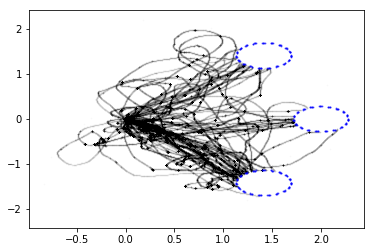

In [148]:

ANGLE = np.round(angle_used*180/math.pi).astype(int)
print('angle between posts:', str(ANGLE))

now= datetime.now()
act_date = now.strftime('%Y-%m-%d')

#trajectories
color = 'black'  # speeds #
#to plot with noise replace df6 by df3
plt.scatter(np.array(df6)[50:,9], np.array(df6)[50:,10],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'


if type(color) is np.ndarray:
    col_param = 'speed_col'    
else:
    col_param = 'black'
print(col_param)


#posts (approx size)
dot_x = math.cos(habp)*dist
dot_y = math.sin(habp)*dist
#plt.scatter(dot_x,dot_y, c='red', s=2900)
#plt.scatter(dot_x,-dot_y, c='blue', s=2900)

#limits of x and y axis
#plt.xlim(-0.6,2.3)
#plt.ylim(-2.3,2.3)
#appropriate size of posts in grey lines
plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.28+dot_x, np.array(ploY)[i]*0.28+dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.28+dot_x, np.array(ploY)[i]*0.28-dot_y, c='blue', s=1, alpha=0.5)
    plt.scatter((np.array(ploX)[i])*0.28+2, np.array(ploY)[i]*0.28, c='blue', s=1, alpha=0.5)
#act_date
filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_3post_nonoise_TEST'+ col_param +'_'+exper_date+'_'+'_all'+ '.png'
#filename = '/home/bianca/Documents/github/locustVR/plotting/'+str(ANGLE) + '_2post_'+ col_param +'_'+exper_date+'_'+tstart+ '.png'

#speeds[np.where(speeds>4)[0]] = 0
#fig.set_dpi(100)

plt.savefig(filename, dpi=(250))

In [ ]:


def forceAspect(ax,aspect=1):
    im = ax.get_images()
    extent =  im[0].get_extent()
    ax.set_aspect(abs((extent[5]-extent[1])/(extent[5]-extent[2]))/aspect)

#data = np.random.rand(0,2)

fig = plt.figure()
ax = fig.add_subplot(111)
ax.imshow(data)
ax.set_xlabel('xlabel')
ax.set_aspect(1)
plt.scatter(np.array(rot)[150:,0], np.array(rot)[150:,1],c=color ,s=0.5, alpha=0.02)# s=0.0005, alpha=0.5) #c=speeds   'black'


In [ ]:
speeds = np.array(d_v2)[:,0]

In [ ]:
#
speeds[np.where(speeds>4)[0]] = 0
speeds[np.where(speeds<0)[0]] = 0


In [ ]:
len(speeds)

In [ ]:
plt.hist(speeds)

In [ ]:
#dot plotting

plotting_angles = list(range(0,361,5))
ploX=[]
ploY=[]
plo=[np.linspace(0, 360, num=100)]
for i in range(0,100):
    ploX.extend([(math.cos(plo[0][i]))])
    ploY.extend([(math.sin(plo[0][i]))])
    plt.scatter((np.array(ploX)[i])*0.2+5, np.array(ploY)[i]*0.2+5, c='black', s=300, alpha=0.1)


In [ ]:

df = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0b4dc1ba-58fe-4452-9f75-630dd7cd07a8/results.csv')
df2 = pd.read_csv('/home/bianca/Documents/flyVR/vivek_data/new_experiments/0cac2ffa-751c-47e2-a60c-a4394f0c3694/results.csv')

df.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df2.columns = ['x', 'y', 'z', 'dir', 'cntr', 't', 'nStimuli']
df=df.append(df2)

#df, df2

In [ ]:
df4 = df[df['nStimuli'] == 4]
df4.head()

# plotting speed

In [ ]:
#taking unrotated x,y values from df3
#if df['nStimuli'][j]== stim:
#print(df3['y'][i])  
#i=10000 

#need of implementation speed in relation to post-distance or starting point distance. otherwise two different locusts 
#plotted on top of each other don't make sense. they need some synchronization which is post-distance?? 
#bifurcation point distance?
window = 50
d_v = []
for i in range(window,(len(df6))): #len(df3)
    d=((((df6['x'][i]-df6['x'][i-window])**2 + (df6['y'][i]-df3['y'][i-window])**2)**0.5)/(df6['t'][i]-df6['t'][i-window]))
    #if d != 0.0:
        #d_v=( )

#plt.scatter(np.array(rot)[:,0], np.array(rot)[:,1], c='black', s=1, alpha=0.01)
#plt.scatter(df4['x'], df4['y'], c='black', s=1, alpha=0.01)
    #speed relative to location on x
    d_v.extend([(d*100,df6['x'][i])]) # *100 to get cm/s
    #speed to time
    #d_v.extend([(d*100,df3['t'][i])]) # *100 to get cm/s


In [ ]:
#    rot.extend([(rotation(x,y,theta))])
d_v2 =[]
for i in range(window,(len(df6))): #len(df3)
    e=((((rot[i][0]-rot[i-window][0])**2 +       (rot[i][1]-rot[i-window][1]) **2)**0.5)/(df6['t'][i]-df6['t'][i-window]))
    #if d != 0.0:
        #d_v=( )
    d_v2.extend([(e*100,rot[i][0])])


In [ ]:
#color can get a list of colors to use for certain ID of the fly /locust

plt.scatter(np.array(d_v2)[50:8000,1], np.array(d_v2)[50:8000,0], c='black', s=0.1, alpha=1)
plt.ylim([0,4])

In [ ]:
plt.plot(df3['x'][:])
plt.plot(df3['y'][:])
# plt.xlim([8700,11200])

In [ ]:
xx = df3['x']
yy = df3['y']
distxxyy = np.sqrt(np.diff(xx)**2+np.diff(yy)**2)
speed = distxxyy/np.diff(tt)

In [ ]:
dt = 1/100.0
threshold = np.quantile(distxxyy,0.99)
plt.hist(distxxyy[distxxyy<threshold]/dt)

In [ ]:
np.quantile(distxxyy,[0.95,0.99,1])

In [ ]:
tt  = df3['t']
plt.hist(np.diff(tt))

In [ ]:
np.quantile(np.diff(tt),[0.95,0.99,1])

(array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

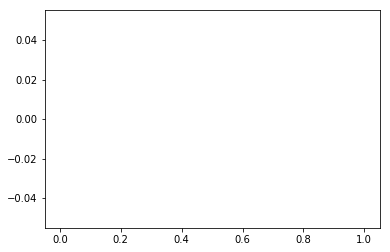

In [84]:
threshold = np.quantile(speed,0.99)
plt.hist(speed[speed<threshold])